In [14]:
import time
import os
import math
import cv2
import numpy as np
import pandas as pd
import pyautogui as pa
import shutil
import imageio
from PIL import Image, ImageDraw
import random
from scipy.stats import norm, kstest, sem, ttest_ind, linregress, ttest_ind_from_stats, ttest_1samp
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols
import statsmodels.api as sm

from lib.analysis.trace_metrics import TraceMetrics
from lib.analysis.false_discovery_control import false_discovery_control
from lib.auto_GUI.auto_PhotoZ import AutoPhotoZ
from lib.analysis.laminar_dist import *
from lib.file.TIF import *
from lib.analysis.align import ImageAlign
from lib.utilities import *
from lib.file.ROI_writer import ROIFileWriter
from lib.file.ROI_reader import ROIFileReader
from lib.analysis.barrel_roi import Barrel_ROI_Creator
from lib.analysis.cell_roi import RandomROISample, OverlapCounterROI

In [15]:
# load trace files from the following directory
data_dir = "C:/Users/jjudge3/Desktop/Data/mm_full_pipeline_targets/current_NBQX_theta/10-23-24/"
nbqx_export_summary = data_dir + "export_summary_backup.csv"

output_fig_dir = 'P:/John/crossing-paper/input/'
camera_program = 4
um_per_px = 6.0 #um

In [16]:
# load CSV of all L4 and L2/3 crossing with NBQX blockade (array only CSV)
crossing_data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
crossing_data = pd.read_csv(crossing_data_dir + 'export_summary_crossing_PPR_array_only.csv')

def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

def read_dat_trace_file(filename):
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=0)  # change me to traces?
    data_arr = data_arr.apply(pd.to_numeric, errors='coerce')
    return data_arr

crossing_data

,Layer,drug,Date,Slice,Location,Recording,amp_array,ROI file,snr_array
0,L4,ACSF,12/9/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
1,L4,NBQX,12/9/2024,2,3,3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
2,L4,ACSF,10/29/2024,1,1,3,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
3,L4,NBQX,10/29/2024,1,2,1,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
4,L2/3,ACSF,10/23/2024,1,2,3,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
5,L2/3,NBQX,10/23/2024,1,2,4,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
6,L2/3,ACSF,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
7,L2/3,NBQX,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
8,L2/3,ACSF,7/1/2024,3,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
9,L2/3,NBQX,7/1/2024,3,2,5,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...


In [17]:
# read in hw/lat/amp data
data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
hw_lat_data = data_dir + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6
hw_lat_df

nbqx_export_sagittal = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/sagittal_L4_NBQX/' + "export_summary_backup.csv"
hw_lat_sagittal_df = pd.read_csv(nbqx_export_sagittal)
hw_lat_sagittal_df

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,amp_array,snr_array,Rostral/Caudal,Layer,drug
0,1,2.101260,66.64650,51.0524,5.84029,63.780875,33.171206,27.688716,1_rois,1/15/2025,1,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
1,2,1.138650,30.75740,51.7941,8.86817,182.778555,57.975089,52.832740,1_rois,1/15/2025,1,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,ACSF
2,1,1.863310,47.13760,51.6354,7.20305,63.780875,33.171206,27.688716,1_rois,1/15/2025,1,4,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,NBQX
3,2,0.446560,9.51275,52.0617,18.19140,182.778555,57.975089,52.832740,1_rois,1/15/2025,1,4,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,NBQX
4,1,22.877600,55.88170,52.6757,12.79720,24.000000,60.593750,37.625000,2_rois,1/15/2025,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
5,2,4.549810,13.30700,54.6543,20.84750,115.256236,34.826211,47.700855,2_rois,1/15/2025,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral,L4,ACSF
6,1,17.931500,49.08750,52.5286,9.55607,24.000000,60.593750,37.625000,2_rois,1/15/2025,2,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,NBQX
7,2,1.360260,5.49498,54.6159,6.92785,115.256236,34.826211,47.700855,2_rois,1/15/2025,2,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral,L4,NBQX
8,1,48.319700,53.74320,49.8735,8.69107,43.266615,55.612069,49.232759,3_rois,1/15/2025,3,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
9,2,7.034680,37.30910,53.1874,21.11320,201.603571,36.433333,14.062963,3_rois,1/15/2025,3,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,ACSF


In [18]:

hw_lat_df['Section'] = 'Coronal'
hw_lat_sagittal_df['Section'] = 'Sagittal'

# merge the two hw_lat dataframes
hw_lat_df = pd.concat([hw_lat_df, hw_lat_sagittal_df], ignore_index=True)
hw_lat_df

,Layer,drug,ROI,amp,snr,latency,halfwidth,X_Center,Y_Center,ROI_Set,...,Slice,Location,Recording,Medial/Lateral,trace,Section,Stim_Distance,amp_array,snr_array,Rostral/Caudal
0,L4,ACSF,1,1.208980,44.28930,1.1323,8.08166,50.551020,51.918367,1_rois,...,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
1,L4,ACSF,2,0.330953,6.90515,3.4924,26.12920,66.867374,28.713528,1_rois,...,1,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
2,L4,NBQX,1,1.774300,75.77820,1.2188,4.78006,50.551020,51.918367,1_rois,...,1,1,2,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
3,L4,NBQX,2,0.325975,7.08423,2.3590,5.69864,66.867374,28.713528,1_rois,...,1,1,2,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
4,L4,ACSF,1,1.488840,68.13480,1.6920,6.25805,55.466877,41.141956,1_rois,...,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,L4,NBQX,2,1.760250,8.24925,52.0891,8.36272,54.714286,45.108466,1_rois,...,1,4,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,180.000000,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal
100,L4,ACSF,1,23.183700,82.01480,52.2659,21.09000,58.769737,10.532895,2_rois,...,2,2,12,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,42.426407,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home
101,L4,ACSF,2,7.614200,15.49940,52.6995,NaN,46.979900,37.638191,2_rois,...,2,2,12,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,113.841996,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral
102,L4,NBQX,1,11.954700,22.43890,51.6497,15.57760,58.769737,10.532895,2_rois,...,2,3,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,42.426407,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home


In [19]:
# read in hw/lat/amp data
data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
hw_lat_data = data_dir + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6
hw_lat_df


,Layer,drug,ROI,amp,snr,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,Medial/Lateral,trace
0,L4,ACSF,1,1.208980,44.28930,1.1323,8.08166,50.551020,51.918367,1_rois,11/6/2024,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
1,L4,ACSF,2,0.330953,6.90515,3.4924,26.12920,66.867374,28.713528,1_rois,11/6/2024,1,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
2,L4,NBQX,1,1.774300,75.77820,1.2188,4.78006,50.551020,51.918367,1_rois,11/6/2024,1,1,2,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
3,L4,NBQX,2,0.325975,7.08423,2.3590,5.69864,66.867374,28.713528,1_rois,11/6/2024,1,1,2,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
4,L4,ACSF,1,1.488840,68.13480,1.6920,6.25805,55.466877,41.141956,1_rois,12/9/2024,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
5,L4,ACSF,2,0.983708,39.26490,4.9494,12.78330,29.060606,33.034091,1_rois,12/9/2024,1,1,1,Medial,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
6,L4,NBQX,1,0.000000,0.00000,NaN,6.25805,55.466877,41.141956,1_rois,12/9/2024,1,3,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
7,L4,NBQX,2,0.053680,1.00786,5.2739,2.54030,29.060606,33.034091,1_rois,12/9/2024,1,3,1,Medial,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
8,L4,ACSF,1,14.255900,56.77760,1.5938,8.15259,40.464912,49.561404,2_rois,12/9/2024,2,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
9,L4,ACSF,2,3.041910,23.21550,2.3892,15.21730,51.851974,29.101974,2_rois,12/9/2024,2,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...


c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


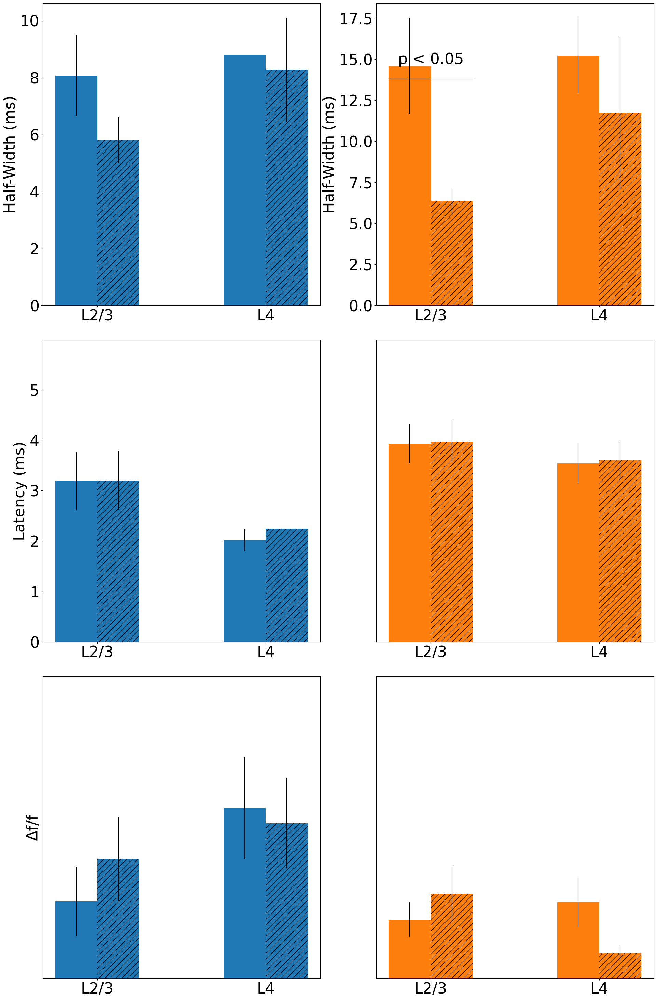

In [20]:
# plot the data, comparing L2/3 to L4 and ACSF to NBQX and home (ROI == 1) to neighbor (ROI > 1)

# font size
plt.rcParams.update({'font.size': 32})

fig, ax = plt.subplots(3, 2, figsize=(20, 30))
layers = ['L2/3', 'L4']
drug = ['ACSF', 'NBQX']

handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        
        hatch = '//' if d == 'NBQX' else None
        for roi in [1, 2]:
            col = 'tab:blue' if roi == 1 else 'tab:orange'
            roi_df = hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == d) & (hw_lat_df['ROI'] == roi)]
            l = ax[0][roi-1].bar([i + j/4-.125], np.mean(roi_df['halfwidth']), yerr=sem(roi_df['halfwidth']), label=drug, width=.25, color=col, hatch=hatch)
            ax[1][roi-1].bar([i + j/4-.125], np.mean(roi_df['latency']), yerr=sem(roi_df['latency']), label=drug, width=.25, color=col, hatch=hatch)
            ax[2][roi-1].bar([i + j/4-.125], np.mean(roi_df['amp']), yerr=sem(roi_df['amp']), label=drug, width=.25, color=col, hatch=hatch)
            handles.append(l)
        
ax[0][0].set_ylabel('Half-Width (ms)')
ax[1][0].set_ylabel('Latency (ms)')
ax[2][0].set_ylabel('Δf/f')

for i in range(2):
    for j in range(3):
        ax[j][i].set_xticks([0, 1])
        ax[j][i].set_xticklabels(layers)

# autoscale y-axis for each pair of subplots togethere
for i in range(1,3):
    y_max = max(ax[i][0].get_ylim()[1], ax[i][1].get_ylim()[1]) * 1.3
    ax[i][0].set_ylim(0, y_max)
    ax[i][1].set_ylim(0, y_max)
    ax[i][1].set_yticks([])
ax[2][0].set_yticks([])

# significance testing
for i, layer in enumerate(layers):
    for roi in [1, 2]:
        for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
            t_stat, p_val = ttest_ind(hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == 'ACSF') & (hw_lat_df['ROI'] == roi)][metric],
                                      hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == 'NBQX') & (hw_lat_df['ROI'] == roi)][metric])
            if p_val < 0.05:
                ax[j][roi-1].text((i), ax[j][roi-1].get_ylim()[1] * 0.8, 'p < 0.05', ha='center')

                # draw bar between ACSF and NBQX
                ax[j][roi-1].plot([i -.25, i + .25], [ax[j][roi-1].get_ylim()[1] * 0.75, ax[j][roi-1].get_ylim()[1] * 0.75], color='black')
            #else:
            #    ax[j][roi-1].text((i + .125), ax[j][roi-1].get_ylim()[1] * 0.8, str(p_val)[:5], ha='center')

handles = [handles[1], handles[3]]
#ax[0][1].legend(handles=handles, labels=['ACSF', '+NBQX'], loc='upper left')
ax[0][1].set_ylabel('Half-Width (ms)')
#ax[0][0].set_title('Home Barrel')
#ax[0][1].set_title('Neighbor Barrel')
plt.tight_layout()
plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp.png')
plt.show()


In [21]:
# load pulse 2 ladder data

# load C:\Users\jjudge3\Desktop\Data\crossing_PPR\PPR_ladder_pulse_2\export_summary_pulse_2.csv
ppr_ladder_pulse_2_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder_pulse_2/export_summary_pulse_2.csv'
ppr_ladder_pulse_2_df = pd.read_csv(ppr_ladder_pulse_2_csv)
# add Drug and Layer columns to the dataframe
ppr_ladder_pulse_2_df['drug'] = 'ACSF'
ppr_ladder_pulse_2_df['Layer'] = 'L4'

# format date to m/d/yyyy in ppr_ladder_pulse_2_df
try:
    ppr_ladder_pulse_2_df['Date'] = pd.to_datetime(ppr_ladder_pulse_2_df['Date'], format='%m-%d-%Y').dt.strftime('%#m/%#d/%Y')
except ValueError:  # formatted already
    pass

# add new columns Coronal/Sagittal and IPI to the dataframe
ppr_ladder_pulse_2_df['Coronal/Sagittal'] = np.nan
ppr_ladder_pulse_2_df['IPI'] = np.nan
ppr_ladder_pulse_2_df['Is_Pulse_2'] = True

# load C:\Users\jjudge3\Desktop\Data\crossing_PPR\PPR_ladder_pulse_2\ppr_catalog_backup.csv
ppr_ladder_pulse_2_catalog_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder_pulse_2/ppr_catalog_backup.csv'
ppr_ladder_pulse_2_catalog_df = pd.read_csv(ppr_ladder_pulse_2_catalog_csv)

# use catalog to fill Coronal/Sagittal and IPI columns in ppr_ladder_pulse_2_df
for row in ppr_ladder_pulse_2_catalog_df.iterrows():
    zda_file = row[1]['zda_file'] # format is C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder_pulse_2/PPR_coronal_annotated\01-02-25\converted_zda/01_03_01.zda
    # get the date from the file name
    date = os.path.basename(os.path.dirname(os.path.dirname(zda_file))) # format is 01-02-25
    # format the date to m/d/yyyy
    date = pd.to_datetime(date, format='%m-%d-%y').strftime('%#m/%#d/%Y')
    # get the slice from the file name
    slic_loc_rec = zda_file.split("/")[-1].replace(".zda", "") 
    slic = int(slic_loc_rec.split("_")[0]) 
    loc = int(slic_loc_rec.split("_")[1])
    rec = int(slic_loc_rec.split("_")[2])

    #print(f"Checking {date} {slic} {loc} {rec} in ppr_ladder_pulse_2_df")
    #print(row[1]['Coronal/Sagittal'], row[1]['IPI'])
    #print(ppr_ladder_pulse_2_df['Date'].unique())

    # store Coronal/Sagittal
    ppr_ladder_pulse_2_df.loc[(ppr_ladder_pulse_2_df['Date'] == date) & (ppr_ladder_pulse_2_df['Slice'] == slic) &
                                        (ppr_ladder_pulse_2_df['Location'] == loc) & (ppr_ladder_pulse_2_df['Recording'] == rec), 'Coronal/Sagittal'] = row[1]['Coronal/Sagittal']

    # store IPI
    ppr_ladder_pulse_2_df.loc[(ppr_ladder_pulse_2_df['Date'] == date) & (ppr_ladder_pulse_2_df['Slice'] == slic) &
                                        (ppr_ladder_pulse_2_df['Location'] == loc) & (ppr_ladder_pulse_2_df['Recording'] == rec), 'IPI'] = row[1]['IPI']
              
ppr_ladder_pulse_2_df

,ROI,amp,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,drug,Layer,Coronal/Sagittal,IPI,Is_Pulse_2
0,1,0.447418,184.746,6.98220,284.541737,63.000000,54.790698,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
1,2,0.413064,184.684,9.99002,268.663358,60.743902,52.841463,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
2,3,0.393519,184.871,10.25910,266.308092,58.702381,50.702381,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
3,4,0.424824,184.181,17.29830,250.710989,56.588235,48.600000,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
4,5,0.511221,183.866,7.74091,235.304059,54.157303,46.741573,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,21,0.392233,178.747,5.93887,309.974193,35.278481,8.721519,3_rois_output__ladder_ pulse1,1/15/2025,3,2,25,ACSF,L4,Sagittal,120.0,True
7740,22,0.710792,177.487,3.35339,339.835254,33.571429,6.311688,3_rois_output__ladder_ pulse1,1/15/2025,3,2,25,ACSF,L4,Sagittal,120.0,True
7741,23,1.011800,178.461,28.19760,344.308002,29.714286,5.190476,3_rois_output__ladder_ pulse1,1/15/2025,3,2,25,ACSF,L4,Sagittal,120.0,True
7742,24,1.046040,178.175,2.39320,365.754016,26.437500,3.708333,3_rois_output__ladder_ pulse1,1/15/2025,3,2,25,ACSF,L4,Sagittal,120.0,True


In [22]:
# velocity analysis 
# read in velocity ladders
ladder_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/export_summary_ladders.csv'
ladder_df = pd.read_csv(ladder_csv)
ladder_df['latency'] -= 48.6

# fold in some more ladder data from PPR_ladder directory 
ladder_csv_2 = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder/export_summary_ladder_backup.csv'
ladder_df_2 = pd.read_csv(ladder_csv_2)
ladder_df_2['latency'] -= 48.6  # some of the data is stimulated at a different time point, but deltas are the same

# format m-d-yy to m/d/yyyy in ladder_df_2
#ladder_df_2['Date'] = pd.to_datetime(ladder_df_2['Date'], format='%m-%d-%Y').dt.strftime('%#m/%#d/%Y')

# before merging, remove any rows that are in both dataframes from the second dataframe (match on date/slice alone)
for row in ladder_df_2.iterrows():
    date = row[1]['Date']
    slic = row[1]['Slice']
    #print(f"Checking {date} {slic} in ladder_df_2")
    if len(ladder_df[(ladder_df['Date'] == date) & (ladder_df['Slice'] == slic)]) > 0:
        ladder_df_2.drop(row[0], inplace=True)
        print(f"Removing {date} {slic} from ladder_df_2")

# merge the dataframes
ladder_df = pd.concat([ladder_df, ladder_df_2, ppr_ladder_pulse_2_df], ignore_index=True) # , 

# add a new column Dist_from_home_barrel
ladder_df['Dist_from_home_barrel'] = np.nan

# add a new column resides_in_barrel
ladder_df['resides_in_barrel'] = np.nan

# and for velocity
ladder_df['instantaneous_velocity'] = np.nan

ladder_df

Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 3 from ladder_df_2
Removing 12/11/2024 3 fro

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,Recording,trace,drug,Layer,Coronal/Sagittal,IPI,Is_Pulse_2,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity
0,1,0.408552,19.7128,3.9030,16.65070,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,0.462050,27.5393,3.9159,14.44350,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,0.441868,28.2700,3.8743,13.63680,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,0.466602,22.1134,3.8636,13.22210,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,0.526346,26.8669,3.7651,10.10290,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9168,21,0.392233,NaN,178.7470,5.93887,309.974193,35.278481,8.721519,3_rois_output__ladder_ pulse1,1/15/2025,...,25,NaN,ACSF,L4,Sagittal,120.0,True,NaN,NaN,NaN
9169,22,0.710792,NaN,177.4870,3.35339,339.835254,33.571429,6.311688,3_rois_output__ladder_ pulse1,1/15/2025,...,25,NaN,ACSF,L4,Sagittal,120.0,True,NaN,NaN,NaN
9170,23,1.011800,NaN,178.4610,28.19760,344.308002,29.714286,5.190476,3_rois_output__ladder_ pulse1,1/15/2025,...,25,NaN,ACSF,L4,Sagittal,120.0,True,NaN,NaN,NaN
9171,24,1.046040,NaN,178.1750,2.39320,365.754016,26.437500,3.708333,3_rois_output__ladder_ pulse1,1/15/2025,...,25,NaN,ACSF,L4,Sagittal,120.0,True,NaN,NaN,NaN


In [23]:
# also load export_summary_backup_coronal.csv and export_summary_backup_sagittal.csv from C:\Users\jjudge3\Desktop\Data\crossing_PPR\PPR\
coronal_ppr_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_coronal.csv'
coronal_ppr_df_ = pd.read_csv(coronal_ppr_csv)

sagittal_ppr_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_sagittal.csv'
sagittal_ppr_df_ = pd.read_csv(sagittal_ppr_csv)

# merge the two dataframes
ppr_df_for_roi_lookup = pd.concat([coronal_ppr_df_, sagittal_ppr_df_], ignore_index=True)
# split column 'ROI_Set'
ppr_df_for_roi_lookup['ROI file'] =  ppr_df_for_roi_lookup['ROI_Set'].str.split(' ', expand=True)[0]

# file ROI_File should be located in the same directory as the file named in 'trace'
for row in ppr_df_for_roi_lookup.iterrows():
    # get the trace file name
    trace_file = row[1]['trace']
    # get the directory of the trace file
    trace_dir = os.path.dirname(trace_file)
    # get the ROI file name
    roi_file = row[1]['ROI file'] + '.dat'
    # set the ROI file to be in the same directory as the trace file
    ppr_df_for_roi_lookup.at[row[0], 'ROI file'] = os.path.join(trace_dir, roi_file)

# add Drug and Layer columns to the dataframe
ppr_df_for_roi_lookup['drug'] = 'ACSF'
ppr_df_for_roi_lookup['Layer'] = 'L4'

In [24]:
# re-run from here down to fill in the missing velocity data

    drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
0   ACSF             368.804275          Neighbor                     NaN
1   ACSF             350.406813          Neighbor              422.912185
2   ACSF             332.813666              None             1626.003658
3   ACSF             315.415427          Neighbor              183.157884
4   ACSF             297.374375          Neighbor              139.073187
5   ACSF             279.851153          Neighbor              117.169503
6   ACSF             262.228860              None              102.428724
7   ACSF             244.477962              None              184.949586
8   ACSF             227.111196              Home              363.951400
9   ACSF             209.423158              Home              128.503918
10  ACSF             191.869523              Home              880.865557
11  ACSF             174.604558              None               90.659734
12  ACSF             157.098163       

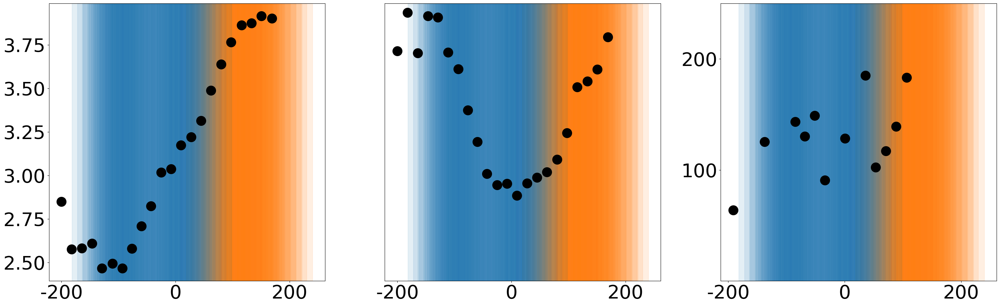

    drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
44  ACSF             432.360313              None              211.638397
45  ACSF             413.968936          Neighbor              101.327378
46  ACSF             396.094787          Neighbor               80.874932
47  ACSF             377.720002          Neighbor               95.330108
48  ACSF             359.836074          Neighbor              158.675077
49  ACSF             342.048598          Neighbor              123.367766
50  ACSF             323.703811          Neighbor              103.289735
51  ACSF             305.783042              None               96.675226
52  ACSF             288.033470          Neighbor              119.284679
53  ACSF             269.651701          Neighbor               82.064643
54  ACSF             251.769816              None               85.696913
55  ACSF             233.970567              None              442.499527
56  ACSF             215.651086       

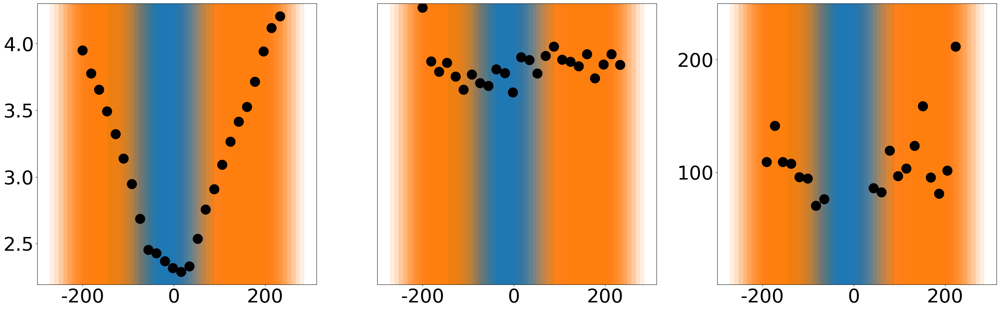

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
94   ACSF             430.110289              Home              486.288839
95   ACSF             412.117602              Home              203.680662
96   ACSF             394.132599              Home              -70.725751
97   ACSF             376.118750              Home              -66.798357
98   ACSF             358.136633              Home             -156.878942
99   ACSF             340.142618              None             -219.163775
100  ACSF             322.149272              None             -144.925003
101  ACSF             304.164079              None             -166.683086
102  ACSF             286.178974          Neighbor             -115.801918
103  ACSF             268.287578          Neighbor             -141.540966
104  ACSF             250.396800          Neighbor             -142.454175
105  ACSF             232.419083          Neighbor             -122.791931
106  ACSF             214

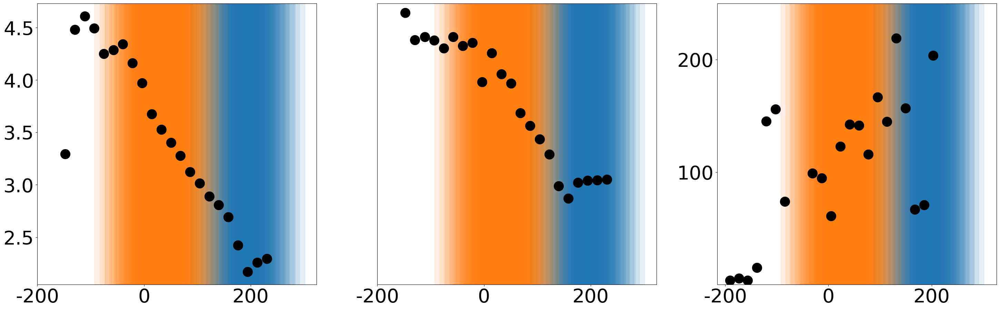

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
144  ACSF             495.611372              None               46.447408
145  ACSF             477.348251              None              128.819407
146  ACSF             459.094541              None              190.126553
147  ACSF             442.211303              None              150.041743
148  ACSF             423.996236              None              250.102233
149  ACSF             405.913844              None               97.035441
150  ACSF             387.603256              None               63.881818
151  ACSF             369.416103              None               50.651101
152  ACSF             352.539156              Home               65.169195
153  ACSF             334.383018              Home              171.558757
154  ACSF             316.369349              Home              109.711715
155  ACSF             299.199465              Home               94.109777
156  ACSF             280

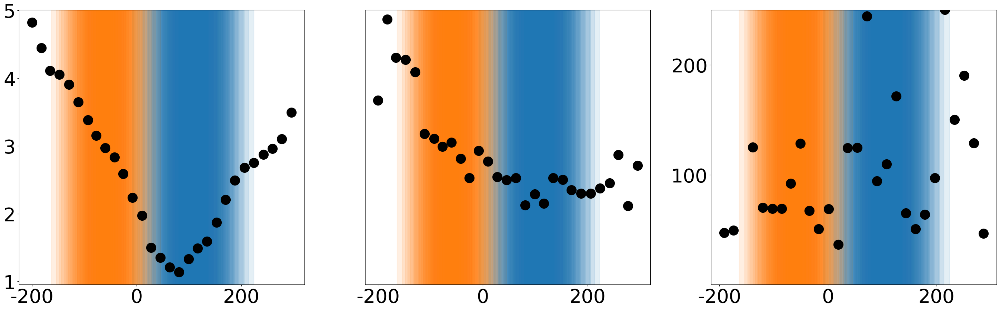

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
202  ACSF             388.536514              None               65.104863
203  ACSF             370.925649              None               44.614970
204  ACSF             352.896740              None              -80.408649
205  ACSF             335.150551              None             -232.437797
206  ACSF             317.043647              None              104.480100
207  ACSF             299.208894              None               90.230783
208  ACSF             281.280037              None              174.489961
209  ACSF             263.708898              None              122.778613
210  ACSF             245.427163          Neighbor              323.697402
211  ACSF             227.979873              None              115.461868
212  ACSF             209.933183          Neighbor               55.630221
213  ACSF             192.226083          Neighbor               58.920040
214  ACSF             174

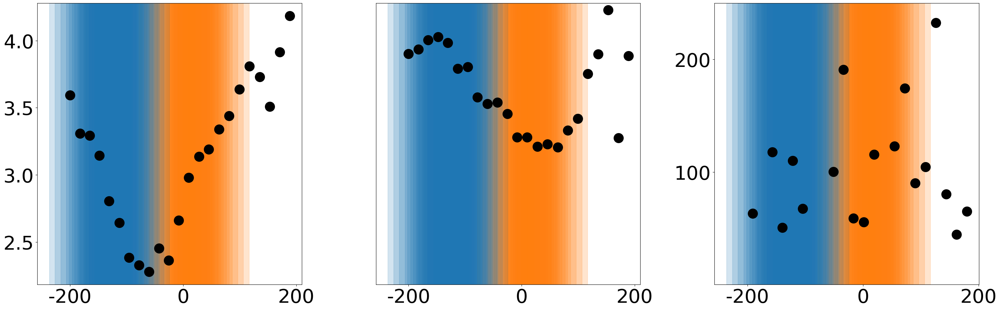

No ROI file found for  11/6/2024 1 1


C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
969   ACSF             435.419753          Neighbor               77.425867
970   ACSF             416.837545              None               48.083568
971   ACSF             399.671712          Neighbor               81.949311
972   ACSF             381.233117          Neighbor               95.940486
973   ACSF             363.771948              None               80.444721
974   ACSF             345.832775              None               67.304323
975   ACSF             328.064434              Home               53.080036
976   ACSF             309.857982              Home              139.733614
977   ACSF             292.531014              Home             -138.592488
978   ACSF             274.513990              Home             -135.683544
979   ACSF             256.875130              Home             -128.740451
980   ACSF             238.851466              Home             -111.702475
981   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6204  ACSF             435.419753          Neighbor               92.448796
6205  ACSF             416.837545              None               46.519875
6206  ACSF             399.671712          Neighbor               78.129640
6207  ACSF             381.233117          Neighbor              127.453784
6208  ACSF             363.771948              None              186.866383
6209  ACSF             345.832775              None               96.567072
6210  ACSF             328.064434              Home              131.930813
6211  ACSF             309.857982              Home             1732.696817
6212  ACSF             292.531014              Home             -545.970408
6213  ACSF             274.513990              Home             -132.623013
6214  ACSF             256.875130              Home             -120.157754
6215  ACSF             238.851466              Home             -163.025234
6216  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6229  ACSF             435.419753          Neighbor               54.976947
6230  ACSF             416.837545              None               66.022438
6231  ACSF             399.671712          Neighbor               70.108727
6232  ACSF             381.233117          Neighbor               94.897655
6233  ACSF             363.771948              None              129.058797
6234  ACSF             345.832775              None              224.915712
6235  ACSF             328.064434              Home              227.580653
6236  ACSF             309.857982              Home              481.304671
6237  ACSF             292.531014              Home             -217.072572
6238  ACSF             274.513990              Home             -149.481870
6239  ACSF             256.875130              Home             -176.702580
6240  ACSF             238.851466              Home             -130.185618
6241  ACSF  

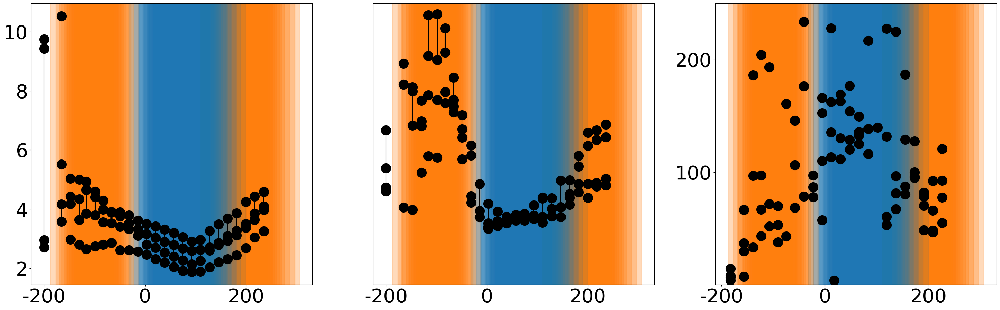

No ROI file found for  12/9/2024 1 1


C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
344  ACSF             507.399931              None               34.576583
345  ACSF             490.066690              None               94.065929
346  ACSF             472.504581          Neighbor                     NaN
347  ACSF             454.125955              None             -237.197565
348  ACSF             436.810533          Neighbor             -782.988696
349  ACSF             418.723494          Neighbor               64.788278
350  ACSF             400.958548          Neighbor               83.585081
351  ACSF             383.330454              None               49.404910
352  ACSF             365.317424              None               72.662501
353  ACSF             347.631371              Home               83.774637
354  ACSF             329.846016              Home               92.051369
355  ACSF             313.479282              Home             -333.565307
356  ACSF             294

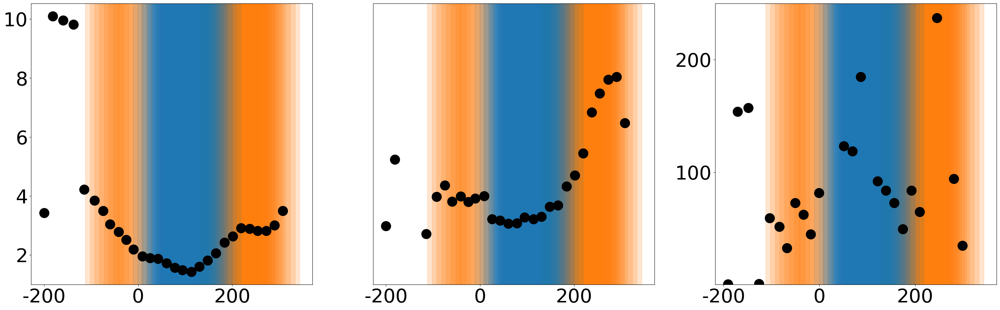

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
402  ACSF             414.010869              None              108.692669
403  ACSF             396.011363              None              101.634438
404  ACSF             378.011905              None              132.836936
405  ACSF             360.012500              None              369.108602
406  ACSF             342.000000              None              218.181818
407  ACSF             324.000000              Home              402.684564
408  ACSF             306.000000              Home                     NaN
409  ACSF             288.000000              None             -248.962656
410  ACSF             270.000000              Home             -117.340287
411  ACSF             252.000000              None              -87.167070
412  ACSF             234.000000              None              -98.306936
413  ACSF             216.000000              None             -137.231099
414  ACSF             198

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6359  ACSF             413.270890              None               75.049957
6360  ACSF             395.183851              None              110.329431
6361  ACSF             377.200154              None              112.292593
6362  ACSF             359.233339              None              296.629325
6363  ACSF             341.138950              None              220.171535
6364  ACSF             323.305056              Home              691.650339
6365  ACSF             305.322147              Home             1120.892332
6366  ACSF             287.387869              Home             -353.619692
6367  ACSF             269.353265              Home             -132.964502
6368  ACSF             251.403057              Home              -91.078885
6369  ACSF             233.460517              None              -90.926597
6370  ACSF             215.366124              None             -136.123454
6371  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6383  ACSF             413.270890              None               92.280815
6384  ACSF             395.183851              None              125.760120
6385  ACSF             377.200154              None              111.595123
6386  ACSF             359.233339              None              861.637564
6387  ACSF             341.138950              None              292.358923
6388  ACSF             323.305056              Home              178.048602
6389  ACSF             305.322147              Home                     NaN
6390  ACSF             287.387869              Home             -375.720923
6391  ACSF             269.353265              Home              -98.088567
6392  ACSF             251.403057              Home              -72.348953
6393  ACSF             233.460517              None             -160.127370
6394  ACSF             215.366124              None             -161.646602
6395  ACSF  

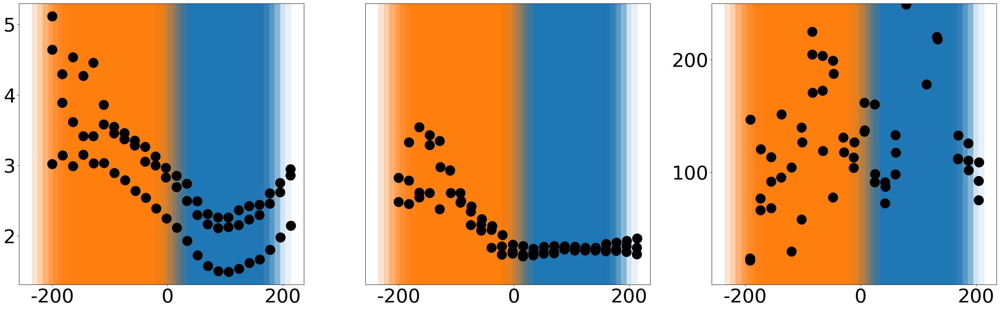

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
450   ACSF             464.397477          Neighbor               25.426190
451   ACSF             446.643604          Neighbor               56.234046
452   ACSF             429.054365          Neighbor               54.053728
453   ACSF             411.484587              None               44.529600
454   ACSF             393.605015              None               71.118079
455   ACSF             375.058123          Neighbor               49.240555
456   ACSF             357.284571              None               93.043089
457   ACSF             339.676268              None              168.765201
458   ACSF             321.851234              None              214.641008
459   ACSF             303.764707              None              280.418208
460   ACSF             286.170017              None              200.052798
461   ACSF             269.017454              Home              779.532496
462   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6432  ACSF             433.822666          Neighbor               96.527864
6433  ACSF             415.771955          Neighbor             -595.653617
6434  ACSF             397.306693          Neighbor             -648.236374
6435  ACSF             379.156075          Neighbor               67.293520
6436  ACSF             361.996227          Neighbor               65.018603
6437  ACSF             343.921055          Neighbor               64.524374
6438  ACSF             325.660658              None              104.983242
6439  ACSF             307.078624              None             1077.787507
6440  ACSF             289.834024              None             -908.716687
6441  ACSF             271.659690              None              276.756870
6442  ACSF             253.947250              None              112.194124
6443  ACSF             235.435220              Home              948.555419
6444  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6457  ACSF             433.822666          Neighbor               44.241938
6458  ACSF             415.771955          Neighbor               37.684208
6459  ACSF             397.306693          Neighbor               65.525698
6460  ACSF             379.156075          Neighbor               77.999308
6461  ACSF             361.996227          Neighbor               60.050404
6462  ACSF             343.921055          Neighbor               55.502729
6463  ACSF             325.660658              None               73.157614
6464  ACSF             307.078624              None              130.640910
6465  ACSF             289.834024              None              534.539227
6466  ACSF             271.659690              None              272.499072
6467  ACSF             253.947250              None              117.911022
6468  ACSF             235.435220              Home             2134.249692
6469  ACSF  

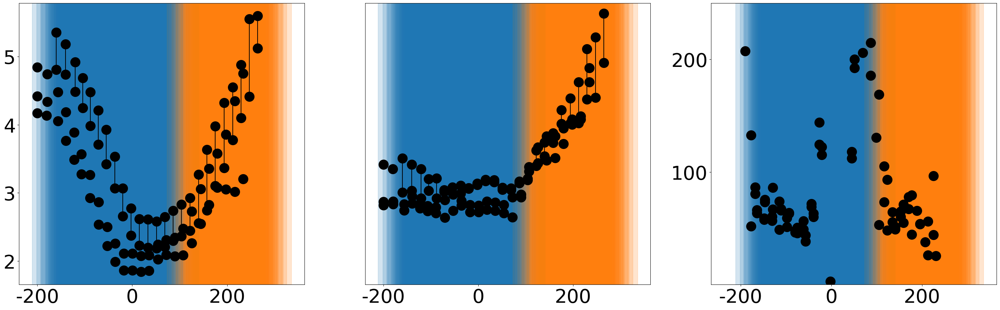

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
994   ACSF             466.927868              Home               83.113945
995   ACSF             448.809027              Home               93.163266
996   ACSF             430.642191              Home              135.695005
997   ACSF             412.866145              Home              156.230331
998   ACSF             394.743427              None              107.540422
999   ACSF             376.569095              Home              718.347763
1000  ACSF             358.610401              Home             -107.120275
1001  ACSF             340.828436              Home             -210.199866
1002  ACSF             322.751247              Home              -57.169302
1003  ACSF             304.971594              None              -99.843001
1004  ACSF             287.099697              None              -49.501729
1005  ACSF             268.932562              None              -77.395089
1006  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6281  ACSF             466.927868              Home               88.817844
6282  ACSF             448.809027              Home               71.805679
6283  ACSF             430.642191              Home               85.461758
6284  ACSF             412.866145              Home              -97.433970
6285  ACSF             394.743427              None               61.817453
6286  ACSF             376.569095              Home             -189.038885
6287  ACSF             358.610401              Home             -117.761362
6288  ACSF             340.828436              Home              420.399733
6289  ACSF             322.751247              Home              -77.640406
6290  ACSF             304.971594              None             -132.384423
6291  ACSF             287.099697              None             -195.345531
6292  ACSF             268.932562              None             -128.442914
6293  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6308  ACSF             466.927868              Home              157.555131
6309  ACSF             448.809027              Home               77.305689
6310  ACSF             430.642191              Home              130.706218
6311  ACSF             412.866145              Home              152.291752
6312  ACSF             394.743427              None              133.634789
6313  ACSF             376.569095              Home                     NaN
6314  ACSF             358.610401              Home             -145.753817
6315  ACSF             340.828436              Home             -186.362768
6316  ACSF             322.751247              Home              -77.980934
6317  ACSF             304.971594              None              -53.032336
6318  ACSF             287.099697              None             -235.936811
6319  ACSF             268.932562              None             -117.600330
6320  ACSF  

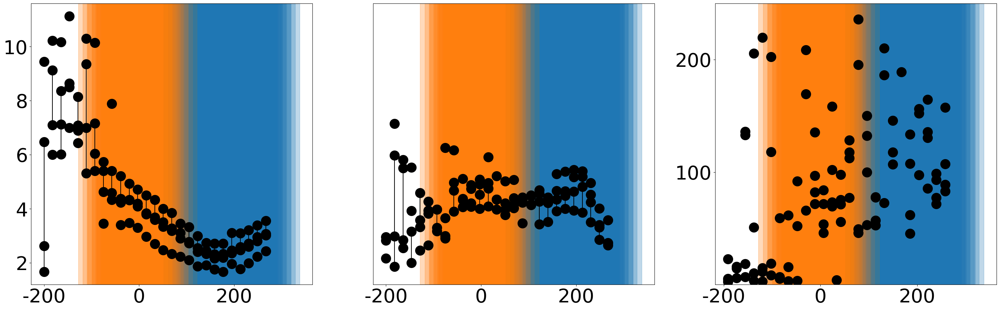

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
504  ACSF             499.134323              None              355.536009
505  ACSF             482.317469              None              290.417201
506  ACSF             463.208018          Neighbor              185.452227
507  ACSF             445.590056          Neighbor              329.282647
508  ACSF             427.249013          Neighbor               86.877526
509  ACSF             410.499026          Neighbor              128.890678
510  ACSF             390.984977          Neighbor              153.372688
511  ACSF             374.543425          Neighbor              934.362409
512  ACSF             355.015250              None               88.240638
513  ACSF             338.973102              None             -153.999343
514  ACSF             320.754980              None              659.720447
515  ACSF             303.404332              Home                     NaN
516  ACSF             286

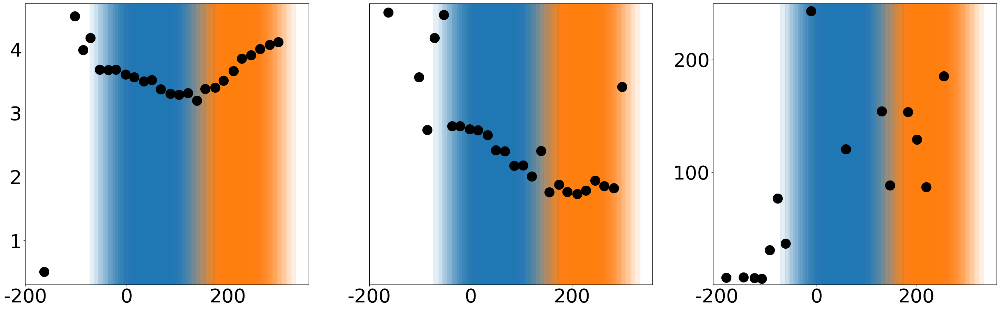

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
560  ACSF             411.098528              None              877.828703
561  ACSF             393.103040              None               88.733015
562  ACSF             375.107984              None               42.697923
563  ACSF             357.012605              None               95.682001
564  ACSF             339.053093              None               88.524463
565  ACSF             321.056070              None               28.006022
566  ACSF             303.059400              None             -214.496415
567  ACSF             285.063151              Home             -512.699250
568  ACSF             267.067407              None              275.576241
569  ACSF             249.072279              None              129.642433
570  ACSF             231.077909              None              123.651908
571  ACSF             213.000000              Home               90.200323
572  ACSF             195

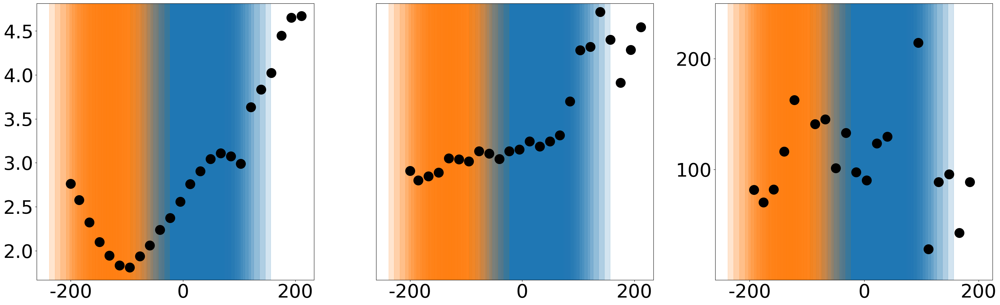

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
608  ACSF             413.649162              None               73.242832
609  ACSF             395.931721              Home               84.992276
610  ACSF             377.947355              Home               81.566168
611  ACSF             360.157774              Home               63.281643
612  ACSF             342.046567              Home               51.040057
613  ACSF             324.284628              Home               57.171078
614  ACSF             306.281455              Home             -604.204352
615  ACSF             288.880370              Home             1394.047472
616  ACSF             270.897158              None             -496.764938
617  ACSF             253.013620              None              -83.465698
618  ACSF             235.243773              None              -70.674240
619  ACSF             217.582280          Neighbor              -75.465092
620  ACSF             199

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6857  ACSF             413.828676              None             -131.454361
6858  ACSF             395.819429              None             -570.427697
6859  ACSF             378.136170              None              633.454809
6860  ACSF             361.032890              Home               52.829949
6861  ACSF             342.806558              Home              133.219787
6862  ACSF             324.955106              Home               78.089056
6863  ACSF             306.760356              Home              246.134190
6864  ACSF             288.792560              Home              420.316489
6865  ACSF             271.559584              None                     NaN
6866  ACSF             253.806325              None              -61.315800
6867  ACSF             236.576586              None             -157.165549
6868  ACSF             218.345382              None              424.382647
6869  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6881  ACSF             413.828676              None              111.168195
6882  ACSF             395.819429              None              122.800407
6883  ACSF             378.136170              None              164.454614
6884  ACSF             361.032890              Home               91.131663
6885  ACSF             342.806558              Home               54.759054
6886  ACSF             324.955106              Home               57.578323
6887  ACSF             306.760356              Home                     NaN
6888  ACSF             288.792560              Home              215.412201
6889  ACSF             271.559584              None             -385.940413
6890  ACSF             253.806325              None              -62.201226
6891  ACSF             236.576586              None              -98.547047
6892  ACSF             218.345382              None              -51.478368
6893  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6905  ACSF             413.828676              None              166.752292
6906  ACSF             395.819429              None              198.688299
6907  ACSF             378.136170              None               93.974065
6908  ACSF             361.032890              Home               76.904357
6909  ACSF             342.806558              Home               54.259731
6910  ACSF             324.955106              Home               56.156636
6911  ACSF             306.760356              Home              299.463265
6912  ACSF             288.792560              Home              307.731715
6913  ACSF             271.559584              None             -181.155704
6914  ACSF             253.806325              None              -58.012592
6915  ACSF             236.576586              None              -76.281187
6916  ACSF             218.345382              None              -94.052370
6917  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6929  ACSF             413.828676              None              -18.508990
6930  ACSF             395.819429              None                5.166012
6931  ACSF             378.136170              None               11.013059
6932  ACSF             361.032890              Home              102.395127
6933  ACSF             342.806558              Home               33.429684
6934  ACSF             324.955106              Home              -51.689631
6935  ACSF             306.760356              Home              164.842164
6936  ACSF             288.792560              Home             -220.935591
6937  ACSF             271.559584              None               29.103703
6938  ACSF             253.806325              None              -69.756031
6939  ACSF             236.576586              None               54.913264
6940  ACSF             218.345382              None              -62.364475
6941  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6953  ACSF             413.828676              None              104.099697
6954  ACSF             395.819429              None              210.514983
6955  ACSF             378.136170              None               96.628700
6956  ACSF             361.032890              Home               52.829949
6957  ACSF             342.806558              Home               68.396366
6958  ACSF             324.955106              Home               50.681755
6959  ACSF             306.760356              Home              408.358997
6960  ACSF             288.792560              Home              478.693780
6961  ACSF             271.559584              None             -233.595513
6962  ACSF             253.806325              None              -61.315800
6963  ACSF             236.576586              None              -81.389302
6964  ACSF             218.345382              None             -125.177615
6965  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6977  ACSF             413.828676              None              113.982579
6978  ACSF             395.819429              None              101.047192
6979  ACSF             378.136170              None              114.787113
6980  ACSF             361.032890              Home               52.677262
6981  ACSF             342.806558              Home               57.585327
6982  ACSF             324.955106              Home               47.755250
6983  ACSF             306.760356              Home              224.597448
6984  ACSF             288.792560              Home              861.648803
6985  ACSF             271.559584              None             -130.538669
6986  ACSF             253.806325              None              -62.426593
6987  ACSF             236.576586              None              -78.245509
6988  ACSF             218.345382              None              -55.413021
6989  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7001  ACSF             413.828676              None               87.849988
7002  ACSF             395.819429              None              130.987101
7003  ACSF             378.136170              None              133.619374
7004  ACSF             361.032890              Home               64.177227
7005  ACSF             342.806558              Home               44.965873
7006  ACSF             324.955106              Home               46.893686
7007  ACSF             306.760356              Home             1796.779587
7008  ACSF             288.792560              Home              246.185372
7009  ACSF             271.559584              None             -522.154677
7010  ACSF             253.806325              None              -49.653429
7011  ACSF             236.576586              None              -68.538360
7012  ACSF             218.345382              None              -74.676775
7013  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7025  ACSF             413.828676              None              141.805099
7026  ACSF             395.819429              None              142.606924
7027  ACSF             378.136170              None               90.974893
7028  ACSF             361.032890              Home               58.605571
7029  ACSF             342.806558              Home               63.755184
7030  ACSF             324.955106              Home               48.261937
7031  ACSF             306.760356              Home              154.894792
7032  ACSF             288.792560              Home             -820.617908
7033  ACSF             271.559584              None             -328.764056
7034  ACSF             253.806325              None              -61.755340
7035  ACSF             236.576586              None              -91.614089
7036  ACSF             218.345382              None              -76.314423
7037  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7049  ACSF             413.828676              None              118.481892
7050  ACSF             395.819429              None               75.569481
7051  ACSF             378.136170              None               88.618030
7052  ACSF             361.032890              Home               47.464408
7053  ACSF             342.806558              Home               38.892051
7054  ACSF             324.955106              Home               48.134260
7055  ACSF             306.760356              Home              124.776360
7056  ACSF             288.792560              Home              242.717973
7057  ACSF             271.559584              None             -273.127062
7058  ACSF             253.806325              None              -56.863828
7059  ACSF             236.576586              None             -107.876945
7060  ACSF             218.345382              None              -39.365811
7061  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7073  ACSF             413.828676              None               88.280625
7074  ACSF             395.819429              None              210.514983
7075  ACSF             378.136170              None               62.649377
7076  ACSF             361.032890              Home               41.996158
7077  ACSF             342.806558              Home               41.418681
7078  ACSF             324.955106              Home               50.261741
7079  ACSF             306.760356              Home              174.444620
7080  ACSF             288.792560              Home              127.651675
7081  ACSF             271.559584              None             -236.710120
7082  ACSF             253.806325              None              -59.825485
7083  ACSF             236.576586              None             -110.492143
7084  ACSF             218.345382              None             -204.702218
7085  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7097  ACSF             413.828676              None                0.084405
7098  ACSF             395.819429              None               -0.082075
7099  ACSF             378.136170              None               -7.984724
7100  ACSF             361.032890              Home                2.861726
7101  ACSF             342.806558              Home              115.918516
7102  ACSF             324.955106              Home              -11.807106
7103  ACSF             306.760356              Home               90.290432
7104  ACSF             288.792560              Home               11.811498
7105  ACSF             271.559584              None               -9.463358
7106  ACSF             253.806325              None              441.788198
7107  ACSF             236.576586              None              309.003451
7108  ACSF             218.345382              None              -66.158512
7109  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7121  ACSF             413.828676              None              127.725160
7122  ACSF             395.819429              None              166.823194
7123  ACSF             378.136170              None               85.946130
7124  ACSF             361.032890              Home               59.176404
7125  ACSF             342.806558              Home               32.575641
7126  ACSF             324.955106              Home               35.746071
7127  ACSF             306.760356              Home              242.808052
7128  ACSF             288.792560              Home              149.851966
7129  ACSF             271.559584              None             -170.704414
7130  ACSF             253.806325              None             -101.951123
7131  ACSF             236.576586              None              -77.250863
7132  ACSF             218.345382              None              -69.878267
7133  ACSF  

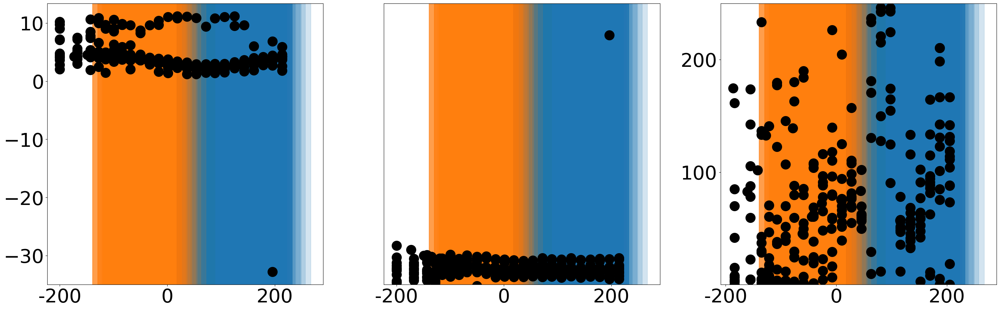

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1021  ACSF             463.639256          Neighbor              285.150114
1022  ACSF             445.104499          Neighbor              326.239778
1023  ACSF             427.161311              None              104.385652
1024  ACSF             409.206979          Neighbor              873.145067
1025  ACSF             391.744078              None               99.803273
1026  ACSF             373.280472              None               55.026717
1027  ACSF             355.671923              None              177.438528
1028  ACSF             337.218316              None              129.757242
1029  ACSF             319.701088              Home               64.619440
1030  ACSF             301.995361              Home               75.190475
1031  ACSF             284.175219              Home              353.618007
1032  ACSF             265.787082              Home             -121.903701
1033  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6509  ACSF             463.639256          Neighbor               68.393939
6510  ACSF             445.104499          Neighbor             -118.047288
6511  ACSF             427.161311              None              132.017148
6512  ACSF             409.206979          Neighbor              185.775546
6513  ACSF             391.744078              None               58.614621
6514  ACSF             373.280472              None              157.219191
6515  ACSF             355.671923              None              108.550629
6516  ACSF             337.218316              None               85.449891
6517  ACSF             319.701088              Home               77.317584
6518  ACSF             301.995361              Home               70.435346
6519  ACSF             284.175219              Home              574.629261
6520  ACSF             265.787082              Home             -112.465995
6521  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6536  ACSF             463.639256          Neighbor               54.195197
6537  ACSF             445.104499          Neighbor              -88.390088
6538  ACSF             427.161311              None               51.151943
6539  ACSF             409.206979          Neighbor               79.017653
6540  ACSF             391.744078              None               94.202069
6541  ACSF             373.280472              None               87.171037
6542  ACSF             355.671923              None              121.405309
6543  ACSF             337.218316              None              104.269212
6544  ACSF             319.701088              Home               71.394059
6545  ACSF             301.995361              Home               84.455652
6546  ACSF             284.175219              Home              875.625541
6547  ACSF             265.787082              Home             -132.062343
6548  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6563  ACSF             463.639256          Neighbor              115.842234
6564  ACSF             445.104499          Neighbor               63.180239
6565  ACSF             427.161311              None               80.153268
6566  ACSF             409.206979          Neighbor              371.551092
6567  ACSF             391.744078              None              153.863380
6568  ACSF             373.280472              None               86.741623
6569  ACSF             355.671923              None               86.231808
6570  ACSF             337.218316              None               63.468216
6571  ACSF             319.701088              Home               95.192079
6572  ACSF             301.995361              Home              116.471520
6573  ACSF             284.175219              Home              408.625252
6574  ACSF             265.787082              Home             -229.371437
6575  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6590  ACSF             463.639256          Neighbor               45.539944
6591  ACSF             445.104499          Neighbor               41.248708
6592  ACSF             427.161311              None              164.718643
6593  ACSF             409.206979          Neighbor               69.851605
6594  ACSF             391.744078              None              179.258307
6595  ACSF             373.280472              None               89.839538
6596  ACSF             355.671923              None              152.509148
6597  ACSF             337.218316              None               78.201909
6598  ACSF             319.701088              Home               89.876785
6599  ACSF             301.995361              Home               88.657426
6600  ACSF             284.175219              Home              287.314631
6601  ACSF             265.787082              Home             -232.429723
6602  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6617  ACSF             463.639256          Neighbor               25.707014
6618  ACSF             445.104499          Neighbor               94.937502
6619  ACSF             427.161311              None              127.335689
6620  ACSF             409.206979          Neighbor               77.269475
6621  ACSF             391.744078              None              136.767449
6622  ACSF             373.280472              None               72.463166
6623  ACSF             355.671923              None               73.814428
6624  ACSF             337.218316              None               74.541394
6625  ACSF             319.701088              Home              125.572530
6626  ACSF             301.995361              Home              125.493962
6627  ACSF             284.175219              Home              147.105091
6628  ACSF             265.787082              Home             -170.904208
6629  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6644  ACSF             463.639256          Neighbor             -157.074215
6645  ACSF             445.104499          Neighbor               43.763873
6646  ACSF             427.161311              None               85.091621
6647  ACSF             409.206979          Neighbor               58.404352
6648  ACSF             391.744078              None              169.390877
6649  ACSF             373.280472              None              114.341230
6650  ACSF             355.671923              None               79.885744
6651  ACSF             337.218316              None               74.541394
6652  ACSF             319.701088              Home               84.716396
6653  ACSF             301.995361              Home              112.785713
6654  ACSF             284.175219              Home              162.726870
6655  ACSF             265.787082              Home             -212.588161
6656  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6671  ACSF             463.639256          Neighbor              104.127851
6672  ACSF             445.104499          Neighbor              854.437514
6673  ACSF             427.161311              None               77.724382
6674  ACSF             409.206979          Neighbor               75.596975
6675  ACSF             391.744078              None              116.858263
6676  ACSF             373.280472              None               77.913935
6677  ACSF             355.671923              None               80.583436
6678  ACSF             337.218316              None               67.896231
6679  ACSF             319.701088              Home               79.755526
6680  ACSF             301.995361              Home               98.453827
6681  ACSF             284.175219              Home              328.359578
6682  ACSF             265.787082              Home             -127.242549
6683  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6698  ACSF             463.639256          Neighbor               74.736925
6699  ACSF             445.104499          Neighbor              101.373942
6700  ACSF             427.161311              None              185.096208
6701  ACSF             409.206979          Neighbor               66.652295
6702  ACSF             391.744078              None               79.929028
6703  ACSF             373.280472              None              108.694749
6704  ACSF             355.671923              None              106.668248
6705  ACSF             337.218316              None               68.965463
6706  ACSF             319.701088              Home               72.564454
6707  ACSF             301.995361              Home               87.783954
6708  ACSF             284.175219              Home              471.490676
6709  ACSF             265.787082              Home             -245.524355
6710  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6725  ACSF             463.639256          Neighbor              101.282827
6726  ACSF             445.104499          Neighbor               60.212040
6727  ACSF             427.161311              None               60.047934
6728  ACSF             409.206979          Neighbor               67.685664
6729  ACSF             391.744078              None               97.691035
6730  ACSF             373.280472              None              108.694749
6731  ACSF             355.671923              None              123.849711
6732  ACSF             337.218316              None               86.291762
6733  ACSF             319.701088              Home               79.397877
6734  ACSF             301.995361              Home              108.000864
6735  ACSF             284.175219              Home              735.525454
6736  ACSF             265.787082              Home             -581.074307
6737  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6752  ACSF             463.639256          Neighbor               38.059050
6753  ACSF             445.104499          Neighbor               60.010662
6754  ACSF             427.161311              None              102.013251
6755  ACSF             409.206979          Neighbor               50.912249
6756  ACSF             391.744078              None               94.685157
6757  ACSF             373.280472              None               62.441664
6758  ACSF             355.671923              None              129.046202
6759  ACSF             337.218316              None               63.239089
6760  ACSF             319.701088              Home               83.517579
6761  ACSF             301.995361              Home               97.912872
6762  ACSF             284.175219              Home              270.413770
6763  ACSF             265.787082              Home             -198.093514
6764  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6779  ACSF             463.639256          Neighbor               73.259911
6780  ACSF             445.104499          Neighbor             -854.437514
6781  ACSF             427.161311              None               94.001739
6782  ACSF             409.206979          Neighbor               83.956256
6783  ACSF             391.744078              None              148.900045
6784  ACSF             373.280472              None              130.433699
6785  ACSF             355.671923              None               87.045316
6786  ACSF             337.218316              None               54.065517
6787  ACSF             319.701088              Home               92.217326
6788  ACSF             301.995361              Home              108.000864
6789  ACSF             284.175219              Home              375.268089
6790  ACSF             265.787082              Home             -316.949622
6791  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6806  ACSF             463.639256          Neighbor             -215.520435
6807  ACSF             445.104499          Neighbor               32.156251
6808  ACSF             427.161311              None                8.615323
6809  ACSF             409.206979          Neighbor                1.883605
6810  ACSF             391.744078              None               -0.865657
6811  ACSF             373.280472              None                2.606357
6812  ACSF             355.671923              None               84.263045
6813  ACSF             337.218316              None              -12.089184
6814  ACSF             319.701088              Home              136.197897
6815  ACSF             301.995361              Home              148.501189
6816  ACSF             284.175219              Home              211.357889
6817  ACSF             265.787082              Home             -140.582494
6818  ACSF  

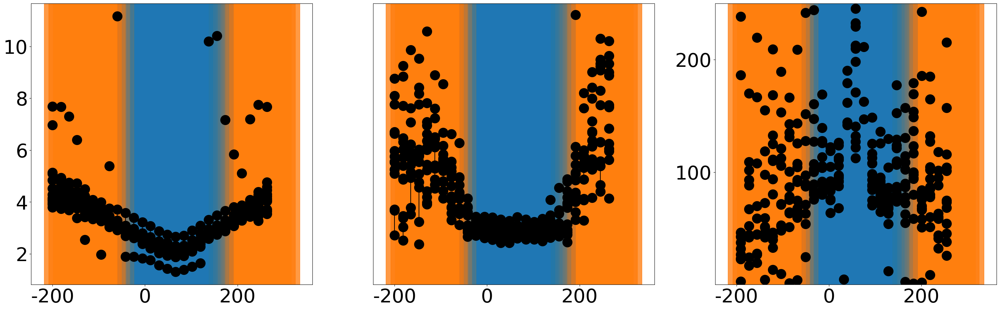

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
656   ACSF              82.596818              None              -23.681952
657   ACSF              99.695187              None              -48.126626
658   ACSF             116.058240              None              -29.641421
659   ACSF             134.050582              None              -68.011542
660   ACSF             152.141652              None              -86.405054
661   ACSF             169.422663              None             -396.905465
662   ACSF             187.680314              None             -112.743067
663   ACSF             205.268233              None             -112.579359
664   ACSF             223.393509              Home              -86.931924
665   ACSF             240.866826              Home              -73.038331
666   ACSF             259.053370              None             -129.314940
667   ACSF             276.769517              Home             -630.936645
668   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7170  ACSF             432.171673          Neighbor               91.425026
7171  ACSF             414.618068              None               40.004253
7172  ACSF             396.416133          Neighbor               47.190014
7173  ACSF             378.295168          Neighbor               82.880036
7174  ACSF             360.475960              None              287.930256
7175  ACSF             342.048424              None              223.474561
7176  ACSF             324.840883              None              156.348012
7177  ACSF             306.391817              None               66.486958
7178  ACSF             288.839260              Home               71.123078
7179  ACSF             270.916245              Home               54.965039
7180  ACSF             252.557922              Home               93.990855
7181  ACSF             235.357595              Home                     NaN
7182  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7195  ACSF             432.171673          Neighbor              -27.951600
7196  ACSF             414.618068              None               94.310544
7197  ACSF             396.416133          Neighbor              179.415501
7198  ACSF             378.295168          Neighbor             -614.455437
7199  ACSF             360.475960              None              737.101454
7200  ACSF             342.048424              None              249.384655
7201  ACSF             324.840883              None              147.592523
7202  ACSF             306.391817              None               65.739913
7203  ACSF             288.839260              Home               64.240200
7204  ACSF             270.916245              Home               60.991106
7205  ACSF             252.557922              Home              138.712310
7206  ACSF             235.357595              Home             1522.354237
7207  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7220  ACSF             432.171673          Neighbor               14.099281
7221  ACSF             414.618068              None              -20.002126
7222  ACSF             396.416133          Neighbor                6.830368
7223  ACSF             378.295168          Neighbor               -0.384192
7224  ACSF             360.475960              None                0.463143
7225  ACSF             342.048424              None               10.163935
7226  ACSF             324.840883              None               99.724678
7227  ACSF             306.391817              None              381.577322
7228  ACSF             288.839260              Home              132.763079
7229  ACSF             270.916245              Home              524.523511
7230  ACSF             252.557922              Home              268.755100
7231  ACSF             235.357595              Home              537.301495
7232  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7245  ACSF             432.171673          Neighbor               31.234173
7246  ACSF             414.618068              None               37.452541
7247  ACSF             396.416133          Neighbor               67.868785
7248  ACSF             378.295168          Neighbor              445.480192
7249  ACSF             360.475960              None              167.523058
7250  ACSF             342.048424              None              264.731403
7251  ACSF             324.840883              None              156.348012
7252  ACSF             306.391817              None               83.983525
7253  ACSF             288.839260              Home               68.670558
7254  ACSF             270.916245              Home               71.993423
7255  ACSF             252.557922              Home               81.133615
7256  ACSF             235.357595              Home              608.941695
7257  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7270  ACSF             432.171673          Neighbor               65.498526
7271  ACSF             414.618068              None              107.703757
7272  ACSF             396.416133          Neighbor              102.960032
7273  ACSF             378.295168          Neighbor              282.844566
7274  ACSF             360.475960              None              449.452106
7275  ACSF             342.048424              None                     NaN
7276  ACSF             324.840883              None              152.471615
7277  ACSF             306.391817              None               60.526058
7278  ACSF             288.839260              Home               48.050980
7279  ACSF             270.916245              Home               56.836913
7280  ACSF             252.557922              Home               86.870335
7281  ACSF             235.357595              Home             -570.882839
7282  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7295  ACSF             432.171673          Neighbor              159.578227
7296  ACSF             414.618068              None              127.286259
7297  ACSF             396.416133          Neighbor             2013.440618
7298  ACSF             378.295168          Neighbor              151.010234
7299  ACSF             360.475960              None              341.250673
7300  ACSF             342.048424              None              318.658170
7301  ACSF             324.840883              None              132.727089
7302  ACSF             306.391817              None               72.832186
7303  ACSF             288.839260              Home               70.286336
7304  ACSF             270.916245              Home               53.836724
7305  ACSF             252.557922              Home              122.859474
7306  ACSF             235.357595              Home              285.441419
7307  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7320  ACSF             432.171673          Neighbor               24.245311
7321  ACSF             414.618068              None               61.911343
7322  ACSF             396.416133          Neighbor             -369.815624
7323  ACSF             378.295168          Neighbor              219.990218
7324  ACSF             360.475960              None             -178.908120
7325  ACSF             342.048424              None              264.731403
7326  ACSF             324.840883              None              127.234934
7327  ACSF             306.391817              None               58.314142
7328  ACSF             288.839260              Home               51.950770
7329  ACSF             270.916245              Home               59.994519
7330  ACSF             252.557922              Home               96.631047
7331  ACSF             235.357595              Home              570.882839
7332  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7345  ACSF             432.171673          Neighbor              104.485744
7346  ACSF             414.618068              None               48.538493
7347  ACSF             396.416133          Neighbor               24.161287
7348  ACSF             378.295168          Neighbor              -78.498712
7349  ACSF             360.475960              None             -575.860511
7350  ACSF             342.048424              None                     NaN
7351  ACSF             324.840883              None               82.731235
7352  ACSF             306.391817              None               55.196720
7353  ACSF             288.839260              Home               44.145359
7354  ACSF             270.916245              Home               44.776397
7355  ACSF             252.557922              Home              124.640046
7356  ACSF             235.357595              Home             1405.250065
7357  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7370  ACSF             432.171673          Neighbor             -158.140586
7371  ACSF             414.618068              None             -185.734030
7372  ACSF             396.416133          Neighbor              671.146873
7373  ACSF             378.295168          Neighbor             -101.824044
7374  ACSF             360.475960              None             -801.197233
7375  ACSF             342.048424              None              126.526038
7376  ACSF             324.840883              None              159.043667
7377  ACSF             306.391817              None               59.099518
7378  ACSF             288.839260              Home               52.101790
7379  ACSF             270.916245              Home               52.302914
7380  ACSF             252.557922              Home              103.616424
7381  ACSF             235.357595              Home             -676.601883
7382  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7395  ACSF             432.171673          Neighbor             -566.245322
7396  ACSF             414.618068              None               29.030199
7397  ACSF             396.416133          Neighbor               68.640021
7398  ACSF             378.295168          Neighbor             -742.466986
7399  ACSF             360.475960              None              138.552905
7400  ACSF             342.048424              None              121.179867
7401  ACSF             324.840883              None              144.133323
7402  ACSF             306.391817              None               66.236063
7403  ACSF             288.839260              Home               57.445563
7404  ACSF             270.916245              Home               49.886747
7405  ACSF             252.557922              Home               78.540303
7406  ACSF             235.357595              Home                     NaN
7407  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7420  ACSF             432.171673          Neighbor               43.993997
7421  ACSF             414.618068              None              303.365583
7422  ACSF             396.416133          Neighbor               98.483508
7423  ACSF             378.295168          Neighbor              133.979005
7424  ACSF             360.475960              None              222.018510
7425  ACSF             342.048424              None              245.822017
7426  ACSF             324.840883              None              147.592523
7427  ACSF             306.391817              None               81.639799
7428  ACSF             288.839260              Home               56.539482
7429  ACSF             270.916245              Home               71.156290
7430  ACSF             252.557922              Home               90.528034
7431  ACSF             235.357595              Home             2029.805649
7432  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7445  ACSF             432.171673          Neighbor              243.800069
7446  ACSF             414.618068              None                     NaN
7447  ACSF             396.416133          Neighbor             -671.146873
7448  ACSF             378.295168          Neighbor              112.070488
7449  ACSF             360.475960              None             -136.500269
7450  ACSF             342.048424              None              593.363489
7451  ACSF             324.840883              None              636.174668
7452  ACSF             306.391817              None              227.955283
7453  ACSF             288.839260              Home              194.815388
7454  ACSF             270.916245              Home               42.203041
7455  ACSF             252.557922              Home               72.270279
7456  ACSF             235.357595              Home              -78.069448
7457  ACSF  

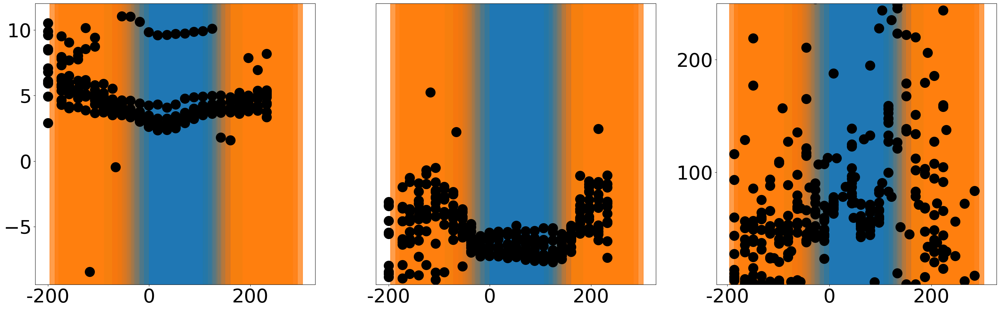

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
704  ACSF             471.783278              None             -150.681098
705  ACSF             454.949162              None              -81.298001
706  ACSF             435.364639              None             -104.554790
707  ACSF             419.192427              None               71.595910
708  ACSF             400.695078              None               35.540459
..    ...                    ...               ...                     ...
811  ACSF              81.186496          Neighbor               70.680994
812  ACSF              64.707381          Neighbor              -20.711634
813  ACSF              49.127342              None               14.963566
814  ACSF              32.531861              None              -76.142579
815  ACSF              16.185363              None             -355.953179

[112 rows x 4 columns]
     ROI       amp       snr  latency  halfwidth  Stim_Distance   X_Center  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7470  ACSF             470.471629              None             -108.640860
7471  ACSF             451.350838              None             2082.112354
7472  ACSF             432.611826              None             -152.468003
7473  ACSF             416.755154              None              260.490680
7474  ACSF             397.218353              None               61.108166
7475  ACSF             379.863634              None               55.183849
7476  ACSF             359.942265              Home               65.572126
7477  ACSF             343.155800              Home              167.771171
7478  ACSF             326.378683              None              261.748692
7479  ACSF             305.700536              Home                     NaN
7480  ACSF             290.451337              None             -145.912865
7481  ACSF             271.482665              Home              -77.770184
7482  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7497  ACSF             470.471629              None               95.128315
7498  ACSF             451.350838              None               99.675591
7499  ACSF             432.611826              None             -689.420536
7500  ACSF             416.755154              None              136.620986
7501  ACSF             397.218353              None               71.713715
7502  ACSF             379.863634              None               60.004125
7503  ACSF             359.942265              Home               55.768985
7504  ACSF             343.155800              Home              262.142454
7505  ACSF             326.378683              None              350.477063
7506  ACSF             305.700536              Home              491.909648
7507  ACSF             290.451337              None             -110.282979
7508  ACSF             271.482665              Home              -60.797538
7509  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7524  ACSF             470.471629              None               36.700175
7525  ACSF             451.350838              None               61.844921
7526  ACSF             432.611826              None              293.642080
7527  ACSF             416.755154              None              135.672229
7528  ACSF             397.218353              None               66.493176
7529  ACSF             379.863634              None               62.449434
7530  ACSF             359.942265              Home               61.041689
7531  ACSF             343.155800              Home              266.303446
7532  ACSF             326.378683              None              397.656667
7533  ACSF             305.700536              Home              491.909648
7534  ACSF             290.451337              None             -101.436751
7535  ACSF             271.482665              Home              -66.187391
7536  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7551  ACSF             470.471629              None              -38.784567
7552  ACSF             451.350838              None              -36.386429
7553  ACSF             432.611826              None              -50.021048
7554  ACSF             416.755154              None              244.210013
7555  ACSF             397.218353              None               52.910729
7556  ACSF             379.863634              None               56.116534
7557  ACSF             359.942265              Home               74.276391
7558  ACSF             343.155800              Home              145.887975
7559  ACSF             326.378683              None              222.345663
7560  ACSF             305.700536              Home             -304.983982
7561  ACSF             290.451337              None             -138.457463
7562  ACSF             271.482665              Home              -85.618551
7563  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7578  ACSF             470.471629              None               93.272153
7579  ACSF             451.350838              None             -457.049053
7580  ACSF             432.611826              None             -174.249147
7581  ACSF             416.755154              None              126.862344
7582  ACSF             397.218353              None               59.638210
7583  ACSF             379.863634              None               57.245315
7584  ACSF             359.942265              Home               65.316982
7585  ACSF             343.155800              Home              153.918505
7586  ACSF             326.378683              None              229.757185
7587  ACSF             305.700536              Home             -953.074943
7588  ACSF             290.451337              None             -110.282979
7589  ACSF             271.482665              Home              -50.309553
7590  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7605  ACSF             470.471629              None               -0.190429
7606  ACSF             451.350838              None               -1.139773
7607  ACSF             432.611826              None                5.216011
7608  ACSF             416.755154              None               41.834692
7609  ACSF             397.218353              None              619.811393
7610  ACSF             379.863634              None             -948.636646
7611  ACSF             359.942265              Home                     NaN
7612  ACSF             343.155800              Home             -153.918505
7613  ACSF             326.378683              None             -405.453857
7614  ACSF             305.700536              Home               69.314541
7615  ACSF             290.451337              None              -46.720868
7616  ACSF             271.482665              Home              -23.389529
7617  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7632  ACSF             470.471629              None               72.427240
7633  ACSF             451.350838              None              137.786847
7634  ACSF             432.611826              None              396.416808
7635  ACSF             416.755154              None              135.672229
7636  ACSF             397.218353              None               66.239386
7637  ACSF             379.863634              None               53.841539
7638  ACSF             359.942265              Home               69.653379
7639  ACSF             343.155800              Home              294.335387
7640  ACSF             326.378683              None              291.241503
7641  ACSF             305.700536              Home                     NaN
7642  ACSF             290.451337              None              -93.441736
7643  ACSF             271.482665              Home              -50.582234
7644  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7659  ACSF             470.471629              None                     NaN
7660  ACSF             451.350838              None              317.610359
7661  ACSF             432.611826              None              283.154863
7662  ACSF             416.755154              None              100.188723
7663  ACSF             397.218353              None               59.231123
7664  ACSF             379.863634              None               56.918199
7665  ACSF             359.942265              Home               67.961394
7666  ACSF             343.155800              Home              409.197977
7667  ACSF             326.378683              None              504.345041
7668  ACSF             305.700536              Home              693.145413
7669  ACSF             290.451337              None              -83.195932
7670  ACSF             271.482665              Home              -63.270658
7671  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7686  ACSF             470.471629              None              212.453238
7687  ACSF             451.350838              None             2082.112354
7688  ACSF             432.611826              None             -200.717371
7689  ACSF             416.755154              None              114.250298
7690  ACSF             397.218353              None               62.203294
7691  ACSF             379.863634              None               57.910958
7692  ACSF             359.942265              Home               76.302111
7693  ACSF             343.155800              Home              356.959938
7694  ACSF             326.378683              None              308.629055
7695  ACSF             305.700536              Home              762.459954
7696  ACSF             290.451337              None             -101.436751
7697  ACSF             271.482665              Home              -75.873350
7698  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7713  ACSF             470.471629              None               74.690591
7714  ACSF             451.350838              None              170.354647
7715  ACSF             432.611826              None              304.936006
7716  ACSF             416.755154              None              112.929486
7717  ACSF             397.218353              None               67.528090
7718  ACSF             379.863634              None               69.412437
7719  ACSF             359.942265              Home               99.919431
7720  ACSF             343.155800              Home              578.521278
7721  ACSF             326.378683              None              261.748692
7722  ACSF             305.700536              Home              217.845701
7723  ACSF             290.451337              None              -98.795169
7724  ACSF             271.482665              Home              -75.873350
7725  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7740  ACSF             470.471629              None               19.590975
7741  ACSF             451.350838              None              -29.510254
7742  ACSF             432.611826              None              -26.830241
7743  ACSF             416.755154              None              257.063172
7744  ACSF             397.218353              None               49.726989
7745  ACSF             379.863634              None               42.933986
7746  ACSF             359.942265              Home             -479.613267
7747  ACSF             343.155800              Home              132.103284
7748  ACSF             326.378683              None               97.080501
7749  ACSF             305.700536              Home               58.426050
7750  ACSF             290.451337              None             -143.702064
7751  ACSF             271.482665              Home             -103.120686
7752  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7767  ACSF             470.471629              None             -175.420105
7768  ACSF             451.350838              None              416.422471
7769  ACSF             432.611826              None             -108.607345
7770  ACSF             416.755154              None              150.283085
7771  ACSF             397.218353              None               92.805984
7772  ACSF             379.863634              None               42.933986
7773  ACSF             359.942265              Home              133.225908
7774  ACSF             343.155800              Home               83.885585
7775  ACSF             326.378683              None               30.453824
7776  ACSF             305.700536              Home             -138.629083
7777  ACSF             290.451337              None              -54.981659
7778  ACSF             271.482665              Home              -55.385294
7779  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7794  ACSF             470.471629              None              -48.407067
7795  ACSF             451.350838              None              105.870120
7796  ACSF             432.611826              None               99.104202
7797  ACSF             416.755154              None             -375.707712
7798  ACSF             397.218353              None               34.989353
7799  ACSF             379.863634              None               37.516703
7800  ACSF             359.942265              Home               60.166539
7801  ACSF             343.155800              Home              299.591376
7802  ACSF             326.378683              None               42.114352
7803  ACSF             305.700536              Home                     NaN
7804  ACSF             290.451337              None              -57.134556
7805  ACSF             271.482665              Home             -128.723064
7806  ACSF  

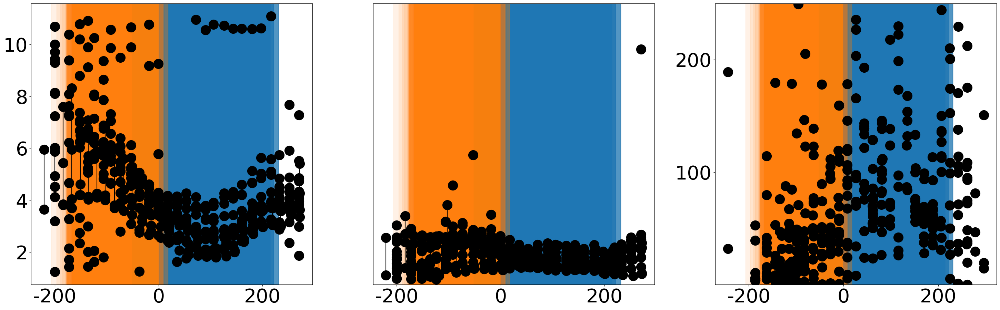

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
816   ACSF             410.364728              None              -61.434747
817   ACSF             392.671520              Home              208.484394
818   ACSF             374.950347              Home               76.654081
819   ACSF             357.013292              None               86.663292
820   ACSF             339.593970              Home               65.192323
821   ACSF             321.340120              Home               45.043936
822   ACSF             303.502721              Home               90.581181
823   ACSF             285.929972              None               65.902807
824   ACSF             268.070311              None             -203.759470
825   ACSF             251.158275              None              -48.896778
826   ACSF             233.213158          Neighbor              -30.236753
827   ACSF             215.736314          Neighbor              -38.602903
828   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4214  ACSF             410.364728              None              175.180269
4215  ACSF             392.671520              Home               92.297779
4216  ACSF             374.950347              Home               88.359877
4217  ACSF             357.013292              None              316.714940
4218  ACSF             339.593970              Home               62.299831
4219  ACSF             321.340120              Home               67.565904
4220  ACSF             303.502721              Home               44.375629
4221  ACSF             285.929972              None             -992.203377
4222  ACSF             268.070311              None             -174.350887
4223  ACSF             251.158275              None              -69.286168
4224  ACSF             233.213158          Neighbor              -27.785124
4225  ACSF             215.736314          Neighbor              -31.910794
4226  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4238  ACSF             410.364728              None               69.933625
4239  ACSF             392.671520              Home             -133.241906
4240  ACSF             374.950347              Home               87.926740
4241  ACSF             357.013292              None               59.451610
4242  ACSF             339.593970              Home               64.729966
4243  ACSF             321.340120              Home               88.303954
4244  ACSF             303.502721              Home               80.608941
4245  ACSF             285.929972              None              168.487366
4246  ACSF             268.070311              None             -281.867267
4247  ACSF             251.158275              None              -60.625397
4248  ACSF             233.213158          Neighbor              -18.262114
4249  ACSF             215.736314          Neighbor              -13.040354
4250  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4262  ACSF             410.364728              None              205.734967
4263  ACSF             392.671520              Home             -377.046244
4264  ACSF             374.950347              Home               84.608750
4265  ACSF             357.013292              None              316.714940
4266  ACSF             339.593970              Home               61.049667
4267  ACSF             321.340120              Home              116.584305
4268  ACSF             303.502721              Home               50.064812
4269  ACSF             285.929972              None              128.486768
4270  ACSF             268.070311              None             -142.117950
4271  ACSF             251.158275              None              -19.961199
4272  ACSF             233.213158          Neighbor              -11.574068
4273  ACSF             215.736314          Neighbor              -25.306968
4274  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4286  ACSF             410.364728              None              113.417995
4287  ACSF             392.671520              Home              194.738170
4288  ACSF             374.950347              Home              116.474383
4289  ACSF             357.013292              None              113.851776
4290  ACSF             339.593970              Home               44.630441
4291  ACSF             321.340120              Home               57.913632
4292  ACSF             303.502721              Home               39.938066
4293  ACSF             285.929972              None              144.029522
4294  ACSF             268.070311              None             -122.550985
4295  ACSF             251.158275              None              -36.697582
4296  ACSF             233.213158          Neighbor              -10.888999
4297  ACSF             215.736314          Neighbor               -6.804325
4298  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4310  ACSF             410.364728              None              376.451217
4311  ACSF             392.671520              Home               96.837014
4312  ACSF             374.950347              Home               48.478527
4313  ACSF             357.013292              None              154.153289
4314  ACSF             339.593970              Home               75.742118
4315  ACSF             321.340120              Home               75.903824
4316  ACSF             303.502721              Home               39.578264
4317  ACSF             285.929972              None             -496.101688
4318  ACSF             268.070311              None              -73.530591
4319  ACSF             251.158275              None              -90.176470
4320  ACSF             233.213158          Neighbor              -21.496732
4321  ACSF             215.736314          Neighbor              -13.587502
4322  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4334  ACSF             410.364728              None               15.911158
4335  ACSF             392.671520              Home              -45.438906
4336  ACSF             374.950347              Home              169.217499
4337  ACSF             357.013292              None               90.255553
4338  ACSF             339.593970              Home               40.564112
4339  ACSF             321.340120              Home               38.692839
4340  ACSF             303.502721              Home               63.900906
4341  ACSF             285.929972              None              184.120214
4342  ACSF             268.070311              None              -63.819004
4343  ACSF             251.158275              None              -58.453152
4344  ACSF             233.213158          Neighbor              -14.503604
4345  ACSF             215.736314          Neighbor              -13.780232
4346  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4358  ACSF             410.364728              None              -34.557045
4359  ACSF             392.671520              Home             -148.917424
4360  ACSF             374.950347              Home               67.179981
4361  ACSF             357.013292              None              -88.874090
4362  ACSF             339.593970              Home              264.548556
4363  ACSF             321.340120              Home               44.593497
4364  ACSF             303.502721              Home               30.350171
4365  ACSF             285.929972              None              251.544518
4366  ACSF             268.070311              None              -62.637170
4367  ACSF             251.158275              None              -42.223806
4368  ACSF             233.213158          Neighbor              -22.377520
4369  ACSF             215.736314          Neighbor              -23.504187
4370  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4382  ACSF             410.364728              None               -4.064601
4383  ACSF             392.671520              Home             -123.063705
4384  ACSF             374.950347              Home               44.955025
4385  ACSF             357.013292              None             -100.111044
4386  ACSF             339.593970              Home                1.067851
4387  ACSF             321.340120              Home               -2.605521
4388  ACSF             303.502721              Home                0.947420
4389  ACSF             285.929972              None              -20.411041
4390  ACSF             268.070311              None               18.687333
4391  ACSF             251.158275              None              -44.528828
4392  ACSF             233.213158          Neighbor              -33.674072
4393  ACSF             215.736314          Neighbor               -3.674536
4394  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4406  ACSF             410.364728              None                5.165900
4407  ACSF             392.671520              Home               -5.267887
4408  ACSF             374.950347              Home                4.660186
4409  ACSF             357.013292              None                     NaN
4410  ACSF             339.593970              Home             -186.263779
4411  ACSF             321.340120              Home               54.548620
4412  ACSF             303.502721              Home               14.148751
4413  ACSF             285.929972              None              -50.167586
4414  ACSF             268.070311              None              -65.297436
4415  ACSF             251.158275              None             -407.843581
4416  ACSF             233.213158          Neighbor              -52.800131
4417  ACSF             215.736314          Neighbor              -18.662876
4418  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4430  ACSF             410.364728              None               -2.501160
4431  ACSF             392.671520              Home                2.316796
4432  ACSF             374.950347              Home              -35.033310
4433  ACSF             357.013292              None               -4.631567
4434  ACSF             339.593970              Home               12.409144
4435  ACSF             321.340120              Home              220.214799
4436  ACSF             303.502721              Home               41.740497
4437  ACSF             285.929972              None              -75.676529
4438  ACSF             268.070311              None              -28.139827
4439  ACSF             251.158275              None             -996.950976
4440  ACSF             233.213158          Neighbor              -43.583150
4441  ACSF             215.736314          Neighbor              -19.582436
4442  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4454  ACSF             410.364728              None                     NaN
4455  ACSF             392.671520              Home                0.123225
4456  ACSF             374.950347              Home                4.186988
4457  ACSF             357.013292              None               -4.376714
4458  ACSF             339.593970              Home                0.854861
4459  ACSF             321.340120              Home               14.852122
4460  ACSF             303.502721              Home             -134.143123
4461  ACSF             285.929972              None               48.531687
4462  ACSF             268.070311              None                2.573347
4463  ACSF             251.158275              None               30.939858
4464  ACSF             233.213158          Neighbor              -23.681359
4465  ACSF             215.736314          Neighbor               -4.557497
4466  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4478  ACSF             410.364728              None               -0.099243
4479  ACSF             392.671520              Home                     NaN
4480  ACSF             374.950347              Home                0.100973
4481  ACSF             357.013292              None             -370.623866
4482  ACSF             339.593970              Home               -2.088780
4483  ACSF             321.340120              Home               90.087872
4484  ACSF             303.502721              Home                3.423485
4485  ACSF             285.929972              None             -135.300460
4486  ACSF             268.070311              None             -676.481440
4487  ACSF             251.158275              None             -156.044501
4488  ACSF             233.213158          Neighbor              -78.021622
4489  ACSF             215.736314          Neighbor              -10.728291
4490  ACSF  

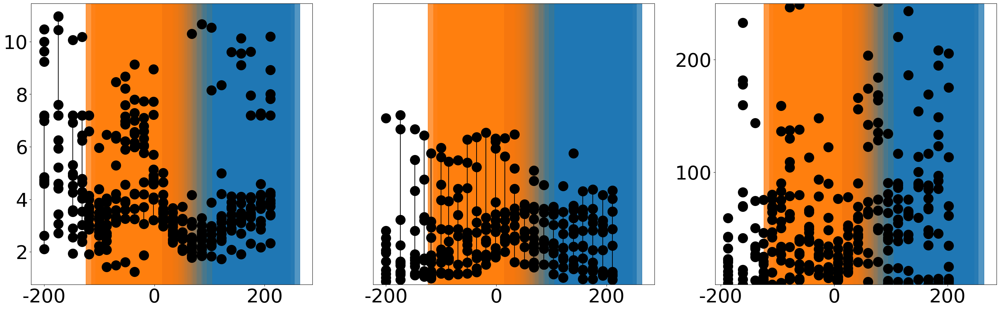

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
840   ACSF             392.159609              None               51.970633
841   ACSF             374.073829              None               64.992945
842   ACSF             356.070783              Home              120.953524
843   ACSF             338.169662              Home             1967.869716
844   ACSF             320.458834              Home             -164.908894
845   ACSF             302.813583              Home              -87.296012
846   ACSF             284.917900              Home              -67.561877
847   ACSF             267.014003              Home             -177.921698
848   ACSF             249.221833              None             -725.243583
849   ACSF             231.090743              None              -70.844085
850   ACSF             213.238034              None              -43.306314
851   ACSF             195.482445          Neighbor              -27.902853
852   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4525  ACSF             392.159609              None               42.355457
4526  ACSF             374.073829              None               58.833483
4527  ACSF             356.070783              Home              122.610421
4528  ACSF             338.169662              Home             -681.185671
4529  ACSF             320.458834              Home             -339.331762
4530  ACSF             302.813583              Home              -80.249697
4531  ACSF             284.917900              Home              -61.525421
4532  ACSF             267.014003              Home             -160.289818
4533  ACSF             249.221833              None             -625.209985
4534  ACSF             231.090743              None                     NaN
4535  ACSF             213.238034              None             -355.111779
4536  ACSF             195.482445          Neighbor              -36.157448
4537  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4548  ACSF             392.159609              None               50.660449
4549  ACSF             374.073829              None               65.465621
4550  ACSF             356.070783              Home              111.882010
4551  ACSF             338.169662              Home              983.934858
4552  ACSF             320.458834              Home             -171.313123
4553  ACSF             302.813583              Home             -102.848750
4554  ACSF             284.917900              Home              -68.075656
4555  ACSF             267.014003              Home             -243.728353
4556  ACSF             249.221833              None             -274.713478
4557  ACSF             231.090743              None              469.808145
4558  ACSF             213.238034              None              -59.582513
4559  ACSF             195.482445          Neighbor              -41.820662
4560  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4571  ACSF             392.159609              None               55.477854
4572  ACSF             374.073829              None               80.370740
4573  ACSF             356.070783              Home              149.176013
4574  ACSF             338.169662              Home              983.934858
4575  ACSF             320.458834              Home             -263.361965
4576  ACSF             302.813583              Home             -135.573352
4577  ACSF             284.917900              Home              -79.928113
4578  ACSF             267.014003              Home             -109.828209
4579  ACSF             249.221833              None             1066.534681
4580  ACSF             231.090743              None               74.697529
4581  ACSF             213.238034              None             -157.129106
4582  ACSF             195.482445          Neighbor                     NaN
4583  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4594  ACSF             392.159609              None               62.150448
4595  ACSF             374.073829              None               72.886825
4596  ACSF             356.070783              Home              105.923796
4597  ACSF             338.169662              Home             4427.706861
4598  ACSF             320.458834              Home             -217.842613
4599  ACSF             302.813583              Home              -95.189801
4600  ACSF             284.917900              Home              -89.074116
4601  ACSF             267.014003              Home             -199.912020
4602  ACSF             249.221833              None              549.426957
4603  ACSF             231.090743              None             -302.588297
4604  ACSF             213.238034              None              224.754290
4605  ACSF             195.482445          Neighbor             -180.787238
4606  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4617  ACSF             392.159609              None               54.805395
4618  ACSF             374.073829              None               64.992945
4619  ACSF             356.070783              Home              146.730504
4620  ACSF             338.169662              Home              411.879708
4621  ACSF             320.458834              Home             -304.228476
4622  ACSF             302.813583              Home              -93.694673
4623  ACSF             284.917900              Home              -72.193135
4624  ACSF             267.014003              Home             -123.556735
4625  ACSF             249.221833              None             -146.218464
4626  ACSF             231.090743              None             -302.588297
4627  ACSF             213.238034              None             -118.370593
4628  ACSF             195.482445          Neighbor             -255.229042
4629  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4640  ACSF             392.159609              None               47.221358
4641  ACSF             374.073829              None               72.592927
4642  ACSF             356.070783              Home              157.027382
4643  ACSF             338.169662              Home              708.433098
4644  ACSF             320.458834              Home             -275.707057
4645  ACSF             302.813583              Home             -114.715914
4646  ACSF             284.917900              Home              -82.888414
4647  ACSF             267.014003              Home             -118.614465
4648  ACSF             249.221833              None             -287.795073
4649  ACSF             231.090743              None             -270.495599
4650  ACSF             213.238034              None              149.206630
4651  ACSF             195.482445          Neighbor              -51.045808
4652  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4663  ACSF             392.159609              None               49.550083
4664  ACSF             374.073829              None               65.465621
4665  ACSF             356.070783              Home              136.649783
4666  ACSF             338.169662              Home              681.185671
4667  ACSF             320.458834              Home             -309.565818
4668  ACSF             302.813583              Home              -87.296012
4669  ACSF             284.917900              Home              -70.766393
4670  ACSF             267.014003              Home              -82.371156
4671  ACSF             249.221833              None             -210.826623
4672  ACSF             231.090743              None             1785.270950
4673  ACSF             213.238034              None              -46.480599
4674  ACSF             195.482445          Neighbor              -56.717565
4675  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4686  ACSF             392.159609              None               69.829267
4687  ACSF             374.073829              None               72.012183
4688  ACSF             356.070783              Home              139.852512
4689  ACSF             338.169662              Home              506.023641
4690  ACSF             320.458834              Home             -608.456952
4691  ACSF             302.813583              Home             -138.726221
4692  ACSF             284.917900              Home              -72.485415
4693  ACSF             267.014003              Home             -161.746998
4694  ACSF             249.221833              None               67.906703
4695  ACSF             231.090743              None                3.521939
4696  ACSF             213.238034              None               -6.348083
4697  ACSF             195.482445          Neighbor               -9.286022
4698  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4709  ACSF             392.159609              None               48.100479
4710  ACSF             374.073829              None               72.886825
4711  ACSF             356.070783              Home               92.751925
4712  ACSF             338.169662              Home              983.934858
4713  ACSF             320.458834              Home             -280.083359
4714  ACSF             302.813583              Home              -70.455443
4715  ACSF             284.917900              Home              -68.597308
4716  ACSF             267.014003              Home              -88.960849
4717  ACSF             249.221833              None             -453.277239
4718  ACSF             231.090743              None             -148.772579
4719  ACSF             213.238034              None              119.970195
4720  ACSF             195.482445          Neighbor              -44.501474
4721  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4732  ACSF             392.159609              None               37.213540
4733  ACSF             374.073829              None              818.320264
4734  ACSF             356.070783              Home              -38.168703
4735  ACSF             338.169662              Home              -11.426340
4736  ACSF             320.458834              Home               -5.345426
4737  ACSF             302.813583              Home                4.007992
4738  ACSF             284.917900              Home              -10.612862
4739  ACSF             267.014003              Home               -3.068674
4740  ACSF             249.221833              None               -0.626550
4741  ACSF             231.090743              None                0.374821
4742  ACSF             213.238034              None               -5.587032
4743  ACSF             195.482445          Neighbor              -84.661341
4744  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4755  ACSF             392.159609              None               49.012955
4756  ACSF             374.073829              None               54.389866
4757  ACSF             356.070783              Home              111.882010
4758  ACSF             338.169662              Home              983.934858
4759  ACSF             320.458834              Home             -452.442349
4760  ACSF             302.813583              Home              -80.975939
4761  ACSF             284.917900              Home              -57.200950
4762  ACSF             267.014003              Home              -87.216519
4763  ACSF             249.221833              None             -215.846304
4764  ACSF             231.090743              None             -147.543054
4765  ACSF             213.238034              None              -75.878585
4766  ACSF             195.482445          Neighbor              -75.788536
4767  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4778  ACSF             392.159609              None               48.228747
4779  ACSF             374.073829              None               60.616316
4780  ACSF             356.070783              Home               95.218732
4781  ACSF             338.169662              Home              478.671012
4782  ACSF             320.458834              Home             -289.266420
4783  ACSF             302.813583              Home              -84.413597
4784  ACSF             284.917900              Home              -82.506440
4785  ACSF             267.014003              Home              -80.144909
4786  ACSF             249.221833              None             -226.638620
4787  ACSF             231.090743              None             -168.421788
4788  ACSF             213.238034              None             1479.632410
4789  ACSF             195.482445          Neighbor              -78.178265
4790  ACSF  

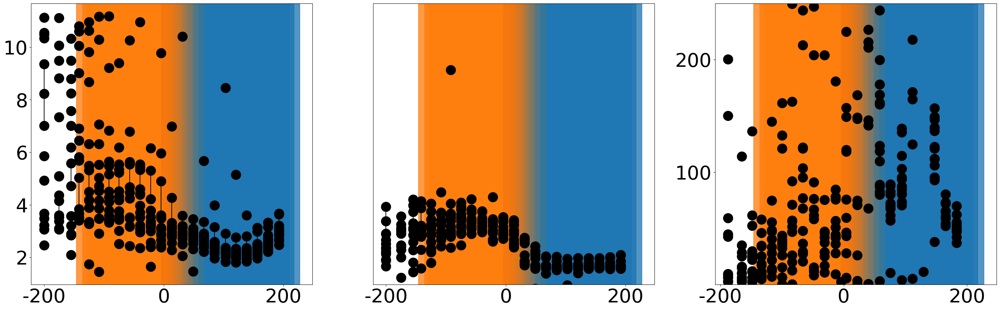

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
863   ACSF             462.354570              None                8.209669
864   ACSF             444.629896          Neighbor             -149.082960
865   ACSF             426.739940          Neighbor             -174.490352
866   ACSF             408.592944          Neighbor               15.950200
867   ACSF             390.728720          Neighbor               58.393575
868   ACSF             372.743499          Neighbor              103.472395
869   ACSF             354.842774              None               50.523960
870   ACSF             337.260437              Home               67.737794
871   ACSF             319.445397              Home               89.274781
872   ACSF             301.679715              Home             -226.213023
873   ACSF             283.808887              Home             -160.530324
874   ACSF             266.150551              Home              -55.887054
875   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4828  ACSF             462.354570              None             -213.550295
4829  ACSF             444.629896          Neighbor             -178.899552
4830  ACSF             426.739940          Neighbor             -490.459368
4831  ACSF             408.592944          Neighbor               26.544166
4832  ACSF             390.728720          Neighbor               32.581922
4833  ACSF             372.743499          Neighbor               58.308549
4834  ACSF             354.842774              None               74.818459
4835  ACSF             337.260437              Home               49.624066
4836  ACSF             319.445397              Home               87.948918
4837  ACSF             301.679715              Home             -270.770133
4838  ACSF             283.808887              Home              735.763987
4839  ACSF             266.150551              Home              -66.260030
4840  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4855  ACSF             462.354570              None              -42.302326
4856  ACSF             444.629896          Neighbor              851.902630
4857  ACSF             426.739940          Neighbor              201.633296
4858  ACSF             408.592944          Neighbor               58.571226
4859  ACSF             390.728720          Neighbor               19.570425
4860  ACSF             372.743499          Neighbor             1052.983789
4861  ACSF             354.842774              None               21.814315
4862  ACSF             337.260437              Home              127.250285
4863  ACSF             319.445397              Home              130.630010
4864  ACSF             301.679715              Home              308.117738
4865  ACSF             283.808887              Home              929.386089
4866  ACSF             266.150551              Home              -47.794120
4867  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4882  ACSF             462.354570              None             -361.728051
4883  ACSF             444.629896          Neighbor               65.771894
4884  ACSF             426.739940          Neighbor               79.942716
4885  ACSF             408.592944          Neighbor               24.777010
4886  ACSF             390.728720          Neighbor              666.119294
4887  ACSF             372.743499          Neighbor               28.733105
4888  ACSF             354.842774              None               49.250246
4889  ACSF             337.260437              Home              125.458027
4890  ACSF             319.445397              Home               67.294248
4891  ACSF             301.679715              Home              255.297554
4892  ACSF             283.808887              Home             -150.925946
4893  ACSF             266.150551              Home              -58.308826
4894  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4909  ACSF             462.354570              None              -86.461827
4910  ACSF             444.629896          Neighbor               22.390432
4911  ACSF             426.739940          Neighbor                8.086897
4912  ACSF             408.592944          Neighbor              -11.562605
4913  ACSF             390.728720          Neighbor               18.277664
4914  ACSF             372.743499          Neighbor               62.809559
4915  ACSF             354.842774              None              -41.664308
4916  ACSF             337.260437              Home             -539.849693
4917  ACSF             319.445397              Home              108.327325
4918  ACSF             301.679715              Home              117.571242
4919  ACSF             283.808887              Home              -63.065485
4920  ACSF             266.150551              Home              -75.399344
4921  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4936  ACSF             462.354570              None              -36.246778
4937  ACSF             444.629896          Neighbor              -73.020225
4938  ACSF             426.739940          Neighbor               29.603583
4939  ACSF             408.592944          Neighbor             1786.422396
4940  ACSF             390.728720          Neighbor               15.598630
4941  ACSF             372.743499          Neighbor             1790.072441
4942  ACSF             354.842774              None               53.118846
4943  ACSF             337.260437              Home               41.048479
4944  ACSF             319.445397              Home               56.220511
4945  ACSF             301.679715              Home              893.541439
4946  ACSF             283.808887              Home                     NaN
4947  ACSF             266.150551              Home              -48.862145
4948  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4963  ACSF             462.354570              None              -53.387574
4964  ACSF             444.629896          Neighbor              102.228316
4965  ACSF             426.739940          Neighbor               35.582346
4966  ACSF             408.592944          Neighbor             -714.568958
4967  ACSF             390.728720          Neighbor               20.276461
4968  ACSF             372.743499          Neighbor               36.309786
4969  ACSF             354.842774              None               68.148597
4970  ACSF             337.260437              Home              111.343999
4971  ACSF             319.445397              Home               58.632612
4972  ACSF             301.679715              Home              350.408408
4973  ACSF             283.808887              Home                     NaN
4974  ACSF             266.150551              Home              -68.598619
4975  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4990  ACSF             462.354570              None                7.941162
4991  ACSF             444.629896          Neighbor               41.221095
4992  ACSF             426.739940          Neighbor               57.066027
4993  ACSF             408.592944          Neighbor               59.547413
4994  ACSF             390.728720          Neighbor               53.368608
4995  ACSF             372.743499          Neighbor               32.606055
4996  ACSF             354.842774              None               41.080229
4997  ACSF             337.260437              Home               32.273623
4998  ACSF             319.445397              Home              -88.828407
4999  ACSF             301.679715              Home               59.969224
5000  ACSF             283.808887              Home             -109.002072
5001  ACSF             266.150551              Home              -57.165516
5002  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5017  ACSF             462.354570              None                3.544226
5018  ACSF             444.629896          Neighbor               -0.483970
5019  ACSF             426.739940          Neighbor                0.588214
5020  ACSF             408.592944          Neighbor               -2.428854
5021  ACSF             390.728720          Neighbor                1.199015
5022  ACSF             372.743499          Neighbor                1.238119
5023  ACSF             354.842774              None               -1.929157
5024  ACSF             337.260437              Home               -1.195079
5025  ACSF             319.445397              Home                7.455175
5026  ACSF             301.679715              Home               19.215945
5027  ACSF             283.808887              Home                     NaN
5028  ACSF             266.150551              Home              -16.836042
5029  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5044  ACSF             462.354570              None              681.718251
5045  ACSF             444.629896          Neighbor              308.447504
5046  ACSF             426.739940          Neighbor             -432.071348
5047  ACSF             408.592944          Neighbor               52.541835
5048  ACSF             390.728720          Neighbor              102.772691
5049  ACSF             372.743499          Neighbor               23.772542
5050  ACSF             354.842774              None               35.591777
5051  ACSF             337.260437              Home               71.546345
5052  ACSF             319.445397              Home             -185.059181
5053  ACSF             301.679715              Home              372.308933
5054  ACSF             283.808887              Home              112.473476
5055  ACSF             266.150551              Home              -69.691824
5056  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5071  ACSF             462.354570              None              -43.021055
5072  ACSF             444.629896          Neighbor             -220.863645
5073  ACSF             426.739940          Neighbor               60.692296
5074  ACSF             408.592944          Neighbor               37.451203
5075  ACSF             390.728720          Neighbor               32.581922
5076  ACSF             372.743499          Neighbor               51.291474
5077  ACSF             354.842774              None             -185.077242
5078  ACSF             337.260437              Home               56.735796
5079  ACSF             319.445397              Home               55.517754
5080  ACSF             301.679715              Home             -425.495923
5081  ACSF             283.808887              Home                     NaN
5082  ACSF             266.150551              Home             -143.382359
5083  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5098  ACSF             462.354570              None               -3.686496
5099  ACSF             444.629896          Neighbor              298.165920
5100  ACSF             426.739940          Neighbor               40.148223
5101  ACSF             408.592944          Neighbor              812.010180
5102  ACSF             390.728720          Neighbor               28.014363
5103  ACSF             372.743499          Neighbor              115.488545
5104  ACSF             354.842774              None               34.610902
5105  ACSF             337.260437              Home               34.458491
5106  ACSF             319.445397              Home              301.113243
5107  ACSF             301.679715              Home               92.117674
5108  ACSF             283.808887              Home              -60.681566
5109  ACSF             266.150551              Home              -60.319475
5110  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5125  ACSF             462.354570              None              145.284217
5126  ACSF             444.629896          Neighbor              101.073193
5127  ACSF             426.739940          Neighbor               50.129825
5128  ACSF             408.592944          Neighbor               44.218376
5129  ACSF             390.728720          Neighbor               41.632456
5130  ACSF             372.743499          Neighbor               43.238465
5131  ACSF             354.842774              None              112.707295
5132  ACSF             337.260437              Home               37.663932
5133  ACSF             319.445397              Home               59.817109
5134  ACSF             301.679715              Home              203.077600
5135  ACSF             283.808887              Home              176.583357
5136  ACSF             266.150551              Home              -41.649161
5137  ACSF  

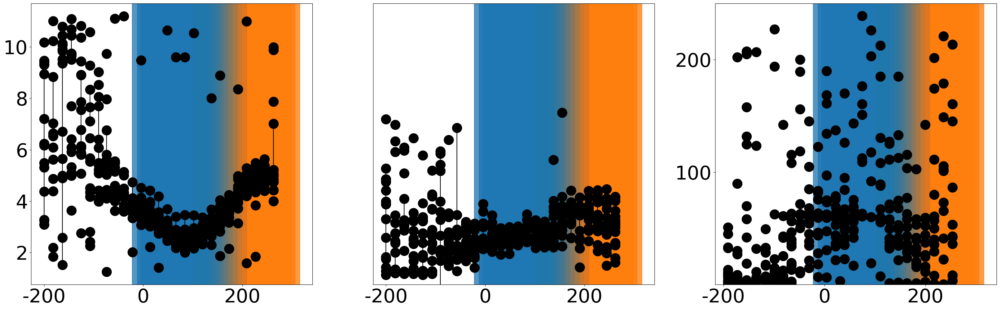

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
890  ACSF             470.905470          Neighbor               28.318103
891  ACSF             452.895157          Neighbor              230.710121
892  ACSF             435.130477          Neighbor               62.757864
893  ACSF             416.993454              None               31.551524
894  ACSF             398.882880              None               45.680315
895  ACSF             381.615721              Home               86.671713
896  ACSF             362.894631              Home             -936.496559
897  ACSF             345.101196              None              -66.649395
898  ACSF             327.305808              Home              -21.848482
899  ACSF             309.805173              Home              -39.880704
900  ACSF             292.855874              None              -38.940916
901  ACSF             274.125294              None              -52.526028
902  ACSF             256

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5152  ACSF             470.905470          Neighbor              -48.676522
5153  ACSF             452.895157          Neighbor              -81.489355
5154  ACSF             435.130477          Neighbor              -50.102273
5155  ACSF             416.993454              None               86.653467
5156  ACSF             398.882880              None              -16.047546
5157  ACSF             381.615721              Home              -14.799281
5158  ACSF             362.894631              Home              -10.902840
5159  ACSF             345.101196              None                8.992111
5160  ACSF             327.305808              Home              -55.734504
5161  ACSF             309.805173              Home                6.731255
5162  ACSF             292.855874              None              -17.587399
5163  ACSF             274.125294              None               -4.393612
5164  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5179  ACSF             470.905470          Neighbor               24.979630
5180  ACSF             452.895157          Neighbor               54.326237
5181  ACSF             435.130477          Neighbor              -61.690554
5182  ACSF             416.993454              None               15.067034
5183  ACSF             398.882880              None               80.687659
5184  ACSF             381.615721              Home              199.160531
5185  ACSF             362.894631              Home                     NaN
5186  ACSF             345.101196              None              -91.728807
5187  ACSF             327.305808              Home              -24.579542
5188  ACSF             309.805173              Home             -110.060385
5189  ACSF             292.855874              None              -44.810001
5190  ACSF             274.125294              None             -474.153876
5191  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5206  ACSF             470.905470          Neighbor              643.225474
5207  ACSF             452.895157          Neighbor             -772.377363
5208  ACSF             435.130477          Neighbor               95.963084
5209  ACSF             416.993454              None              119.148518
5210  ACSF             398.882880              None               43.167898
5211  ACSF             381.615721              Home               66.861035
5212  ACSF             362.894631              Home              126.194572
5213  ACSF             345.101196              None              -55.610589
5214  ACSF             327.305808              Home              -51.930665
5215  ACSF             309.805173              Home              -26.359719
5216  ACSF             292.855874              None              -68.862428
5217  ACSF             274.125294              None               42.273960
5218  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5233  ACSF             470.905470          Neighbor               73.812759
5234  ACSF             452.895157          Neighbor               46.626455
5235  ACSF             435.130477          Neighbor               32.797510
5236  ACSF             416.993454              None               36.293737
5237  ACSF             398.882880              None               50.195230
5238  ACSF             381.615721              Home              134.684100
5239  ACSF             362.894631              Home               83.931295
5240  ACSF             345.101196              None              -30.212884
5241  ACSF             327.305808              Home              -35.001268
5242  ACSF             309.805173              Home              -39.325521
5243  ACSF             292.855874              None             1440.813881
5244  ACSF             274.125294              None              -51.447781
5245  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5260  ACSF             470.905470          Neighbor                3.084486
5261  ACSF             452.895157          Neighbor              -19.651194
5262  ACSF             435.130477          Neighbor               -4.791816
5263  ACSF             416.993454              None               77.066275
5264  ACSF             398.882880              None             -292.663713
5265  ACSF             381.615721              Home               34.927407
5266  ACSF             362.894631              Home              113.333978
5267  ACSF             345.101196              None              -59.516350
5268  ACSF             327.305808              Home              -44.644475
5269  ACSF             309.805173              Home               89.206839
5270  ACSF             292.855874              None              720.406940
5271  ACSF             274.125294              None               94.320932
5272  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5287  ACSF             470.905470          Neighbor              222.349546
5288  ACSF             452.895157          Neighbor              612.575150
5289  ACSF             435.130477          Neighbor               77.508644
5290  ACSF             416.993454              None               98.427036
5291  ACSF             398.882880              None               50.341572
5292  ACSF             381.615721              Home               54.900557
5293  ACSF             362.894631              Home                     NaN
5294  ACSF             345.101196              None              -55.960341
5295  ACSF             327.305808              Home              -69.723642
5296  ACSF             309.805173              Home             -121.937405
5297  ACSF             292.855874              None              -82.878675
5298  ACSF             274.125294              None              -36.397704
5299  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5314  ACSF             470.905470          Neighbor               35.523300
5315  ACSF             452.895157          Neighbor               41.996878
5316  ACSF             435.130477          Neighbor             -103.640130
5317  ACSF             416.993454              None               30.285242
5318  ACSF             398.882880              None               79.940551
5319  ACSF             381.615721              Home               60.003493
5320  ACSF             362.894631              Home             -107.838998
5321  ACSF             345.101196              None              -83.156021
5322  ACSF             327.305808              Home              -30.173507
5323  ACSF             309.805173              Home             -143.638130
5324  ACSF             292.855874              None             -201.404091
5325  ACSF             274.125294              None              -87.718467
5326  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5341  ACSF             470.905470          Neighbor               34.436545
5342  ACSF             452.895157          Neighbor             -493.463315
5343  ACSF             435.130477          Neighbor               27.070183
5344  ACSF             416.993454              None               72.442299
5345  ACSF             398.882880              None               30.779250
5346  ACSF             381.615721              Home              152.203983
5347  ACSF             362.894631              Home             -301.583638
5348  ACSF             345.101196              None              -47.202622
5349  ACSF             327.305808              Home             -119.051933
5350  ACSF             309.805173              Home              -46.821269
5351  ACSF             292.855874              None             -205.830554
5352  ACSF             274.125294              None              -69.069659
5353  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5368  ACSF             470.905470          Neighbor               95.292663
5369  ACSF             452.895157          Neighbor             -507.562267
5370  ACSF             435.130477          Neighbor               57.577850
5371  ACSF             416.993454              None               47.785157
5372  ACSF             398.882880              None               44.048875
5373  ACSF             381.615721              Home              520.030276
5374  ACSF             362.894631              Home             -539.194988
5375  ACSF             345.101196              None              -66.899957
5376  ACSF             327.305808              Home              -38.632747
5377  ACSF             309.805173              Home              -64.939844
5378  ACSF             292.855874              None             1560.881704
5379  ACSF             274.125294              None              -73.404575
5380  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5395  ACSF             470.905470          Neighbor              -27.966325
5396  ACSF             452.895157          Neighbor               37.958717
5397  ACSF             435.130477          Neighbor              100.204546
5398  ACSF             416.993454              None               34.828028
5399  ACSF             398.882880              None               35.529134
5400  ACSF             381.615721              Home              134.684100
5401  ACSF             362.894631              Home             -539.194988
5402  ACSF             345.101196              None              -52.962466
5403  ACSF             327.305808              Home              -38.976914
5404  ACSF             309.805173              Home             -353.110403
5405  ACSF             292.855874              None             -210.455960
5406  ACSF             274.125294              None              -41.572733
5407  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5422  ACSF             470.905470          Neighbor               34.436545
5423  ACSF             452.895157          Neighbor               26.086166
5424  ACSF             435.130477          Neighbor             2267.127850
5425  ACSF             416.993454              None               35.650738
5426  ACSF             398.882880              None               39.512950
5427  ACSF             381.615721              Home               66.152261
5428  ACSF             362.894631              Home                     NaN
5429  ACSF             345.101196              None              -23.140947
5430  ACSF             327.305808              Home              -16.795234
5431  ACSF             309.805173              Home             -136.687898
5432  ACSF             292.855874              None              -60.226947
5433  ACSF             274.125294              None              -53.162707
5434  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5449  ACSF             470.905470          Neighbor               34.305359
5450  ACSF             452.895157          Neighbor               28.606569
5451  ACSF             435.130477          Neighbor              159.096691
5452  ACSF             416.993454              None               45.733774
5453  ACSF             398.882880              None               28.682988
5454  ACSF             381.615721              Home              174.963457
5455  ACSF             362.894631              Home              254.191923
5456  ACSF             345.101196              None             -121.057065
5457  ACSF             327.305808              Home              -38.210992
5458  ACSF             309.805173              Home              -81.097126
5459  ACSF             292.855874              None              -33.627613
5460  ACSF             274.125294              None               19.623818
5461  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5476  ACSF             470.905470          Neighbor               47.395561
5477  ACSF             452.895157          Neighbor              139.879365
5478  ACSF             435.130477          Neighbor               40.126157
5479  ACSF             416.993454              None               34.962499
5480  ACSF             398.882880              None               35.239100
5481  ACSF             381.615721              Home               40.875742
5482  ACSF             362.894631              Home             -105.913301
5483  ACSF             345.101196              None              -73.232052
5484  ACSF             327.305808              Home              -49.159085
5485  ACSF             309.805173              Home              -24.352442
5486  ACSF             292.855874              None              114.210856
5487  ACSF             274.125294              None              797.440610
5488  ACSF  

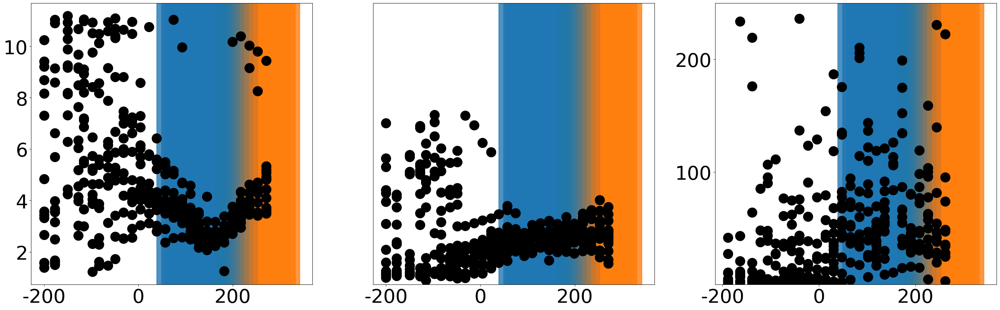

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
917   ACSF             453.013476              None               37.209179
918   ACSF             434.446096              None               26.054825
919   ACSF             417.171747              None              -56.425850
920   ACSF             398.664068          Neighbor              -14.095145
921   ACSF             380.777329          Neighbor                8.778165
922   ACSF             362.430964          Neighbor              730.388222
923   ACSF             344.901647          Neighbor               -4.240269
924   ACSF             327.715838              None              159.553489
925   ACSF             309.207633              None               44.724999
926   ACSF             291.049284              Home               37.145822
927   ACSF             272.736394              Home               74.835775
928   ACSF             256.347359              Home             -105.980864
929   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5529  ACSF             453.013476              None               -3.917995
5530  ACSF             434.446096              None             -493.552826
5531  ACSF             417.171747              None              -71.458219
5532  ACSF             398.664068          Neighbor               63.653876
5533  ACSF             380.777329          Neighbor               46.682862
5534  ACSF             362.430964          Neighbor               98.479311
5535  ACSF             344.901647          Neighbor             -188.855041
5536  ACSF             327.715838              None              841.282033
5537  ACSF             309.207633              None               58.955680
5538  ACSF             291.049284              Home               69.896527
5539  ACSF             272.736394              Home               89.070841
5540  ACSF             256.347359              Home             -138.407845
5541  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5555  ACSF             453.013476              None             -331.560359
5556  ACSF             434.446096              None              140.441861
5557  ACSF             417.171747              None             1682.516257
5558  ACSF             398.664068          Neighbor               23.566191
5559  ACSF             380.777329          Neighbor              -87.781649
5560  ACSF             362.430964          Neighbor               65.899689
5561  ACSF             344.901647          Neighbor               51.454517
5562  ACSF             327.715838              None              362.905975
5563  ACSF             309.207633              None               89.892819
5564  ACSF             291.049284              Home               57.227782
5565  ACSF             272.736394              Home               65.556139
5566  ACSF             256.347359              Home             -162.689923
5567  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5581  ACSF             453.013476              None              -12.403060
5582  ACSF             434.446096              None                9.776089
5583  ACSF             417.171747              None              212.731940
5584  ACSF             398.664068          Neighbor               21.813097
5585  ACSF             380.777329          Neighbor             -244.618195
5586  ACSF             362.430964          Neighbor             -531.191434
5587  ACSF             344.901647          Neighbor               64.366325
5588  ACSF             327.715838              None              131.263863
5589  ACSF             309.207633              None              114.926262
5590  ACSF             291.049284              Home               72.382965
5591  ACSF             272.736394              Home               71.881731
5592  ACSF             256.347359              Home             -174.968408
5593  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5607  ACSF             453.013476              None               26.262207
5608  ACSF             434.446096              None               11.751258
5609  ACSF             417.171747              None              881.318039
5610  ACSF             398.664068          Neighbor               56.603605
5611  ACSF             380.777329          Neighbor             -125.660032
5612  ACSF             362.430964          Neighbor              254.048077
5613  ACSF             344.901647          Neighbor               46.700567
5614  ACSF             327.715838              None              103.978678
5615  ACSF             309.207633              None               56.392390
5616  ACSF             291.049284              Home               68.077659
5617  ACSF             272.736394              Home               68.573367
5618  ACSF             256.347359              Home             -130.610220
5619  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5633  ACSF             453.013476              None             -146.199843
5634  ACSF             434.446096              None              142.763214
5635  ACSF             417.171747              None              -98.971545
5636  ACSF             398.664068          Neighbor              -20.418652
5637  ACSF             380.777329          Neighbor              -59.955440
5638  ACSF             362.430964          Neighbor               41.148632
5639  ACSF             344.901647          Neighbor               94.427521
5640  ACSF             327.715838              None             1233.880315
5641  ACSF             309.207633              None               53.406910
5642  ACSF             291.049284              Home               42.489304
5643  ACSF             272.736394              Home               69.445063
5644  ACSF             256.347359              Home             -103.036951
5645  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5659  ACSF             453.013476              None              343.840372
5660  ACSF             434.446096              None              146.392787
5661  ACSF             417.171747              None               86.890511
5662  ACSF             398.664068          Neighbor               29.467445
5663  ACSF             380.777329          Neighbor             -166.785133
5664  ACSF             362.430964          Neighbor               30.970525
5665  ACSF             344.901647          Neighbor              133.223324
5666  ACSF             327.715838              None              130.339470
5667  ACSF             309.207633              None               71.772132
5668  ACSF             291.049284              Home               55.159308
5669  ACSF             272.736394              Home               98.137933
5670  ACSF             256.347359              Home              741.866048
5671  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5685  ACSF             453.013476              None               56.607866
5686  ACSF             434.446096              None              218.662644
5687  ACSF             417.171747              None               32.356082
5688  ACSF             398.664068          Neighbor              -42.893859
5689  ACSF             380.777329          Neighbor               41.320641
5690  ACSF             362.430964          Neighbor               57.852532
5691  ACSF             344.901647          Neighbor             1074.113048
5692  ACSF             327.715838              None               88.556003
5693  ACSF             309.207633              None               44.835431
5694  ACSF             291.049284              Home               34.552623
5695  ACSF             272.736394              Home              117.906725
5696  ACSF             256.347359              Home             -125.315211
5697  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5711  ACSF             453.013476              None              -28.921153
5712  ACSF             434.446096              None               14.443436
5713  ACSF             417.171747              None              -22.625524
5714  ACSF             398.664068          Neighbor              111.792120
5715  ACSF             380.777329          Neighbor               44.314890
5716  ACSF             362.430964          Neighbor              194.770193
5717  ACSF             344.901647          Neighbor               42.019092
5718  ACSF             327.715838              None               86.892980
5719  ACSF             309.207633              None               70.655056
5720  ACSF             291.049284              Home               44.448763
5721  ACSF             272.736394              Home               61.845414
5722  ACSF             256.347359              Home              -89.597349
5723  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5737  ACSF             453.013476              None               17.065607
5738  ACSF             434.446096              None               24.677641
5739  ACSF             417.171747              None               12.429603
5740  ACSF             398.664068          Neighbor              -72.123949
5741  ACSF             380.777329          Neighbor              100.253359
5742  ACSF             362.430964          Neighbor               67.943090
5743  ACSF             344.901647          Neighbor               69.578173
5744  ACSF             327.715838              None              165.251828
5745  ACSF             309.207633              None               51.586220
5746  ACSF             291.049284              Home               36.335100
5747  ACSF             272.736394              Home               66.352367
5748  ACSF             256.347359              Home             -132.476080
5749  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5763  ACSF             453.013476              None               -1.867007
5764  ACSF             434.446096              None                1.413382
5765  ACSF             417.171747              None              -82.623566
5766  ACSF             398.664068          Neighbor               36.429204
5767  ACSF             380.777329          Neighbor               89.494462
5768  ACSF             362.430964          Neighbor              114.570702
5769  ACSF             344.901647          Neighbor               93.911523
5770  ACSF             327.715838              None              201.176138
5771  ACSF             309.207633              None               74.115712
5772  ACSF             291.049284              Home               48.065329
5773  ACSF             272.736394              Home              113.027826
5774  ACSF             256.347359              Home             -114.485501
5775  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5789  ACSF             453.013476              None              -29.011531
5790  ACSF             434.446096              None               21.921763
5791  ACSF             417.171747              None              105.157266
5792  ACSF             398.664068          Neighbor             -248.426934
5793  ACSF             380.777329          Neighbor             -168.315272
5794  ACSF             362.430964          Neighbor              180.714612
5795  ACSF             344.901647          Neighbor               95.476715
5796  ACSF             327.715838              None              268.234851
5797  ACSF             309.207633              None               43.441027
5798  ACSF             291.049284              Home               37.373245
5799  ACSF             272.736394              Home               87.175717
5800  ACSF             256.347359              Home              -90.032287
5801  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5815  ACSF             453.013476              None                2.472683
5816  ACSF             434.446096              None               -1.631040
5817  ACSF             417.171747              None               -0.059883
5818  ACSF             398.664068          Neighbor                0.058602
5819  ACSF             380.777329          Neighbor               -0.614598
5820  ACSF             362.430964          Neighbor                0.137376
5821  ACSF             344.901647          Neighbor               -0.037644
5822  ACSF             327.715838              None                0.051752
5823  ACSF             309.207633              None             -789.493454
5824  ACSF             291.049284              Home               96.383632
5825  ACSF             272.736394              Home               -7.009852
5826  ACSF             256.347359              Home                3.818541
5827  ACSF  

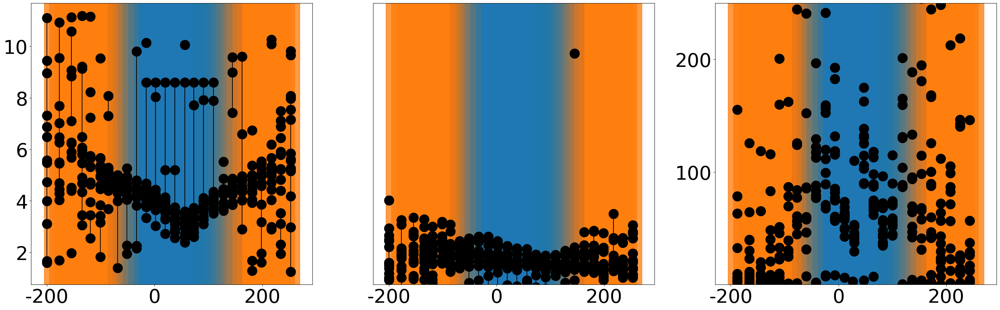

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
943   ACSF             458.705640              None              147.456673
944   ACSF             439.978643              None             -206.724708
945   ACSF             421.373419              None              108.757945
946   ACSF             403.863390              None               37.517763
947   ACSF             385.292097              None               70.152057
948   ACSF             367.333170              None               77.184653
949   ACSF             349.580700              None               63.790140
950   ACSF             332.676313              None               44.813585
951   ACSF             314.885320              Home               45.278282
952   ACSF             296.185390              Home               56.124507
953   ACSF             278.730668              Home             -354.047975
954   ACSF             259.966125              Home              -57.357776
955   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5867  ACSF             458.705640              None               72.305010
5868  ACSF             439.978643              None               49.481978
5869  ACSF             421.373419              None              118.311008
5870  ACSF             403.863390              None             -640.389411
5871  ACSF             385.292097              None               49.747719
5872  ACSF             367.333170              None              169.071144
5873  ACSF             349.580700              None               57.303007
5874  ACSF             332.676313              None               37.692782
5875  ACSF             314.885320              Home               37.250857
5876  ACSF             296.185390              Home               58.770107
5877  ACSF             278.730668              Home             -199.622795
5878  ACSF             259.966125              Home              -46.469000
5879  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5893  ACSF             458.705640              None               92.707908
5894  ACSF             439.978643              None               29.485299
5895  ACSF             421.373419              None             -227.402977
5896  ACSF             403.863390              None             1428.560994
5897  ACSF             385.292097              None              855.186977
5898  ACSF             367.333170              None              113.073058
5899  ACSF             349.580700              None              104.996193
5900  ACSF             332.676313              None               42.359508
5901  ACSF             314.885320              Home               35.892381
5902  ACSF             296.185390              Home               53.215615
5903  ACSF             278.730668              Home             -201.769276
5904  ACSF             259.966125              Home              -41.577527
5905  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5919  ACSF             458.705640              None              567.484772
5920  ACSF             439.978643              None               27.280387
5921  ACSF             421.373419              None               42.500071
5922  ACSF             403.863390              None              238.093499
5923  ACSF             385.292097              None               88.467618
5924  ACSF             367.333170              None               99.732978
5925  ACSF             349.580700              None               78.261051
5926  ACSF             332.676313              None               55.080475
5927  ACSF             314.885320              Home               34.374872
5928  ACSF             296.185390              Home               57.416848
5929  ACSF             278.730668              Home             -152.557258
5930  ACSF             259.966125              Home              -48.956074
5931  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5945  ACSF             458.705640              None               27.458941
5946  ACSF             439.978643              None               87.348468
5947  ACSF             421.373419              None               52.268744
5948  ACSF             403.863390              None              119.814793
5949  ACSF             385.292097              None               59.075416
5950  ACSF             367.333170              None              102.615434
5951  ACSF             349.580700              None               65.775825
5952  ACSF             332.676313              None               37.376036
5953  ACSF             314.885320              Home               35.416535
5954  ACSF             296.185390              Home               53.215615
5955  ACSF             278.730668              Home             -164.601252
5956  ACSF             259.966125              Home              -40.606089
5957  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5971  ACSF             458.705640              None               42.177922
5972  ACSF             439.978643              None              -57.071238
5973  ACSF             421.373419              None               54.378973
5974  ACSF             403.863390              None               35.921263
5975  ACSF             385.292097              None               70.152057
5976  ACSF             367.333170              None              132.481120
5977  ACSF             349.580700              None               71.628759
5978  ACSF             332.676313              None               33.759001
5979  ACSF             314.885320              Home               33.572586
5980  ACSF             296.185390              Home               55.236461
5981  ACSF             278.730668              Home             -169.049934
5982  ACSF             259.966125              Home              -38.196497
5983  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5997  ACSF             458.705640              None              -14.122924
5998  ACSF             439.978643              None               33.105380
5999  ACSF             421.373419              None              132.651737
6000  ACSF             403.863390              None             -562.766452
6001  ACSF             385.292097              None               97.075278
6002  ACSF             367.333170              None              129.580074
6003  ACSF             349.580700              None               59.732817
6004  ACSF             332.676313              None               33.887606
6005  ACSF             314.885320              Home               32.922413
6006  ACSF             296.185390              Home               63.703364
6007  ACSF             278.730668              Home             -134.032448
6008  ACSF             259.966125              Home              -52.190409
6009  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6023  ACSF             458.705640              None               14.449844
6024  ACSF             439.978643              None               28.890099
6025  ACSF             421.373419              None              -47.324403
6026  ACSF             403.863390              None               73.115326
6027  ACSF             385.292097              None              352.135814
6028  ACSF             367.333170              None              103.212035
6029  ACSF             349.580700              None               61.920832
6030  ACSF             332.676313              None               39.979760
6031  ACSF             314.885320              Home               28.636953
6032  ACSF             296.185390              Home               55.944621
6033  ACSF             278.730668              Home             -151.326957
6034  ACSF             259.966125              Home              -37.056303
6035  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6049  ACSF             458.705640              None              -34.361463
6050  ACSF             439.978643              None               -7.807480
6051  ACSF             421.373419              None               23.662202
6052  ACSF             403.863390              None               13.133871
6053  ACSF             385.292097              None              -37.259184
6054  ACSF             367.333170              None             -161.386092
6055  ACSF             349.580700              None              -38.860660
6056  ACSF             332.676313              None               44.926751
6057  ACSF             314.885320              Home              -46.633243
6058  ACSF             296.185390              Home               52.416582
6059  ACSF             278.730668              Home              -29.784988
6060  ACSF             259.966125              Home             -965.522562
6061  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6075  ACSF             458.705640              None               31.056381
6076  ACSF             439.978643              None               19.646488
6077  ACSF             421.373419              None               25.674530
6078  ACSF             403.863390              None               55.769648
6079  ACSF             385.292097              None             -304.388585
6080  ACSF             367.333170              None               72.756025
6081  ACSF             349.580700              None              109.768747
6082  ACSF             332.676313              None               32.946284
6083  ACSF             314.885320              Home               29.541754
6084  ACSF             296.185390              Home               42.161164
6085  ACSF             278.730668              Home              -75.663479
6086  ACSF             259.966125              Home              -25.520420
6087  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6101  ACSF             458.705640              None              249.693300
6102  ACSF             439.978643              None               61.000733
6103  ACSF             421.373419              None               48.104476
6104  ACSF             403.863390              None               98.783473
6105  ACSF             385.292097              None               51.311219
6106  ACSF             367.333170              None               91.038308
6107  ACSF             349.580700              None               46.956631
6108  ACSF             332.676313              None               29.951167
6109  ACSF             314.885320              Home               22.235351
6110  ACSF             296.185390              Home               53.053866
6111  ACSF             278.730668              Home             -147.752305
6112  ACSF             259.966125              Home              -22.988632
6113  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6127  ACSF             458.705640              None               50.613507
6128  ACSF             439.978643              None               59.064202
6129  ACSF             421.373419              None                7.550681
6130  ACSF             403.863390              None              -86.378107
6131  ACSF             385.292097              None               39.126202
6132  ACSF             367.333170              None              155.723422
6133  ACSF             349.580700              None               55.606537
6134  ACSF             332.676313              None               23.045328
6135  ACSF             314.885320              Home               26.044471
6136  ACSF             296.185390              Home               43.419706
6137  ACSF             278.730668              Home             -101.981210
6138  ACSF             259.966125              Home              -22.867640
6139  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6153  ACSF             458.705640              None                3.036154
6154  ACSF             439.978643              None               -6.114106
6155  ACSF             421.373419              None                6.258052
6156  ACSF             403.863390              None               -3.606076
6157  ACSF             385.292097              None               39.732138
6158  ACSF             367.333170              None             -233.585133
6159  ACSF             349.580700              None               36.909142
6160  ACSF             332.676313              None               21.829440
6161  ACSF             314.885320              Home               23.912955
6162  ACSF             296.185390              Home               44.870750
6163  ACSF             278.730668              Home             -106.014365
6164  ACSF             259.966125              Home              -19.771793
6165  ACSF  

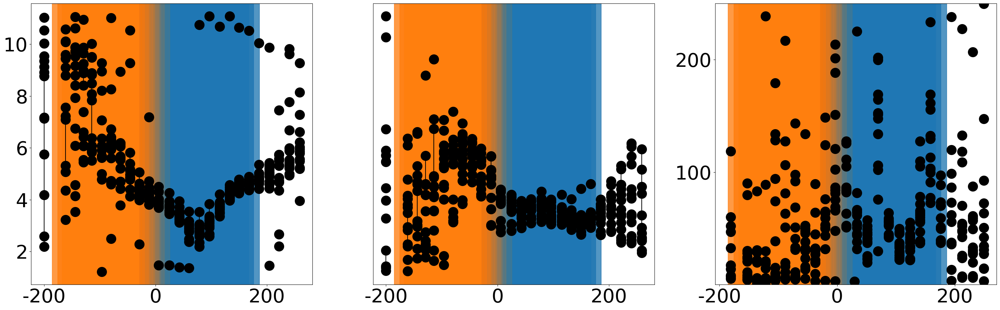

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1048  ACSF             439.063977              None              683.147273
1049  ACSF             421.438778              None              -67.729222
1050  ACSF             403.856272              None              123.426494
1051  ACSF             385.687892              None              275.355560
1052  ACSF             367.183998          Neighbor              164.866120
1053  ACSF             350.351167              None              198.799623
1054  ACSF             332.121242          Neighbor               64.298706
1055  ACSF             313.693233          Neighbor               66.281214
1056  ACSF             296.069058          Neighbor               64.805727
1057  ACSF             277.878090              None              223.002111
1058  ACSF             260.127122              None              222.889367
1059  ACSF             242.362840              None              251.034003
1060  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7821  ACSF             439.063977              None               83.531752
7822  ACSF             421.438778              None             -408.895488
7823  ACSF             403.856272              None               91.759494
7824  ACSF             385.687892              None               78.075501
7825  ACSF             367.183998          Neighbor              323.708285
7826  ACSF             350.351167              None              102.415311
7827  ACSF             332.121242          Neighbor              101.252798
7828  ACSF             313.693233          Neighbor               60.564174
7829  ACSF             296.069058          Neighbor               47.620334
7830  ACSF             277.878090              None              126.792629
7831  ACSF             260.127122              None                     NaN
7832  ACSF             242.362840              None              878.619010
7833  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7847  ACSF             439.063977              None             -288.937699
7848  ACSF             421.438778              None              222.563367
7849  ACSF             403.856272              None              171.399810
7850  ACSF             385.687892              None                     NaN
7851  ACSF             367.183998          Neighbor              141.452360
7852  ACSF             350.351167              None              130.213753
7853  ACSF             332.121242          Neighbor               65.580104
7854  ACSF             313.693233          Neighbor               59.141526
7855  ACSF             296.069058          Neighbor               68.905181
7856  ACSF             277.878090              None              121.581973
7857  ACSF             260.127122              None              161.493478
7858  ACSF             242.362840              None              168.965194
7859  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7873  ACSF             439.063977              None              -33.067917
7874  ACSF             421.438778              None             -147.752151
7875  ACSF             403.856272              None              221.565608
7876  ACSF             385.687892              None              528.682675
7877  ACSF             367.183998          Neighbor              180.998181
7878  ACSF             350.351167              None               84.397803
7879  ACSF             332.121242          Neighbor               60.222252
7880  ACSF             313.693233          Neighbor               51.233066
7881  ACSF             296.069058          Neighbor              110.248289
7882  ACSF             277.878090              None              115.266026
7883  ACSF             260.127122              None              250.201163
7884  ACSF             242.362840              None              191.004133
7885  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7899  ACSF             439.063977              None               58.361588
7900  ACSF             421.438778              None             -303.146655
7901  ACSF             403.856272              None              117.215354
7902  ACSF             385.687892              None               84.880246
7903  ACSF             367.183998          Neighbor             -400.781686
7904  ACSF             350.351167              None               70.385813
7905  ACSF             332.121242          Neighbor               64.887356
7906  ACSF             313.693233          Neighbor               40.608697
7907  ACSF             296.069058          Neighbor               71.617983
7908  ACSF             277.878090              None              161.372437
7909  ACSF             260.127122              None              286.520686
7910  ACSF             242.362840              None              148.918476
7911  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7925  ACSF             439.063977              None               55.078749
7926  ACSF             421.438778              None              133.200803
7927  ACSF             403.856272              None              394.964779
7928  ACSF             385.687892              None                     NaN
7929  ACSF             367.183998          Neighbor               79.027375
7930  ACSF             350.351167              None               73.212552
7931  ACSF             332.121242          Neighbor               51.047117
7932  ACSF             313.693233          Neighbor               63.169085
7933  ACSF             296.069058          Neighbor               75.481194
7934  ACSF             277.878090              None              101.434103
7935  ACSF             260.127122              None              154.472022
7936  ACSF             242.362840              None              274.568441
7937  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7951  ACSF             439.063977              None             -255.437676
7952  ACSF             421.438778              None               60.420983
7953  ACSF             403.856272              None               92.225278
7954  ACSF             385.687892              None              110.142224
7955  ACSF             367.183998          Neighbor               86.767169
7956  ACSF             350.351167              None               70.933562
7957  ACSF             332.121242          Neighbor               63.109621
7958  ACSF             313.693233          Neighbor               50.499068
7959  ACSF             296.069058          Neighbor               46.883937
7960  ACSF             277.878090              None              170.682385
7961  ACSF             260.127122              None              166.021332
7962  ACSF             242.362840              None              204.330002
7963  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7977  ACSF             439.063977              None             -927.642086
7978  ACSF             421.438778              None               77.455974
7979  ACSF             403.856272              None               94.136683
7980  ACSF             385.687892              None              207.908917
7981  ACSF             367.183998          Neighbor               96.187605
7982  ACSF             350.351167              None               55.242198
7983  ACSF             332.121242          Neighbor               52.203992
7984  ACSF             313.693233          Neighbor               47.632905
7985  ACSF             296.069058          Neighbor               61.043516
7986  ACSF             277.878090              None               67.494175
7987  ACSF             260.127122              None              291.217747
7988  ACSF             242.362840              None              219.654753
7989  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8003  ACSF             439.063977              None              110.850312
8004  ACSF             421.438778              None               36.177996
8005  ACSF             403.856272              None                     NaN
8006  ACSF             385.687892              None              105.135759
8007  ACSF             367.183998          Neighbor              112.218872
8008  ACSF             350.351167              None               51.351903
8009  ACSF             332.121242          Neighbor               68.251886
8010  ACSF             313.693233          Neighbor               50.644180
8011  ACSF             296.069058          Neighbor               58.870446
8012  ACSF             277.878090              None               65.744326
8013  ACSF             260.127122              None              197.380917
8014  ACSF             242.362840              None              254.672177
8015  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8029  ACSF             439.063977              None              -19.199564
8030  ACSF             421.438778              None               45.315737
8031  ACSF             403.856272              None              -34.805325
8032  ACSF             385.687892              None               19.214843
8033  ACSF             367.183998          Neighbor               -5.161862
8034  ACSF             350.351167              None               63.298352
8035  ACSF             332.121242          Neighbor               42.169357
8036  ACSF             313.693233          Neighbor                     NaN
8037  ACSF             296.069058          Neighbor             1299.354836
8038  ACSF             277.878090              None              493.082445
8039  ACSF             260.127122              None              444.107064
8040  ACSF             242.362840              None              270.344311
8041  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8055  ACSF             439.063977              None               33.571809
8056  ACSF             421.438778              None               42.675985
8057  ACSF             403.856272              None             -293.038385
8058  ACSF             385.687892              None              117.859195
8059  ACSF             367.183998          Neighbor              107.902762
8060  ACSF             350.351167              None               46.743399
8061  ACSF             332.121242          Neighbor               43.360022
8062  ACSF             313.693233          Neighbor               58.358194
8063  ACSF             296.069058          Neighbor               62.944525
8064  ACSF             277.878090              None               78.198097
8065  ACSF             260.127122              None              240.057872
8066  ACSF             242.362840              None              204.330002
8067  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8081  ACSF             439.063977              None               52.300296
8082  ACSF             421.438778              None              156.986661
8083  ACSF             403.856272              None              135.584924
8084  ACSF             385.687892              None               68.280050
8085  ACSF             367.183998          Neighbor              153.025735
8086  ACSF             350.351167              None               36.314593
8087  ACSF             332.121242          Neighbor               63.326492
8088  ACSF             313.693233          Neighbor               66.256296
8089  ACSF             296.069058          Neighbor               55.124145
8090  ACSF             277.878090              None              137.604403
8091  ACSF             260.127122              None              261.239449
8092  ACSF             242.362840              None              278.926670
8093  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8107  ACSF             439.063977              None               31.814440
8108  ACSF             421.438778              None              162.800981
8109  ACSF             403.856272              None              159.371753
8110  ACSF             385.687892              None               74.914549
8111  ACSF             367.183998          Neighbor              118.541062
8112  ACSF             350.351167              None               84.790351
8113  ACSF             332.121242          Neighbor               45.166689
8114  ACSF             313.693233          Neighbor               44.060437
8115  ACSF             296.069058          Neighbor               50.955092
8116  ACSF             277.878090              None              213.867085
8117  ACSF             260.127122              None              444.107064
8118  ACSF             242.362840              None              216.942965
8119  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8133  ACSF             439.063977              None               70.500799
8134  ACSF             421.438778              None               90.166697
8135  ACSF             403.856272              None               52.207988
8136  ACSF             385.687892              None              110.801758
8137  ACSF             367.183998          Neighbor               38.169684
8138  ACSF             350.351167              None              101.843159
8139  ACSF             332.121242          Neighbor               40.235828
8140  ACSF             313.693233          Neighbor               57.974259
8141  ACSF             296.069058          Neighbor               63.163082
8142  ACSF             277.878090              None              197.232978
8143  ACSF             260.127122              None              291.217747
8144  ACSF             242.362840              None              147.667061
8145  ACSF  

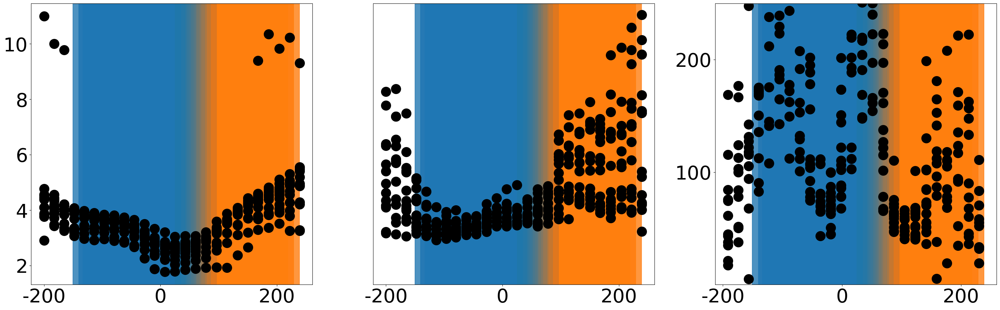

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1074  ACSF             395.166720              None              101.279220
1075  ACSF             377.544136              Home               83.082315
1076  ACSF             359.490349              Home               58.704520
1077  ACSF             341.972920              Home               50.380231
1078  ACSF             324.148394              Home               51.332454
1079  ACSF             306.212835              Home              294.692137
1080  ACSF             288.914406              Home              -74.675330
1081  ACSF             271.477717              None              -56.045842
1082  ACSF             254.473408              None             -106.265182
1083  ACSF             236.387074              None              -69.690609
1084  ACSF             218.790195              None              -62.183464
1085  ACSF             201.409917              None              -67.418648
1086  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8159  ACSF             395.166720              None              114.432365
8160  ACSF             377.544136              Home               82.815537
8161  ACSF             359.490349              Home               49.624444
8162  ACSF             341.972920              Home               44.339617
8163  ACSF             324.148394              Home               59.586577
8164  ACSF             306.212835              Home              393.146101
8165  ACSF             288.914406              Home              -71.170162
8166  ACSF             271.477717              None             -100.617211
8167  ACSF             254.473408              None              -89.095241
8168  ACSF             236.387074              None              -57.884470
8169  ACSF             218.790195              None              -60.770204
8170  ACSF             201.409917              None              -61.745036
8171  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8182  ACSF             395.166720              None               88.112921
8183  ACSF             377.544136              Home               58.807124
8184  ACSF             359.490349              Home               39.632192
8185  ACSF             341.972920              Home               38.497896
8186  ACSF             324.148394              Home               58.612940
8187  ACSF             306.212835              Home              786.292202
8188  ACSF             288.914406              Home              -97.411674
8189  ACSF             271.477717              None              -50.308605
8190  ACSF             254.473408              None              -50.662000
8191  ACSF             236.387074              None              -61.100273
8192  ACSF             218.790195              None              -81.982445
8193  ACSF             201.409917              None              -76.241697
8194  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8205  ACSF             395.166720              None             -263.023646
8206  ACSF             377.544136              Home               38.412313
8207  ACSF             359.490349              Home               65.363540
8208  ACSF             341.972920              Home               39.610057
8209  ACSF             324.148394              Home               49.004261
8210  ACSF             306.212835              Home              270.287944
8211  ACSF             288.914406              Home             -130.124550
8212  ACSF             271.477717              None              -38.211929
8213  ACSF             254.473408              None              -90.886100
8214  ACSF             236.387074              None              -25.392321
8215  ACSF             218.790195              None              -46.847111
8216  ACSF             201.409917              None              -60.676783
8217  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8228  ACSF             395.166720              None               47.500227
8229  ACSF             377.544136              Home               67.871380
8230  ACSF             359.490349              Home               34.483128
8231  ACSF             341.972920              Home               50.494408
8232  ACSF             324.148394              Home               37.133664
8233  ACSF             306.212835              Home              254.388654
8234  ACSF             288.914406              Home              -61.832233
8235  ACSF             271.477717              None              -37.787352
8236  ACSF             254.473408              None              -33.555350
8237  ACSF             236.387074              None              -28.989916
8238  ACSF             218.790195              None              -35.325769
8239  ACSF             201.409917              None             -273.993598
8240  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8251  ACSF             395.166720              None               45.186114
8252  ACSF             377.544136              Home               36.179934
8253  ACSF             359.490349              Home               41.907724
8254  ACSF             341.972920              Home               39.698276
8255  ACSF             324.148394              Home              161.581618
8256  ACSF             306.212835              Home             -910.443602
8257  ACSF             288.914406              Home             -425.285114
8258  ACSF             271.477717              None              -45.710507
8259  ACSF             254.473408              None              -22.664579
8260  ACSF             236.387074              None              -66.908284
8261  ACSF             218.790195              None              -30.980888
8262  ACSF             201.409917              None             -124.365888
8263  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8274  ACSF             395.166720              None               24.961168
8275  ACSF             377.544136              Home               39.162228
8276  ACSF             359.490349              Home               34.895277
8277  ACSF             341.972920              Home               42.540635
8278  ACSF             324.148394              Home               64.516401
8279  ACSF             306.212835              Home              153.083438
8280  ACSF             288.914406              Home              -57.737383
8281  ACSF             271.477717              None              -40.010138
8282  ACSF             254.473408              None              -48.619177
8283  ACSF             236.387074              None              -35.838857
8284  ACSF             218.790195              None              -12.836247
8285  ACSF             201.409917              None              -31.369571
8286  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8297  ACSF             395.166720              None               23.187611
8298  ACSF             377.544136              Home               52.028205
8299  ACSF             359.490349              Home               76.162734
8300  ACSF             341.972920              Home               45.587023
8301  ACSF             324.148394              Home               70.891540
8302  ACSF             306.212835              Home             -961.023803
8303  ACSF             288.914406              Home             -232.489195
8304  ACSF             271.477717              None              -79.832435
8305  ACSF             254.473408              None              -34.450160
8306  ACSF             236.387074              None              -25.764098
8307  ACSF             218.790195              None              -23.486863
8308  ACSF             201.409917              None              -25.749765
8309  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8320  ACSF             395.166720              None               35.457916
8321  ACSF             377.544136              Home               28.077429
8322  ACSF             359.490349              Home               46.963616
8323  ACSF             341.972920              Home               45.355028
8324  ACSF             324.148394              Home              779.806938
8325  ACSF             306.212835              Home              142.962219
8326  ACSF             288.914406              Home              -91.772051
8327  ACSF             271.477717              None              -53.981932
8328  ACSF             254.473408              None              -40.643447
8329  ACSF             236.387074              None              -18.029589
8330  ACSF             218.790195              None             -104.073522
8331  ACSF             201.409917              None              -19.440787
8332  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8343  ACSF             395.166720              None              166.250795
8344  ACSF             377.544136              Home               24.496319
8345  ACSF             359.490349              Home               46.342404
8346  ACSF             341.972920              Home               34.678066
8347  ACSF             324.148394              Home              122.846298
8348  ACSF             306.212835              Home             -961.023803
8349  ACSF             288.914406              Home              -77.153494
8350  ACSF             271.477717              None              -69.123206
8351  ACSF             254.473408              None              -62.366669
8352  ACSF             236.387074              None              -43.024153
8353  ACSF             218.790195              None              -29.408254
8354  ACSF             201.409917              None              -10.171456
8355  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8366  ACSF             395.166720              None               46.993558
8367  ACSF             377.544136              Home               18.162764
8368  ACSF             359.490349              Home               31.907885
8369  ACSF             341.972920              Home               35.156856
8370  ACSF             324.148394              Home              143.484477
8371  ACSF             306.212835              Home             -786.292202
8372  ACSF             288.914406              Home             -484.352490
8373  ACSF             271.477717              None              -54.852608
8374  ACSF             254.473408              None             -220.565047
8375  ACSF             236.387074              None              -24.238125
8376  ACSF             218.790195              None              -18.411312
8377  ACSF             201.409917              None              -12.922321
8378  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8389  ACSF             395.166720              None               16.944793
8390  ACSF             377.544136              Home              859.704146
8391  ACSF             359.490349              Home               39.101404
8392  ACSF             341.972920              Home              176.480454
8393  ACSF             324.148394              Home              256.222280
8394  ACSF             306.212835              Home              118.482387
8395  ACSF             288.914406              Home             -260.249099
8396  ACSF             271.477717              None              -48.307695
8397  ACSF             254.473408              None               83.347161
8398  ACSF             236.387074              None              -31.035060
8399  ACSF             218.790195              None                     NaN
8400  ACSF             201.409917              None                5.749374
8401  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8412  ACSF             395.166720              None              102.456885
8413  ACSF             377.544136              Home               33.619715
8414  ACSF             359.490349              Home               13.526972
8415  ACSF             341.972920              Home               67.009496
8416  ACSF             324.148394              Home              127.202550
8417  ACSF             306.212835              Home               86.061833
8418  ACSF             288.914406              Home              -91.772051
8419  ACSF             271.477717              None              -23.949730
8420  ACSF             254.473408              None              -34.384665
8421  ACSF             236.387074              None              -51.908197
8422  ACSF             218.790195              None              -28.918932
8423  ACSF             201.409917              None             -337.222889
8424  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8435  ACSF             395.166720              None              -30.383766
8436  ACSF             377.544136              Home               17.477045
8437  ACSF             359.490349              Home              -47.089862
8438  ACSF             341.972920              Home              660.167625
8439  ACSF             324.148394              Home              128.111140
8440  ACSF             306.212835              Home              -16.350121
8441  ACSF             288.914406              Home               16.543349
8442  ACSF             271.477717              None               -6.909512
8443  ACSF             254.473408              None               28.527341
8444  ACSF             236.387074              None             -181.411121
8445  ACSF             218.790195              None               73.026379
8446  ACSF             201.409917              None               14.923907
8447  ACSF  

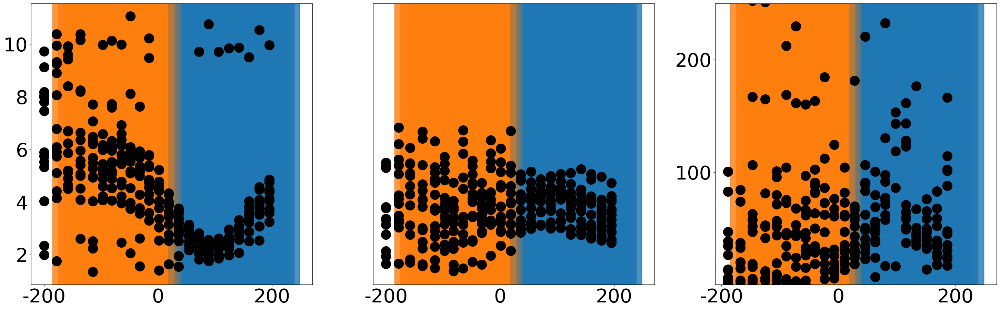

No ROI file found for  1/15/2025 1 1
      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1127  ACSF             430.427419              Home               30.489172
1128  ACSF             412.265019              Home               45.434066
1129  ACSF             394.123196              Home               63.925904
1130  ACSF             376.377365              None              126.343687
1131  ACSF             358.411293              Home              266.580623
1132  ACSF             340.577049              None             2319.458157
1133  ACSF             322.949167              Home             -462.113720
1134  ACSF             305.157789              Home             -148.042895
1135  ACSF             287.466663              Home             -110.294789
1136  ACSF             270.006998              Home              -95.442460
1137  ACSF             251.710678              None              -89.840422
1138  ACSF             234.281637              None

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8848  ACSF             430.427419              Home               43.038863
8849  ACSF             412.265019              Home               73.448674
8850  ACSF             394.123196              Home               82.924444
8851  ACSF             376.377365              None              140.359940
8852  ACSF             358.411293              Home              495.395658
8853  ACSF             340.577049              None             2518.268856
8854  ACSF             322.949167              Home             -225.207319
8855  ACSF             305.157789              Home             -126.365185
8856  ACSF             287.466663              Home             -205.407825
8857  ACSF             270.006998              Home             -120.370523
8858  ACSF             251.710678              None             -157.018395
8859  ACSF             234.281637              None             -144.552477
8860  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8873  ACSF             430.427419              Home               57.294637
8874  ACSF             412.265019              Home               88.930503
8875  ACSF             394.123196              Home               92.910110
8876  ACSF             376.377365              None              154.879934
8877  ACSF             358.411293              Home              540.431627
8878  ACSF             340.577049              None             2518.268856
8879  ACSF             322.949167              Home             -413.752982
8880  ACSF             305.157789              Home             -132.023328
8881  ACSF             287.466663              Home             -356.319696
8882  ACSF             270.006998              Home             -134.531761
8883  ACSF             251.710678              None              -96.293049
8884  ACSF             234.281637              None             -699.633988
8885  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8898  ACSF             430.427419              Home               45.406000
8899  ACSF             412.265019              Home               72.567290
8900  ACSF             394.123196              Home              100.258932
8901  ACSF             376.377365              None              177.881904
8902  ACSF             358.411293              Home              434.981553
8903  ACSF             340.577049              None                     NaN
8904  ACSF             322.949167              Home             -348.850553
8905  ACSF             305.157789              Home             -134.023681
8906  ACSF             287.466663              Home             -151.823175
8907  ACSF             270.006998              Home             -106.373951
8908  ACSF             251.710678              None              -88.472293
8909  ACSF             234.281637              None             -323.904624
8910  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8923  ACSF             430.427419              Home               56.056790
8924  ACSF             412.265019              Home               81.353464
8925  ACSF             394.123196              Home               86.989368
8926  ACSF             376.377365              None              143.728578
8927  ACSF             358.411293              Home              262.268290
8928  ACSF             340.577049              None                     NaN
8929  ACSF             322.949167              Home             -286.957713
8930  ACSF             305.157789              Home             -143.830292
8931  ACSF             287.466663              Home             -122.955388
8932  ACSF             270.006998              Home             -138.608481
8933  ACSF             251.710678              None             -187.409052
8934  ACSF             234.281637              None             -120.626550
8935  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8948  ACSF             430.427419              Home               47.421410
8949  ACSF             412.265019              Home               72.858725
8950  ACSF             394.123196              Home              106.902597
8951  ACSF             376.377365              None              163.327930
8952  ACSF             358.411293              Home             1371.864899
8953  ACSF             340.577049              None                     NaN
8954  ACSF             322.949167              Home             -335.686381
8955  ACSF             305.157789              Home             -117.940839
8956  ACSF             287.466663              Home             -167.881395
8957  ACSF             270.006998              Home             -151.209253
8958  ACSF             251.710678              None             -165.990874
8959  ACSF             234.281637              None             -265.012874
8960  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8973  ACSF             430.427419              Home               42.835849
8974  ACSF             412.265019              Home               69.776241
8975  ACSF             394.123196              Home               92.426203
8976  ACSF             376.377365              None              264.206945
8977  ACSF             358.411293              Home              324.258976
8978  ACSF             340.577049              None             1602.534726
8979  ACSF             322.949167              Home              773.538183
8980  ACSF             305.157789              Home             -186.222378
8981  ACSF             287.466663              Home             -116.397767
8982  ACSF             270.006998              Home              -99.436519
8983  ACSF             251.710678              None              -69.716167
8984  ACSF             234.281637              None             -291.514162
8985  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8998  ACSF             430.427419              Home               73.830894
8999  ACSF             412.265019              Home               78.197511
9000  ACSF             394.123196              Home               84.503957
9001  ACSF             376.377365              None              289.775360
9002  ACSF             358.411293              Home              356.684874
9003  ACSF             340.577049              None              652.884518
9004  ACSF             322.949167              Home              277.990285
9005  ACSF             305.157789              Home              -75.281387
9006  ACSF             287.466663              Home             -200.685806
9007  ACSF             270.006998              Home             -201.058457
9008  ACSF             251.710678              None              -75.450397
9009  ACSF             234.281637              None                6.843055
9010  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9023  ACSF             430.427419              Home              121.082667
9024  ACSF             412.265019              Home               47.244330
9025  ACSF             394.123196              Home             -188.785436
9026  ACSF             376.377365              None             -280.719880
9027  ACSF             358.411293              Home              148.618697
9028  ACSF             340.577049              None               48.561658
9029  ACSF             322.949167              Home               98.294907
9030  ACSF             305.157789              Home              -42.021677
9031  ACSF             287.466663              Home               25.789756
9032  ACSF             270.006998              Home              -22.813366
9033  ACSF             251.710678              None              -42.928674
9034  ACSF             234.281637              None              -11.248135
9035  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9048  ACSF             430.427419              Home                6.119407
9049  ACSF             412.265019              Home              -16.986725
9050  ACSF             394.123196              Home               -7.880032
9051  ACSF             376.377365              None               -1.611162
9052  ACSF             358.411293              Home                2.659049
9053  ACSF             340.577049              None               -8.176198
9054  ACSF             322.949167              Home                6.601625
9055  ACSF             305.157789              Home              -24.168205
9056  ACSF             287.466663              Home              -20.613536
9057  ACSF             270.006998              Home               -4.248043
9058  ACSF             251.710678              None              -28.572200
9059  ACSF             234.281637              None              -46.766978
9060  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9073  ACSF             430.427419              Home                5.492108
9074  ACSF             412.265019              Home               31.279004
9075  ACSF             394.123196              Home               67.991690
9076  ACSF             376.377365              None               -5.572603
9077  ACSF             358.411293              Home                2.470117
9078  ACSF             340.577049              None               36.572369
9079  ACSF             322.949167              Home               -5.196080
9080  ACSF             305.157789              Home                6.235857
9081  ACSF             287.466663              Home               -6.917458
9082  ACSF             270.006998              Home               -6.692143
9083  ACSF             251.710678              None               -3.162592
9084  ACSF             234.281637              None               -1.242866
9085  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9098  ACSF             430.427419              Home              153.918644
9099  ACSF             412.265019              Home              100.231064
9100  ACSF             394.123196              Home              -34.391145
9101  ACSF             376.377365              None               -1.439013
9102  ACSF             358.411293              Home                1.702716
9103  ACSF             340.577049              None              734.495083
9104  ACSF             322.949167              Home             -613.495801
9105  ACSF             305.157789              Home              -80.781397
9106  ACSF             287.466663              Home               53.393471
9107  ACSF             270.006998              Home              184.811309
9108  ACSF             251.710678              None             -272.328778
9109  ACSF             234.281637              None              -35.550508
9110  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9123  ACSF             430.427419              Home             -176.333981
9124  ACSF             412.265019              Home               -8.972217
9125  ACSF             394.123196              Home                9.194731
9126  ACSF             376.377365              None              -30.922672
9127  ACSF             358.411293              Home               -1.696238
9128  ACSF             340.577049              None                1.661910
9129  ACSF             322.949167              Home               39.890983
9130  ACSF             305.157789              Home                6.266782
9131  ACSF             287.466663              Home               -6.269180
9132  ACSF             270.006998              Home                2.422712
9133  ACSF             251.710678              None               -2.254727
9134  ACSF             234.281637              None               -3.985156
9135  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9148  ACSF             430.427419              Home                0.123610
9149  ACSF             412.265019              Home                3.940448
9150  ACSF             394.123196              Home               74.562315
9151  ACSF             376.377365              None                0.764124
9152  ACSF             358.411293              Home               -0.901676
9153  ACSF             340.577049              None                0.788473
9154  ACSF             322.949167              Home             -105.901061
9155  ACSF             305.157789              Home               -1.665674
9156  ACSF             287.466663              Home                1.664093
9157  ACSF             270.006998              Home             -345.213577
9158  ACSF             251.710678              None              -80.690008
9159  ACSF             234.281637              None               -1.006089
9160  ACSF  

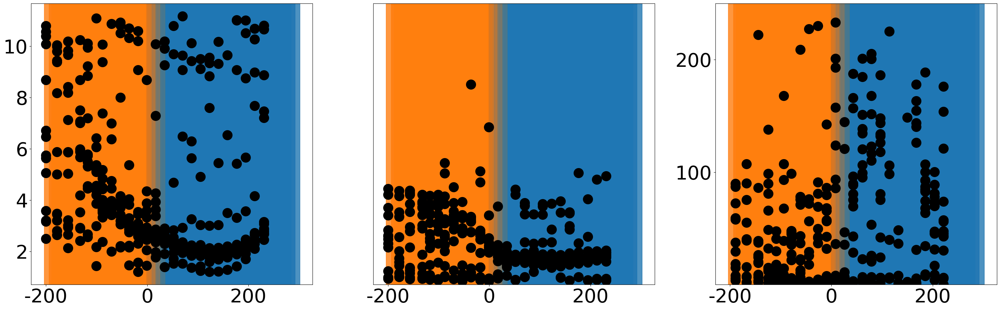

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1152  ACSF             461.671702              None             1158.692911
1153  ACSF             443.248484              None              156.912795
1154  ACSF             425.250587              None             -700.217533
1155  ACSF             408.235301          Neighbor              255.995785
1156  ACSF             389.803604          Neighbor              335.966529
1157  ACSF             372.467731          Neighbor              119.142355
1158  ACSF             353.964924              None              102.612907
1159  ACSF             335.648520          Neighbor              182.800961
1160  ACSF             317.971667          Neighbor              125.565915
1161  ACSF             299.902732              None             -945.081964
1162  ACSF             281.946174              None             -360.217729
1163  ACSF             264.007331              None                     NaN
1164  ACSF  

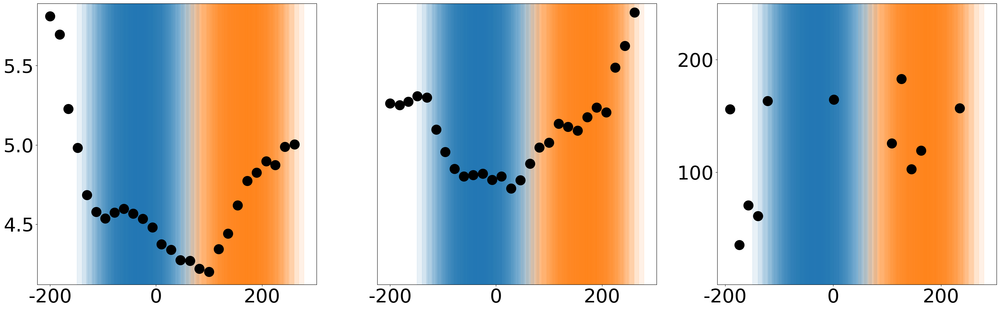

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1179  ACSF             395.851117              None               59.992779
1180  ACSF             377.853283              None              -34.210721
1181  ACSF             359.721601          Neighbor               99.448681
1182  ACSF             341.820838          Neighbor              102.273456
1183  ACSF             323.922983          Neighbor              109.085955
1184  ACSF             305.923801          Neighbor              116.123099
1185  ACSF             287.924720          Neighbor               24.455106
1186  ACSF             269.925763              None              109.117144
1187  ACSF             251.812317              None               73.770492
1188  ACSF             233.812317              None              189.473684
1189  ACSF             215.812317              None              610.881590
1190  ACSF             198.096751              None               53.227564
1191  ACSF  

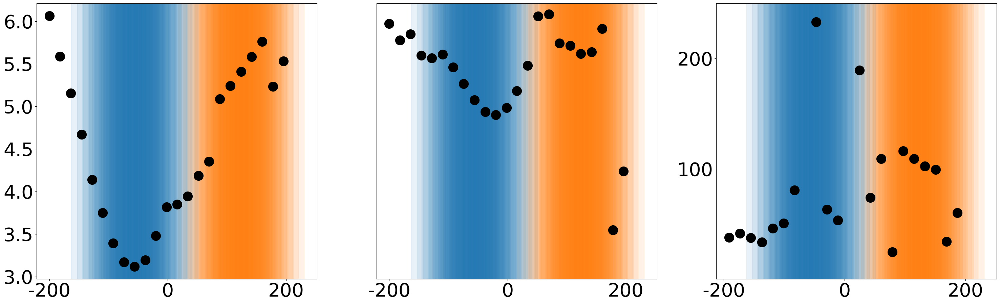

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1202  ACSF             468.596040              None               56.078767
1203  ACSF             450.706914          Neighbor              -21.660618
1204  ACSF             433.053510          Neighbor               30.540903
1205  ACSF             415.217623          Neighbor               39.009873
1206  ACSF             396.882982              None               58.002668
1207  ACSF             378.960158          Neighbor                     NaN
1208  ACSF             361.082200          Neighbor               92.597023
1209  ACSF             343.210975              None              229.659985
1210  ACSF             325.067836              None              231.574764
1211  ACSF             306.773430              None              461.508813
1212  ACSF             289.236095              None              585.456989
1213  ACSF             271.672385              None              303.662140
1214  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1429  ACSF             468.596040              None              288.534300
1430  ACSF             450.706914          Neighbor              -94.403228
1431  ACSF             433.053510          Neighbor               25.849112
1432  ACSF             415.217623          Neighbor               58.205207
1433  ACSF             396.882982              None               26.631240
1434  ACSF             378.960158          Neighbor             -119.186385
1435  ACSF             361.082200          Neighbor              235.147704
1436  ACSF             343.210975              None              127.768583
1437  ACSF             325.067836              None              237.589693
1438  ACSF             306.773430              None              247.004717
1439  ACSF             289.236095              None              243.940412
1440  ACSF             271.672385              None              190.962789
1441  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1456  ACSF             468.596040              None             -577.068600
1457  ACSF             450.706914          Neighbor              -35.026594
1458  ACSF             433.053510          Neighbor               40.907998
1459  ACSF             415.217623          Neighbor               42.837945
1460  ACSF             396.882982              None              170.693565
1461  ACSF             378.960158          Neighbor               90.292716
1462  ACSF             361.082200          Neighbor               92.597023
1463  ACSF             343.210975              None              312.812738
1464  ACSF             325.067836              None              234.543671
1465  ACSF             306.773430              None             2192.166860
1466  ACSF             289.236095              None              450.351530
1467  ACSF             271.672385              None              411.630900
1468  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1483  ACSF             468.596040              None               93.660349
1484  ACSF             450.706914          Neighbor               23.258766
1485  ACSF             433.053510          Neighbor               69.400339
1486  ACSF             415.217623          Neighbor             -115.312203
1487  ACSF             396.882982              None             -122.759071
1488  ACSF             378.960158          Neighbor               53.050320
1489  ACSF             361.082200          Neighbor              102.121289
1490  ACSF             343.210975              None               68.985319
1491  ACSF             325.067836              None              254.088977
1492  ACSF             306.773430              None              565.720480
1493  ACSF             289.236095              None              225.175765
1494  ACSF             271.672385              None              336.788918
1495  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1510  ACSF             468.596040              None               17.004873
1511  ACSF             450.706914          Neighbor               -2.495886
1512  ACSF             433.053510          Neighbor               12.721746
1513  ACSF             415.217623          Neighbor               -5.238469
1514  ACSF             396.882982              None                2.463618
1515  ACSF             378.960158          Neighbor               20.065048
1516  ACSF             361.082200          Neighbor               57.279569
1517  ACSF             343.210975              None               24.451670
1518  ACSF             325.067836              None               -4.223085
1519  ACSF             306.773430              None               30.081192
1520  ACSF             289.236095              None               10.977319
1521  ACSF             271.672385              None             -120.281757
1522  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1537  ACSF             468.596040              None              168.765345
1538  ACSF             450.706914          Neighbor               45.734206
1539  ACSF             433.053510          Neighbor               19.199017
1540  ACSF             415.217623          Neighbor               16.040805
1541  ACSF             396.882982              None               33.190415
1542  ACSF             378.960158          Neighbor              117.618143
1543  ACSF             361.082200          Neighbor               71.484902
1544  ACSF             343.210975              None               84.781022
1545  ACSF             325.067836              None             2613.486625
1546  ACSF             306.773430              None              730.722287
1547  ACSF             289.236095              None              487.880824
1548  ACSF             271.672385              None              151.831070
1549  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1564  ACSF             468.596040              None                8.864780
1565  ACSF             450.706914          Neighbor             -143.523607
1566  ACSF             433.053510          Neighbor               36.105035
1567  ACSF             415.217623          Neighbor             2037.182257
1568  ACSF             396.882982              None              -24.823856
1569  ACSF             378.960158          Neighbor               41.288586
1570  ACSF             361.082200          Neighbor             -121.572963
1571  ACSF             343.210975              None                     NaN
1572  ACSF             325.067836              None             -254.088977
1573  ACSF             306.773430              None             -531.434390
1574  ACSF             289.236095              None                     NaN
1575  ACSF             271.672385              None              158.319577
1576  ACSF  

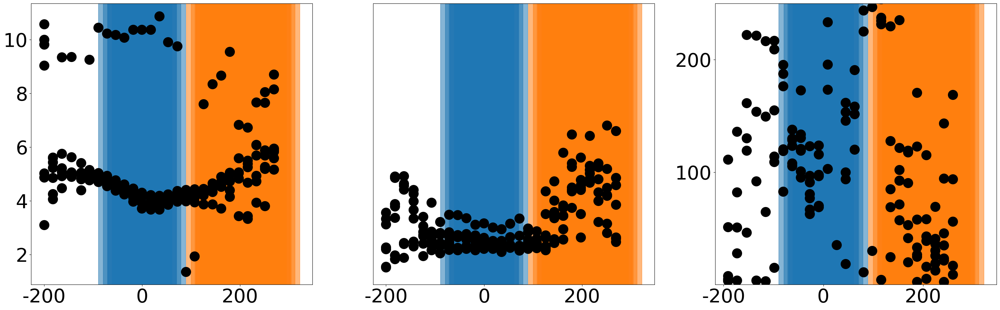

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1229  ACSF             493.782255              Home               28.872794
1230  ACSF             476.487451              Home               53.948798
1231  ACSF             457.983014              None               74.979680
1232  ACSF             438.863195              None               97.841349
1233  ACSF             422.523690              None             -233.263103
1234  ACSF             403.629379              None             -149.536463
1235  ACSF             385.984076              None              272.006773
1236  ACSF             368.031629              None              102.741440
1237  ACSF             349.743653          Neighbor               71.096792
1238  ACSF             333.107004          Neighbor              218.827488
1239  ACSF             314.287840          Neighbor              154.676894
1240  ACSF             297.428058          Neighbor              -96.878691
1241  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1619  ACSF             493.782255              Home               24.053968
1620  ACSF             476.487451              Home               27.053271
1621  ACSF             457.983014              None               50.315312
1622  ACSF             438.863195              None               85.547148
1623  ACSF             422.523690              None             -248.609359
1624  ACSF             403.629379              None              -74.452754
1625  ACSF             385.984076              None              -79.085670
1626  ACSF             368.031629              None              -31.805176
1627  ACSF             349.743653          Neighbor              -15.606613
1628  ACSF             333.107004          Neighbor              -24.096241
1629  ACSF             314.287840          Neighbor              -28.770958
1630  ACSF             297.428058          Neighbor              -39.053548
1631  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1647  ACSF             493.782255              Home               41.375128
1648  ACSF             476.487451              Home               46.728378
1649  ACSF             457.983014              None               97.054916
1650  ACSF             438.863195              None               80.490173
1651  ACSF             422.523690              None             -609.493913
1652  ACSF             403.629379              None             -152.114677
1653  ACSF             385.984076              None              544.013547
1654  ACSF             368.031629              None                7.805368
1655  ACSF             349.743653          Neighbor              248.308198
1656  ACSF             333.107004          Neighbor             -156.826367
1657  ACSF             314.287840          Neighbor              421.494536
1658  ACSF             297.428058          Neighbor               -3.642510
1659  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1675  ACSF             493.782255              Home               26.007223
1676  ACSF             476.487451              Home               23.845925
1677  ACSF             457.983014              None               51.397361
1678  ACSF             438.863195              None              130.716042
1679  ACSF             422.523690              None              -92.167372
1680  ACSF             403.629379              None              -59.411793
1681  ACSF             385.984076              None              -89.762235
1682  ACSF             368.031629              None              -22.605657
1683  ACSF             349.743653          Neighbor              -13.898621
1684  ACSF             333.107004          Neighbor              -30.550591
1685  ACSF             314.287840          Neighbor              -30.878721
1686  ACSF             297.428058          Neighbor              -28.605291
1687  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1703  ACSF             493.782255              Home               23.059738
1704  ACSF             476.487451              Home               29.749900
1705  ACSF             457.983014              None               48.282370
1706  ACSF             438.863195              None              115.883016
1707  ACSF             422.523690              None             -153.612287
1708  ACSF             403.629379              None              -87.787575
1709  ACSF             385.984076              None              -85.082687
1710  ACSF             368.031629              None              -44.067413
1711  ACSF             349.743653          Neighbor              -26.449363
1712  ACSF             333.107004          Neighbor              -28.557153
1713  ACSF             314.287840          Neighbor               -9.294257
1714  ACSF             297.428058          Neighbor              -37.229391
1715  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1731  ACSF             493.782255              Home               23.245703
1732  ACSF             476.487451              Home               27.373429
1733  ACSF             457.983014              None               59.378318
1734  ACSF             438.863195              None              158.635973
1735  ACSF             422.523690              None              -91.276866
1736  ACSF             403.629379              None              -72.914474
1737  ACSF             385.984076              None              -45.680527
1738  ACSF             368.031629              None              -26.088411
1739  ACSF             349.743653          Neighbor              -25.833306
1740  ACSF             333.107004          Neighbor              -11.102752
1741  ACSF             314.287840          Neighbor              -16.893569
1742  ACSF             297.428058          Neighbor             2191.880391
1743  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1759  ACSF             493.782255              Home               24.020560
1760  ACSF             476.487451              Home               37.083041
1761  ACSF             457.983014              None               55.580867
1762  ACSF             438.863195              None              125.688502
1763  ACSF             422.523690              None             -331.479146
1764  ACSF             403.629379              None             -245.073647
1765  ACSF             385.984076              None             -123.809980
1766  ACSF             368.031629              None              -44.823471
1767  ACSF             349.743653          Neighbor              -50.721492
1768  ACSF             333.107004          Neighbor              -53.923106
1769  ACSF             314.287840          Neighbor              -30.432818
1770  ACSF             297.428058          Neighbor              -25.303093
1771  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1787  ACSF             493.782255              Home               27.583418
1788  ACSF             476.487451              Home               34.717519
1789  ACSF             457.983014              None               64.593981
1790  ACSF             438.863195              None              140.857804
1791  ACSF             422.523690              None             -138.928760
1792  ACSF             403.629379              None             -332.930237
1793  ACSF             385.984076              None             -195.135294
1794  ACSF             368.031629              None              -25.190050
1795  ACSF             349.743653          Neighbor              -25.168910
1796  ACSF             333.107004          Neighbor              -33.545747
1797  ACSF             314.287840          Neighbor              -20.460900
1798  ACSF             297.428058          Neighbor              -38.794343
1799  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1815  ACSF             493.782255              Home               25.247888
1816  ACSF             476.487451              Home               28.381039
1817  ACSF             457.983014              None               77.408172
1818  ACSF             438.863195              None              140.857804
1819  ACSF             422.523690              None             -111.800659
1820  ACSF             403.629379              None             -147.044188
1821  ACSF             385.984076              None              -87.147801
1822  ACSF             368.031629              None              -58.241963
1823  ACSF             349.743653          Neighbor              -12.856761
1824  ACSF             333.107004          Neighbor              -20.589895
1825  ACSF             314.287840          Neighbor              -27.638986
1826  ACSF             297.428058          Neighbor              -73.368381
1827  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1843  ACSF             493.782255              Home               24.393235
1844  ACSF             476.487451              Home               41.770740
1845  ACSF             457.983014              None               87.705589
1846  ACSF             438.863195              None              286.657986
1847  ACSF             422.523690              None             -158.775725
1848  ACSF             403.629379              None              -97.487860
1849  ACSF             385.984076              None              512.927058
1850  ACSF             368.031629              None              -63.943973
1851  ACSF             349.743653          Neighbor              -25.322145
1852  ACSF             333.107004          Neighbor              -59.933643
1853  ACSF             314.287840          Neighbor              802.846735
1854  ACSF             297.428058          Neighbor                4.952003
1855  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1871  ACSF             493.782255              Home               20.963398
1872  ACSF             476.487451              Home               41.029795
1873  ACSF             457.983014              None               72.698929
1874  ACSF             438.863195              None              276.940766
1875  ACSF             422.523690              None             -149.954852
1876  ACSF             403.629379              None              -81.314758
1877  ACSF             385.984076              None              -96.518533
1878  ACSF             368.031629              None              -85.457833
1879  ACSF             349.743653          Neighbor              -26.747025
1880  ACSF             333.107004          Neighbor              -34.467333
1881  ACSF             314.287840          Neighbor              -94.188723
1882  ACSF             297.428058          Neighbor              -12.560919
1883  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1899  ACSF             493.782255              Home              -12.541554
1900  ACSF             476.487451              Home               12.086504
1901  ACSF             457.983014              None               22.155062
1902  ACSF             438.863195              None               15.531849
1903  ACSF             422.523690              None               42.459127
1904  ACSF             403.629379              None              -22.167466
1905  ACSF             385.984076              None               24.129633
1906  ACSF             368.031629              None               75.883719
1907  ACSF             349.743653          Neighbor                0.115162
1908  ACSF             333.107004          Neighbor               -0.125651
1909  ACSF             314.287840          Neighbor                1.434509
1910  ACSF             297.428058          Neighbor               -6.746842
1911  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1927  ACSF             493.782255              Home               38.777586
1928  ACSF             476.487451              Home               45.916719
1929  ACSF             457.983014              None              102.794723
1930  ACSF             438.863195              None              347.649047
1931  ACSF             422.523690              None              539.837466
1932  ACSF             403.629379              None              -74.452754
1933  ACSF             385.984076              None              101.426255
1934  ACSF             368.031629              None              198.782351
1935  ACSF             349.743653          Neighbor              -12.214867
1936  ACSF             333.107004          Neighbor              -44.914473
1937  ACSF             314.287840          Neighbor              -24.684892
1938  ACSF             297.428058          Neighbor              -32.056752
1939  ACSF  

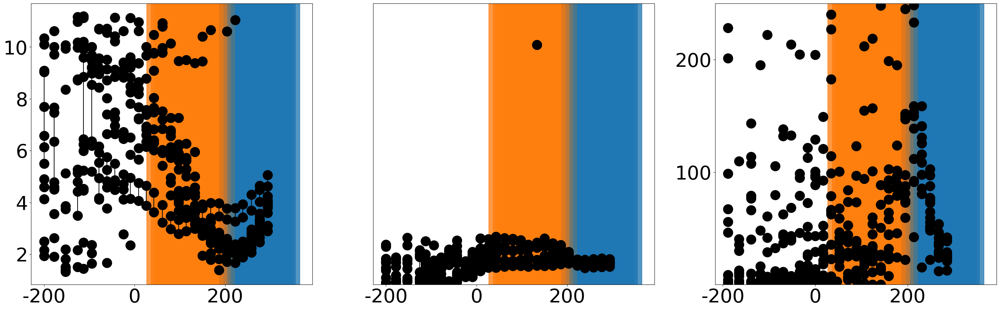

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1257  ACSF             387.382053              None             -261.772050
1258  ACSF             371.152186              None               -3.427001
1259  ACSF             352.941101              None                5.643457
1260  ACSF             336.338052              None               -6.517154
1261  ACSF             318.285534              None              642.971008
1262  ACSF             298.996404              None              221.549963
1263  ACSF             280.386207          Neighbor               60.329769
1264  ACSF             264.036840          Neighbor              106.376494
1265  ACSF             246.484718          Neighbor              179.894599
1266  ACSF             230.114310          Neighbor               41.181664
1267  ACSF             212.612103              None              137.088120
1268  ACSF             196.161528              None               74.837168
1269  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1979  ACSF             387.382053              None               47.875714
1980  ACSF             371.152186              None               37.165480
1981  ACSF             352.941101              None               54.615293
1982  ACSF             336.338052              None               70.794188
1983  ACSF             318.285534              None              -91.853001
1984  ACSF             298.996404              None              191.857700
1985  ACSF             280.386207          Neighbor              110.468698
1986  ACSF             264.036840          Neighbor               59.098052
1987  ACSF             246.484718          Neighbor              135.292632
1988  ACSF             230.114310          Neighbor               59.329516
1989  ACSF             212.612103              None               62.312782
1990  ACSF             196.161528              None               52.517311
1991  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2003  ACSF             387.382053              None                2.006660
2004  ACSF             371.152186              None                5.019593
2005  ACSF             352.941101              None               65.366335
2006  ACSF             336.338052              None               84.357560
2007  ACSF             318.285534              None              -79.379137
2008  ACSF             298.996404              None             -689.266553
2009  ACSF             280.386207          Neighbor               78.982451
2010  ACSF             264.036840          Neighbor               63.365059
2011  ACSF             246.484718          Neighbor               84.383549
2012  ACSF             230.114310          Neighbor               65.306743
2013  ACSF             212.612103              None               67.697837
2014  ACSF             196.161528              None              106.910240
2015  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2027  ACSF             387.382053              None               34.096359
2028  ACSF             371.152186              None             -154.331230
2029  ACSF             352.941101              None               26.270647
2030  ACSF             336.338052              None              859.643708
2031  ACSF             318.285534              None               58.451910
2032  ACSF             298.996404              None              -68.672313
2033  ACSF             280.386207          Neighbor               89.831688
2034  ACSF             264.036840          Neighbor               57.547939
2035  ACSF             246.484718          Neighbor               71.175689
2036  ACSF             230.114310          Neighbor               55.386731
2037  ACSF             212.612103              None               76.160067
2038  ACSF             196.161528              None               67.522257
2039  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2051  ACSF             387.382053              None              463.710488
2052  ACSF             371.152186              None               49.486644
2053  ACSF             352.941101              None              -67.218822
2054  ACSF             336.338052              None              173.581903
2055  ACSF             318.285534              None               75.348165
2056  ACSF             298.996404              None              775.424872
2057  ACSF             280.386207          Neighbor               46.846325
2058  ACSF             264.036840          Neighbor              146.267679
2059  ACSF             246.484718          Neighbor              139.918021
2060  ACSF             230.114310          Neighbor               35.215708
2061  ACSF             212.612103              None               35.075852
2062  ACSF             196.161528              None               65.312437
2063  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2075  ACSF             387.382053              None               48.303176
2076  ACSF             371.152186              None              -64.350124
2077  ACSF             352.941101              None             -425.719208
2078  ACSF             336.338052              None               21.671690
2079  ACSF             318.285534              None               61.235334
2080  ACSF             298.996404              None             -103.389983
2081  ACSF             280.386207          Neighbor               41.182285
2082  ACSF             264.036840          Neighbor               57.547939
2083  ACSF             246.484718          Neighbor               35.510647
2084  ACSF             230.114310          Neighbor               41.572938
2085  ACSF             212.612103              None              138.240121
2086  ACSF             196.161528              None               65.790917
2087  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2099  ACSF             387.382053              None              -61.244781
2100  ACSF             371.152186              None              110.370213
2101  ACSF             352.941101              None               31.990461
2102  ACSF             336.338052              None              -37.766774
2103  ACSF             318.285534              None               17.519646
2104  ACSF             298.996404              None               56.224160
2105  ACSF             280.386207          Neighbor               73.979038
2106  ACSF             264.036840          Neighbor               26.756283
2107  ACSF             246.484718          Neighbor               48.433161
2108  ACSF             230.114310          Neighbor               25.967666
2109  ACSF             212.612103              None               23.235275
2110  ACSF             196.161528              None              142.546986
2111  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2123  ACSF             387.382053              None               -7.427857
2124  ACSF             371.152186              None                1.921203
2125  ACSF             352.941101              None               26.996828
2126  ACSF             336.338052              None              282.070592
2127  ACSF             318.285534              None               43.640566
2128  ACSF             298.996404              None             1094.717466
2129  ACSF             280.386207          Neighbor               49.393859
2130  ACSF             264.036840          Neighbor               93.861612
2131  ACSF             246.484718          Neighbor               26.925014
2132  ACSF             230.114310          Neighbor              104.179804
2133  ACSF             212.612103              None               49.106192
2134  ACSF             196.161528              None               84.323569
2135  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2147  ACSF             387.382053              None               -4.010345
2148  ACSF             371.152186              None               -3.054526
2149  ACSF             352.941101              None               80.207967
2150  ACSF             336.338052              None              243.952944
2151  ACSF             318.285534              None              -86.498342
2152  ACSF             298.996404              None               34.527267
2153  ACSF             280.386207          Neighbor               51.251935
2154  ACSF             264.036840          Neighbor             -461.897933
2155  ACSF             246.484718          Neighbor               59.528758
2156  ACSF             230.114310          Neighbor                6.364439
2157  ACSF             212.612103              None               16.889707
2158  ACSF             196.161528              None               41.672669
2159  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2171  ACSF             387.382053              None                1.772787
2172  ACSF             371.152186              None              -35.568526
2173  ACSF             352.941101              None               -1.607576
2174  ACSF             336.338052              None                8.776139
2175  ACSF             318.285534              None             -253.804345
2176  ACSF             298.996404              None              -26.815846
2177  ACSF             280.386207          Neighbor              220.937396
2178  ACSF             264.036840          Neighbor                4.989233
2179  ACSF             246.484718          Neighbor              251.852438
2180  ACSF             230.114310          Neighbor               26.802767
2181  ACSF             212.612103              None               80.246705
2182  ACSF             196.161528              None             -132.065590
2183  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2195  ACSF             387.382053              None                1.170395
2196  ACSF             371.152186              None              -50.868953
2197  ACSF             352.941101              None               -1.278338
2198  ACSF             336.338052              None                1.861852
2199  ACSF             318.285534              None              -52.132784
2200  ACSF             298.996404              None              103.389983
2201  ACSF             280.386207          Neighbor               17.907303
2202  ACSF             264.036840          Neighbor               20.821022
2203  ACSF             246.484718          Neighbor                9.408281
2204  ACSF             230.114310          Neighbor              122.393057
2205  ACSF             212.612103              None               -8.806517
2206  ACSF             196.161528              None               13.274886
2207  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2219  ACSF             387.382053              None                2.198871
2220  ACSF             371.152186              None                5.067080
2221  ACSF             352.941101              None              313.265078
2222  ACSF             336.338052              None               -5.309564
2223  ACSF             318.285534              None               -1.121722
2224  ACSF             298.996404              None                1.458137
2225  ACSF             280.386207          Neighbor                5.246909
2226  ACSF             264.036840          Neighbor             -254.378572
2227  ACSF             246.484718          Neighbor               29.496232
2228  ACSF             230.114310          Neighbor               -1.427353
2229  ACSF             212.612103              None                1.165137
2230  ACSF             196.161528              None              -55.606564
2231  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2243  ACSF             387.382053              None               -1.211365
2244  ACSF             371.152186              None                2.431062
2245  ACSF             352.941101              None               -7.441976
2246  ACSF             336.338052              None               -1.957125
2247  ACSF             318.285534              None               -1.221604
2248  ACSF             298.996404              None                0.557559
2249  ACSF             280.386207          Neighbor               -0.492273
2250  ACSF             264.036840          Neighbor             -139.302551
2251  ACSF             246.484718          Neighbor                1.010270
2252  ACSF             230.114310          Neighbor               45.578664
2253  ACSF             212.612103              None                3.701749
2254  ACSF             196.161528              None              -11.389296
2255  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2267  ACSF             387.382053              None                0.838406
2268  ACSF             371.152186              None               -0.954660
2269  ACSF             352.941101              None              -64.104437
2270  ACSF             336.338052              None             1061.912816
2271  ACSF             318.285534              None               47.510173
2272  ACSF             298.996404              None              -29.919931
2273  ACSF             280.386207          Neighbor              -43.482360
2274  ACSF             264.036840          Neighbor               22.589603
2275  ACSF             246.484718          Neighbor               -6.706435
2276  ACSF             230.114310          Neighbor               -6.077155
2277  ACSF             212.612103              None                2.013534
2278  ACSF             196.161528              None               42.764096
2279  ACSF  

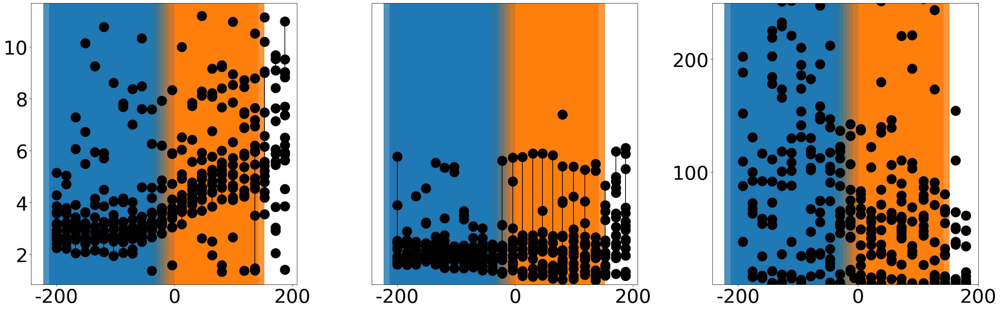

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1281  ACSF             433.249520              None               57.981652
1282  ACSF             415.797043              None               46.695321
1283  ACSF             397.399086              None               55.428197
1284  ACSF             380.160917              None               66.507022
1285  ACSF             361.871486              None              164.655693
1286  ACSF             343.759360              None             -847.231139
1287  ACSF             326.306398              Home             -139.354668
1288  ACSF             308.469001              None             -102.372277
1289  ACSF             290.246736              Home              -42.219081
1290  ACSF             273.527979              Home              -61.775452
1291  ACSF             255.242446              Home              -97.656676
1292  ACSF             236.590021              None              -79.174113
1293  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2316  ACSF             433.249520              None               57.221237
2317  ACSF             415.797043              None               53.952951
2318  ACSF             397.399086              None               79.438568
2319  ACSF             380.160917              None              164.769650
2320  ACSF             361.871486              None              646.861650
2321  ACSF             343.759360              None             -436.324036
2322  ACSF             326.306398              Home             -136.163339
2323  ACSF             308.469001              None              -77.872929
2324  ACSF             290.246736              Home              -49.317865
2325  ACSF             273.527979              Home              -76.189724
2326  ACSF             255.242446              Home             -108.444332
2327  ACSF             236.590021              None              -83.074316
2328  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2341  ACSF             433.249520              None               79.691677
2342  ACSF             415.797043              None               60.519594
2343  ACSF             397.399086              None              109.797256
2344  ACSF             380.160917              None              121.122061
2345  ACSF             361.871486              None                     NaN
2346  ACSF             343.759360              None             -335.633874
2347  ACSF             326.306398              Home             -130.199982
2348  ACSF             308.469001              None              -72.310577
2349  ACSF             290.246736              Home              -47.631784
2350  ACSF             273.527979              Home              -67.724199
2351  ACSF             255.242446              Home             -104.788905
2352  ACSF             236.590021              None              -83.074316
2353  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2366  ACSF             433.249520              None               55.404690
2367  ACSF             415.797043              None               83.248672
2368  ACSF             397.399086              None              141.296469
2369  ACSF             380.160917              None              265.064220
2370  ACSF             361.871486              None                     NaN
2371  ACSF             343.759360              None             -205.328958
2372  ACSF             326.306398              Home              -80.712206
2373  ACSF             308.469001              None              -68.763266
2374  ACSF             290.246736              Home              -56.673750
2375  ACSF             273.527979              Home              -84.655249
2376  ACSF             255.242446              Home             -121.911275
2377  ACSF             236.590021              None              -89.702586
2378  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2391  ACSF             433.249520              None               66.359229
2392  ACSF             415.797043              None               69.954207
2393  ACSF             397.399086              None              253.502488
2394  ACSF             380.160917              None              166.267556
2395  ACSF             361.871486              None             -464.413492
2396  ACSF             343.759360              None             -155.830013
2397  ACSF             326.306398              Home              -66.557453
2398  ACSF             308.469001              None              -67.993527
2399  ACSF             290.246736              Home              -51.760855
2400  ACSF             273.527979              Home              -76.189724
2401  ACSF             255.242446              Home             -126.887245
2402  ACSF             236.590021              None              -86.928279
2403  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2416  ACSF             433.249520              None               75.226195
2417  ACSF             415.797043              None              126.882458
2418  ACSF             397.399086              None              202.801990
2419  ACSF             380.160917              None              415.668890
2420  ACSF             361.871486              None             -411.639232
2421  ACSF             343.759360              None             -154.450986
2422  ACSF             326.306398              Home              -85.346399
2423  ACSF             308.469001              None              -51.042760
2424  ACSF             290.246736              Home              -53.931471
2425  ACSF             273.527979              Home              -78.478685
2426  ACSF             255.242446              Home             -126.029899
2427  ACSF             236.590021              None              -86.041255
2428  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2441  ACSF             433.249520              None               79.691677
2442  ACSF             415.797043              None               68.649091
2443  ACSF             397.399086              None              507.004975
2444  ACSF             380.160917              None                     NaN
2445  ACSF             361.871486              None             -292.131068
2446  ACSF             343.759360              None             -151.764882
2447  ACSF             326.306398              Home              -60.671420
2448  ACSF             308.469001              None              -52.513733
2449  ACSF             290.246736              Home              -53.075416
2450  ACSF             273.527979              Home              -78.143306
2451  ACSF             255.242446              Home             -128.637414
2452  ACSF             236.590021              None              -77.358193
2453  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2466  ACSF             433.249520              None              150.452390
2467  ACSF             415.797043              None              112.182661
2468  ACSF             397.399086              None              325.248475
2469  ACSF             380.160917              None             1306.387941
2470  ACSF             361.871486              None                     NaN
2471  ACSF             343.759360              None             -103.886675
2472  ACSF             326.306398              Home              -78.578843
2473  ACSF             308.469001              None              -58.404697
2474  ACSF             290.246736              Home              -55.729187
2475  ACSF             273.527979              Home              -84.265132
2476  ACSF             255.242446              Home             -101.371875
2477  ACSF             236.590021              None             -102.829793
2478  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2491  ACSF             433.249520              None              100.881371
2492  ACSF             415.797043              None              191.645380
2493  ACSF             397.399086              None              226.818015
2494  ACSF             380.160917              None              294.990825
2495  ACSF             361.871486              None                     NaN
2496  ACSF             343.759360              None             -212.840993
2497  ACSF             326.306398              Home              -91.007130
2498  ACSF             308.469001              None              -73.476876
2499  ACSF             290.246736              Home              -56.866518
2500  ACSF             273.527979              Home             -133.471049
2501  ACSF             255.242446              Home             -121.119643
2502  ACSF             236.590021              None             -119.603447
2503  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2516  ACSF             433.249520              None              107.070412
2517  ACSF             415.797043              None              161.385583
2518  ACSF             397.399086              None              215.477114
2519  ACSF             380.160917              None                     NaN
2520  ACSF             361.871486              None             -431.241100
2521  ACSF             343.759360              None              -96.425201
2522  ACSF             326.306398              Home              -50.105049
2523  ACSF             308.469001              None              -61.770391
2524  ACSF             290.246736              Home              -61.692827
2525  ACSF             273.527979              Home              -83.495588
2526  ACSF             255.242446              Home             -152.888730
2527  ACSF             236.590021              None             -175.667563
2528  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2541  ACSF             433.249520              None               64.879097
2542  ACSF             415.797043              None              101.646168
2543  ACSF             397.399086              None              783.553144
2544  ACSF             380.160917              None                     NaN
2545  ACSF             361.871486              None             -208.185359
2546  ACSF             343.759360              None              -87.264807
2547  ACSF             326.306398              Home              -59.656848
2548  ACSF             308.469001              None              -58.404697
2549  ACSF             290.246736              Home              -45.555194
2550  ACSF             273.527979              Home              -89.197725
2551  ACSF             255.242446              Home             -114.432056
2552  ACSF             236.590021              None             -108.800555
2553  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2566  ACSF             433.249520              None               85.134035
2567  ACSF             415.797043              None              224.365322
2568  ACSF             397.399086              None                     NaN
2569  ACSF             380.160917              None             -571.544724
2570  ACSF             361.871486              None             -188.667981
2571  ACSF             343.759360              None              -80.800747
2572  ACSF             326.306398              Home              -49.548326
2573  ACSF             308.469001              None              -59.163199
2574  ACSF             290.246736              Home              -67.962423
2575  ACSF             273.527979              Home              -87.490592
2576  ACSF             255.242446              Home             -194.296095
2577  ACSF             236.590021              None             -100.381465
2578  ACSF  

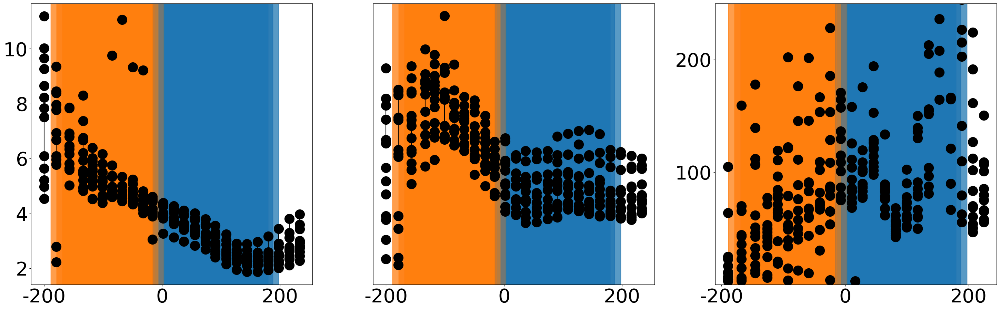

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1306  ACSF                  414.0          Neighbor               70.866142
1307  ACSF                  396.0          Neighbor               65.454545
1308  ACSF                  378.0              None              110.429448
1309  ACSF                  360.0          Neighbor              104.046243
1310  ACSF                  342.0              None              131.386861
1311  ACSF                  324.0              None              117.647059
1312  ACSF                  306.0              None              105.263158
1313  ACSF                  288.0              None               98.901099
1314  ACSF                  270.0              None               84.905660
1315  ACSF                  252.0              Home               62.068966
1316  ACSF                  234.0              Home               48.257373
1317  ACSF                  216.0              Home               85.714286
1318  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2591  ACSF                  414.0          Neighbor               83.333333
2592  ACSF                  396.0          Neighbor              131.386861
2593  ACSF                  378.0              None               99.447514
2594  ACSF                  360.0          Neighbor              125.874126
2595  ACSF                  342.0              None              116.129032
2596  ACSF                  324.0              None              150.000000
2597  ACSF                  306.0              None              122.448980
2598  ACSF                  288.0              None              109.090909
2599  ACSF                  270.0              None               78.260870
2600  ACSF                  252.0              Home               49.861496
2601  ACSF                  234.0              Home               49.450549
2602  ACSF                  216.0              Home               80.000000
2603  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2615  ACSF                  414.0          Neighbor               50.991501
2616  ACSF                  396.0          Neighbor              418.604651
2617  ACSF                  378.0              None              128.571429
2618  ACSF                  360.0          Neighbor              367.346939
2619  ACSF                  342.0              None               82.191781
2620  ACSF                  324.0              None              171.428571
2621  ACSF                  306.0              None              127.659574
2622  ACSF                  288.0              None              109.090909
2623  ACSF                  270.0              None               75.313808
2624  ACSF                  252.0              Home               53.254438
2625  ACSF                  234.0              Home               43.583535
2626  ACSF                  216.0              Home               79.295154
2627  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2639  ACSF                  414.0          Neighbor              642.857143
2640  ACSF                  396.0          Neighbor               96.256684
2641  ACSF                  378.0              None              185.567010
2642  ACSF                  360.0          Neighbor               89.108911
2643  ACSF                  342.0              None              253.521127
2644  ACSF                  324.0              None              107.142857
2645  ACSF                  306.0              None              137.404580
2646  ACSF                  288.0              None              100.000000
2647  ACSF                  270.0              None               85.714286
2648  ACSF                  252.0              Home               63.380282
2649  ACSF                  234.0              Home               56.074766
2650  ACSF                  216.0              Home               58.823529
2651  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2663  ACSF                  414.0          Neighbor               90.909091
2664  ACSF                  396.0          Neighbor               54.711246
2665  ACSF                  378.0              None              180.000000
2666  ACSF                  360.0          Neighbor              514.285714
2667  ACSF                  342.0              None              120.805369
2668  ACSF                  324.0              None              123.287671
2669  ACSF                  306.0              None              128.571429
2670  ACSF                  288.0              None               84.112150
2671  ACSF                  270.0              None               74.074074
2672  ACSF                  252.0              Home               48.387097
2673  ACSF                  234.0              Home               52.023121
2674  ACSF                  216.0              Home               67.415730
2675  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2687  ACSF                  414.0          Neighbor              124.137931
2688  ACSF                  396.0          Neighbor              133.333333
2689  ACSF                  378.0              None               91.836735
2690  ACSF                  360.0          Neighbor              134.328358
2691  ACSF                  342.0              None              169.811321
2692  ACSF                  324.0              None              100.558659
2693  ACSF                  306.0              None              165.137615
2694  ACSF                  288.0              None              116.129032
2695  ACSF                  270.0              None               67.164179
2696  ACSF                  252.0              Home               60.810811
2697  ACSF                  234.0              Home               53.731343
2698  ACSF                  216.0              Home               63.604240
2699  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2711  ACSF                  414.0          Neighbor               93.750000
2712  ACSF                  396.0          Neighbor               77.253219
2713  ACSF                  378.0              None               79.646018
2714  ACSF                  360.0          Neighbor              195.652174
2715  ACSF                  342.0              None              163.636364
2716  ACSF                  324.0              None              253.521127
2717  ACSF                  306.0              None              135.338346
2718  ACSF                  288.0              None               96.256684
2719  ACSF                  270.0              None               84.112150
2720  ACSF                  252.0              Home               54.545455
2721  ACSF                  234.0              Home               58.823529
2722  ACSF                  216.0              Home               80.717489
2723  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2735  ACSF                  414.0          Neighbor               38.135593
2736  ACSF                  396.0          Neighbor               56.603774
2737  ACSF                  378.0              None             3000.000000
2738  ACSF                  360.0          Neighbor              382.978723
2739  ACSF                  342.0              None                     NaN
2740  ACSF                  324.0              None              209.302326
2741  ACSF                  306.0              None              202.247191
2742  ACSF                  288.0              None              104.651163
2743  ACSF                  270.0              None               76.923077
2744  ACSF                  252.0              Home               63.604240
2745  ACSF                  234.0              Home               51.724138
2746  ACSF                  216.0              Home               56.962025
2747  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2759  ACSF                  414.0          Neighbor               43.062201
2760  ACSF                  396.0          Neighbor              204.545455
2761  ACSF                  378.0              None              104.046243
2762  ACSF                  360.0          Neighbor               58.631922
2763  ACSF                  342.0              None              171.428571
2764  ACSF                  324.0              None              243.243243
2765  ACSF                  306.0              None              382.978723
2766  ACSF                  288.0              None              108.433735
2767  ACSF                  270.0              None              100.000000
2768  ACSF                  252.0              Home               68.181818
2769  ACSF                  234.0              Home               49.586777
2770  ACSF                  216.0              Home               52.023121
2771  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2783  ACSF                  414.0          Neighbor                9.409305
2784  ACSF                  396.0          Neighbor              -16.901408
2785  ACSF                  378.0              None               11.159330
2786  ACSF                  360.0          Neighbor             -123.287671
2787  ACSF                  342.0              None              -39.130435
2788  ACSF                  324.0              None               60.000000
2789  ACSF                  306.0              None               34.548944
2790  ACSF                  288.0              None               31.971581
2791  ACSF                  270.0              None                     NaN
2792  ACSF                  252.0              Home             -439.024390
2793  ACSF                  234.0              Home             -150.000000
2794  ACSF                  216.0              Home               61.643836
2795  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2807  ACSF                  414.0          Neighbor              176.470588
2808  ACSF                  396.0          Neighbor               90.909091
2809  ACSF                  378.0              None              174.757282
2810  ACSF                  360.0          Neighbor              162.162162
2811  ACSF                  342.0              None              782.608696
2812  ACSF                  324.0              None             1058.823529
2813  ACSF                  306.0              None              400.000000
2814  ACSF                  288.0              None              189.473684
2815  ACSF                  270.0              None               84.507042
2816  ACSF                  252.0              Home               52.173913
2817  ACSF                  234.0              Home               51.575931
2818  ACSF                  216.0              Home               54.878049
2819  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2831  ACSF                  414.0          Neighbor              321.428571
2832  ACSF                  396.0          Neighbor               79.646018
2833  ACSF                  378.0              None               62.500000
2834  ACSF                  360.0          Neighbor              133.333333
2835  ACSF                  342.0              None              562.500000
2836  ACSF                  324.0              None              187.500000
2837  ACSF                  306.0              None              140.625000
2838  ACSF                  288.0              None              168.224299
2839  ACSF                  270.0              None               85.308057
2840  ACSF                  252.0              Home               75.313808
2841  ACSF                  234.0              Home               46.511628
2842  ACSF                  216.0              Home               52.173913
2843  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2855  ACSF                  414.0          Neighbor               75.313808
2856  ACSF                  396.0          Neighbor              225.000000
2857  ACSF                  378.0              None              181.818182
2858  ACSF                  360.0          Neighbor              580.645161
2859  ACSF                  342.0              None              818.181818
2860  ACSF                  324.0              None              264.705882
2861  ACSF                  306.0              None             -339.622642
2862  ACSF                  288.0              None              107.784431
2863  ACSF                  270.0              None               75.000000
2864  ACSF                  252.0              Home               91.370558
2865  ACSF                  234.0              Home               57.692308
2866  ACSF                  216.0              Home               37.578288
2867  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2879  ACSF                  414.0          Neighbor                6.976744
2880  ACSF                  396.0          Neighbor             -346.153846
2881  ACSF                  378.0              None              409.090909
2882  ACSF                  360.0          Neighbor             -428.571429
2883  ACSF                  342.0              None             -148.760331
2884  ACSF                  324.0              None             3000.000000
2885  ACSF                  306.0              None             -750.000000
2886  ACSF                  288.0              None              195.652174
2887  ACSF                  270.0              None              116.883117
2888  ACSF                  252.0              Home              111.111111
2889  ACSF                  234.0              Home               32.085561
2890  ACSF                  216.0              Home               16.172507
2891  ACSF  

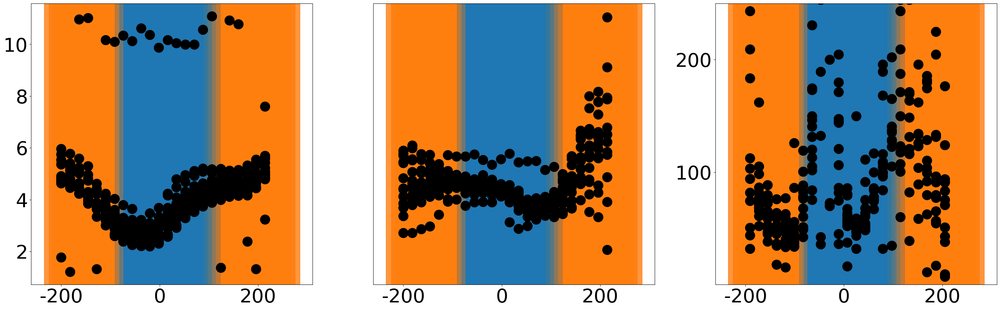

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1330  ACSF             486.997599          Neighbor                     NaN
1331  ACSF             468.861909          Neighbor             1502.669659
1332  ACSF             450.829873          Neighbor              108.808550
1333  ACSF             432.332419          Neighbor               93.987563
1334  ACSF             414.944720              None              376.750913
1335  ACSF             397.237427              None              305.498052
1336  ACSF             378.602046              None              169.327028
1337  ACSF             360.653381              None              188.198448
1338  ACSF             343.150926              None              174.989012
1339  ACSF             325.302046              None              205.412302
1340  ACSF             306.814939              Home              151.912016
1341  ACSF             288.889321              Home              111.476055
1342  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2903  ACSF             486.997599          Neighbor               83.961531
2904  ACSF             468.861909          Neighbor               80.142382
2905  ACSF             450.829873          Neighbor              215.086669
2906  ACSF             432.332419          Neighbor              110.048728
2907  ACSF             414.944720              None              160.975390
2908  ACSF             397.237427              None              172.549825
2909  ACSF             378.602046              None              140.223945
2910  ACSF             360.653381              None              198.891541
2911  ACSF             343.150926              None              151.261689
2912  ACSF             325.302046              None              243.251411
2913  ACSF             306.814939              Home               95.858919
2914  ACSF             288.889321              Home               68.700359
2915  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2931  ACSF             486.997599          Neighbor               53.183843
2932  ACSF             468.861909          Neighbor               20.561044
2933  ACSF             450.829873          Neighbor              212.614408
2934  ACSF             432.332419          Neighbor              -59.751543
2935  ACSF             414.944720              None              431.885193
2936  ACSF             397.237427              None              170.966799
2937  ACSF             378.602046              None              304.214661
2938  ACSF             360.653381              None              135.677951
2939  ACSF             343.150926              None              189.881694
2940  ACSF             325.302046              None               79.343808
2941  ACSF             306.814939              Home               68.680528
2942  ACSF             288.889321              Home               69.782255
2943  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2959  ACSF             486.997599          Neighbor             -105.440062
2960  ACSF             468.861909          Neighbor              515.201026
2961  ACSF             450.829873          Neighbor              210.198336
2962  ACSF             432.332419          Neighbor             -643.988855
2963  ACSF             414.944720              None              198.958347
2964  ACSF             397.237427              None              139.070009
2965  ACSF             378.602046              None              192.996398
2966  ACSF             360.653381              None              143.462751
2967  ACSF             343.150926              None              379.763389
2968  ACSF             325.302046              None              139.000806
2969  ACSF             306.814939              Home              114.175910
2970  ACSF             288.889321              Home               72.642183
2971  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2987  ACSF             486.997599          Neighbor              114.060947
2988  ACSF             468.861909          Neighbor              -80.861148
2989  ACSF             450.829873          Neighbor              237.146840
2990  ACSF             432.332419          Neighbor              137.997612
2991  ACSF             414.944720              None              260.401367
2992  ACSF             397.237427              None               77.325233
2993  ACSF             378.602046              None              186.965260
2994  ACSF             360.653381              None              135.677951
2995  ACSF             343.150926              None              182.131421
2996  ACSF             325.302046              None              196.671353
2997  ACSF             306.814939              Home              106.068745
2998  ACSF             288.889321              Home               91.837786
2999  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3015  ACSF             486.997599          Neighbor               10.321964
3016  ACSF             468.861909          Neighbor              -19.306248
3017  ACSF             450.829873          Neighbor              137.018174
3018  ACSF             432.332419          Neighbor             1022.805829
3019  ACSF             414.944720              None              112.785305
3020  ACSF             397.237427              None             -847.062779
3021  ACSF             378.602046              None               37.084019
3022  ACSF             360.653381              None              106.722291
3023  ACSF             343.150926              None               47.094668
3024  ACSF             325.302046              None             -543.738447
3025  ACSF             306.814939              Home               74.072801
3026  ACSF             288.889321              Home             -377.121121
3027  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3043  ACSF             486.997599          Neighbor               35.560178
3044  ACSF             468.861909          Neighbor              -86.692480
3045  ACSF             450.829873          Neighbor              303.236943
3046  ACSF             432.332419          Neighbor             -199.858610
3047  ACSF             414.944720              None               87.228044
3048  ACSF             397.237427              None              130.317351
3049  ACSF             378.602046              None              218.886159
3050  ACSF             360.653381              None              171.592702
3051  ACSF             343.150926              None              287.885149
3052  ACSF             325.302046              None              118.507097
3053  ACSF             306.814939              Home              150.635444
3054  ACSF             288.889321              Home               71.759889
3055  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3071  ACSF             486.997599          Neighbor               61.686022
3072  ACSF             468.861909          Neighbor               57.980823
3073  ACSF             450.829873          Neighbor              188.749526
3074  ACSF             432.332419          Neighbor              404.365095
3075  ACSF             414.944720              None             1362.099456
3076  ACSF             397.237427              None              144.460319
3077  ACSF             378.602046              None              103.749509
3078  ACSF             360.653381              None              108.710905
3079  ACSF             343.150926              None              318.729987
3080  ACSF             325.302046              None               87.203336
3081  ACSF             306.814939              Home              101.850101
3082  ACSF             288.889321              Home               71.759889
3083  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3099  ACSF             486.997599          Neighbor               60.858022
3100  ACSF             468.861909          Neighbor              -74.205909
3101  ACSF             450.829873          Neighbor               88.083112
3102  ACSF             432.332419          Neighbor              117.484453
3103  ACSF             414.944720              None              184.450968
3104  ACSF             397.237427              None                     NaN
3105  ACSF             378.602046              None              390.188370
3106  ACSF             360.653381              None             1029.556215
3107  ACSF             343.150926              None              122.252598
3108  ACSF             325.302046              None              179.486478
3109  ACSF             306.814939              Home               80.746026
3110  ACSF             288.889321              Home               46.278571
3111  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3127  ACSF             486.997599          Neighbor             -111.948707
3128  ACSF             468.861909          Neighbor              231.179948
3129  ACSF             450.829873          Neighbor              117.072491
3130  ACSF             432.332419          Neighbor                     NaN
3131  ACSF             414.944720              None               86.800456
3132  ACSF             397.237427              None              286.698171
3133  ACSF             378.602046              None              358.973300
3134  ACSF             360.653381              None              186.196337
3135  ACSF             343.150926              None              237.985057
3136  ACSF             325.302046              None              184.871072
3137  ACSF             306.814939              Home              148.145602
3138  ACSF             288.889321              Home               89.973059
3139  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3155  ACSF             486.997599          Neighbor                     NaN
3156  ACSF             468.861909          Neighbor               52.115711
3157  ACSF             450.829873          Neighbor              318.921613
3158  ACSF             432.332419          Neighbor              128.797771
3159  ACSF             414.944720              None              178.861545
3160  ACSF             397.237427              None              129.412369
3161  ACSF             378.602046              None              944.666579
3162  ACSF             360.653381              None              178.596486
3163  ACSF             343.150926              None              159.364993
3164  ACSF             325.302046              None              637.486455
3165  ACSF             306.814939              Home              130.843926
3166  ACSF             288.889321              Home              126.604948
3167  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3183  ACSF             486.997599          Neighbor              223.897415
3184  ACSF             468.861909          Neighbor              300.533932
3185  ACSF             450.829873          Neighbor              215.086669
3186  ACSF             432.332419          Neighbor             -482.991642
3187  ACSF             414.944720              None              983.738496
3188  ACSF             397.237427              None              111.589109
3189  ACSF             378.602046              None              260.125580
3190  ACSF             360.653381              None              198.891541
3191  ACSF             343.150926              None              283.315544
3192  ACSF             325.302046              None              429.932726
3193  ACSF             306.814939              Home               92.400092
3194  ACSF             288.889321              Home               77.063881
3195  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3211  ACSF             486.997599          Neighbor               62.971148
3212  ACSF             468.861909          Neighbor              240.427145
3213  ACSF             450.829873          Neighbor                     NaN
3214  ACSF             432.332419          Neighbor               81.632390
3215  ACSF             414.944720              None              300.123609
3216  ACSF             397.237427              None                     NaN
3217  ACSF             378.602046              None             3589.733001
3218  ACSF             360.653381              None              230.295469
3219  ACSF             343.150926              None              106.879517
3220  ACSF             325.302046              None              840.323055
3221  ACSF             306.814939              Home              151.912016
3222  ACSF             288.889321              Home              118.957669
3223  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3239  ACSF             486.997599          Neighbor              109.251148
3240  ACSF             468.861909          Neighbor              175.068310
3241  ACSF             450.829873          Neighbor               76.435758
3242  ACSF             432.332419          Neighbor              165.597134
3243  ACSF             414.944720              None               79.762581
3244  ACSF             397.237427              None              138.039860
3245  ACSF             378.602046              None              289.494597
3246  ACSF             360.653381              None              380.488166
3247  ACSF             343.150926              None              212.486658
3248  ACSF             325.302046              None              243.251411
3249  ACSF             306.814939              Home              117.931696
3250  ACSF             288.889321              Home              167.214082
3251  ACSF  

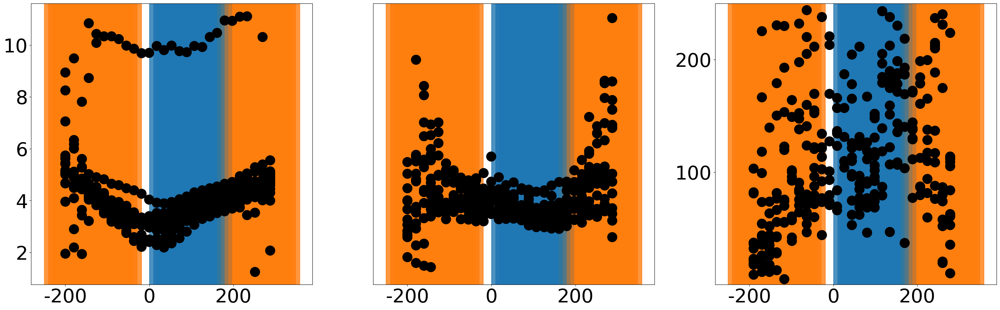

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1358  ACSF             388.429997          Neighbor               45.809505
1359  ACSF             370.472671          Neighbor              108.572589
1360  ACSF             352.449621              None              133.054860
1361  ACSF             334.753325              None              420.368202
1362  ACSF             317.097860              None             -670.971012
1363  ACSF             298.981643              None              126.957709
1364  ACSF             281.461479              Home              130.122041
1365  ACSF             262.854027              Home              216.442622
1366  ACSF             245.105732              Home              656.109538
1367  ACSF             227.390775              Home              329.621132
1368  ACSF             209.261613              Home              468.000847
1369  ACSF             191.945581              None              168.153445
1370  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3267  ACSF             388.429997          Neighbor             -239.431012
3268  ACSF             370.472671          Neighbor               47.180759
3269  ACSF             352.449621              None               48.884797
3270  ACSF             334.753325              None              125.216060
3271  ACSF             317.097860              None             -120.774782
3272  ACSF             298.981643              None                     NaN
3273  ACSF             281.461479              Home              191.829401
3274  ACSF             262.854027              Home              385.832500
3275  ACSF             245.105732              Home               99.522233
3276  ACSF             227.390775              Home             -517.976064
3277  ACSF             209.261613              Home              234.000424
3278  ACSF             191.945581              None             1605.101062
3279  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3290  ACSF             388.429997          Neighbor               59.461344
3291  ACSF             370.472671          Neighbor              187.740102
3292  ACSF             352.449621              None             -442.407411
3293  ACSF             334.753325              None             -294.257741
3294  ACSF             317.097860              None              270.391303
3295  ACSF             298.981643              None              166.858704
3296  ACSF             281.461479              Home              105.724159
3297  ACSF             262.854027              Home              113.771122
3298  ACSF             245.105732              Home              239.391318
3299  ACSF             227.390775              Home              241.722163
3300  ACSF             209.261613              Home             -509.295040
3301  ACSF             191.945581              None              178.344562
3302  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3313  ACSF             388.429997          Neighbor               63.008161
3314  ACSF             370.472671          Neighbor              100.128054
3315  ACSF             352.449621              None               76.607344
3316  ACSF             334.753325              None             -182.015098
3317  ACSF             317.097860              None              164.692885
3318  ACSF             298.981643              None              973.342437
3319  ACSF             281.461479              Home               75.030048
3320  ACSF             262.854027              Home              281.718968
3321  ACSF             245.105732              Home              233.091546
3322  ACSF             227.390775              Home                     NaN
3323  ACSF             209.261613              Home              293.492057
3324  ACSF             191.945581              None              116.158630
3325  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3336  ACSF             388.429997          Neighbor             2992.887652
3337  ACSF             370.472671          Neighbor              101.825140
3338  ACSF             352.449621              None                     NaN
3339  ACSF             334.753325              None              119.293679
3340  ACSF             317.097860              None                     NaN
3341  ACSF             298.981643              None              922.113888
3342  ACSF             281.461479              Home              146.515369
3343  ACSF             262.854027              Home              147.902458
3344  ACSF             245.105732              Home              167.122241
3345  ACSF             227.390775              Home                     NaN
3346  ACSF             209.261613              Home              112.441762
3347  ACSF             191.945581              None              299.256130
3348  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3359  ACSF             388.429997          Neighbor               40.812104
3360  ACSF             370.472671          Neighbor                9.314238
3361  ACSF             352.449621              None               -7.000117
3362  ACSF             334.753325              None              289.433844
3363  ACSF             317.097860              None                     NaN
3364  ACSF             298.981643              None              834.293518
3365  ACSF             281.461479              Home              404.509824
3366  ACSF             262.854027              Home              139.750354
3367  ACSF             245.105732              Home              354.299150
3368  ACSF             227.390775              Home              190.833287
3369  ACSF             209.261613              Home              139.645414
3370  ACSF             191.945581              None              275.876745
3371  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3382  ACSF             388.429997          Neighbor               59.461344
3383  ACSF             370.472671          Neighbor               42.607683
3384  ACSF             352.449621              None              152.554280
3385  ACSF             334.753325              None              100.888368
3386  ACSF             317.097860              None              377.421194
3387  ACSF             298.981643              None             -530.914057
3388  ACSF             281.461479              Home                     NaN
3389  ACSF             262.854027              Home              181.105051
3390  ACSF             245.105732              Home              242.670651
3391  ACSF             227.390775              Home               92.495726
3392  ACSF             209.261613              Home              201.349202
3393  ACSF             191.945581              None                     NaN
3394  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3405  ACSF             388.429997          Neighbor               20.267862
3406  ACSF             370.472671          Neighbor               54.450301
3407  ACSF             352.449621              None               76.940419
3408  ACSF             334.753325              None              140.122734
3409  ACSF             317.097860              None             -348.388795
3410  ACSF             298.981643              None             1592.742170
3411  ACSF             281.461479              Home              195.867915
3412  ACSF             262.854027              Home              322.696273
3413  ACSF             245.105732              Home              203.620201
3414  ACSF             227.390775              Home              146.202921
3415  ACSF             209.261613              Home              153.239216
3416  ACSF             191.945581              None              226.360406
3417  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3428  ACSF             388.429997          Neighbor               19.083237
3429  ACSF             370.472671          Neighbor              310.742237
3430  ACSF             352.449621              None              442.407411
3431  ACSF             334.753325              None              410.592197
3432  ACSF             317.097860              None             -348.388795
3433  ACSF             298.981643              None              584.005462
3434  ACSF             281.461479              Home              159.038051
3435  ACSF             262.854027              Home              126.773536
3436  ACSF             245.105732              Home              123.880822
3437  ACSF             227.390775              Home             1007.175680
3438  ACSF             209.261613              Home              166.500302
3439  ACSF             191.945581              None              259.648701
3440  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3451  ACSF             388.429997          Neighbor               20.475856
3452  ACSF             370.472671          Neighbor               97.421891
3453  ACSF             352.449621              None               82.692974
3454  ACSF             334.753325              None              333.121971
3455  ACSF             317.097860              None             -196.915406
3456  ACSF             298.981643              None              318.548434
3457  ACSF             281.461479              Home              150.060096
3458  ACSF             262.854027              Home             4437.073747
3459  ACSF             245.105732              Home              170.336130
3460  ACSF             227.390775              Home              164.810566
3461  ACSF             209.261613              Home              148.000268
3462  ACSF             191.945581              None              150.906937
3463  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3474  ACSF             388.429997          Neighbor               76.740709
3475  ACSF             370.472671          Neighbor              152.737710
3476  ACSF             352.449621              None               79.001323
3477  ACSF             334.753325              None             -105.721344
3478  ACSF             317.097860              None             -152.237120
3479  ACSF             298.981643              None               69.524460
3480  ACSF             281.461479              Home              238.557076
3481  ACSF             262.854027              Home              167.436745
3482  ACSF             245.105732              Home                     NaN
3483  ACSF             227.390775              Home              134.290091
3484  ACSF             209.261613              Home              106.889082
3485  ACSF             191.945581              None               98.637495
3486  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3497  ACSF             388.429997          Neighbor                6.768687
3498  ACSF             370.472671          Neighbor               68.269128
3499  ACSF             352.449621              None               30.563552
3500  ACSF             334.753325              None             -185.846994
3501  ACSF             317.097860              None             -341.815421
3502  ACSF             298.981643              None              278.097839
3503  ACSF             281.461479              Home              338.317307
3504  ACSF             262.854027              Home                     NaN
3505  ACSF             245.105732              Home              112.834124
3506  ACSF             227.390775              Home             -329.621132
3507  ACSF             209.261613              Home              196.773084
3508  ACSF             191.945581              None               48.908897
3509  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3520  ACSF             388.429997          Neighbor              -75.450949
3521  ACSF             370.472671          Neighbor               60.480033
3522  ACSF             352.449621              None               19.995815
3523  ACSF             334.753325              None              -81.738261
3524  ACSF             317.097860              None              152.237120
3525  ACSF             298.981643              None             -143.607901
3526  ACSF             281.461479              Home             -715.671227
3527  ACSF             262.854027              Home             -145.477828
3528  ACSF             245.105732              Home                     NaN
3529  ACSF             227.390775              Home              106.642131
3530  ACSF             209.261613              Home              123.685938
3531  ACSF             191.945581              None              103.252115
3532  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3543  ACSF             388.429997          Neighbor               74.822191
3544  ACSF             370.472671          Neighbor              -88.783496
3545  ACSF             352.449621              None              121.207510
3546  ACSF             334.753325              None               80.988369
3547  ACSF             317.097860              None              141.532948
3548  ACSF             298.981643              None              357.554365
3549  ACSF             281.461479              Home              131.038394
3550  ACSF             262.854027              Home              204.003391
3551  ACSF             245.105732              Home                     NaN
3552  ACSF             227.390775              Home                     NaN
3553  ACSF             209.261613              Home               41.826163
3554  ACSF             191.945581              None              706.244467
3555  ACSF  

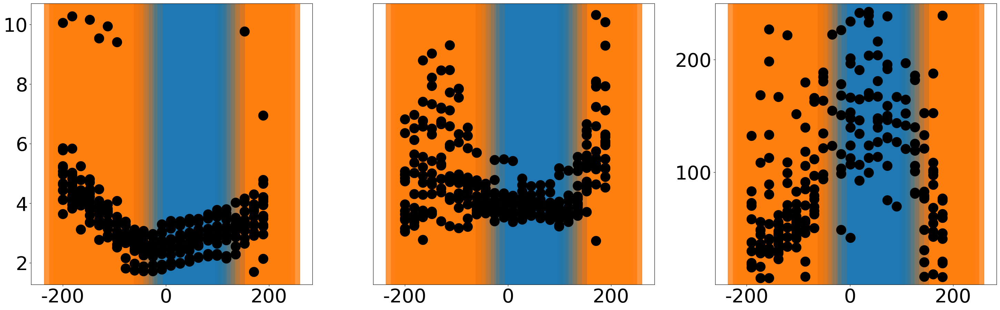

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1381  ACSF             370.751421          Neighbor               65.134056
1382  ACSF             353.165226          Neighbor                     NaN
1383  ACSF             335.685803              None               63.787050
1384  ACSF             317.378919              None              203.027220
1385  ACSF             299.715551              None              225.526861
1386  ACSF             282.124456              None              448.160281
1387  ACSF             264.198045              None              349.028441
1388  ACSF             246.746623              None              842.869354
1389  ACSF             229.046366              Home              485.889470
1390  ACSF             211.068456              Home              247.484450
1391  ACSF             193.744544              Home             1953.264590
1392  ACSF             176.165163              None              -80.120241
1393  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3566  ACSF             370.751421          Neighbor               76.461718
3567  ACSF             353.165226          Neighbor               65.466004
3568  ACSF             335.685803              None              174.351270
3569  ACSF             317.378919              None               81.024624
3570  ACSF             299.715551              None              124.759540
3571  ACSF             282.124456              None              263.623695
3572  ACSF             264.198045              None              396.623229
3573  ACSF             246.746623              None              113.463182
3574  ACSF             229.046366              Home              191.254366
3575  ACSF             211.068456              Home              150.642709
3576  ACSF             193.744544              Home                     NaN
3577  ACSF             176.165163              None             -130.883448
3578  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3588  ACSF             370.751421          Neighbor               70.912077
3589  ACSF             353.165226          Neighbor              176.559828
3590  ACSF             335.685803              None              121.237638
3591  ACSF             317.378919              None              110.396051
3592  ACSF             299.715551              None               93.569655
3593  ACSF             282.124456              None              174.042827
3594  ACSF             264.198045              None              245.794677
3595  ACSF             246.746623              None              310.530815
3596  ACSF             229.046366              Home              221.949511
3597  ACSF             211.068456              Home              279.417928
3598  ACSF             193.744544              Home              627.835047
3599  ACSF             176.165163              None             -140.538784
3600  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3610  ACSF             370.751421          Neighbor              428.931589
3611  ACSF             353.165226          Neighbor               60.273872
3612  ACSF             335.685803              None               66.813443
3613  ACSF             317.378919              None              271.744125
3614  ACSF             299.715551              None                     NaN
3615  ACSF             282.124456              None              117.166086
3616  ACSF             264.198045              None              145.428517
3617  ACSF             246.746623              None              393.339032
3618  ACSF             229.046366              Home              214.022743
3619  ACSF             211.068456              Home              157.490105
3620  ACSF             193.744544              Home              283.538408
3621  ACSF             176.165163              None             -357.202743
3622  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3632  ACSF             370.751421          Neighbor                     NaN
3633  ACSF             353.165226          Neighbor               70.766895
3634  ACSF             335.685803              None               84.363518
3635  ACSF             317.378919              None              238.694164
3636  ACSF             299.715551              None               73.296230
3637  ACSF             282.124456              None              309.076056
3638  ACSF             264.198045              None              138.503350
3639  ACSF             246.746623              None              122.070734
3640  ACSF             229.046366              Home               86.018710
3641  ACSF             211.068456              Home              247.484450
3642  ACSF             193.744544              Home                     NaN
3643  ACSF             176.165163              None             -311.740575
3644  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3654  ACSF             370.751421          Neighbor              125.615680
3655  ACSF             353.165226          Neighbor               97.107905
3656  ACSF             335.685803              None               42.084789
3657  ACSF             317.378919              None               93.954086
3658  ACSF             299.715551              None              189.151561
3659  ACSF             282.124456              None               80.387494
3660  ACSF             264.198045              None              132.207743
3661  ACSF             246.746623              None              305.176835
3662  ACSF             229.046366              Home               90.797527
3663  ACSF             211.068456              Home               99.562710
3664  ACSF             193.744544              Home              532.708525
3665  ACSF             176.165163              None             -336.190817
3666  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3676  ACSF             370.751421          Neighbor               79.937251
3677  ACSF             353.165226          Neighbor               46.861724
3678  ACSF             335.685803              None             3051.147231
3679  ACSF             317.378919              None               74.528979
3680  ACSF             299.715551              None              144.189305
3681  ACSF             282.124456              None              117.936916
3682  ACSF             264.198045              None              107.063939
3683  ACSF             246.746623              None              316.076008
3684  ACSF             229.046366              Home              135.172259
3685  ACSF             211.068456              Home              173.239115
3686  ACSF             193.744544              Home             1034.081254
3687  ACSF             176.165163              None             -714.405485
3688  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3698  ACSF             370.751421          Neighbor             -390.804337
3699  ACSF             353.165226          Neighbor              118.907639
3700  ACSF             335.685803              None              151.296557
3701  ACSF             317.378919              None              551.980253
3702  ACSF             299.715551              None               63.967619
3703  ACSF             282.124456              None              407.418437
3704  ACSF             264.198045              None              125.549799
3705  ACSF             246.746623              None              117.220241
3706  ACSF             229.046366              Home               96.138558
3707  ACSF             211.068456              Home              168.193316
3708  ACSF             193.744544              Home              764.320927
3709  ACSF             176.165163              None             -489.878047
3710  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3720  ACSF             370.751421          Neighbor             -274.784299
3721  ACSF             353.165226          Neighbor               68.278996
3722  ACSF             335.685803              None               54.484772
3723  ACSF             317.378919              None              430.813856
3724  ACSF             299.715551              None               55.668023
3725  ACSF             282.124456              None               84.959295
3726  ACSF             264.198045              None               91.368702
3727  ACSF             246.746623              None              272.311638
3728  ACSF             229.046366              Home               94.620581
3729  ACSF             211.068456              Home              201.440832
3730  ACSF             193.744544              Home             2197.422664
3731  ACSF             176.165163              None             -504.286225
3732  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3742  ACSF             370.751421          Neighbor                     NaN
3743  ACSF             353.165226          Neighbor              118.104209
3744  ACSF             335.685803              None              186.804932
3745  ACSF             317.378919              None              223.586938
3746  ACSF             299.715551              None               54.972172
3747  ACSF             282.124456              None              136.842834
3748  ACSF             264.198045              None              133.216962
3749  ACSF             246.746623              None             -354.005129
3750  ACSF             229.046366              Home              219.242810
3751  ACSF             211.068456              Home              274.982723
3752  ACSF             193.744544              Home             -258.520313
3753  ACSF             176.165163              None             -231.699076
3754  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3764  ACSF             370.751421          Neighbor               31.126009
3765  ACSF             353.165226          Neighbor              436.985574
3766  ACSF             335.685803              None               45.426510
3767  ACSF             317.378919              None               46.360546
3768  ACSF             299.715551              None              120.486953
3769  ACSF             282.124456              None               69.213943
3770  ACSF             264.198045              None             -387.809379
3771  ACSF             246.746623              None              103.510272
3772  ACSF             229.046366              Home              185.339283
3773  ACSF             211.068456              Home             2165.488940
3774  ACSF             193.744544              Home             -214.382699
3775  ACSF             176.165163              None                     NaN
3776  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3786  ACSF             370.751421          Neighbor              -56.185927
3787  ACSF             353.165226          Neighbor               43.808078
3788  ACSF             335.685803              None               -7.000720
3789  ACSF             317.378919              None                8.411128
3790  ACSF             299.715551              None               41.004884
3791  ACSF             282.124456              None              -99.591173
3792  ACSF             264.198045              None              146.650606
3793  ACSF             246.746623              None              -20.823831
3794  ACSF             229.046366              Home               32.276320
3795  ACSF             211.068456              Home               25.107118
3796  ACSF             193.744544              Home               89.690721
3797  ACSF             176.165163              None               40.629696
3798  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3808  ACSF             370.751421          Neighbor              439.654879
3809  ACSF             353.165226          Neighbor             -163.359093
3810  ACSF             335.685803              None               44.760106
3811  ACSF             317.378919              None                     NaN
3812  ACSF             299.715551              None               81.440255
3813  ACSF             282.124456              None               92.404182
3814  ACSF             264.198045              None              226.641845
3815  ACSF             246.746623              None             -368.755343
3816  ACSF             229.046366              Home             -619.927945
3817  ACSF             211.068456              Home             -153.308952
3818  ACSF             193.744544              Home             -159.812557
3819  ACSF             176.165163              None              160.240483
3820  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3830  ACSF             370.751421          Neighbor               32.748967
3831  ACSF             353.165226          Neighbor               48.961969
3832  ACSF             335.685803              None               29.432288
3833  ACSF             317.378919              None               40.887426
3834  ACSF             299.715551              None               58.056420
3835  ACSF             282.124456              None               90.537430
3836  ACSF             264.198045              None                     NaN
3837  ACSF             246.746623              None             -109.260842
3838  ACSF             229.046366              Home              -92.194412
3839  ACSF             211.068456              Home             -138.591292
3840  ACSF             193.744544              Home             -366.237111
3841  ACSF             176.165163              None              439.634145
3842  ACSF  

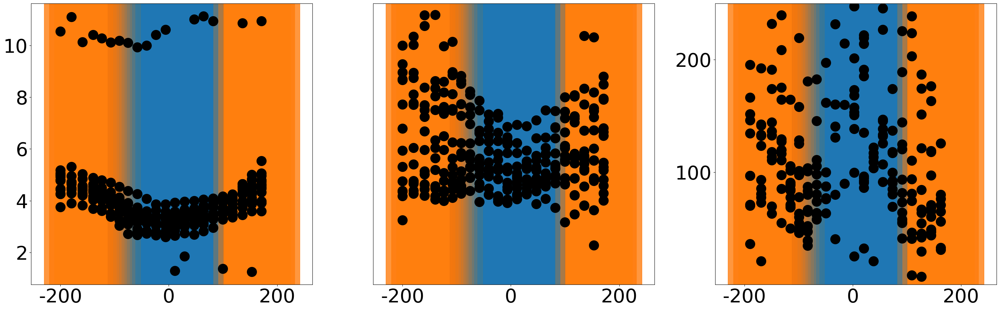

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1403  ACSF             444.364715              None               -4.072139
1404  ACSF             426.380112              None               52.505829
1405  ACSF             408.396866              None               27.799372
1406  ACSF             390.288355              None               17.567941
1407  ACSF             372.302297          Neighbor              -54.350687
1408  ACSF             354.317654          Neighbor               11.088297
1409  ACSF             336.334655          Neighbor              966.724610
1410  ACSF             318.353577          Neighbor               38.367074
1411  ACSF             300.374766          Neighbor               24.005779
1412  ACSF             282.255204          Neighbor               70.603130
1413  ACSF             264.272587              None               83.202580
1414  ACSF             246.292509              None              167.097021
1415  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3852  ACSF             444.364715              None                3.512618
3853  ACSF             426.380112              None                6.908662
3854  ACSF             408.396866              None               -8.541750
3855  ACSF             390.288355              None                3.897304
3856  ACSF             372.302297          Neighbor              -91.758380
3857  ACSF             354.317654          Neighbor               18.037111
3858  ACSF             336.334655          Neighbor               11.373231
3859  ACSF             318.353577          Neighbor              209.055943
3860  ACSF             300.374766          Neighbor               30.149022
3861  ACSF             282.255204          Neighbor             -216.658038
3862  ACSF             264.272587              None              149.833979
3863  ACSF             246.292509              None               92.926405
3864  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3878  ACSF             444.364715              None                2.784856
3879  ACSF             426.380112              None              -41.918989
3880  ACSF             408.396866              None               -9.215527
3881  ACSF             390.288355              None                7.997358
3882  ACSF             372.302297          Neighbor               73.108303
3883  ACSF             354.317654          Neighbor             -544.939373
3884  ACSF             336.334655          Neighbor                2.718639
3885  ACSF             318.353577          Neighbor               21.251550
3886  ACSF             300.374766          Neighbor               40.535933
3887  ACSF             282.255204          Neighbor               64.685673
3888  ACSF             264.272587              None             -276.616577
3889  ACSF             246.292509              None              728.543013
3890  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3904  ACSF             444.364715              None               -4.730301
3905  ACSF             426.380112              None                3.348212
3906  ACSF             408.396866              None              -13.844427
3907  ACSF             390.288355              None              114.560882
3908  ACSF             372.302297          Neighbor              -87.304090
3909  ACSF             354.317654          Neighbor               28.681020
3910  ACSF             336.334655          Neighbor               29.769996
3911  ACSF             318.353577          Neighbor               17.106385
3912  ACSF             300.374766          Neighbor               44.302108
3913  ACSF             282.255204          Neighbor               62.009025
3914  ACSF             264.272587              None                     NaN
3915  ACSF             246.292509              None              202.373059
3916  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3930  ACSF             444.364715              None                5.167989
3931  ACSF             426.380112              None                2.820017
3932  ACSF             408.396866              None                3.700901
3933  ACSF             390.288355              None              -60.559119
3934  ACSF             372.302297          Neighbor               48.216200
3935  ACSF             354.317654          Neighbor              899.149966
3936  ACSF             336.334655          Neighbor               64.680136
3937  ACSF             318.353577          Neighbor             -781.687439
3938  ACSF             300.374766          Neighbor              110.485136
3939  ACSF             282.255204          Neighbor               47.826109
3940  ACSF             264.272587              None               54.156860
3941  ACSF             246.292509              None              167.097021
3942  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3956  ACSF             444.364715              None              -16.260943
3957  ACSF             426.380112              None                1.340033
3958  ACSF             408.396866              None              -15.691950
3959  ACSF             390.288355              None             -149.883820
3960  ACSF             372.302297          Neighbor               78.880011
3961  ACSF             354.317654          Neighbor                7.747953
3962  ACSF             336.334655          Neighbor              199.789753
3963  ACSF             318.353577          Neighbor               18.051015
3964  ACSF             300.374766          Neighbor              292.251004
3965  ACSF             282.255204          Neighbor               71.077538
3966  ACSF             264.272587              None             -110.307224
3967  ACSF             246.292509              None               58.190336
3968  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3982  ACSF             444.364715              None               -4.531268
3983  ACSF             426.380112              None                2.750573
3984  ACSF             408.396866              None               -2.714512
3985  ACSF             390.288355              None               42.722229
3986  ACSF             372.302297          Neighbor                8.700843
3987  ACSF             354.317654          Neighbor               -2.589718
3988  ACSF             336.334655          Neighbor              -23.443387
3989  ACSF             318.353577          Neighbor                3.124033
3990  ACSF             300.374766          Neighbor              -15.701527
3991  ACSF             282.255204          Neighbor              -17.093743
3992  ACSF             264.272587              None              -18.593669
3993  ACSF             246.292509              None                7.766983
3994  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4008  ACSF             444.364715              None                1.957188
4009  ACSF             426.380112              None               46.229425
4010  ACSF             408.396866              None             -129.346506
4011  ACSF             390.288355              None              -14.423463
4012  ACSF             372.302297          Neighbor             -107.692470
4013  ACSF             354.317654          Neighbor               -7.449461
4014  ACSF             336.334655          Neighbor                4.154593
4015  ACSF             318.353577          Neighbor              -20.523757
4016  ACSF             300.374766          Neighbor              -36.239124
4017  ACSF             282.255204          Neighbor              -84.425433
4018  ACSF             264.272587              None               72.793836
4019  ACSF             246.292509              None             -246.129396
4020  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4034  ACSF             444.364715              None             -152.411890
4035  ACSF             426.380112              None               81.742029
4036  ACSF             408.396866              None              208.143803
4037  ACSF             390.288355              None             -101.616149
4038  ACSF             372.302297          Neighbor                     NaN
4039  ACSF             354.317654          Neighbor               48.082886
4040  ACSF             336.334655          Neighbor               30.373442
4041  ACSF             318.353577          Neighbor               43.114655
4042  ACSF             300.374766          Neighbor              101.226605
4043  ACSF             282.255204          Neighbor             -114.538963
4044  ACSF             264.272587              None               18.235373
4045  ACSF             246.292509              None               71.706989
4046  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4060  ACSF             444.364715              None              -67.106727
4061  ACSF             426.380112              None              -73.102627
4062  ACSF             408.396866              None               -5.925560
4063  ACSF             390.288355              None             -107.700949
4064  ACSF             372.302297          Neighbor               -4.192224
4065  ACSF             354.317654          Neighbor                2.709507
4066  ACSF             336.334655          Neighbor              -18.652570
4067  ACSF             318.353577          Neighbor               43.011510
4068  ACSF             300.374766          Neighbor              -25.342045
4069  ACSF             282.255204          Neighbor               73.699251
4070  ACSF             264.272587              None              119.073361
4071  ACSF             246.292509              None              256.529230
4072  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4086  ACSF             444.364715              None                2.711792
4087  ACSF             426.380112              None               -0.962494
4088  ACSF             408.396866              None               -3.229626
4089  ACSF             390.288355              None                0.637306
4090  ACSF             372.302297          Neighbor               -3.596928
4091  ACSF             354.317654          Neighbor               -0.764843
4092  ACSF             336.334655          Neighbor                0.867101
4093  ACSF             318.353577          Neighbor                4.288839
4094  ACSF             300.374766          Neighbor              -37.359922
4095  ACSF             282.255204          Neighbor              151.114430
4096  ACSF             264.272587              None               20.225059
4097  ACSF             246.292509              None                     NaN
4098  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4112  ACSF             444.364715              None             -126.652134
4113  ACSF             426.380112              None               -4.581719
4114  ACSF             408.396866              None              196.831640
4115  ACSF             390.288355              None               -3.146066
4116  ACSF             372.302297          Neighbor                3.202964
4117  ACSF             354.317654          Neighbor                4.443538
4118  ACSF             336.334655          Neighbor               -5.375509
4119  ACSF             318.353577          Neighbor              -25.215724
4120  ACSF             300.374766          Neighbor               22.425201
4121  ACSF             282.255204          Neighbor              -81.739169
4122  ACSF             264.272587              None               29.331285
4123  ACSF             246.292509              None             -175.130532
4124  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4138  ACSF             444.364715              None                2.518852
4139  ACSF             426.380112              None               -2.332760
4140  ACSF             408.396866              None               -2.170504
4141  ACSF             390.288355              None                1.098519
4142  ACSF             372.302297          Neighbor              -29.531433
4143  ACSF             354.317654          Neighbor              -45.642130
4144  ACSF             336.334655          Neighbor               -2.759951
4145  ACSF             318.353577          Neighbor                3.025208
4146  ACSF             300.374766          Neighbor                1.792951
4147  ACSF             282.255204          Neighbor               17.509851
4148  ACSF             264.272587              None               84.811686
4149  ACSF             246.292509              None               72.276093
4150  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4164  ACSF             444.364715              None              -28.456650
4165  ACSF             426.380112              None              -50.232532
4166  ACSF             408.396866              None               -4.523735
4167  ACSF             390.288355              None             -116.792587
4168  ACSF             372.302297          Neighbor               89.032883
4169  ACSF             354.317654          Neighbor              -75.242675
4170  ACSF             336.334655          Neighbor                8.497674
4171  ACSF             318.353577          Neighbor              -10.688948
4172  ACSF             300.374766          Neighbor              724.782490
4173  ACSF             282.255204          Neighbor                3.975816
4174  ACSF             264.272587              None              -21.741327
4175  ACSF             246.292509              None                4.525112
4176  ACSF  

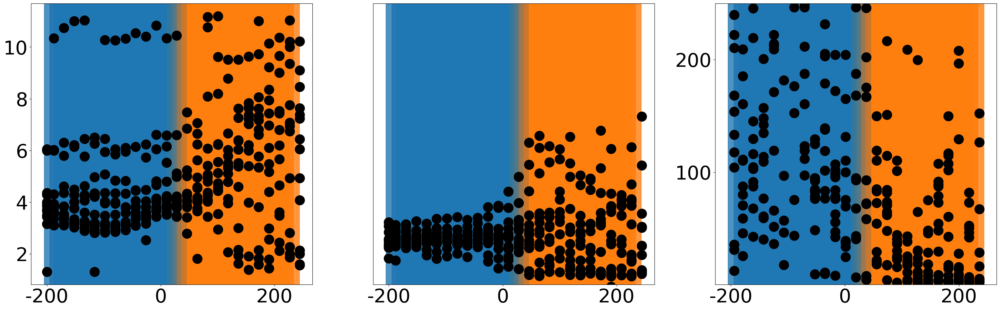

In [64]:
def identify_overlap_barrel(barrel_rois, roi):
    """ return a list of bools of whether roi overlaps w the barrel in barrel_rois
        0 - home barrel, 1 or 2 - neighbor barrel """
    overlap_ctr = OverlapCounterROI([], [])
    is_overlap = [overlap_ctr.do_rois_overlap(barrel, roi) for barrel in barrel_rois]
    return is_overlap

# set matplotlib font size
plt.rcParams.update({'font.size': 40})

# for each Slice/Location/Recording, plot the latency of each ladder ROI
num_legends = 1
for date in ladder_df['Date'].unique():
    date_df = ladder_df[ladder_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]

        # see if we have an ROI file for this slice/recording
        # look up ROI file from crossing_data
        barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == slic_df['Recording'].values[0]) ]
        if barrel_df_sub.empty:
            # then try to look it up in ppr_df_for_roi_lookup
            barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == slic_df['Recording'].values[0]) ]
            if barrel_df_sub.empty:
                print('No ROI file found for ', date, slic, slic_df['Recording'].values[0])
                continue
        handles = []
        fig, ax = plt.subplots(1, 3, figsize=(30, 10))

        for rec in slic_df['Recording'].unique():
            rec_df = slic_df[slic_df['Recording'] == rec]

            # look up ROI file from crossing_data
            barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == rec) ]
            if barrel_df_sub.empty:
                # then try to look it up in ppr_df_for_roi_lookup
                barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == rec) ]
                if barrel_df_sub.empty:
                    print('No ROI file found for ', date, slic, rec)
                    continue

            roi_file = barrel_df_sub['ROI file'].values[0]
            drug = barrel_df_sub['drug'].values[0]
            stim_layer = barrel_df_sub['Layer'].values[0]

            # save roi_file, drug, and stim_layer in ladder_df in new columns
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'ROI file'] = roi_file
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'drug'] = drug
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'Layer'] = stim_layer

            # read in the ROI file
            rois = ROIFileReader(roi_file).get_roi_list()

            # get the center of the home barrel
            home_barrel_center = LaminarROI(rois[0], input_diode_numbers=True).get_center()

            # convert from diode to pixel
            rois = [LaminarROI(roi, input_diode_numbers=True).get_points()
                        for roi in rois]

            # first roi is home barrel, rest are neighboring barrels
            home_barrel = rois[0]
            neighbor_barrels = rois[1:]

            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[rec_df['ROI'] == roi]
                # get the center of the ROI
                x_center = roi_df['X_Center'].values[0]
                y_center = roi_df['Y_Center'].values[0]

                is_overlap = identify_overlap_barrel(rois, [[int(x_center), int(y_center)]])

                # also calculate distance from home barrel along barrel axis
                ln = Line(home_barrel_center, [x_center, y_center])
                dist = ln.get_length()

                resides_in_barrel = None
                if is_overlap[0]:
                    resides_in_barrel = 'Home'
                elif is_overlap[1] or (len(is_overlap) > 2 and is_overlap[2]):
                    resides_in_barrel = 'Neighbor'

                # store in ladder_df
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'resides_in_barrel'] = resides_in_barrel

            # now calculate which ROI is the closest to the home barrel
            arg_min = rec_df['Dist_from_home_barrel'].argmin()
            # get the ROI of the closest ROI
            closest_roi = rec_df.iloc[arg_min]
            closest_x = closest_roi['X_Center']
            closest_y = closest_roi['Y_Center']

            # also, which ROI is closest to the stim (min Stim_Distance)
            arg_min_stim = rec_df['Stim_Distance'].argmin()
            closest_stim_roi = rec_df.iloc[arg_min_stim]
            
            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[(rec_df['ROI'] == roi)]
                dist_to_closest_roi = Line([closest_x, closest_y], 
                                            [roi_df['X_Center'].values[0],
                                                roi_df['Y_Center'].values[0]]).get_length()

                # denote negative distances as those to one side of the closest ROI
                if roi_df['ROI'].values[0] > closest_roi['ROI']:
                    dist_to_closest_roi *= -1

                ladder_df.loc[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist_to_closest_roi * 6.0  # px -> um
                
                # refresh data before plotting
                roi_df = ladder_df[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi)]

                color = 'black' if drug == 'ACSF' else 'tab:green'
                region_color = None
                if roi_df['resides_in_barrel'].values[0] == 'Home':
                    region_color = 'tab:blue'
                if np.abs(roi - closest_stim_roi['ROI']) < 2:
                    region_color = 'tab:blue'
                elif roi_df['resides_in_barrel'].values[0] == 'Neighbor':
                    region_color = 'tab:orange'
                
                for sub_ax in ax:
                    # shade a vertical region of each plot around this ROI
                    if region_color is not None:
                        for radius in range(1, 76, 10):
                            sub_ax.axvspan(roi_df['Dist_from_home_barrel'].values[0] - radius, 
                                        roi_df['Dist_from_home_barrel'].values[0] + radius, 
                                        color=region_color, alpha=(0.06 if stim_layer == 'L2/3' else 0.1))
                    # draw a black dotted vertical line at the closest_stim_roi
                    if roi == closest_stim_roi['ROI'] and drug != 'ACSF':
                        #sub_ax.axvline(x=roi_df['Dist_from_home_barrel'].values[0], color='black', linestyle='--',
                        #            linewidth=4)

                        # and a black star next to the line at 50% the middle of the y-axis scale
                        middle_y = (sub_ax.get_ylim()[0] + sub_ax.get_ylim()[1]) / 2
                        if sub_ax == ax[2]:
                            middle_y = 0

                        #sub_ax.plot(roi_df['Dist_from_home_barrel'].values[0], middle_y, 
                        #            color='black', marker='*', markersize=20)
                
                if drug == 'ACSF':  # exclude NBQX data from the plot now
                    # plot the latency vs distance from home barrel
                    #if 10 > roi_df['latency'].values[0] > 1:
                    # remove latency values > 10 ms
                    if stim_layer == 'L2/3':
                        roi_df = roi_df[roi_df['latency'] < 5]

                    # stim time is 1.2 ms before the closest multiple of 10 (e.g. measured 48.8)
                    # only apply latency correction to values > 10 ms
                    for lat in roi_df['latency']:
                        if lat > 10:
                            roi_df['latency'] = (roi_df['latency'] % 10) + 1.2

                    ax[0].plot(roi_df['Dist_from_home_barrel'], roi_df['latency'], 
                            label=str(resides_in_barrel),
                            color=color, marker='o', markersize=20,
                            markeredgecolor='black')

                    # Now also plot the amplitude vs distance from home barrel
                    #ax[1].plot(roi_df['Dist_from_home_barrel'], roi_df['amp'] / 10, 
                    #            label=drug,
                    #            color=color, marker='o', markersize=20,
                    #            markeredgecolor='black')

                    # now also plot the half-width vs distance from home barrel
                    ax[1].plot(roi_df['Dist_from_home_barrel'], roi_df['halfwidth'], 
                                label=drug,
                                color=color, marker='o', markersize=20,
                                markeredgecolor='black')
            
            # now we also want to calculate the velocity of the ladder
            # for each pair of ROIs i and i+1, calculate the velocity as the distance between the two ROIs
            # divided by the difference in latency between the two ROIs
            # this will give the velocity in um/ms
            for i in range(1, len(rec_df)):
                roi1 = rec_df.iloc[i-1]
                roi2 = rec_df.iloc[i]
                dist = roi2['Dist_from_home_barrel'] - roi1['Dist_from_home_barrel']
                position = (roi2['Dist_from_home_barrel'] + roi1['Dist_from_home_barrel']) / 2
                latency_diff = roi2['latency'] - roi1['latency']
                velocity = dist / latency_diff
                if 5000 > velocity > -1000:
                    if drug == 'ACSF':
                        ax[2].plot(position, np.abs(velocity), color=color, linestyle='-', marker='o', markersize=20,
                    markeredgecolor='black')
                    # track this in the df as the velocity of roi i-1
                    ladder_df.loc[(ladder_df['Date'] == date) &
                                    (ladder_df['Slice'] == slic) &
                                    (ladder_df['Recording'] == rec) &
                                    (ladder_df['ROI'] == roi1['ROI']), 'instantaneous_velocity'] = velocity
            
            if drug == 'ACSF':
                subset_df_ = ladder_df[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec)]
                print(subset_df_[['drug', 'Dist_from_home_barrel', 'resides_in_barrel', 'instantaneous_velocity']])
                if len(subset_df_) > 40:
                    print(subset_df_)


        #for sub_ax in ax:
            #sub_ax.set_xlabel('Distance along L4 (um)')
        #ax[0].set_ylabel('Latency (ms)')
        #ax[1].set_ylabel('Δf/f (%)')
        #ax[2].set_ylabel('Half-Width (ms)')
        #ax[3].set_ylabel('Velocity (um/ms)')
        ax[1].set_ylim(0, ax[1].get_ylim()[1])
        
        for i in range(3):
            ax[i].set_xticks([0, 200, 400])
            ax[i].set_xticklabels([-200, 0, 200])
        #ax[0].set_yticks([])
        ax[1].set_yticks([])
        ax[2].set_ylim(0, 250)
        ax[2].set_yticks([100, 200])
        #ax[0].set_title()
        handles = ax[0].get_legend_handles_labels()
        handles = [handles[0][0], handles[0][-1]]
        if num_legends > 0:
            #ax[0].legend(handles=handles, labels=['ACSF', '+NBQX'], loc='upper left')
            num_legends -= 1
        plt.tight_layout()
        plt.savefig(output_fig_dir + 'Ladder_velocity_plot_' \
                + date.replace('/', '-') + '_' + str(slic) + '_' + stim_layer.replace("/", "") + '_' + str(rec) + '_latency.png')
        print('Date: ' + date + '   Slice: ' + str(slic) + '   Stim: ' + stim_layer )
        plt.show()
        

(2, 3)


C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\1905392563.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\1905392563.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\1905392563.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1179  ACSF             395.851117              None               59.992779
1180  ACSF             377.853283              None              -34.210721
1181  ACSF             359.721601          Neighbor               99.448681
1182  ACSF             341.820838          Neighbor              102.273456
1183  ACSF             323.922983          Neighbor              109.085955
1184  ACSF             305.923801          Neighbor              116.123099
1185  ACSF             287.924720          Neighbor               24.455106
1186  ACSF             269.925763              None              109.117144
1187  ACSF             251.812317              None               73.770492
1188  ACSF             233.812317              None              189.473684
1189  ACSF             215.812317              None              610.881590
1190  ACSF             198.096751              None               53.227564
1191  ACSF  

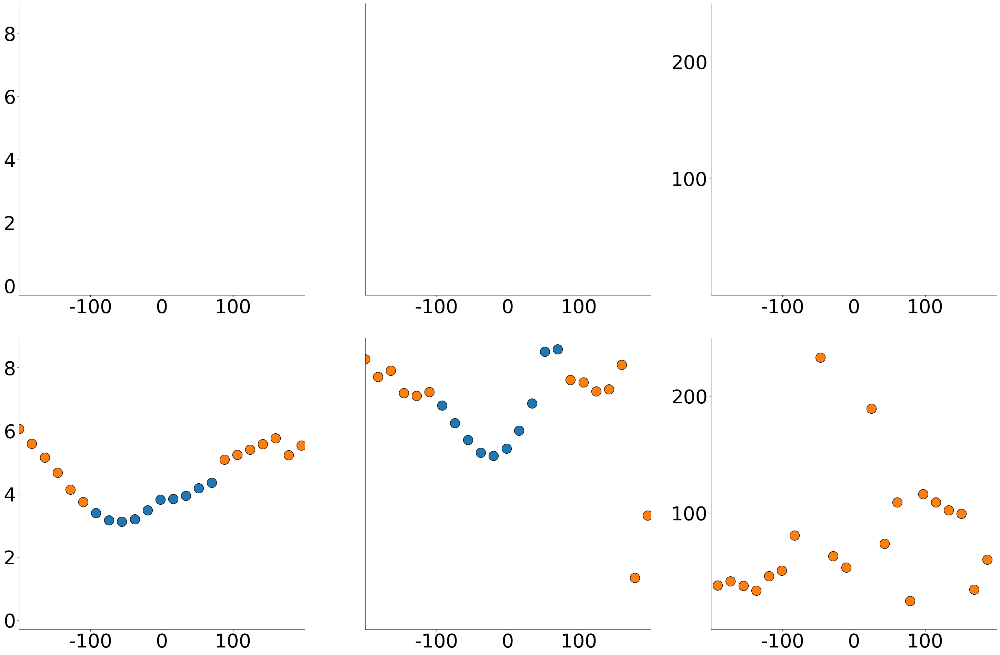

In [65]:
def identify_overlap_barrel(barrel_rois, roi):
    """ return a list of bools of whether roi overlaps w the barrel in barrel_rois
        0 - home barrel, 1 or 2 - neighbor barrel """
    overlap_ctr = OverlapCounterROI([], [])
    is_overlap = [overlap_ctr.do_rois_overlap(barrel, roi) for barrel in barrel_rois]
    return is_overlap

# set matplotlib font size
plt.rcParams.update({'font.size': 40})

# for each Slice/Location/Recording, plot the latency of each ladder ROI
num_legends = 1
for date in ladder_df['Date'].unique():
    date_df = ladder_df[ladder_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]

        if not (date == '1/22/2025' and slic == 3): #(date == '7/1/2024' and slic == 3): #:(date == '1/15/2025' and slic == 1): # 
            continue

        # see if we have an ROI file for this slice/recording
        # look up ROI file from crossing_data
        barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == slic_df['Recording'].values[0]) ]
        if barrel_df_sub.empty:
            # then try to look it up in ppr_df_for_roi_lookup
            barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == slic_df['Recording'].values[0]) ]
            if barrel_df_sub.empty:
                print('No ROI file found for ', date, slic, slic_df['Recording'].values[0])
                continue
        handles = []
        fig, ax = plt.subplots(2, 3, figsize=(30, 20))
        print(ax.shape)

        for rec in slic_df['Recording'].unique():
            rec_df = slic_df[slic_df['Recording'] == rec]

            # look up ROI file from crossing_data
            barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == rec) ]
            if barrel_df_sub.empty:
                # then try to look it up in ppr_df_for_roi_lookup
                barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == rec) ]
                if barrel_df_sub.empty:
                    print('No ROI file found for ', date, slic, rec)
                    continue

            roi_file = barrel_df_sub['ROI file'].values[0]
            drug = barrel_df_sub['drug'].values[0]
            stim_layer = barrel_df_sub['Layer'].values[0]

            # save roi_file, drug, and stim_layer in ladder_df in new columns
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'ROI file'] = roi_file
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'drug'] = drug
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'Layer'] = stim_layer

            # read in the ROI file
            rois = ROIFileReader(roi_file).get_roi_list()

            # get the center of the home barrel
            home_barrel_center = LaminarROI(rois[0], input_diode_numbers=True).get_center()

            # convert from diode to pixel
            rois = [LaminarROI(roi, input_diode_numbers=True).get_points()
                        for roi in rois]

            # first roi is home barrel, rest are neighboring barrels
            home_barrel = rois[0]
            neighbor_barrels = rois[1:]

            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[rec_df['ROI'] == roi]
                # get the center of the ROI
                x_center = roi_df['X_Center'].values[0]
                y_center = roi_df['Y_Center'].values[0]

                is_overlap = identify_overlap_barrel(rois, [[int(x_center), int(y_center)]])

                # also calculate distance from home barrel along barrel axis
                ln = Line(home_barrel_center, [x_center, y_center])
                dist = ln.get_length()

                resides_in_barrel = None
                if is_overlap[0]:
                    resides_in_barrel = 'Home'
                elif is_overlap[1] or (len(is_overlap) > 2 and is_overlap[2]):
                    resides_in_barrel = 'Neighbor'

                # store in ladder_df
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'resides_in_barrel'] = resides_in_barrel

            # now calculate which ROI is the closest to the home barrel
            arg_min = rec_df['Dist_from_home_barrel'].argmin()
            # get the ROI of the closest ROI
            closest_roi = rec_df.iloc[arg_min]
            closest_x = closest_roi['X_Center']
            closest_y = closest_roi['Y_Center']

            # also, which ROI is closest to the stim (min Stim_Distance)
            arg_min_stim = rec_df['Stim_Distance'].argmin()
            closest_stim_roi = rec_df.iloc[arg_min_stim]
            
            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[(rec_df['ROI'] == roi)]
                dist_to_closest_roi = Line([closest_x, closest_y], 
                                            [roi_df['X_Center'].values[0],
                                                roi_df['Y_Center'].values[0]]).get_length()

                # denote negative distances as those to one side of the closest ROI
                if roi_df['ROI'].values[0] > closest_roi['ROI']:
                    dist_to_closest_roi *= -1

                ladder_df.loc[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist_to_closest_roi * 6.0  # px -> um
                
                # refresh data before plotting
                roi_df = ladder_df[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi)]

                
                region_color = None
                i_resides_in_barrel = None

                if roi_df['resides_in_barrel'].values[0] == 'Home' or (np.abs(roi_df['Dist_from_home_barrel'].values[0] - 200) < 100):
                    region_color = 'tab:blue'
                    i_resides_in_barrel = 0
                if np.abs(roi - closest_stim_roi['ROI']) < 2:
                    region_color = 'tab:blue'
                    i_resides_in_barrel = 0
                elif roi_df['resides_in_barrel'].values[0] == 'Neighbor':
                    region_color = 'tab:orange'
                    i_resides_in_barrel = 1
                color = 'tab:orange' if i_resides_in_barrel == 1 else 'tab:blue' if i_resides_in_barrel == 0 else 'tab:orange'
                i_resides_in_barrel = 1
                
                for sub_ax in ax[0]:  # only first row, i.e. home
                    # shade a vertical region of each plot around this ROI
                    if region_color is not None:
                        for radius in range(1, 76, 10):
                            pass #sub_ax.axvspan(roi_df['Dist_from_home_barrel'].values[0] - radius, 
                            #            roi_df['Dist_from_home_barrel'].values[0] + radius, 
                            #            color=region_color, alpha=(0.06 if stim_layer == 'L2/3' else 0.1))
                    # draw a black dotted vertical line at the closest_stim_roi
                    if roi == closest_stim_roi['ROI'] and drug != 'ACSF':
                        #sub_ax.axvline(x=roi_df['Dist_from_home_barrel'].values[0], color='black', linestyle='--',
                        #            linewidth=4)

                        # and a black star next to the line at 50% the middle of the y-axis scale
                        middle_y = (sub_ax.get_ylim()[0] + sub_ax.get_ylim()[1]) / 2
                        if sub_ax == ax[0][2]:
                            middle_y = 0

                        #sub_ax.plot(roi_df['Dist_from_home_barrel'].values[0], middle_y, 
                        #            color='black', marker='*', markersize=20)
                
                if drug == 'ACSF' and i_resides_in_barrel is not None:  # exclude NBQX data from the plot now
                    # plot the latency vs distance from home barrel
                    #if 10 > roi_df['latency'].values[0] > 1:
                    # remove latency values > 10 ms
                    if stim_layer == 'L2/3':
                        roi_df = roi_df[roi_df['latency'] < 5]

                    # stim time is 1.2 ms before the closest multiple of 10 (e.g. measured 48.8)
                    # only apply latency correction to values > 10 ms
                    for lat in roi_df['latency']:
                        if lat > 10:
                            roi_df['latency'] = (roi_df['latency'] % 10) + 1.2

                    ax[i_resides_in_barrel][0].plot(roi_df['Dist_from_home_barrel'], roi_df['latency'], 
                            label=str(resides_in_barrel),
                            color=color, marker='o', markersize=20,
                            markeredgecolor='black')

                    # Now also plot the amplitude vs distance from home barrel
                    #ax[1].plot(roi_df['Dist_from_home_barrel'], roi_df['amp'] / 10, 
                    #            label=drug,
                    #            color=color, marker='o', markersize=20,
                    #            markeredgecolor='black')

                    # now also plot the half-width vs distance from home barrel
                    ax[i_resides_in_barrel][1].plot(roi_df['Dist_from_home_barrel'], roi_df['halfwidth'], 
                                label=drug,
                                color=color, marker='o', markersize=20,
                                markeredgecolor='black')
            
            # now we also want to calculate the velocity of the ladder
            # for each pair of ROIs i and i+1, calculate the velocity as the distance between the two ROIs
            # divided by the difference in latency between the two ROIs
            # this will give the velocity in um/ms
            for i in range(1, len(rec_df)):
                roi1 = rec_df.iloc[i-1]
                roi2 = rec_df.iloc[i]
                dist = roi2['Dist_from_home_barrel'] - roi1['Dist_from_home_barrel']
                position = (roi2['Dist_from_home_barrel'] + roi1['Dist_from_home_barrel']) / 2
                latency_diff = roi2['latency'] - roi1['latency']
                velocity = dist / latency_diff
                if 5000 > velocity > -1000 and i_resides_in_barrel is not None:
                    if drug == 'ACSF':
                        ax[i_resides_in_barrel][2].plot(position, np.abs(velocity), color=color, linestyle='-', marker='o', markersize=20,
                    markeredgecolor='black')
                    # track this in the df as the velocity of roi i-1
                    ladder_df.loc[(ladder_df['Date'] == date) &
                                    (ladder_df['Slice'] == slic) &
                                    (ladder_df['Recording'] == rec) &
                                    (ladder_df['ROI'] == roi1['ROI']), 'instantaneous_velocity'] = velocity
            
            if drug == 'ACSF':
                subset_df_ = ladder_df[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec)]
                print(subset_df_[['drug', 'Dist_from_home_barrel', 'resides_in_barrel', 'instantaneous_velocity']])
                if len(subset_df_) > 40:
                    print(subset_df_)


        #for sub_ax in ax:
            #sub_ax.set_xlabel('Distance along L4 (um)')
        #ax[0].set_ylabel('Latency (ms)')
        #ax[1].set_ylabel('Δf/f (%)')
        #ax[2].set_ylabel('Half-Width (ms)')
        #ax[3].set_ylabel('Velocity (um/ms)')
        for i_resides_in_barrel in range(2):
            ax[i_resides_in_barrel][1].set_ylim(0, ax[i_resides_in_barrel][1].get_ylim()[1])

            for i in range(3):
                ax[i_resides_in_barrel][i].set_xticks([100, 200, 300])
                ax[i_resides_in_barrel][i].set_xticklabels([-100, 0, 100])
                ax[i_resides_in_barrel][i].set_xlim(0, 400)
            #ax[0].set_yticks([])
            ax[i_resides_in_barrel][1].set_yticks([])
            ax[i_resides_in_barrel][2].set_ylim(0, 250)
            ax[i_resides_in_barrel][2].set_yticks([100, 200])

            # ax[0][0] and ax[1][0] should have the same ylim
            ax00_ylim = ax[0][0].get_ylim()
            ax10_ylim = ax[1][0].get_ylim()
            ax[1][0].set_ylim(min(ax00_ylim[0], ax10_ylim[0]) - 0.15, 1.2 * max(ax00_ylim[1], ax10_ylim[1]))
            ax[0][0].set_ylim(min(ax00_ylim[0], ax10_ylim[0]) - 0.15, 1.2 * max(ax00_ylim[1], ax10_ylim[1]))

        # remove spines
        for sub_ax in ax:
            for a in sub_ax:
                a.spines['top'].set_visible(False)
                a.spines['right'].set_visible(False)
        #ax[0].set_title()
        #handles = ax[0].get_legend_handles_labels()
        #handles = [handles[0][0], handles[0][-1]]
        #if num_legends > 0:
            #ax[0].legend(handles=handles, labels=['ACSF', '+NBQX'], loc='upper left')
        #    num_legends -= 1
        plt.tight_layout()
        plt.savefig(output_fig_dir + 'Sep_Ladder_velocity_plot_' \
                + date.replace('/', '-') + '_' + str(slic) + '_' + stim_layer.replace("/", "") + '_' + str(rec) + '_latency.png')
        print('Date: ' + date + '   Slice: ' + str(slic) + '   Stim: ' + stim_layer )
        plt.show()
        

In [66]:
print(ladder_df.columns)
ladder_df

Index(['ROI', 'amp', 'snr', 'latency', 'halfwidth', 'Stim_Distance',
       'X_Center', 'Y_Center', 'ROI_Set', 'Date', 'Slice', 'Location',
       'Recording', 'trace', 'drug', 'Layer', 'Coronal/Sagittal', 'IPI',
       'Is_Pulse_2', 'Dist_from_home_barrel', 'resides_in_barrel',
       'instantaneous_velocity', 'ROI file', 'Medial/Lateral'],
      dtype='object')


,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,drug,Layer,Coronal/Sagittal,IPI,Is_Pulse_2,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity,ROI file,Medial/Lateral
0,1,0.408552,19.7128,3.9030,16.65070,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,368.804275,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
1,2,0.462050,27.5393,3.9159,14.44350,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,350.406813,Neighbor,422.912185,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
2,3,0.441868,28.2700,3.8743,13.63680,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,332.813666,None,1626.003658,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
3,4,0.466602,22.1134,3.8636,13.22210,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,315.415427,Neighbor,183.157884,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
4,5,0.526346,26.8669,3.7651,10.10290,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,297.374375,Neighbor,139.073187,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9168,21,0.392233,NaN,178.7470,5.93887,309.974193,35.278481,8.721519,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,82.732005,Neighbor,12.142742,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9169,22,0.710792,NaN,177.4870,3.35339,339.835254,33.571429,6.311688,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,67.432150,Neighbor,-24.621257,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9170,23,1.011800,NaN,178.4610,28.19760,344.308002,29.714286,5.190476,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,43.451046,None,75.425673,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9171,24,1.046040,NaN,178.1750,2.39320,365.754016,26.437500,3.708333,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,21.879303,None,-18.463547,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN


In [95]:

# remove any row in ladder_df_2 or from ladder_df that has the same date/slice/recording/ROI as ladder_df
ladder_df_nbqx = ladder_df.copy()
for row in ladder_df_nbqx.iterrows():
    date = row[1]['Date']
    slic = row[1]['Slice']
    rec = row[1]['Recording']
    #print(f"Checking {date} {slic} {rec} {roi} in ladder_df_2")
    if len(ladder_df_2[(ladder_df_2['Date'] == date) & 
                            (ladder_df_2['Slice'] == slic) & 
                            (ladder_df_2['Recording'] == rec)]) > 0:
        ladder_df_nbqx.drop(row[0], inplace=True)
        print(f"Removing {date} {slic} {rec} from ladder_df_nbqx")

# drop any rows that are marked as 'Is_Pulse_2' in ladder_df_nbqx
if 'Is_Pulse_2' in ladder_df_nbqx.columns:
    # remove any rows that are marked as 'Is_Pulse_2'
    ladder_df_nbqx = ladder_df_nbqx[ladder_df_nbqx['Is_Pulse_2'] != True]

Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_

In [96]:
# load all_animals_age_sex.csv from C:\Users\jjudge3\Desktop\Data\crossing_PPR\
age_sex_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/all_animals_age_sex.csv'
age_sex_df = pd.read_csv(age_sex_csv)

# add age and sex as columns to ladder_df_nbqx, matching on Date
# Merge Age and Sex from age_sex_df into ladder_df_nbqx using the Date column
ladder_df_nbqx = ladder_df_nbqx.merge(
    age_sex_df[['Date', 'Age', 'Sex']],
    on='Date',
    how='left',
    suffixes=('', '_from_age_sex')
)
ladder_df_nbqx

# abs value on instantaneous_velocity
ladder_df_nbqx['instantaneous_velocity'] = ladder_df_nbqx['instantaneous_velocity'].abs()

# write the ladder_df_nbqx to a CSV file called export_summary_final_velocity_ladders.csv
ladder_df_nbqx.to_csv('C:/Users/jjudge3/Desktop/Data/crossing_PPR/export_summary_final_velocity_ladders.csv', index=False)
ladder_df_nbqx

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,Coronal/Sagittal,IPI,Is_Pulse_2,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity,ROI file,Medial/Lateral,Age,Sex
0,1,0.408552,19.71280,3.9030,16.65070,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,NaN,NaN,False,368.804275,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,92.0,F
1,2,0.462050,27.53930,3.9159,14.44350,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,NaN,NaN,False,350.406813,Neighbor,422.912185,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,92.0,F
2,3,0.441868,28.27000,3.8743,13.63680,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,NaN,NaN,False,332.813666,None,1626.003658,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,92.0,F
3,4,0.466602,22.11340,3.8636,13.22210,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,NaN,NaN,False,315.415427,Neighbor,183.157884,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,92.0,F
4,5,0.526346,26.86690,3.7651,10.10290,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,NaN,NaN,False,297.374375,Neighbor,139.073187,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,92.0,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
811,23,0.891664,6.89549,4.2499,4.98453,270.732340,64.188679,10.188679,2_rois_output__ladder_,12/20/2024,...,NaN,NaN,False,81.186496,Neighbor,70.680994,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,39.0,M
812,24,0.890471,8.54388,4.0276,5.25165,285.236744,65.875000,7.729167,2_rois_output__ladder_,12/20/2024,...,NaN,NaN,False,64.707381,Neighbor,20.711634,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,39.0,M
813,25,0.819354,6.14769,4.6185,6.57728,299.879976,68.851351,6.040541,2_rois_output__ladder_,12/20/2024,...,NaN,NaN,False,49.127342,None,14.963566,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,39.0,M
814,26,0.807898,3.57018,3.7011,10.02130,313.955411,71.740741,4.351852,2_rois_output__ladder_,12/20/2024,...,NaN,NaN,False,32.531861,None,76.142579,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,39.0,M


L2/3 Neighbor 3.636 +/- 0.093 um/ms
L4 Neighbor 4.046 +/- 0.408 um/ms
L2/3 Neighbor 3.401 +/- 0.154 um/ms
L4 Neighbor 2.982 +/- 0.093 um/ms
Date        Slice
10/23/2024  1        3.718967
12/20/2024  1        5.396700
6/26/2024   1        3.817340
7/1/2024    3        3.498514
            4        3.591557
7/15/2024   2        2.984840
Name: latency, dtype: float64 Date        Slice
10/23/2024  1        3.718967
12/20/2024  1        5.396700
6/26/2024   1        3.817340
7/1/2024    3        3.498514
            4        3.591557
7/15/2024   2        2.984840
Name: latency, dtype: float64
0.0 1.0 male and female test: latency layer: L2/3
Date        Slice
10/29/2024  1        2.024900
12/11/2024  2        2.815625
            3        3.800850
12/18/2024  2        3.185000
12/20/2024  2        6.040733
12/9/2024   2        2.803520
7/17/2024   3        2.943267
Name: latency, dtype: float64 Date        Slice
10/29/2024  1        2.024900
12/11/2024  2        2.815625
            3     

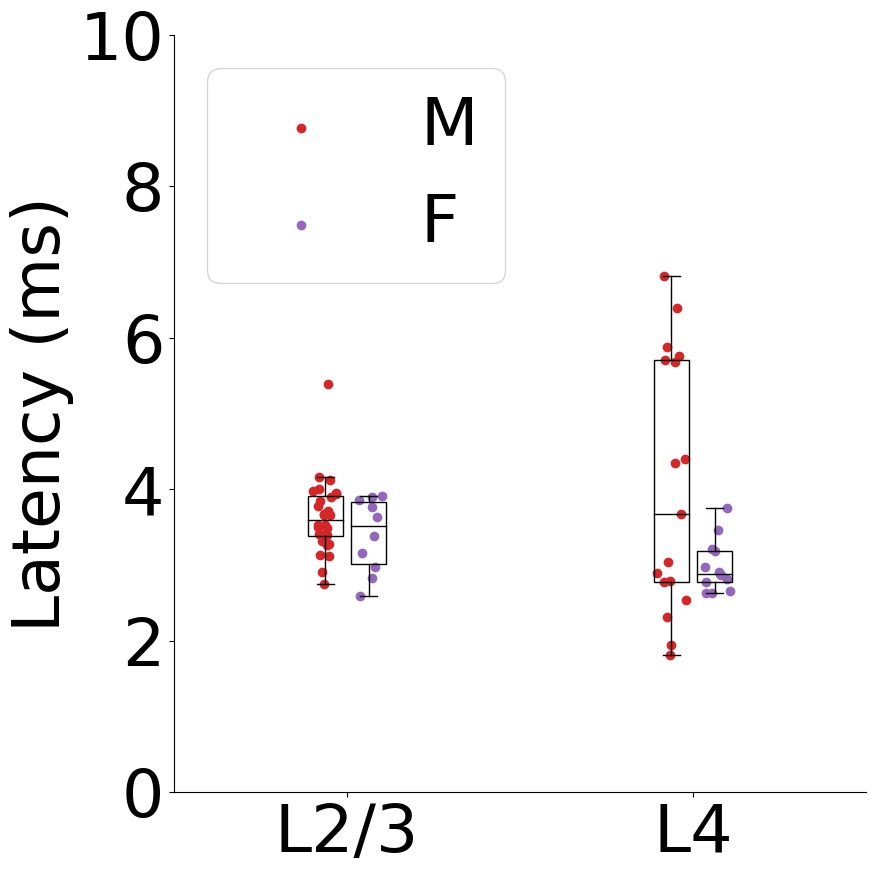

L2/3 Neighbor 3.614 +/- 0.348 um/ms
L4 Neighbor 4.384 +/- 0.889 um/ms
L2/3 Neighbor 1.901 +/- 0.470 um/ms
L4 Neighbor 3.688 +/- 0.737 um/ms
Date        Slice
10/23/2024  1        0.297847
12/20/2024  1        3.366220
6/26/2024   1        0.491232
7/1/2024    3        4.618447
            4        4.485337
7/15/2024   2        3.312360
Name: amp, dtype: float64 Date        Slice
10/23/2024  1        0.297847
12/20/2024  1        3.366220
6/26/2024   1        0.491232
7/1/2024    3        4.618447
            4        4.485337
7/15/2024   2        3.312360
Name: amp, dtype: float64
0.0 1.0 male and female test: amp layer: L2/3
Date        Slice
10/29/2024  1        11.271067
12/11/2024  2         0.798567
            3         4.314008
12/18/2024  2         1.790246
12/20/2024  2         3.378708
12/9/2024   2         2.946464
7/17/2024   3         8.090730
Name: amp, dtype: float64 Date        Slice
10/29/2024  1        11.271067
12/11/2024  2         0.798567
            3         4.3

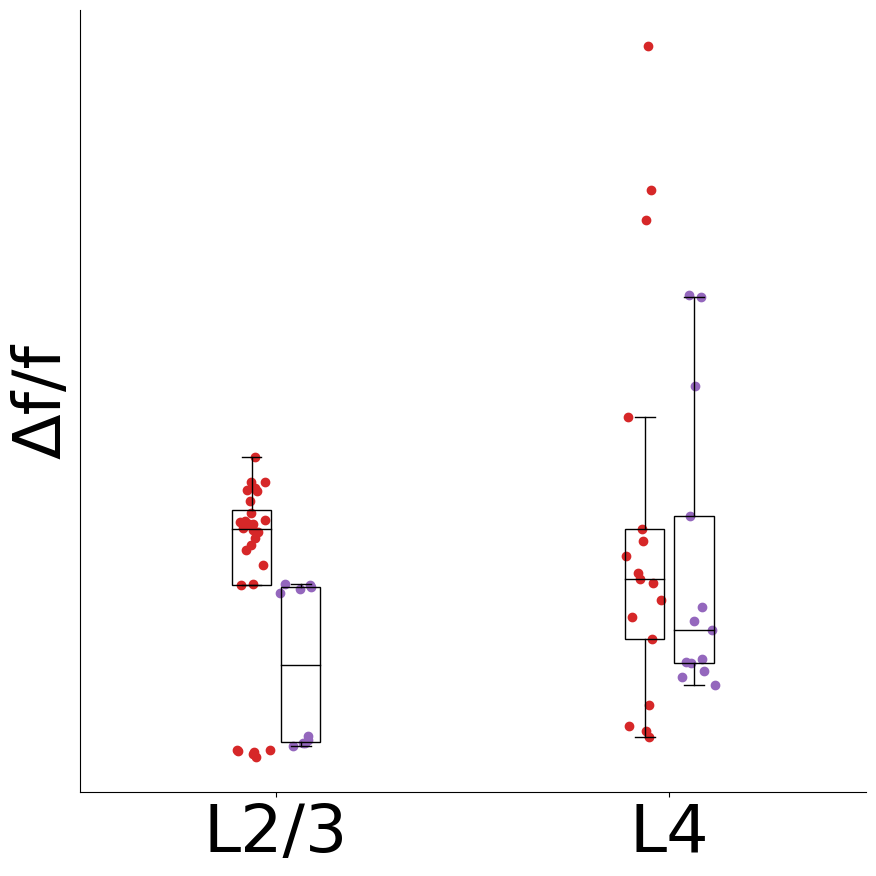

L2/3 Neighbor 10.53 +/- 0.580 um/ms
L4 Neighbor 16.34 +/- 1.553 um/ms
L2/3 Neighbor 11.88 +/- 0.793 um/ms
L4 Neighbor 15.40 +/- 1.827 um/ms
Date        Slice
10/23/2024  1        10.527975
12/20/2024  1        20.409400
6/26/2024   1        12.539660
7/1/2024    3         8.366849
            4        13.470743
7/15/2024   2        11.236660
Name: halfwidth, dtype: float64 Date        Slice
10/23/2024  1        10.527975
12/20/2024  1        20.409400
6/26/2024   1        12.539660
7/1/2024    3         8.366849
            4        13.470743
7/15/2024   2        11.236660
Name: halfwidth, dtype: float64
0.0 1.0 male and female test: halfwidth layer: L2/3
Date        Slice
10/29/2024  1         7.928047
12/11/2024  2        12.429553
            3        15.971825
12/18/2024  2        16.724320
12/20/2024  2        23.416767
12/9/2024   2        19.566000
7/17/2024   3         6.289943
Name: halfwidth, dtype: float64 Date        Slice
10/29/2024  1         7.928047
12/11/2024  2       

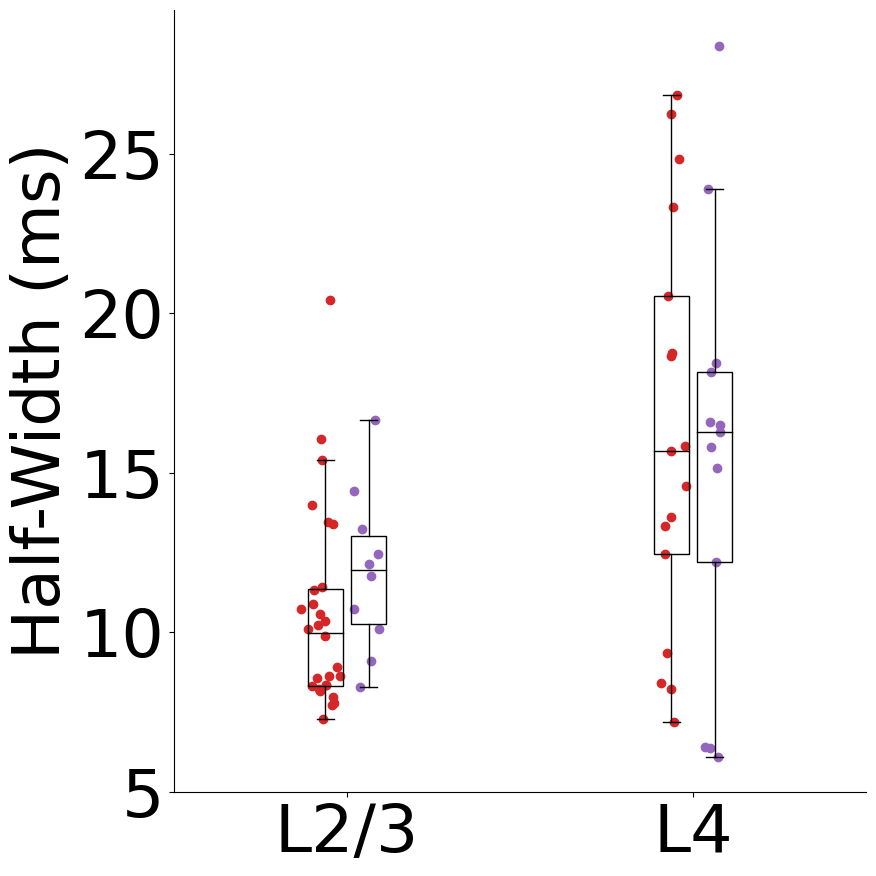

L2/3 Neighbor 111.7 +/- 6.451 um/ms
L4 Neighbor 96.62 +/- 17.30 um/ms
L2/3 Neighbor 108.1 +/- 14.67 um/ms
L4 Neighbor 63.88 +/- 3.834 um/ms
Date        Slice
10/23/2024  1        303.039696
12/20/2024  1         33.878492
6/26/2024   1        215.578190
7/1/2024    3        109.780416
            4        111.051009
7/15/2024   2         85.168054
Name: instantaneous_velocity, dtype: float64 Date        Slice
10/23/2024  1        303.039696
12/20/2024  1         33.878492
6/26/2024   1        215.578190
7/1/2024    3        109.780416
            4        111.051009
7/15/2024   2         85.168054
Name: instantaneous_velocity, dtype: float64
0.0 1.0 male and female test: instantaneous_velocity layer: L2/3
Date        Slice
10/29/2024  1         301.113521
12/11/2024  2        1120.487661
            3          46.238630
12/18/2024  2          60.652594
12/20/2024  2          98.865381
12/9/2024   2         251.008540
7/17/2024   3         146.082554
Name: instantaneous_velocity, dtype:

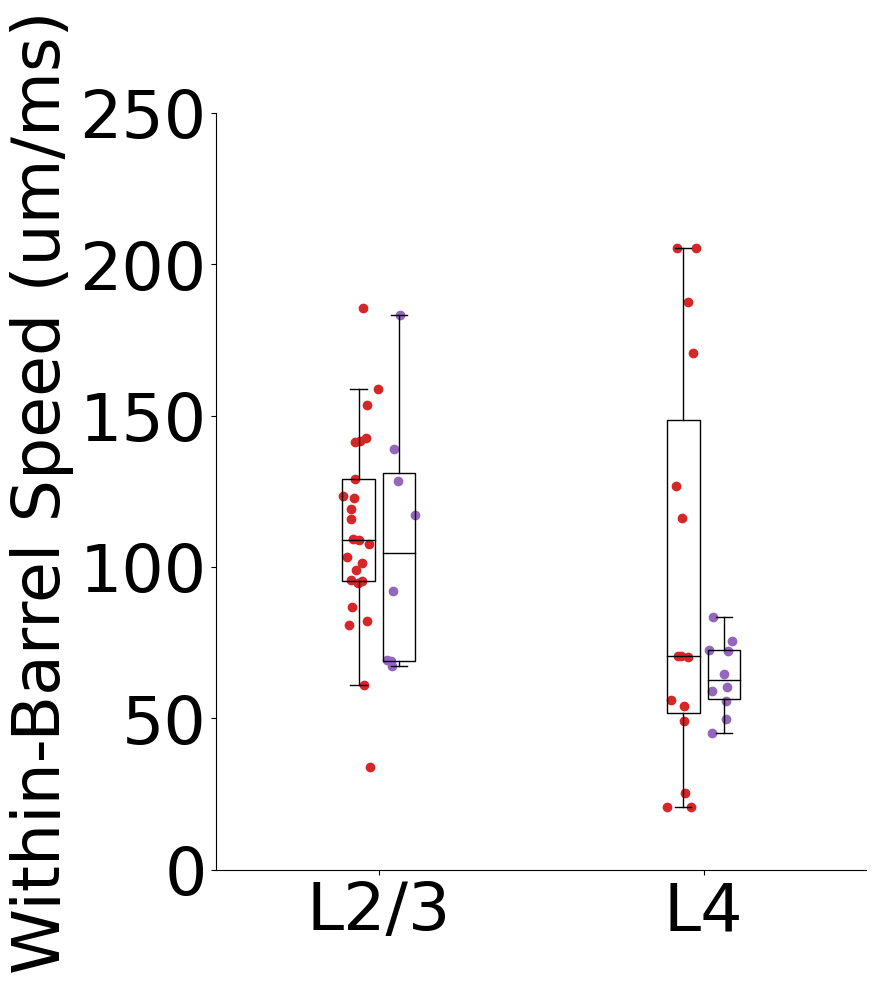

In [97]:
# 1-d scatter plot of the average speed
# broken down by sex

# matplotlib font size larger
plt.rcParams.update({'font.size': 48})

for metric, label in zip(['latency', 'amp', 'halfwidth', 'instantaneous_velocity'], 
                            ['Latency (ms)', 'Δf/f', 'Half-Width (ms)', 'Within-Barrel Speed (um/ms)']):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    layers = ['L2/3', 'L4']
    for i_sex, sex in enumerate(['M', 'F']):

        speeds = []
        positions = []
        for i, layer in enumerate(layers):
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['Sex'] == sex) & 
                                        (ladder_df_nbqx['drug'] == 'ACSF') &
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                speed = [s for s in list(np.abs(region_df[metric])) if not np.isnan(s)]
                if metric == 'instantaneous_velocity':
                    # remove outliers
                    speed = [s for s in speed if s < 300]
                
                speeds.append(speed)
                positions.append(i + i_sex/8 - 1/16)
                # print the mean +/- sem of the speed
                print(layer, region, str(np.mean(speed))[:5], "+/-", str(sem(speed))[:5], "um/ms")
        ax.boxplot(speeds, positions=positions, 
                        showfliers=False, patch_artist=True,
                        boxprops=dict(facecolor=(0,0,0,0)),
                        widths=0.1,
                        medianprops=dict(color='black'))
        

    # scatter plot of the average speed
    for i, layer in enumerate(layers):
        for j, sex in enumerate(['M', 'F']):
            edgecolors= None
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['Sex'] == sex) & 
                                        (ladder_df_nbqx['drug'] == 'ACSF') &
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                x_jitter = np.random.normal(i + j/8 - 1/16, 0.025, len(region_df))
                ax.scatter(x_jitter, 
                                np.abs(region_df[metric]), 
                                label=sex, 
                                color='tab:red' if sex == 'M' else 'tab:purple',
                                edgecolors=edgecolors)
                
                if metric == 'instantaneous_velocity':
                    ax.set_ylim(0, 250)
                elif metric == 'latency':
                    ax.set_ylim(0, 10)
                elif metric == 'amp':
                    # ax.set_ylim(0, 10.5)
                    ax.set_yticks([])
                elif metric == 'halfwidth':
                    pass # ax.set_ylim(0, 2.5)
                ax.set_xlim(-.5, 1.5)
                ax.set_xticks([0, 1])
                ax.set_xticklabels(layers)

    for layer_sig in ['L2/3', 'L4']:
        # is there a significant difference between M and F for L2/3 and L4? 
        male = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer_sig) & 
                                (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor') &
                                (ladder_df_nbqx['drug'] == 'ACSF')][metric]
        female = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer_sig) &
                                (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor') &
                                (ladder_df_nbqx['drug'] == 'ACSF')][metric]

        # average for each date/slice
        male = male.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
        female = female.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()

        print(male, female)

        t_stat, p_val = ttest_ind(male, female, equal_var=False)
        print(t_stat, p_val, "male and female test:", metric, "layer:", layer_sig)

        # get t-test for adjusted p-value
        if p_val < 0.05:
            print('Significant difference between ACSF and NBQX for ' + metric + ' in ' + layer_sig)
            # place in terms of fraction of the y-axis
            x_loc = 0 if layer_sig == 'L2/3' else 1
            ax.text(x_loc, 0.73 * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0], 'p < 0.05', ha='center')
            # draw a line between the two boxes. shift it right a bit if drug_sig == 'NBQX', left if drug_sig == 'ACSF'
            layer_sig_shift = 1/10 
            
            layer_sig_yshift = 0.02 if layer_sig == 'L4' else 0.0
            y_height = (0.7 - layer_sig_yshift) * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0]
            ax.plot([x_loc - layer_sig_shift, x_loc + layer_sig_shift], [y_height, y_height], color='black') 
            
            # vertical segments at the ends of the bar to make it a bracket
            brack_cap = 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.plot([x_loc - layer_sig_shift, x_loc - layer_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')
            ax.plot([x_loc + layer_sig_shift, x_loc + layer_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')

    ax.set_ylabel(label)
    # set spines to be invisible
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # legend in top left, but with only the first two labels
    handles = ax.get_legend_handles_labels()
    if metric == 'latency':
        ax.legend(handles=handles[0][:2], labels=handles[1][:2], loc='upper left')
    # tight layout
    plt.tight_layout()
    plt.savefig(output_fig_dir + '/sex_' + metric + '.png')
    plt.show()
        

L2/3 Neighbor 3.574 +/- 0.080 um/ms
L4 Neighbor 3.585 +/- 0.251 um/ms
Linear regression for L2/3 Neighbor: slope=-0.03, intercept=5.67, p-value=0.230
Linear regression for L4 Neighbor: slope=-0.04, intercept=5.35, p-value=0.395


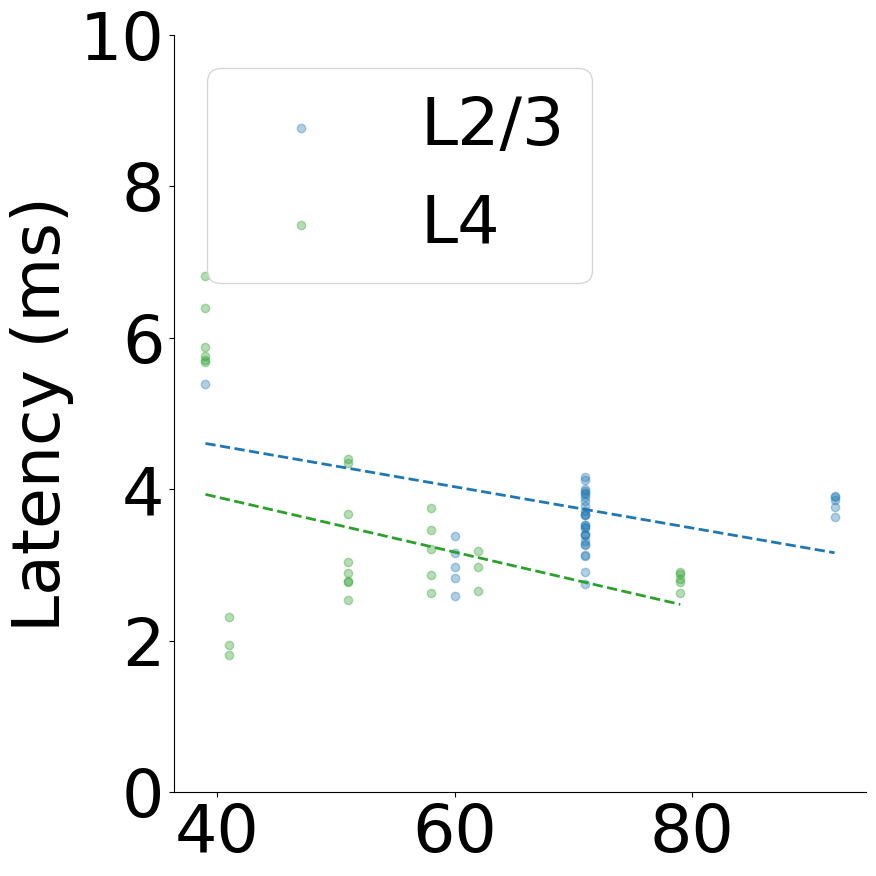

L2/3 Neighbor 3.163 +/- 0.307 um/ms
L4 Neighbor 4.083 +/- 0.590 um/ms
Linear regression for L2/3 Neighbor: slope=-0.05, intercept=6.03, p-value=0.382
Linear regression for L4 Neighbor: slope=-0.07, intercept=8.61, p-value=0.565


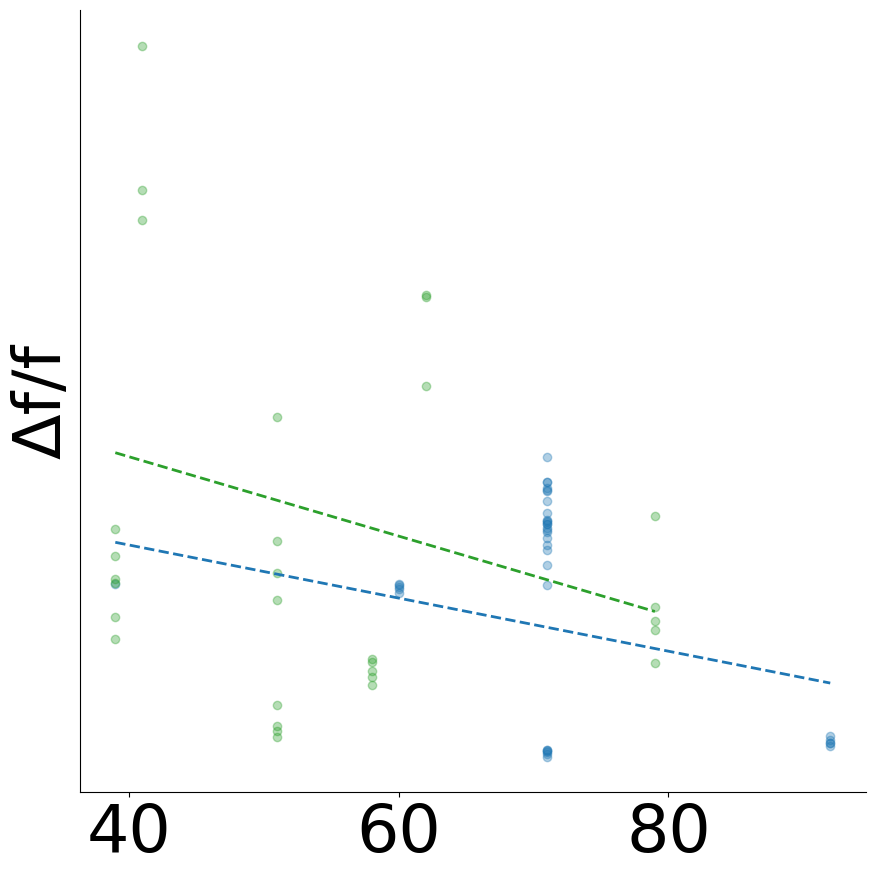

L2/3 Neighbor 10.89 +/- 0.480 um/ms
L4 Neighbor 15.94 +/- 1.166 um/ms
Linear regression for L2/3 Neighbor: slope=-0.15, intercept=23.17, p-value=0.164
Linear regression for L4 Neighbor: slope=0.02, intercept=13.50, p-value=0.923


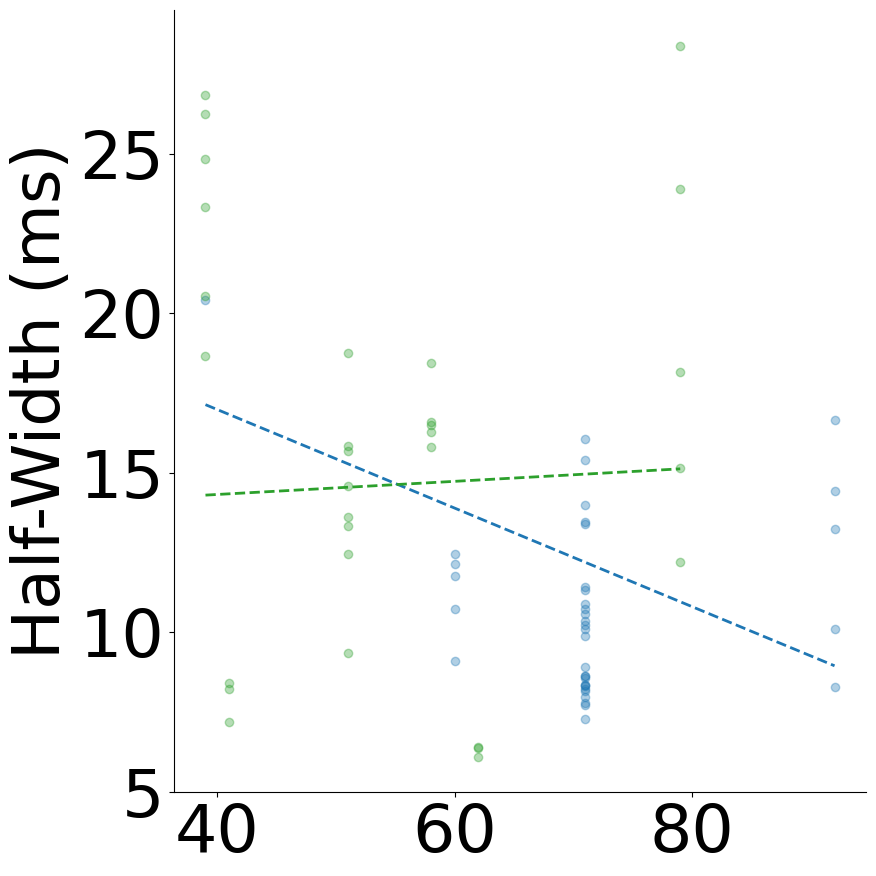

L2/3 Neighbor 110.8 +/- 5.928 um/ms
L4 Neighbor 83.53 +/- 10.85 um/ms
Linear regression for Neighbor: slope=-0.80, intercept=269.88, p-value=0.883


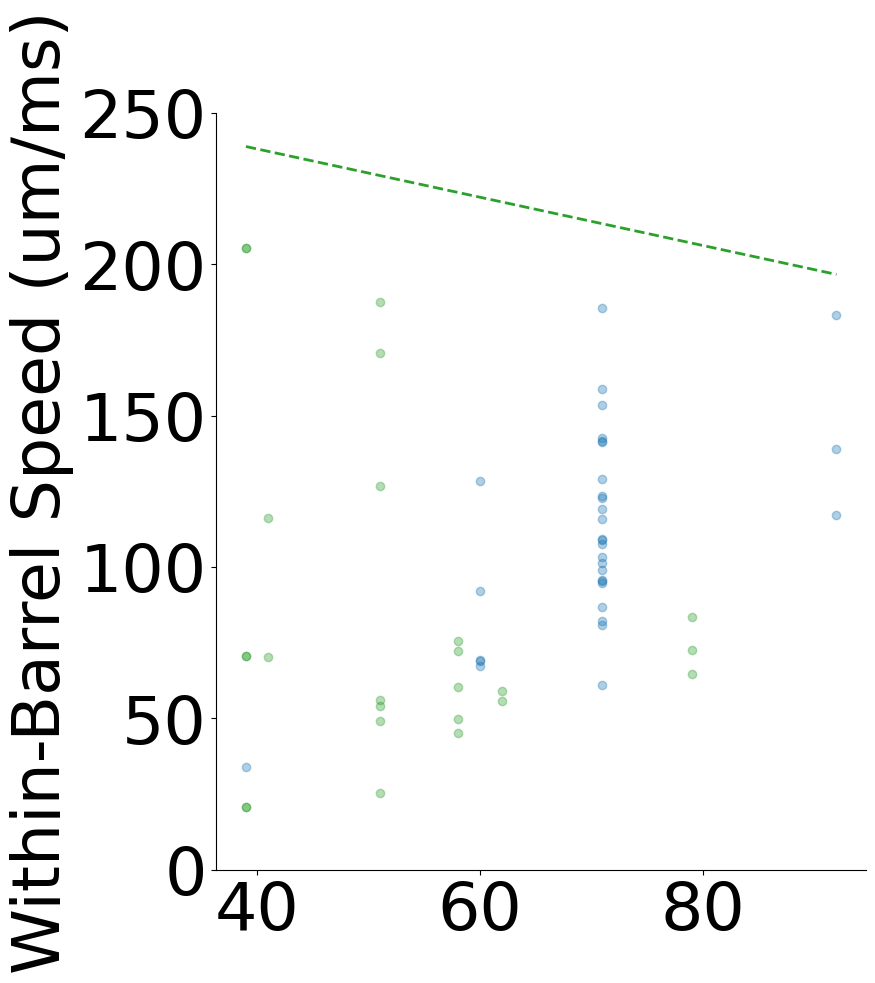

In [98]:
# 2-d scatter plot of the average speed
# versus age

# matplotlib font size larger
plt.rcParams.update({'font.size': 48})

for metric, label in zip(['latency', 'amp', 'halfwidth', 'instantaneous_velocity'], 
                            ['Latency (ms)', 'Δf/f', 'Half-Width (ms)', 'Within-Barrel Speed (um/ms)']):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    layers = ['L2/3', 'L4']

    for i, layer in enumerate(layers):
        for i_reg, region in enumerate(['Neighbor']):
            region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                    (ladder_df_nbqx['drug'] == 'ACSF') &
                                    (ladder_df_nbqx['resides_in_barrel'] == region)]

            edgecolors= None
            ax.scatter(np.abs(region_df['Age']), 
                                np.abs(region_df[metric]), 
                                label=layer, 
                                color='tab:blue' if layer == 'L2/3' else 'tab:green',
                                edgecolors=edgecolors,
                                alpha=0.35,)

            speed = [s for s in list(np.abs(region_df[metric])) if not np.isnan(s)]
            if metric == 'instantaneous_velocity':
                # remove outliers
                speed = [s for s in speed if s < 300]
            
            # print the mean +/- sem of the speed
            print(layer, region, str(np.mean(speed))[:5], "+/-", str(sem(speed))[:5], "um/ms")
    if metric == 'instantaneous_velocity':
        ax.set_ylim(0, 250)
    elif metric == 'latency':
        ax.set_ylim(0, 10)
    elif metric == 'amp':
        # ax.set_ylim(0, 10.5)
        ax.set_yticks([])
    elif metric == 'halfwidth':
        pass # ax.set_ylim(0, 2.5)


    # linear regression lines by layer
    if metric != 'instantaneous_velocity':
        for i, layer in enumerate(layers):
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['drug'] == 'ACSF') &
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                # average for each date/slice
                region_df = region_df.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
                if len(region_df) > 0:
                    # fit a linear regression line
                    slope, intercept, r_value, p_value, std_err = linregress(region_df['Age'], region_df[metric])
                    x_vals = np.linspace(region_df['Age'].min(), region_df['Age'].max(), 100)
                    y_vals = slope * x_vals + intercept
                    ax.plot(x_vals, y_vals, color='tab:blue' if layer == 'L2/3' else 'tab:green', linestyle='--', linewidth=2)
                    print(f"Linear regression for {layer} {region}: slope={slope:.2f}, intercept={intercept:.2f}, p-value={p_value:.3f}")
    else:
        for i_reg, region in enumerate(['Neighbor']):
            region_df = ladder_df_nbqx[#(ladder_df_nbqx['Layer'] == layer) & 
                                    (ladder_df_nbqx['drug'] == 'ACSF') &
                                    (ladder_df_nbqx['resides_in_barrel'] == region)]
            # average for each date/slice
            region_df = region_df.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
            if len(region_df) > 0:
                # fit a linear regression line
                slope, intercept, r_value, p_value, std_err = linregress(region_df['Age'], region_df[metric])
                x_vals = np.linspace(region_df['Age'].min(), region_df['Age'].max(), 100)
                y_vals = slope * x_vals + intercept
                ax.plot(x_vals, y_vals, color='tab:blue' if layer == 'L2/3' else 'tab:green', linestyle='--', linewidth=2)
                print(f"Linear regression for {region}: slope={slope:.2f}, intercept={intercept:.2f}, p-value={p_value:.3f}")

    ax.set_ylabel(label)
    # set spines to be invisible
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # legend in top left, but with only the first two labels
    handles = ax.get_legend_handles_labels()
    if metric == 'latency':
        ax.legend(handles=handles[0][:2], labels=handles[1][:2], loc='upper left')
    # tight layout
    plt.tight_layout()
    plt.savefig(output_fig_dir + '/age_' + metric + '.png')
    plt.show()
        

L2/3 Neighbor ACSF 128.7 +/- 12.14 um/ms
Sample size: 34
L4 Neighbor ACSF 123.5 +/- 18.78 um/ms
Sample size: 16
L2/3 Neighbor NBQX 118.9 +/- 10.63 um/ms
Sample size: 34
L4 Neighbor NBQX 162.1 +/- 26.58 um/ms
Sample size: 17
-0.9829530271518369 0.35870477188277466 Neighbor L2/3 and L4 test: instantaneous_velocity drug: ACSF sample size: 6 7
-0.3390212336927287 0.7427280022169265 Neighbor L2/3 and L4 test: instantaneous_velocity drug: NBQX sample size: 6 7
-1.0984090530863966 0.309036962024152 ACSF and NBQX test: instantaneous_velocity layer: L2/3
-0.07460514689831342 0.9417712182201855 ACSF and NBQX test: instantaneous_velocity layer: L4


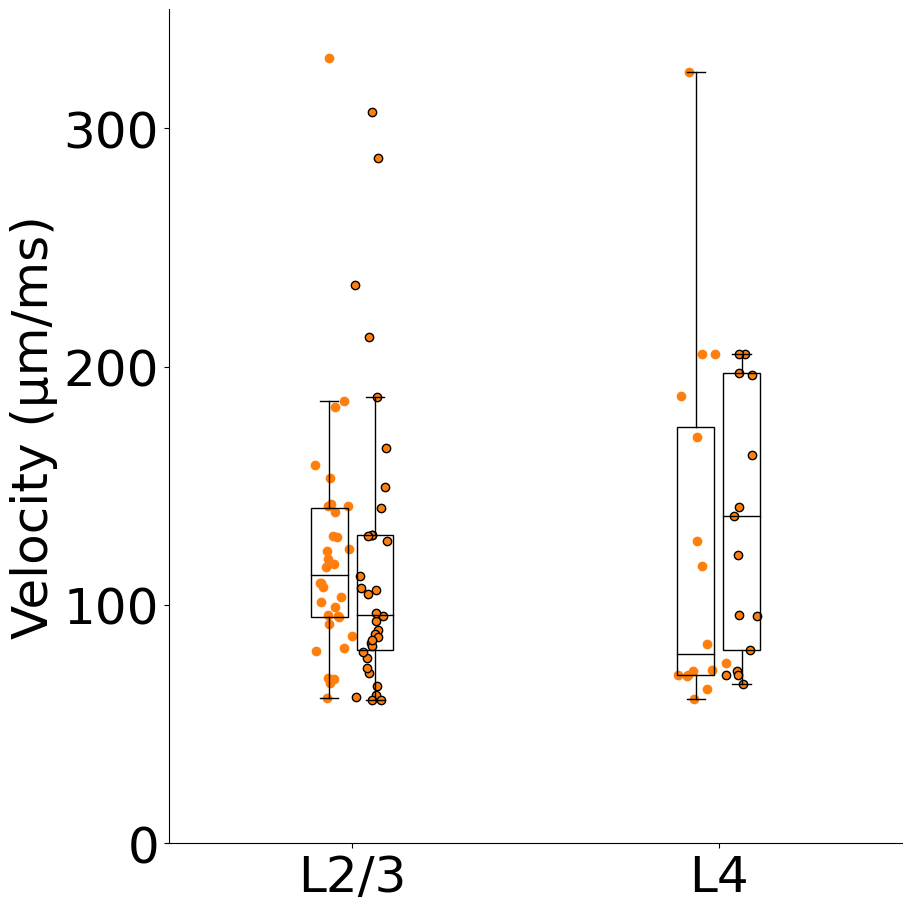

In [99]:
# make a 1-d scatter plot of the average speed
# broken down by home vs neighbor barrel and L2/3 vs L4


# matplotlib font size larger
plt.rcParams.update({'font.size': 36})

for metric, label in zip(['latency', 'amp', 'halfwidth', 'instantaneous_velocity'], 
                            ['Latency (ms)', 'Δf/f', 'Half-Width (ms)', 'Velocity (μm/ms)']):
    if metric != 'instantaneous_velocity':
        continue
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    layers = ['L2/3', 'L4']
    drug = ['ACSF', 'NBQX']
    # boxplots of the average speed
    for j, d in enumerate(drug):
        speeds = []
        positions = []
        for i, layer in enumerate(layers):
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['drug'] == d) & 
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                speed = [s for s in list(np.abs(region_df[metric])) if not np.isnan(s)]
                if metric == 'instantaneous_velocity':
                    # remove outliers
                    speed = [s for s in speed if 60 < s < 600]
                
                speeds.append(speed)
                positions.append(i + j/8 - 1/16)
                # print the mean +/- sem of the speed
                x_jitter = np.random.normal(i + j/8 - 1/16, 0.025, len(speed))
                ax.scatter(x_jitter, 
                                np.abs(speed), 
                                label=d, 
                                color='tab:orange',
                                edgecolors="black" if d == 'NBQX' else None)
                print(layer, region, d, str(np.mean(speed))[:5], "+/-", str(sem(speed))[:5], "um/ms")
                print("Sample size:", len(speed))
        ax.boxplot(speeds, positions=positions, 
                        showfliers=False, patch_artist=True,
                        boxprops=dict(facecolor=(0,0,0,0)),
                        widths=0.1,
                        medianprops=dict(color='black'))
        
        

    # scatter plot of the average speed
    for i, layer in enumerate(layers):
        for j, d in enumerate(drug):
            edgecolors= "black" if d == 'NBQX' else None
            for i_reg, region in enumerate(['Neighbor']):
                '''region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['drug'] == d) & 
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                x_jitter = np.random.normal(i + j/8 - 1/16, 0.025, len(region_df))
                ax.scatter(x_jitter, 
                                np.abs(region_df[metric]), 
                                label=d, 
                                color='tab:blue' if region == 'Home' else 'tab:orange',
                                edgecolors=edgecolors)'''
                
                if metric == 'instantaneous_velocity':
                    ax.set_ylim(0, 400)
                elif metric == 'latency':
                    ax.set_ylim(0, 10)
                elif metric == 'amp':
                    # ax.set_ylim(0, 10.5)
                    ax.set_yticks([])
                elif metric == 'halfwidth':
                    pass # ax.set_ylim(0, 2.5)
                ax.set_xlim(-.5, 1.5)
                ax.set_xticks([0, 1])
                ax.set_xticklabels(layers)

    for drug_sig in ['ACSF', 'NBQX']:
        
        # is there a significant difference between neighbor L2/3 and neighbor L4? For ACSF
        neighbor_L23 = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == 'L2/3') & 
                                    (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor')&
                                    (ladder_df_nbqx['drug'] == drug_sig)][metric]
        neighbor_L4 = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == 'L4') &
                                    (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor') &
                                    (ladder_df_nbqx['drug'] == drug_sig)][metric]

        # average for each date/slice
        neighbor_L23 = neighbor_L23.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
        neighbor_L4 = neighbor_L4.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
        # get rid of nans
        neighbor_L23 = [s for s in list(np.abs(neighbor_L23)) if not np.isnan(s)]
        neighbor_L4 = [s for s in list(np.abs(neighbor_L4)) if not np.isnan(s)]

        t_stat, p_val = ttest_ind(neighbor_L23, neighbor_L4, equal_var=False)
        print(t_stat, p_val, "Neighbor L2/3 and L4 test:", metric, "drug:", drug_sig, "sample size:", len(neighbor_L23), len(neighbor_L4))
        if p_val < 0.05:  #  x 20 for pseudo-multiple testing correction
            print('Significant difference between L2/3 and L4 for ' + metric + ' in ' + drug_sig)
            # place in terms of fraction of the y-axis
            ax.text(0.5, 0.73 * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0], 'p < 0.05', ha='center')
            # draw a line between the two boxes. shift it right a bit if drug_sig == 'NBQX', left if drug_sig == 'ACSF'
            drug_sig_shift = 1/16 if drug_sig == 'NBQX' else -1/16
            drug_sig_yshift = 0.02 if drug_sig == 'NBQX' else 0.0
            y_height = (0.7 - drug_sig_yshift) * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0]
            ax.plot([drug_sig_shift, 1+drug_sig_shift], [y_height, y_height], color='black') 
            
            # vertical segments at the ends of the bar to make it a bracket
            brack_cap = 0.05 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.plot([drug_sig_shift, drug_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')
            ax.plot([1+drug_sig_shift, 1+drug_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')

            #ax.text(0.5, 730, 'p < 0.05', ha='center')
            # draw a line between the two boxes
            #ax.plot([0, 1], [700, 700], color='black')
            # vertical segments at the ends of the bar to make it a bracket
            #ax.plot([0, 0], [700, 650], color='black')
            #ax.plot([1, 1], [700, 650], color='black')
            #ax.plot([-.1, .1], [650, 650], color='black')
            #ax.plot([1-.1, 1+.1], [650, 650], color='black')
    for layer_sig in ['L2/3', 'L4']:
        # is there a significant difference between ACSF and NBQX for L2/3 and L4? 
        acsf = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer_sig) & 
                                (ladder_df_nbqx['resides_in_barrel'] == 'Home') &
                                (ladder_df_nbqx['drug'] == 'ACSF')][metric]
        nbqx = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer_sig) &
                                (ladder_df_nbqx['resides_in_barrel'] == 'Home') &
                                (ladder_df_nbqx['drug'] == 'NBQX')][metric]

        # average for each date/slice
        acsf = acsf.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
        nbqx = nbqx.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()

        t_stat, p_val = ttest_ind(acsf, nbqx, equal_var=False)
        print(t_stat, p_val, "ACSF and NBQX test:", metric, "layer:", layer_sig)

        # get t-test for adjusted p-value
        if p_val < 0.05:
            print('Significant difference between ACSF and NBQX for ' + metric + ' in ' + layer_sig)
            # place in terms of fraction of the y-axis
            x_loc = 0 if layer_sig == 'L2/3' else 1
            ax.text(x_loc, 0.73 * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0], 'p < 0.05', ha='center')
            # draw a line between the two boxes. shift it right a bit if drug_sig == 'NBQX', left if drug_sig == 'ACSF'
            layer_sig_shift = 1/10 
            
            layer_sig_yshift = 0.02 if layer_sig == 'L4' else 0.0
            y_height = (0.7 - layer_sig_yshift) * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0]
            ax.plot([x_loc - layer_sig_shift, x_loc + layer_sig_shift], [y_height, y_height], color='black') 
            
            # vertical segments at the ends of the bar to make it a bracket
            brack_cap = 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.plot([x_loc - layer_sig_shift, x_loc - layer_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')
            ax.plot([x_loc + layer_sig_shift, x_loc + layer_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')

            


    # for velocity, set y ticks to [0, 100, 200, 300]
    if metric == 'instantaneous_velocity':
        ax.set_yticks([0, 100, 200, 300])
        ax.set_ylim(0, 350)
    ax.set_ylabel(label)
    # set spines to be invisible
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # legend in top left, but with only the first two labels
    handles = ax.get_legend_handles_labels()
    if metric == 'latency':
        ax.legend(handles=handles[0][:2], labels=handles[1][:2], loc='upper left')
    # tight layout
    plt.tight_layout()
    plt.savefig(output_fig_dir + '/' + metric + '.png')
    plt.show()

c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\scipy\stats\_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
c:\Us

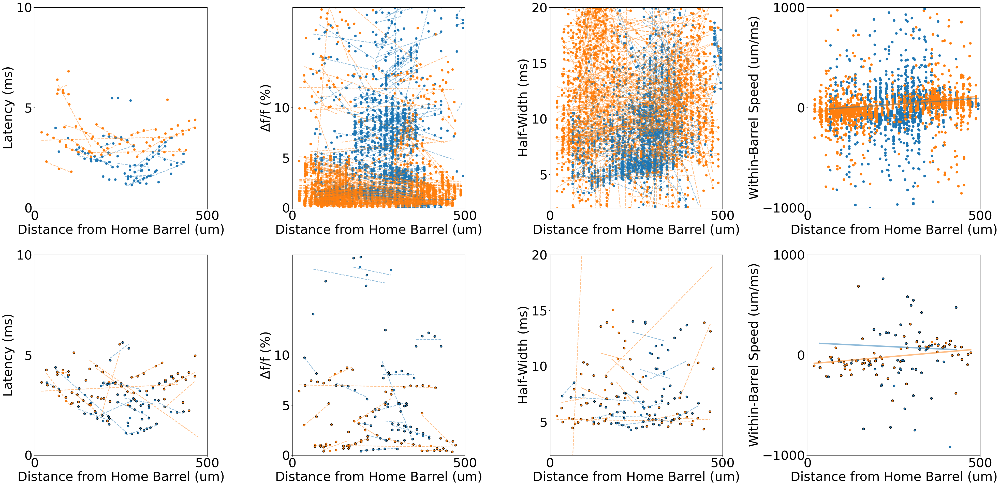

In [100]:
# show correlation of latency, halfwidth, amp, and velocity with distance from home barrel
# plot each metric vs distance from home barrel, each date/slice/recording in a different color
# with the NBQX data in markeredgecolor='black'
# fit and plot a linear regression line for each date/slice/recording

fig, ax = plt.subplots(2, 4, figsize=(40, 20))
layers = ['L2/3', 'L4']
drug = ['ACSF', 'NBQX']
handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        for i_reg, region in enumerate(['Home', 'Neighbor']):
            for date in ladder_df['Date'].unique():
                for slic in ladder_df['Slice'].unique():
                    for rec in ladder_df['Recording'].unique():

                        region_df = ladder_df[(ladder_df['Layer'] == layer) & 
                                                (ladder_df['drug'] == d) & 
                                                (ladder_df['resides_in_barrel'] == region) &
                                                (ladder_df['Date'] == date) &
                                                (ladder_df['Slice'] == slic) &
                                                (ladder_df['Recording'] == rec)]
                        # get rid of nans
                        region_df = region_df[region_df['Dist_from_home_barrel'].notna()]
                        region_df = region_df[region_df['latency'].notna()]
                        region_df = region_df[region_df['amp'].notna()]
                        region_df = region_df[region_df['halfwidth'].notna()]
                        region_df = region_df[region_df['instantaneous_velocity'].notna()]

                        if region_df.empty:
                            continue

                        # fit a linear regression line to the data
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['latency'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        
                        # plot the data and the line
                        color = 'tab:blue' if region == 'Home' else 'tab:orange'
                        edgecolors= "black" if d == 'NBQX' else None
                        
                        ax[j][0].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['latency'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')
                        
                        ax[j][0].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)

                        # now do the same for amp
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['amp'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept

                        ax[j][1].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['amp'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')

                        ax[j][1].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        # now do the same for halfwidth
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['halfwidth'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        ax[j][2].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['halfwidth'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')

                        ax[j][2].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        
                        # now do the same for velocity
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['instantaneous_velocity'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(),
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        ax[j][3].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['instantaneous_velocity'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')
                                        
                        #ax[j][3].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        # print the slope and r^2 value for each metric
                        '''print(layer, region, d, 'Latency', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Amp', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Halfwidth', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Velocity', str(slope)[:5], str(r_value**2)[:5])
                        # print the p-value for each metric
                        print(layer, region, d, 'Latency', str(p_value)[:5])
                        print(layer, region, d, 'Amp', str(p_value)[:5])
                        print(layer, region, d, 'Halfwidth', str(p_value)[:5])
                        print(layer, region, d, 'Velocity', str(p_value)[:5])
                        # print the std_err for each metric
                        print(layer, region, d, 'Latency', str(std_err)[:5])
                        print(layer, region, d, 'Amp', str(std_err)[:5])
                        print(layer, region, d, 'Halfwidth', str(std_err)[:5])
                        print(layer, region, d, 'Velocity', str(std_err)[:5])
                        # print the number of points for each metric
                        print(layer, region, d, 'Latency', len(region_df['latency']))
                        print(layer, region, d, 'Amp', len(region_df['amp']))
                        print(layer, region, d, 'Halfwidth', len(region_df['halfwidth']))
                        print(layer, region, d, 'Velocity', len(region_df['instantaneous_velocity']))
                        # print the mean and std of each metric
                        print(layer, region, d, 'Latency', str(np.mean(region_df['latency']))[:5], str(np.std(region_df['latency']))[:5])
                        print(layer, region, d, 'Amp', str(np.mean(region_df['amp']))[:5], str(np.std(region_df['amp']))[:5])
                        print(layer, region, d, 'Halfwidth', str(np.mean(region_df['halfwidth']))[:5], str(np.std(region_df['halfwidth']))[:5])
                        print(layer, region, d, 'Velocity', str(np.mean(region_df['instantaneous_velocity']))[:5], str(np.std(region_df['instantaneous_velocity']))[:5])
                        '''
                        # save plot to file
                        #ax[0].set_title('Latency vs Distance from Home Barrel')
                        #ax[1].set_title('Amp vs Distance from Home Barrel')
                        #ax[2].set_title('Halfwidth vs Distance from Home Barrel')
                        #ax[3].set_title('Velocity vs Distance from Home Barrel')
                        ax[j][0].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][1].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][2].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][3].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][0].set_ylabel('Latency (ms)')
                        ax[j][1].set_ylabel('Δf/f (%)')
                        ax[j][2].set_ylabel('Half-Width (ms)')
                        ax[j][3].set_ylabel('Within-Barrel Speed (um/ms)')
                        ax[j][0].set_ylim(0, 8)
                        ax[j][1].set_ylim(0, 20)
                        ax[j][2].set_ylim(2, 20)
                        ax[j][3].set_ylim(-1000, 1000)
                        ax[j][0].set_xlim(0, 500)
                        ax[j][1].set_xlim(0, 500)
                        ax[j][2].set_xlim(0, 500)
                        ax[j][3].set_xlim(0, 500)
                        ax[j][0].set_xticks([0, 500])
                        ax[j][1].set_xticks([0, 500])
                        ax[j][2].set_xticks([0, 500])
                        ax[j][3].set_xticks([0, 500])
                        ax[j][0].set_xticklabels([ 0, 500])
                        ax[j][1].set_xticklabels([ 0, 500])   
                        ax[j][2].set_xticklabels([ 0, 500])
                        ax[j][3].set_xticklabels([ 0, 500])
                        ax[j][0].set_yticks([0, 5, 10])
                        ax[j][1].set_yticks([0, 5, 10])
                        ax[j][3].set_yticks([-1000, 0, 1000])
                        ax[j][0].set_yticklabels([0, 5, 10])

# Is there overall correlation between velocity and distance from home barrel?
# fit a single linear regression line to all data points (drug, region-specific)
for i_reg, region in enumerate(['Home', 'Neighbor']):
    for j, d in enumerate(drug):
        region_df = ladder_df[(ladder_df['drug'] == d) & 
                                (ladder_df['resides_in_barrel'] == region)]
        # get rid of nans
        region_df = region_df[region_df['Dist_from_home_barrel'].notna()]
        region_df = region_df[region_df['latency'].notna()]
        region_df = region_df[region_df['amp'].notna()]
        region_df = region_df[region_df['halfwidth'].notna()]
        region_df = region_df[region_df['instantaneous_velocity'].notna()]

        if region_df.empty:
            continue

        # fit a linear regression line to the data
        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                    region_df['instantaneous_velocity'])
        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                        region_df['Dist_from_home_barrel'].max(), 100)
        y = slope * x + intercept
        
        # plot the data and the line
        color = 'tab:blue' if region == 'Home' else 'tab:orange'
        edgecolors= "black" if d == 'NBQX' else None
        
        ax[j][3].scatter(region_df['Dist_from_home_barrel'], 
                        region_df['instantaneous_velocity'], 
                        label=d, 
                        color=color,
                        edgecolors=edgecolors,
                        marker='o')
        
        ax[j][3].plot(x, y, color=color, linewidth=4, alpha=0.5)


plt.tight_layout()          
plt.savefig(output_fig_dir + '/' + layer + '_' + region + '_' + d + '_latency_vs_distance.png')
plt.show()


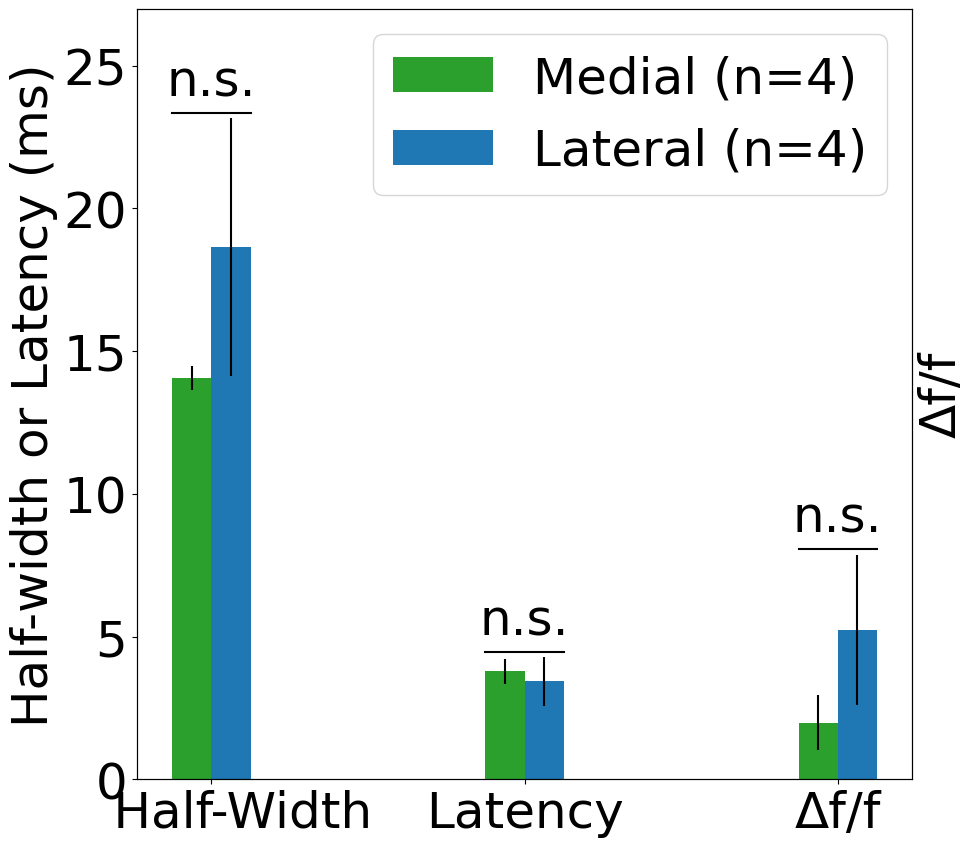

In [101]:
# using the 'Medial/Lateral' column in file export_summar_hw_latency_amp.csv, compare medial and lateral neighbor barrels
# for each layer and drug
# read in hw/lat/amp data
hw_lat_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/' + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6

# plot the data that has 'Medial/Lateral' column populated. Restrict to L4 and ACSF and neighbor barrels (ROI > 1)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot only for L4, not for L2/3. Compare latency, half-width, and amplitude for medial vs lateral neighbor barrels
directions = ['Medial', 'Lateral']
handles = []

for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
        # get the data for the direction
        direction_df = hw_lat_df[(hw_lat_df['Layer'] == 'L4') & 
                                (hw_lat_df['drug'] == 'ACSF') & 
                                (hw_lat_df['ROI'] > 1) & 
                                (hw_lat_df['Medial/Lateral'] == direction)]
        # plot the data
        l1 = ax.bar(j + i / 8 - 1/16, 
                        np.mean(direction_df[metric]), 
                        yerr=sem(direction_df[metric]), 
                        width=.125,
                        color=color, label=direction)
        handles.append(l1)

# legend: Medial in black, Lateral in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial (n=4)', 'Lateral (n=4)'], loc='upper right')

ax.set_ylabel('Half-width or Latency (ms)')
# right-side y-axis label
ax2 = ax.twinx()
ax2.set_ylabel('Δf/f')
ax2.set_yticks([])

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['    Half-Width', 'Latency', 'Δf/f'])

# significance testing Medial vs Lateral
for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
    med = hw_lat_df[(hw_lat_df['Layer'] == 'L4') & 
                                        (hw_lat_df['drug'] == 'ACSF') & 
                                        (hw_lat_df['ROI'] > 1) & 
                                        (hw_lat_df['Medial/Lateral'] == 'Medial')][metric]
    lat = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Lateral')][metric]
    t_stat, p_val = ttest_ind(med, lat, equal_var=False)
    # draw bar between the two boxes # ax.get_ylim()[1] * 0.8
    height = max(med.mean() + sem(med), lat.mean() + sem(lat)) + 0.2

    ax.plot([j - 1/8, j + 1/8], [height, height], color='black')
    if p_val < 0.05:
        ax.text(j, height + .6, 'p < 0.05', ha='center')

        
    else:
        ax.text(j, height + .6, 'n.s.', ha='center')

# raise the y-axis limit by 10% to make room for the significance testing
ax.set_ylim(0, ax.get_ylim()[1] * 1.1)


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp_medial_lateral.png')
plt.show()

In [102]:
# for each row in ladder_df, populate drug, layer, and Medial/Lateral columns by looking it up in hw_lat_df
for i, row in ladder_df.iterrows():
    date = row['Date']
    slic = row['Slice']
    rec = row['Recording']
    loc = row['Location']
    ladder_roi = row['ROI']
    x_center = row['X_Center']
    y_center = row['Y_Center']

    # to know which barrel roi this is in, find the closest roi in the hw_lat_df

    hw_lat_rows = hw_lat_df[(hw_lat_df['Date'] == date) &
                            (hw_lat_df['Slice'] == slic) &
                            (hw_lat_df['Location'] == loc) &
                            (hw_lat_df['Recording'] == rec)]
            
    
    if hw_lat_rows.empty:
        print('No data found for ', date, slic, rec, loc)
        continue

    # go through the matched rows, pull x_center and y_center, and calculate the distance to the ladder roi
    min_dist = np.Inf
    min_dist_row = None
    for j, hw_lat_row in hw_lat_rows.iterrows():
        dist = np.sqrt((x_center - hw_lat_row['X_Center'])**2 + (y_center - hw_lat_row['Y_Center'])**2)
        if dist < min_dist:
            min_dist = dist
            min_dist_row = hw_lat_row
    if min_dist_row is None:
        print('No data found for ', date, slic, rec, loc)
        continue
    # populate the drug, layer, and Medial/Lateral columns in ladder_df from the min_dist_row
    ladder_df.loc[i, 'drug'] = min_dist_row['drug']
    ladder_df.loc[i, 'Layer'] = min_dist_row['Layer']
    ladder_df.loc[i, 'Medial/Lateral'] = min_dist_row['Medial/Lateral']

print(ladder_df['Medial/Lateral'])

ladder_df

No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,drug,Layer,Coronal/Sagittal,IPI,Is_Pulse_2,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity,ROI file,Medial/Lateral
0,1,0.408552,19.7128,3.9030,16.65070,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,368.804275,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
1,2,0.462050,27.5393,3.9159,14.44350,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,350.406813,Neighbor,422.912185,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
2,3,0.441868,28.2700,3.8743,13.63680,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,332.813666,None,1626.003658,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
3,4,0.466602,22.1134,3.8636,13.22210,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,315.415427,Neighbor,183.157884,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
4,5,0.526346,26.8669,3.7651,10.10290,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,False,297.374375,Neighbor,139.073187,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9168,21,0.392233,NaN,178.7470,5.93887,309.974193,35.278481,8.721519,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,82.732005,Neighbor,12.142742,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9169,22,0.710792,NaN,177.4870,3.35339,339.835254,33.571429,6.311688,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,67.432150,Neighbor,-24.621257,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9170,23,1.011800,NaN,178.4610,28.19760,344.308002,29.714286,5.190476,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,43.451046,None,75.425673,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9171,24,1.046040,NaN,178.1750,2.39320,365.754016,26.437500,3.708333,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,21.879303,None,-18.463547,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN


[117.70583955160473, 187.4638415291147, 118.93944074219237, 170.5597212643176, 126.70191910840396, 3997.225160452277, 151.4037962848741, 113.35012594458482, 120.40133779264521, 146.93877551020987, 175.90615568252088, 141.16281471695655, 68.60706830566158, 196.42085836797938, 137.09434339136226, 36.10972858858639, 46.40573394272534, 33.498168086528295, 3.627773630069791, 15.205965451487993, 2.2333795089081, 56.234046255315356, 54.0537282835398, 44.52960005788257, 71.11807901714329, 49.240554646613425, 93.04308940355742, 168.76520139285665, 214.64100843746994, 280.4182084985381, 43.776104296305036, 382.78384186378156, 2263.236960774644, 138.1004607255306, 31.083512527059266, 140.08196376029332, 90.25333517901655, 188.0096358935616, 265.37993749139304, 70.6742403444782, 75.46509206978398, 49.67029895327767, 72.39821903086364, 60.38737274892658, 45.34198729766184, 139.24730484383522, 457.6681878446055, 791.039473446256, 132.7732118859409, 101.78962302954889, 82.82100984276695, 174.68592979

c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


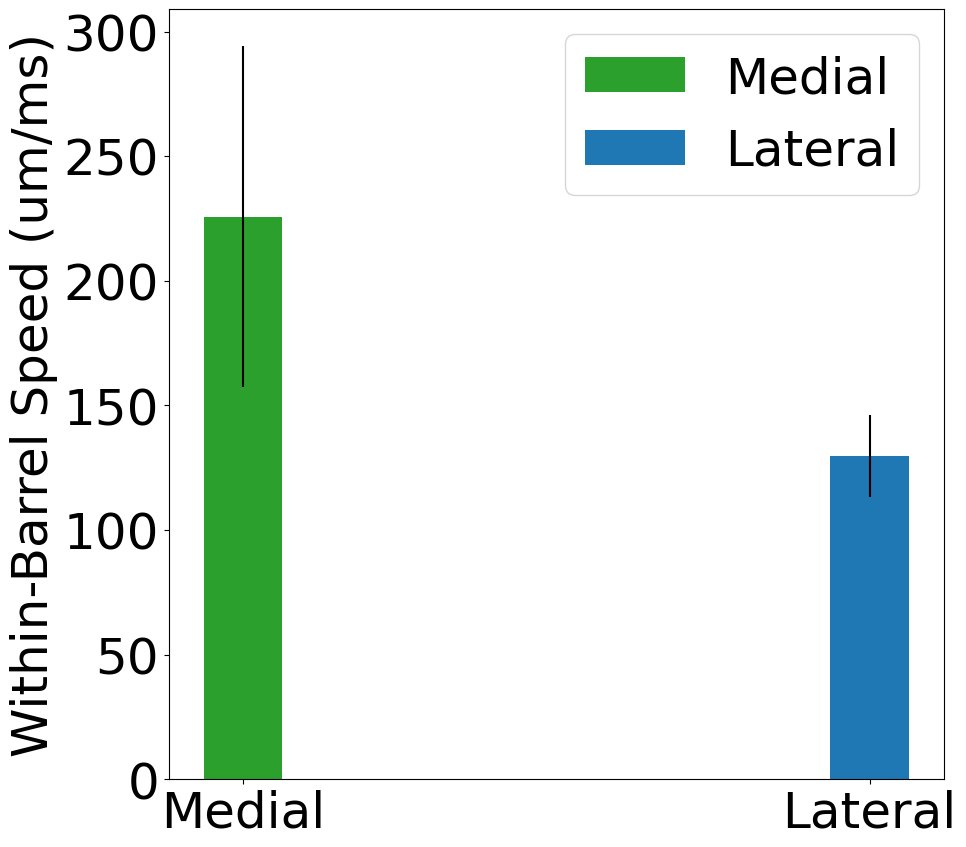

In [103]:
# compare medial vs lateral: speed



fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot speeds for ladder_df, split into L2/3 and L4, and only for neighbor barrels (ROI > 1) in ACSF
directions = ['Medial', 'Lateral']
handles = []

for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    direction_df = ladder_df[(ladder_df['Layer'] == 'L4') & 
                                #(ladder_df['drug'] == 'ACSF') & 
                                (ladder_df['ROI'] > 1) & 
                                (ladder_df['Medial/Lateral'] == direction)]
    # plot the data
    l1 = ax.bar(i, 
                    np.mean(np.abs(direction_df["instantaneous_velocity"])), 
                    yerr=sem(np.abs(direction_df["instantaneous_velocity"])), 
                    width=.125,
                    color=color, label=direction)
    handles.append(l1)

# legend: Lateral in blue, Medial in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial', 'Lateral'], loc='upper right')

ax.set_ylabel('Within-Barrel Speed (um/ms)')
ax.set_xticks([0, 1])
ax.set_xticklabels(['Medial', 'Lateral'])

# significance testing Medial vs Lateral
med = ladder_df[(ladder_df['Layer'] == 'L4') & 
                                #(ladder_df['drug'] == 'ACSF') & 
                                (ladder_df['ROI'] > 1) & 
                                (ladder_df['Medial/Lateral'] == 'Medial')]["instantaneous_velocity"]

lat = ladder_df[(ladder_df['Layer'] == 'L4') &
                                #(ladder_df['drug'] == 'ACSF') &
                                (ladder_df['ROI'] > 1) &
                                (ladder_df['Medial/Lateral'] == 'Lateral')]["instantaneous_velocity"]

# filter out nans from med and lat
med = [s for s in list(np.abs(med)) if not np.isnan(s)]
lat = [s for s in list(np.abs(lat)) if not np.isnan(s)]

print(list(med), "\n", list(lat))

t_stat, p_val = ttest_ind(med, lat, alternative='greater', equal_var=False)
print("p =", p_val)

# errorbars
ax.errorbar(0, np.mean(med), yerr=sem(med), fmt='', color='black')
ax.errorbar(1, np.mean(lat), yerr=sem(lat), fmt='', color='black')


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/velocity_medial_lateral.png')
plt.show()


In [104]:
# now let's repeat the same analysis for L2/3 readout
# read in the supragranular data
supra_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/export_summary_supragranular.csv"
supra_df = pd.read_csv(supra_dir)
supra_df['latency'] -= 48.6

# reformat Dat to match the format of the hw/lat/amp data
supra_df['Date'] = supra_df['Date'].apply(lambda x: x.replace('-', '/'))
# convert from m/d/yy to m/d/yyyy
supra_df['Date'] = supra_df['Date'].apply(lambda x: x[:-2] + '20' + x[-2:])

# merge with crossing_data to get the 'Medial/Lateral', 'Layer', and 'drug' columns. 
# append _supra to column names in the supra_df
hw_lat_df_metadata = hw_lat_df[['Date', 'Slice', 'Recording', 'Location', 'Layer', 'drug', 'Medial/Lateral']]
supra_df = supra_df.merge(hw_lat_df_metadata, on=['Date', 'Slice', 'Location', 'Recording'])

supra_df

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,Layer,drug,Medial/Lateral
0,1,0.457087,32.53260,1.7484,10.68250,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
1,1,0.457087,32.53260,1.7484,10.68250,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
2,2,0.274570,10.66380,2.3245,11.36730,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
3,2,0.274570,10.66380,2.3245,11.36730,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
4,1,0.911748,19.74610,1.8831,8.93258,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,NBQX,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,2,4.646450,21.31610,3.9587,18.61850,205.406913,76.285714,40.857143,2_rois_supragranular,12/20/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,ACSF,Lateral
124,1,4.884740,22.38250,3.6901,7.39750,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,NaN
125,1,4.884740,22.38250,3.6901,7.39750,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,Lateral
126,2,2.450560,8.86932,3.3752,11.95010,205.406913,76.285714,40.857143,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,NaN


In [105]:
# remove duplicate rows from supra_df
supra_df = supra_df.drop_duplicates(subset=['Date', 'Slice', 'Recording', 'Location', 'ROI', 'drug', 'Layer' ])
supra_df

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,Layer,drug,Medial/Lateral
0,1,0.457087,32.53260,1.7484,10.68250,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
2,2,0.274570,10.66380,2.3245,11.36730,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
4,1,0.911748,19.74610,1.8831,8.93258,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,NBQX,NaN
6,2,0.484146,7.40288,3.4801,8.44907,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,NBQX,NaN
8,1,3.270350,33.91330,0.9119,11.40020,80.498447,62.298578,24.469194,3_rois_supragranular,7/1/2024,3,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,2,2.384470,14.94280,5.0873,7.64868,181.394597,19.813559,11.943503,1_rois_supragranular,12/20/2024,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L2/3,NBQX,NaN
120,1,9.195530,33.09190,3.1583,11.94090,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,ACSF,NaN
122,2,4.646450,21.31610,3.9587,18.61850,205.406913,76.285714,40.857143,2_rois_supragranular,12/20/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,ACSF,NaN
124,1,4.884740,22.38250,3.6901,7.39750,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,NaN


x_location_bar = -0.15625
x_location_bar = -0.09375

results for home latency in L4 stim with ACSF, L2/3 vs L4:
T= 2.2584157744370668 p= 0.038239502971290563
sample size for Supragranular barrel:  9
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.61 ± 0.15
mean +/- sem for Granular barrel:  2.02 ± 0.21
x_location_bar = 0.09375
x_location_bar = 0.15625

results for neighbor latency in L4 stim with ACSF, L2/3 vs L4:
T= -1.4418794736653746 p= 0.16750568213143743
sample size for Supragranular barrel:  10
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.94 ± 0.17
mean +/- sem for Granular barrel:  3.54 ± 0.4
x_location_bar = -0.15625
x_location_bar = -0.09375

results for home latency in L2/3 stim with ACSF, L2/3 vs L4:
T= -3.2102530263962668 p= 0.009328041035193255
sample size for Supragranular barrel:  6
sample size for Granular barrel:  6
mean +/- sem for Supragranular barrel:  1.29 ± 0.17
mean +/- sem for Granular barrel:  3.2 ±

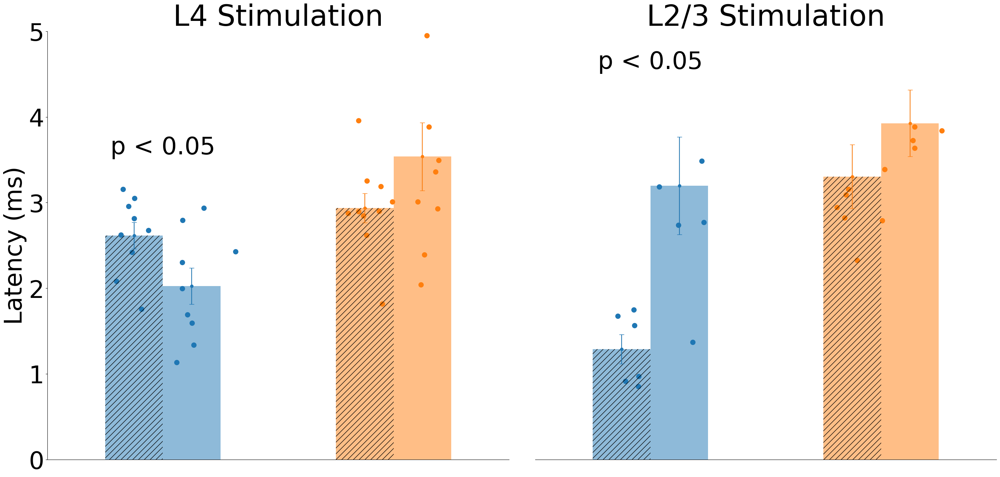


ANOVA results for latency in L4 stim:
             sum_sq    df       F    PR(>F)
C(group)  10.804100   3.0  6.2817  0.001715
Residual  18.919258  33.0     NaN       NaN

ANOVA results for latency in L2/3 stim:
             sum_sq    df         F    PR(>F)
C(group)  23.549762   3.0  7.876188  0.001043
Residual  20.929963  21.0       NaN       NaN


In [106]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
plt.rcParams.update({'font.size': 50})
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

anova_groups = {'L4 stim': [], 'L2/3 stim': []}

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L4', 'L2/3']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = ['latency'] #,'halfwidth',  'amp']
metric_labels = ['Latency (ms)', ] #'Half-Width (ms)', 'Δf/f']
handles = ['', '', '', '']
more_handles = []
for i, layer in enumerate(layers):

    # label the subplot with the layer ("L4 Stimulation" or "L2/3 Stimulation")
    ax[i].set_title(layer + ' Stimulation')
    for j, d in enumerate(drug):
        if d == 'NBQX':
            continue
        for k, home in enumerate(home_neighbor):
            region_dfs = []
            for m, region in enumerate(regions):
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if region == 'Supragranular' else None
                color = 'tab:blue' if home == 'home' else 'tab:orange'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                x_location_bar = 1/16 * m - 1/32 + k/4 - 1/8
                print("x_location_bar =", x_location_bar)
                for l, metric in enumerate(metrics):
                    h = ax[i].bar(x_location_bar, 
                                    np.mean(region_df[metric]), 
                                    yerr=sem(region_df[metric]), 
                                    width=.125 / 2,
                                    color=color, label='L4' if region == 'Granular' else 'Supragranular', hatch=hatch, alpha=0.5)

                    # add error bars
                    ax[i].errorbar(x_location_bar,
                                np.mean(region_df[metric]),
                                yerr=sem(region_df[metric]),
                                fmt='o', color=color, capsize=5)
                    # add jitter to x-axis for scatter plot
                    x_jitter = np.random.normal(x_location_bar, 0.015, len(region_df[metric]))
                    # plot the data
                    ax[i].scatter(x_jitter, region_df[metric],
                                    color=color, s=100, marker='o')
                    ax[i].set_xticks([-1/8, 1/8 ])
                    ax[i].set_xticklabels(['Home', 'Neighbor'])
                    ax[i].set_xticks([])
                    ax[0].set_ylabel('Latency (ms)' )
                    ax[i].set_xlim(-0.25, 0.25 + 0.5 * (len(metrics)-1))

                    #ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[i].set_ylim(0, 5 + 5 * (len(metrics)-1))

                    # turn off spines
                    ax[i].spines['top'].set_visible(False)
                    ax[i].spines['right'].set_visible(False)
                    ax[1].spines['left'].set_visible(False)
                    ax[1].set_yticks([])

                    if d == 'ACSF':
                        if region == 'Supragranular':
                            handles[0] = h
                        else:
                            handles[1] = h
                    if region == 'Supragranular':
                        if d == 'ACSF':
                            handles[2] = h
                        else:
                            handles[3] = h
                    more_handles.append(h)

            # significance testing: home vs neighbor barrel
            for l, metric in enumerate(metrics):
                t_stat, p_val = ttest_ind(region_dfs[0][metric], region_dfs[1][metric])
                if not (metric == 'latency' and d == 'ACSF'):
                    continue
                if layer == 'L4':
                    anova_groups['L4 stim'].append(region_dfs[0][metric])
                    anova_groups['L4 stim'].append(region_dfs[1][metric])
                else:
                    anova_groups['L2/3 stim'].append(region_dfs[0][metric])
                    anova_groups['L2/3 stim'].append(region_dfs[1][metric])
                print("\nresults for " +home+ " " + metric + " in " + layer + " stim with " + d + ", L2/3 vs L4:")
                print("T=", t_stat, "p=", p_val)
                print("sample size for Supragranular barrel: ", len(region_dfs[0][metric]))
                print("sample size for Granular barrel: ", len(region_dfs[1][metric]))
                print("mean +/- sem for Supragranular barrel: ",
                        round(region_dfs[0][metric].mean(), 2), "±", 
                        round(sem(region_dfs[0][metric]), 2))
                print("mean +/- sem for Granular barrel: ",
                        round(region_dfs[1][metric].mean(), 2), "±", 
                        round(sem(region_dfs[1][metric]), 2))
                height = max(region_dfs[0][metric].mean() + sem(region_dfs[0][metric]), 
                                region_dfs[1][metric].mean() + sem(region_dfs[1][metric])) + 0.2
                if p_val < 0.05 and d != 'NBQX':
                    ax[i].text( k/4 - 1/8, height + .6, 'p < 0.05', ha='center', fontsize=50)
                

# legend in top left, but with only the first two labels
#ax[0].legend(handles=handles[:2] + [more_handles[5], handles[1]], labels=['L2/3 ROI', 'L4 ROI', 'Home', 'Neighbor'] + drug, loc='upper left', ncol=2)
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4' + '_'.join(metrics) + '.png')
plt.show()

# anova over all four groups of L2/3 stim and over all four groups of L4 stim, for latency 
print("\nANOVA results for latency in L4 stim:")
# use anova_lm
model = ols('value ~ C(group)', data=pd.DataFrame({
    'value': np.concatenate(anova_groups['L4 stim']),
    'group': np.repeat(['Supragranular Home', 'Granular Home', 'Supragranular Neighbor', 'Granular Neighbor'], 
                        [len(anova_groups['L4 stim'][i]) for i in range(4)])
})).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)
print("\nANOVA results for latency in L2/3 stim:")
model = ols('value ~ C(group)', data=pd.DataFrame({
    'value': np.concatenate(anova_groups['L2/3 stim']),
    'group': np.repeat(['Supragranular Home', 'Granular Home', 'Supragranular Neighbor', 'Granular Neighbor'], 
                        [len(anova_groups['L2/3 stim'][i]) for i in range(4)])
})).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

x_location_bar = -0.15625
x_location_bar = 0.09375

results for home latency in L4 stim with ACSF, L2/3 vs L4:
T= 2.2584157744370668 p= 0.038239502971290563
sample size for Supragranular barrel:  9
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.61 ± 0.15
mean +/- sem for Granular barrel:  2.02 ± 0.21
x_location_bar = -0.09375
x_location_bar = 0.15625

results for neighbor latency in L4 stim with ACSF, L2/3 vs L4:
T= -1.4418794736653746 p= 0.16750568213143743
sample size for Supragranular barrel:  10
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.94 ± 0.17
mean +/- sem for Granular barrel:  3.54 ± 0.4
x_location_bar = -0.15625
x_location_bar = 0.09375

results for home latency in L2/3 stim with ACSF, L2/3 vs L4:
T= -3.2102530263962668 p= 0.009328041035193255
sample size for Supragranular barrel:  6
sample size for Granular barrel:  6
mean +/- sem for Supragranular barrel:  1.29 ± 0.17
mean +/- sem for Granular barrel:  3.2 ± 

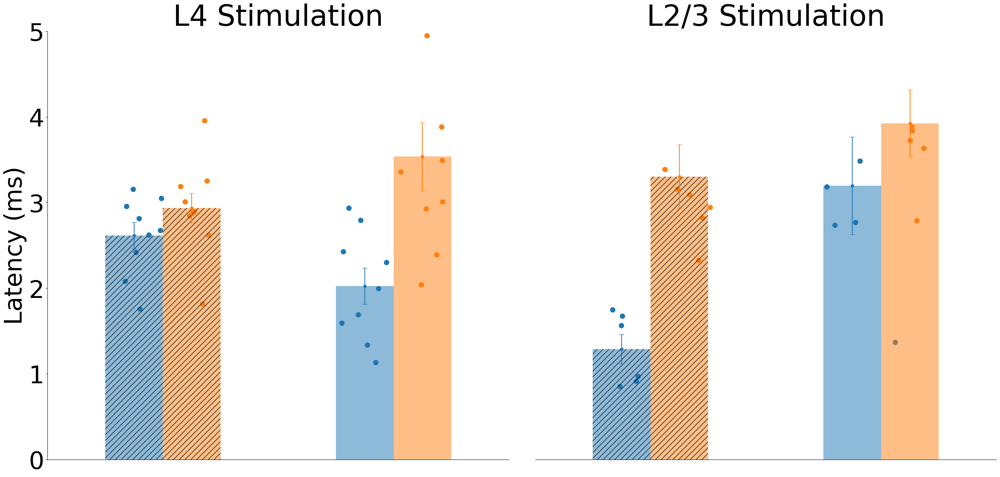


ANOVA results for latency in L4 stim:
             sum_sq    df       F    PR(>F)
C(group)  10.804100   3.0  6.2817  0.001715
Residual  18.919258  33.0     NaN       NaN

ANOVA results for latency in L2/3 stim:
             sum_sq    df         F    PR(>F)
C(group)  23.549762   3.0  7.876188  0.001043
Residual  20.929963  21.0       NaN       NaN


In [107]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
plt.rcParams.update({'font.size': 50})
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

anova_groups = {'L4 stim': [], 'L2/3 stim': []}

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L4', 'L2/3']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = ['latency'] #,'halfwidth',  'amp']
metric_labels = ['Latency (ms)', ] #'Half-Width (ms)', 'Δf/f']
handles = ['', '', '', '']
more_handles = []
for i, layer in enumerate(layers):

    # label the subplot with the layer ("L4 Stimulation" or "L2/3 Stimulation")
    ax[i].set_title(layer + ' Stimulation')
    for j, d in enumerate(drug):
        if d == 'NBQX':
            continue
        for m, home in enumerate(home_neighbor):
            region_dfs = []
            for k, region in enumerate(regions):
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if region == 'Supragranular' else None
                color = 'tab:blue' if home == 'home' else 'tab:orange'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                x_location_bar = 1/16 * m - 1/32 + k/4 - 1/8
                print("x_location_bar =", x_location_bar)
                for l, metric in enumerate(metrics):
                    h = ax[i].bar(x_location_bar, 
                                    np.mean(region_df[metric]), 
                                    yerr=sem(region_df[metric]), 
                                    width=.125 / 2,
                                    color=color, label='L4' if region == 'Granular' else 'Supragranular', hatch=hatch, alpha=0.5)

                    # add error bars
                    ax[i].errorbar(x_location_bar,
                                np.mean(region_df[metric]),
                                yerr=sem(region_df[metric]),
                                fmt='o', color=color, capsize=5)
                    # add jitter to x-axis for scatter plot
                    x_jitter = np.random.normal(x_location_bar, 0.015, len(region_df[metric]))
                    # plot the data
                    ax[i].scatter(x_jitter, region_df[metric],
                                    color=color, s=100, marker='o')
                    ax[i].set_xticks([-1/8, 1/8 ])
                    ax[i].set_xticklabels(['Home', 'Neighbor'])
                    ax[i].set_xticks([])
                    ax[0].set_ylabel('Latency (ms)' )
                    ax[i].set_xlim(-0.25, 0.25 + 0.5 * (len(metrics)-1))

                    #ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[i].set_ylim(0, 5 + 5 * (len(metrics)-1))

                    # turn off spines
                    ax[i].spines['top'].set_visible(False)
                    ax[i].spines['right'].set_visible(False)
                    ax[1].spines['left'].set_visible(False)
                    ax[1].set_yticks([])

                    if d == 'ACSF':
                        if region == 'Supragranular':
                            handles[0] = h
                        else:
                            handles[1] = h
                    if region == 'Supragranular':
                        if d == 'ACSF':
                            handles[2] = h
                        else:
                            handles[3] = h
                    more_handles.append(h)

            # significance testing: home vs neighbor barrel
            for l, metric in enumerate(metrics):
                t_stat, p_val = ttest_ind(region_dfs[0][metric], region_dfs[1][metric])
                if not (metric == 'latency' and d == 'ACSF'):
                    continue
                if layer == 'L4':
                    anova_groups['L4 stim'].append(region_dfs[0][metric])
                    anova_groups['L4 stim'].append(region_dfs[1][metric])
                else:
                    anova_groups['L2/3 stim'].append(region_dfs[0][metric])
                    anova_groups['L2/3 stim'].append(region_dfs[1][metric])
                print("\nresults for " +home+ " " + metric + " in " + layer + " stim with " + d + ", L2/3 vs L4:")
                print("T=", t_stat, "p=", p_val)
                print("sample size for Supragranular barrel: ", len(region_dfs[0][metric]))
                print("sample size for Granular barrel: ", len(region_dfs[1][metric]))
                print("mean +/- sem for Supragranular barrel: ",
                        round(region_dfs[0][metric].mean(), 2), "±", 
                        round(sem(region_dfs[0][metric]), 2))
                print("mean +/- sem for Granular barrel: ",
                        round(region_dfs[1][metric].mean(), 2), "±", 
                        round(sem(region_dfs[1][metric]), 2))
                height = max(region_dfs[0][metric].mean() + sem(region_dfs[0][metric]), 
                                region_dfs[1][metric].mean() + sem(region_dfs[1][metric])) + 0.2
                #if p_val < 0.05 and d != 'NBQX':
                #    ax[i].text( k/4 - 1/8, height + .6, 'p < 0.05', ha='center', fontsize=50)
                

# legend in top left, but with only the first two labels
#ax[0].legend(handles=handles[:2] + [more_handles[5], handles[1]], labels=['L2/3 ROI', 'L4 ROI', 'Home', 'Neighbor'] + drug, loc='upper left', ncol=2)
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4' + '_'.join(metrics) + '.png')
plt.show()

# anova over all four groups of L2/3 stim and over all four groups of L4 stim, for latency 
print("\nANOVA results for latency in L4 stim:")
# use anova_lm
model = ols('value ~ C(group)', data=pd.DataFrame({
    'value': np.concatenate(anova_groups['L4 stim']),
    'group': np.repeat(['Supragranular Home', 'Granular Home', 'Supragranular Neighbor', 'Granular Neighbor'], 
                        [len(anova_groups['L4 stim'][i]) for i in range(4)])
})).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)
print("\nANOVA results for latency in L2/3 stim:")
model = ols('value ~ C(group)', data=pd.DataFrame({
    'value': np.concatenate(anova_groups['L2/3 stim']),
    'group': np.repeat(['Supragranular Home', 'Granular Home', 'Supragranular Neighbor', 'Granular Neighbor'], 
                        [len(anova_groups['L2/3 stim'][i]) for i in range(4)])
})).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)


results for halfwidth with L4 stim, home versus neighbor (L4 ROIs):
T = -2.663174093401087 p = 0.012235732857539141
sample size for home barrel:  8
sample size for neighbor barrel:  9
mean +/- sem for home barrel:  8.8 ± 0.74
mean +/- sem for neighbor barrel:  15.22 ± 2.29

results for amp with L4 stim, home versus neighbor (L4 ROIs):
T = 1.662928500704462 p = 0.06137886052224368
sample size for home barrel:  9
sample size for neighbor barrel:  9
mean +/- sem for home barrel:  9.34 ± 2.78
mean +/- sem for neighbor barrel:  4.17 ± 1.38

results for halfwidth with L2/3 stim, home versus neighbor (L4 ROIs):
T = -1.9991353959426477 p = 0.04219503115568603
sample size for home barrel:  6
sample size for neighbor barrel:  6
mean +/- sem for home barrel:  8.07 ± 1.43
mean +/- sem for neighbor barrel:  14.59 ± 2.93

results for amp with L2/3 stim, home versus neighbor (L4 ROIs):
T = 0.4727222722461211 p = 0.32503288628359384
sample size for home barrel:  6
sample size for neighbor barrel:  6


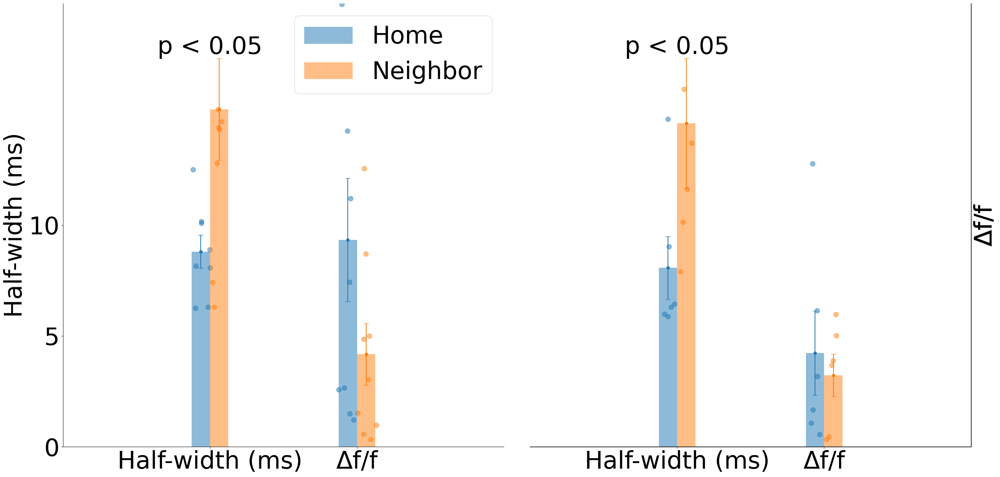

In [108]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
plt.rcParams.update({'font.size': 50})
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L4', 'L2/3']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = ['halfwidth',  'amp']
metric_labels = ['Half-width (ms)', 'Δf/f']
handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        if d == 'NBQX':
            continue
        region_dfs = []
        for k, home in enumerate(home_neighbor):
            
            for m, region in enumerate(regions):
                if region == 'Supragranular':
                    continue
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if d == 'NBQX' else None
                color = 'tab:blue' if home == 'home' else 'tab:orange'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                for l, metric in enumerate(metrics):
                    x_location_bar = l/2 + j/4 + k/16 - 1/32
                    #print("x_location_bar =", x_location_bar)
                    h = ax[i].bar(x_location_bar, 
                                    np.mean(region_df[metric].dropna()), 
                                    yerr=sem(region_df[metric].dropna()), 
                                    width=.125 / 2,
                                    color=color, label=home.capitalize(), hatch=hatch, alpha=0.5)
                    handles.append(h)

                    # add error bars
                    ax[i].errorbar(x_location_bar,
                                np.mean(region_df[metric].dropna()),
                                yerr=sem(region_df[metric].dropna()),
                                fmt='o', color=color, capsize=5)
                    # add jitter to x-axis for scatter plot
                    x_jitter = np.random.normal(x_location_bar, 0.015, len(region_df[metric].dropna()))
                    # plot the data
                    ax[i].scatter(x_jitter, region_df[metric].dropna(),
                                    color=color, alpha=0.5, s=100, marker='o')
                    ax[i].set_xticks([0, 0.5])
                    ax[i].set_xticklabels(metric_labels)
                    ax[0].set_ylabel('Half-width (ms)' )
                    ax[i].set_xlim(-0.5, 0.5 + 0.5 * (len(metrics)-1))
                    # label other side as Δf/f
                    ax2 = ax[1].twinx()
                    ax2.set_ylabel('Δf/f')
                    ax2.set_yticks([])
                    ax2.spines['left'].set_visible(False)
                    ax2.spines['top'].set_visible(False)
                    ax[1].set_yticks([])
                    #ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[i].set_ylim(0, 5 + 5 * (len(metrics)+1))

                    # turn off spines
                    ax[i].spines['top'].set_visible(False)

        # significance testing: home vs neighbor barrel
        for l, metric in enumerate(metrics):
            # exclude nans from the data
            alt = 'greater' if metric == 'amp' else 'less'
            t_stat, p_val = ttest_ind(region_dfs[0][metric].dropna(), region_dfs[1][metric].dropna(), equal_var=False, alternative=alt)
            if not (d == 'ACSF'):
                continue
            print("\nresults for " + metric + " with " + layer + " stim, home versus neighbor (L4 ROIs):")
            print('T =', t_stat, 'p =', p_val)
            print("sample size for home barrel: ", len(region_dfs[0][metric].dropna()))
            print("sample size for neighbor barrel: ", len(region_dfs[1][metric].dropna()))
            #print(region_dfs[0][metric], region_dfs[1][metric])
            print("mean +/- sem for home barrel: ",
                    round(region_dfs[0][metric].dropna().mean(), 2), "±", 
                    round(sem(region_dfs[0][metric].dropna()), 2))
            print("mean +/- sem for neighbor barrel: ",
                    round(region_dfs[1][metric].dropna().mean(), 2), "±", 
                    round(sem(region_dfs[1][metric].dropna()), 2))
            height = max(region_dfs[0][metric].dropna().mean() + sem(region_dfs[0][metric].dropna()), 
                            region_dfs[1][metric].dropna().mean() + sem(region_dfs[1][metric].dropna())) + 0.2
            if p_val < 0.05 and d != 'NBQX':
                ax[i].text(0 if metric == 'halfwidth' else 0.5, height, 'p < 0.05', ha='center', fontsize=50)
                
# spines: turn off top and right spines for both axes
ax[0].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[1].spines['top'].set_visible(False)
ax[0].set_yticks([0, 5, 10])


# legend in top left, but with only the first two labels
ax[0].legend(handles=[handles[0], handles[-1]], labels=['Home', 'Neighbor'] + drug, loc='upper right')
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4' + '_'.join(metrics) + '.png')
plt.show()



results for 1-samp t-test amp with L4 stim, home versus neighbor (L4 ROIs):
T = -3.6750964981741787 p = 0.0031316364242624474
sample size for home barrel:  9
mean +/- sem for home barrel:  0.52 ± 0.13

results for amp with L4 stim, home versus neighbor (L4 ROIs):
T = 1.662928500704462 p = 0.06137886052224368
sample size for home barrel:  9
sample size for neighbor barrel:  9
mean +/- sem for home barrel:  9.34 ± 2.78
mean +/- sem for neighbor barrel:  4.17 ± 1.38

results for halfwidth with L4 stim, home versus neighbor (L4 ROIs):
T = -2.663174093401087 p = 0.012235732857539141
sample size for home barrel:  8
sample size for neighbor barrel:  9
mean +/- sem for home barrel:  8.8 ± 0.74
mean +/- sem for neighbor barrel:  15.22 ± 2.29

results for 1-samp t-test amp with L2/3 stim, home versus neighbor (L4 ROIs):
T = -0.09360115981189322 p = 0.46453050269475454
sample size for home barrel:  6
mean +/- sem for home barrel:  0.97 ± 0.28

results for amp with L2/3 stim, home versus neighbor

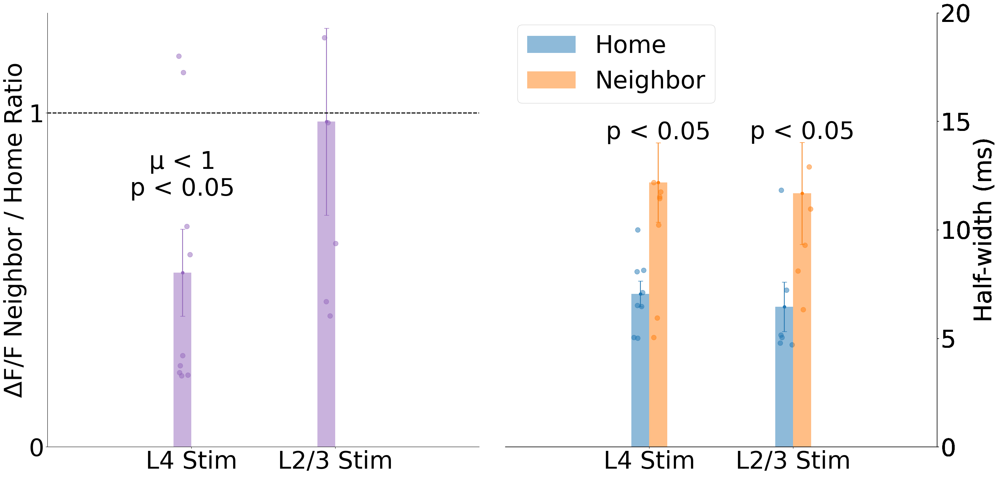

In [109]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
plt.rcParams.update({'font.size': 50})
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L4', 'L2/3']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = [ 'amp', 'halfwidth', ]
metric_labels = ['L4 Stim', 'L2/3 Stim']
handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        if d == 'NBQX':
            continue
        region_dfs = []
        for k, home in enumerate(home_neighbor):
            
            for m, region in enumerate(regions):
                if region == 'Supragranular':
                    continue
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if d == 'NBQX' else None
                color = 'tab:blue' if home == 'home' else 'tab:orange'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                for l, metric in enumerate(metrics):
                    x_location_bar = i/2 + j/4 + k/16 - 1/32
                    if metric == 'amp':
                        if home == 'home':
                            # use only one bar/scatter, which is neighbor / home
                            home_neighbor_df = df[(df['Layer'] == layer) & (df['drug'] == d)]
                            home_df = home_neighbor_df[home_neighbor_df['ROI'] == 1]
                            neighbor_df = home_neighbor_df[home_neighbor_df['ROI'] > 1]
                            # element-wise division
                            home_ratio =  (np.array(neighbor_df[metric]) / np.array(home_df[metric]))#.dropna() 
                            h = ax[l].bar(x_location_bar, 
                                            np.mean(home_ratio), 
                                            yerr=sem(home_ratio), 
                                            width=.125 / 2,
                                            color='tab:purple', label=home.capitalize(), hatch=hatch, alpha=0.5)
                            handles.append(h)

                            # add error bars
                            ax[l].errorbar(x_location_bar,
                                        np.mean(home_ratio),
                                        yerr=sem(home_ratio),
                                        fmt='o', color='tab:purple', capsize=5)
                            # add jitter to x-axis for scatter plot
                            x_jitter = np.random.normal(x_location_bar, 0.015, len(home_ratio))
                            # plot the data
                            ax[l].scatter(x_jitter, home_ratio,
                                            color='tab:purple', alpha=0.5, s=100, marker='o')
                            
                            # t-test: is the ratio significantly less than 1?
                            t_stat, p_val = ttest_1samp(home_ratio, 1, alternative='less')
                            print("\nresults for 1-samp t-test " + metric + " with " + layer + " stim, home versus neighbor (L4 ROIs):")
                            print('T =', t_stat, 'p =', p_val)
                            print("sample size for home barrel: ", len(home_ratio))
                            print("mean +/- sem for home barrel: ",
                                    round(np.mean(home_ratio), 2), "±", 
                                    round(sem(home_ratio), 2))
                            if p_val < 0.05 and d != 'NBQX':
                                ax[l].text(x_location_bar, 
                                            np.mean(home_ratio) + sem(home_ratio) + 0.1, # mu symbol: 
                                            'μ < 1\np < 0.05', ha='center', fontsize=50)
                    else:
                        
                        #print("x_location_bar =", x_location_bar)
                        h = ax[l].bar(x_location_bar, 
                                        np.mean(region_df[metric].dropna()), 
                                        yerr=sem(region_df[metric].dropna()), 
                                        width=.125 / 2,
                                        color=color, label=home.capitalize(), hatch=hatch, alpha=0.5)
                        handles.append(h)

                        # add error bars
                        ax[l].errorbar(x_location_bar,
                                    np.mean(region_df[metric].dropna()),
                                    yerr=sem(region_df[metric].dropna()),
                                    fmt='o', color=color, capsize=5)
                        # add jitter to x-axis for scatter plot
                        x_jitter = np.random.normal(x_location_bar, 0.015, len(region_df[metric].dropna()))
                        # plot the data
                        ax[l].scatter(x_jitter, region_df[metric].dropna(),
                                        color=color, alpha=0.5, s=100, marker='o')
                    ax[l].set_xticks([0, 0.5])
                    ax[l].set_xticklabels(metric_labels)
                    ax[0].set_ylabel('ΔF/F Neighbor / Home Ratio' )
                    ax[l].set_xlim(-0.5, 0.5 + 0.5 * (len(metrics)-1))
                    # label other side as Δf/f
                    ax2 = ax[1].twinx()
                    ax2.set_ylabel('Half-width (ms)')
                    ax2.set_yticks([0,  5, 10, 15, 20])
                    ax2.spines['left'].set_visible(False)
                    ax2.spines['top'].set_visible(False)
                    ax[1].set_yticks([])
                    #ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[1].set_ylim(0, 25)
                    ax[0].set_ylim(0, 1.3)

                    # horizontal line at 1 for amp ratio
                    ax[0].axhline(y=1, color='black', linestyle='--', linewidth=2)
                

                    # turn off spines
                    ax[l].spines['top'].set_visible(False)

        # significance testing: home vs neighbor barrel
        for l, metric in enumerate(metrics):
            # exclude nans from the data
            alt = 'greater' if metric == 'amp' else 'less'
            t_stat, p_val = ttest_ind(region_dfs[0][metric].dropna(), region_dfs[1][metric].dropna(), equal_var=False, alternative=alt)
            if not (d == 'ACSF'):
                continue
            print("\nresults for " + metric + " with " + layer + " stim, home versus neighbor (L4 ROIs):")
            print('T =', t_stat, 'p =', p_val)
            print("sample size for home barrel: ", len(region_dfs[0][metric].dropna()))
            print("sample size for neighbor barrel: ", len(region_dfs[1][metric].dropna()))
            #print(region_dfs[0][metric], region_dfs[1][metric])
            print("mean +/- sem for home barrel: ",
                    round(region_dfs[0][metric].dropna().mean(), 2), "±", 
                    round(sem(region_dfs[0][metric].dropna()), 2))
            print("mean +/- sem for neighbor barrel: ",
                    round(region_dfs[1][metric].dropna().mean(), 2), "±", 
                    round(sem(region_dfs[1][metric].dropna()), 2))
            height = max(region_dfs[0][metric].dropna().mean() + sem(region_dfs[0][metric].dropna()), 
                            region_dfs[1][metric].dropna().mean() + sem(region_dfs[1][metric].dropna())) + 0.2
            if p_val < 0.05 and d != 'NBQX':
                ax[l].text((x_location_bar if metric == 'halfwidth' else 0.5) , height, 'p < 0.05', ha='center', fontsize=50)
                
# spines: turn off top and right spines for both axes
ax[1].spines['left'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].spines['top'].set_visible(False)
ax[0].set_yticks([0, 1])


# legend in top left, but with only the first two labels
ax[1].legend(handles=[handles[1], handles[-1]], labels=['Home', 'Neighbor'] + drug, loc='upper left')
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4' + '_'.join(metrics) + '.png')
plt.show()


In [110]:
# compare:
# sample size for home barrel:  9
# mean +/- sem for home barrel:  0.52 ± 0.13

# to

# sample size for home barrel:  6
# mean +/- sem for home barrel:  0.97 ± 0.28

t_stat, p_val = ttest_ind_from_stats(mean1=0.52, std1=0.13*9**0.5, nobs1=9, mean2=0.97, std2=0.28*6**0.5, nobs2=6, equal_var=False, alternative='less')
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

t-statistic:  -1.4576929838814079
p-value:  0.0936171475556377


In [111]:
'''Results
results for home latency in L4 stim with ACSF, L2/3 vs L4:
T= 2.2584157744370668 p= 0.038239502971290563
sample size for Supragranular barrel:  9
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.61 ± 0.15
mean +/- sem for Granular barrel:  2.02 ± 0.21
x_location_bar = 0.09375
x_location_bar = 0.15625

results for neighbor latency in L4 stim with ACSF, L2/3 vs L4:
T= -1.4418794736653746 p= 0.16750568213143743
sample size for Supragranular barrel:  10
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.94 ± 0.17
mean +/- sem for Granular barrel:  3.54 ± 0.4
x_location_bar = -0.15625
x_location_bar = -0.09375

results for home latency in L2/3 stim with ACSF, L2/3 vs L4:
T= -3.2102530263962668 p= 0.009328041035193255
sample size for Supragranular barrel:  6
sample size for Granular barrel:  6
mean +/- sem for Supragranular barrel:  1.29 ± 0.17
mean +/- sem for Granular barrel:  3.2 ± 0.57
x_location_bar = 0.09375
x_location_bar = 0.15625

results for neighbor latency in L2/3 stim with ACSF, L2/3 vs L4:
T= -1.1541998608953248 p= 0.27287831002932605
sample size for Supragranular barrel:  7
sample size for Granular barrel:  6
mean +/- sem for Supragranular barrel:  3.3 ± 0.37
mean +/- sem for Granular barrel:  3.93 ± 0.39
'''


print("compare granular ROIs within L2/3 stimulation")
home_L23_mean = 3.2
home_L23_std = 0.57 * np.sqrt(6)
neighbor_L23_mean = 3.93
neighbor_L23_std = 0.39 * np.sqrt(6)
t_stat, p_val = ttest_ind_from_stats(mean1=home_L23_mean, std1=home_L23_std, nobs1=6,
                                        mean2=neighbor_L23_mean, std2=neighbor_L23_std, nobs2=6,
                                        equal_var=False)
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

print("compare granular ROIs within L4 stimulation")
home_L4_mean = 2.02
home_L4_std = 0.21 * np.sqrt(9)
neighbor_L4_mean = 3.54
neighbor_L4_std = 0.4 * np.sqrt(9)
t_stat, p_val = ttest_ind_from_stats(mean1=home_L4_mean, std1=home_L4_std, nobs1=9,
                                        mean2=neighbor_L4_mean, std2=neighbor_L4_std, nobs2=9,
                                        equal_var=False)
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

print("compare supragranular ROIs within L2/3 stimulation")
home_L23_mean = 1.29
home_L23_std = 0.17 * np.sqrt(6)
neighbor_L23_mean = 3.3
neighbor_L23_std = 0.37 * np.sqrt(7)
t_stat, p_val = ttest_ind_from_stats(mean1=home_L23_mean, std1=home_L23_std, nobs1=6,
                                        mean2=neighbor_L23_mean, std2=neighbor_L23_std, nobs2=6,
                                        equal_var=False)
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

print("compare supragranular ROIs within L4 stimulation")
home_L4_mean = 2.61
home_L4_std = 0.15 * np.sqrt(9)
neighbor_L4_mean = 2.94
neighbor_L4_std = 0.17 * np.sqrt(9)
t_stat, p_val = ttest_ind_from_stats(mean1=home_L4_mean, std1=home_L4_std, nobs1=9,
                                        mean2=neighbor_L4_mean, std2=neighbor_L4_std, nobs2=9,
                                        equal_var=False)
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

compare granular ROIs within L2/3 stimulation
t-statistic:  -1.0569724573901356
p-value:  0.31855210909089915
compare granular ROIs within L4 stimulation
t-statistic:  -3.3645120307841854
p-value:  0.005567405364663692
compare supragranular ROIs within L2/3 stimulation
t-statistic:  -4.628135064868921
p-value:  0.0026401295617171344
compare supragranular ROIs within L4 stimulation
t-statistic:  -1.4555676015910624
p-value:  0.16514797532105127


Skipping date 6/26/2024
Skipping date 7/1/2024
Skipping date 7/15/2024
Skipping date 7/17/2024
Skipping date 11/6/2024
Skipping date 12/9/2024
Skipping date 12/11/2024
Skipping date 10/23/2024
Skipping date 10/29/2024
Skipping date 12/18/2024
Saved figure to P:/John/crossing-paper/input/12-20-2024_1_3_1.png


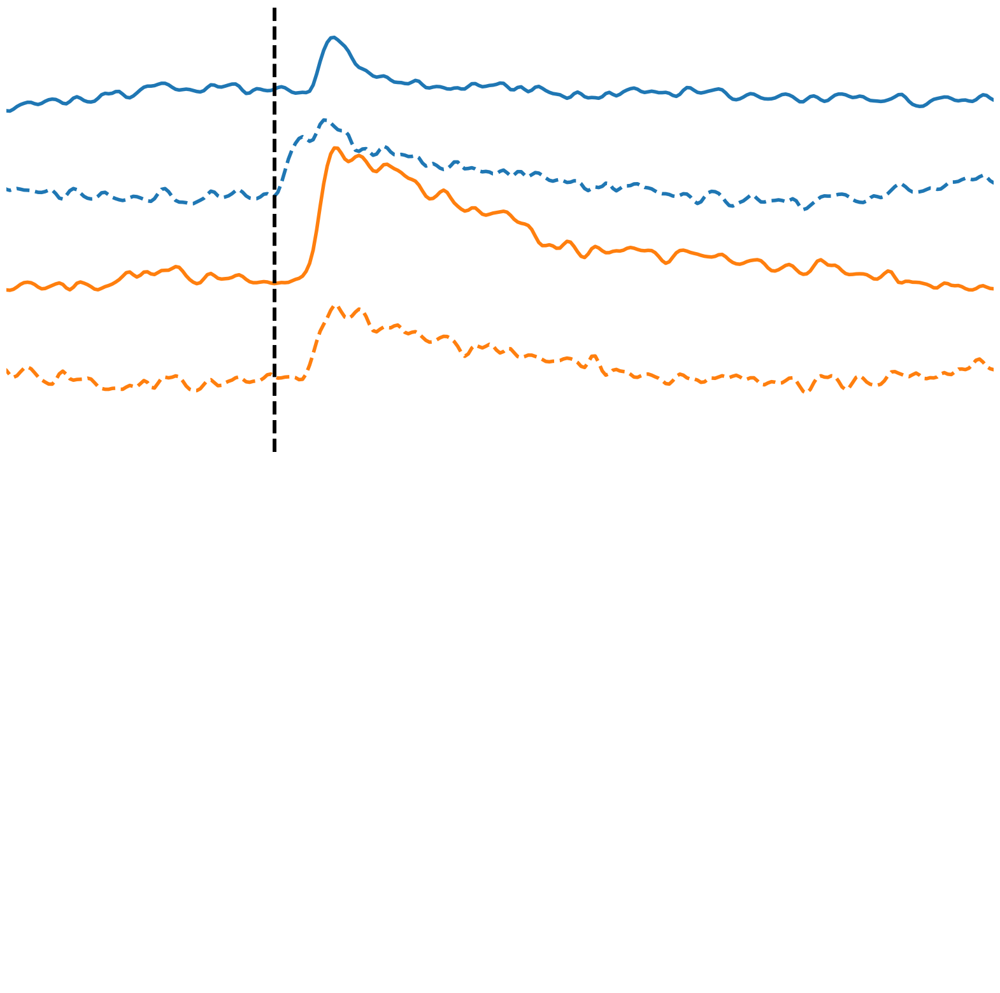

Saved figure to P:/John/crossing-paper/input/12-20-2024_1_3_2.png


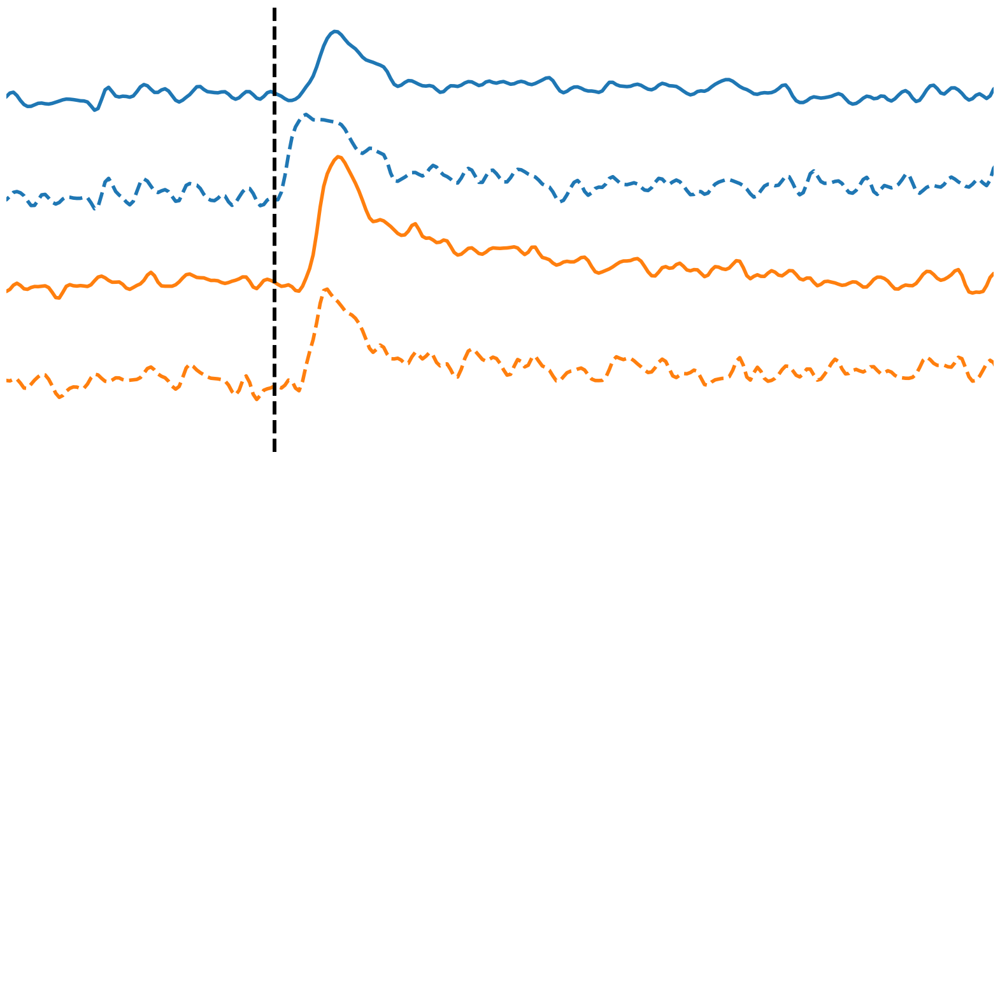

Saved figure to P:/John/crossing-paper/input/12-20-2024_2_1_1.png


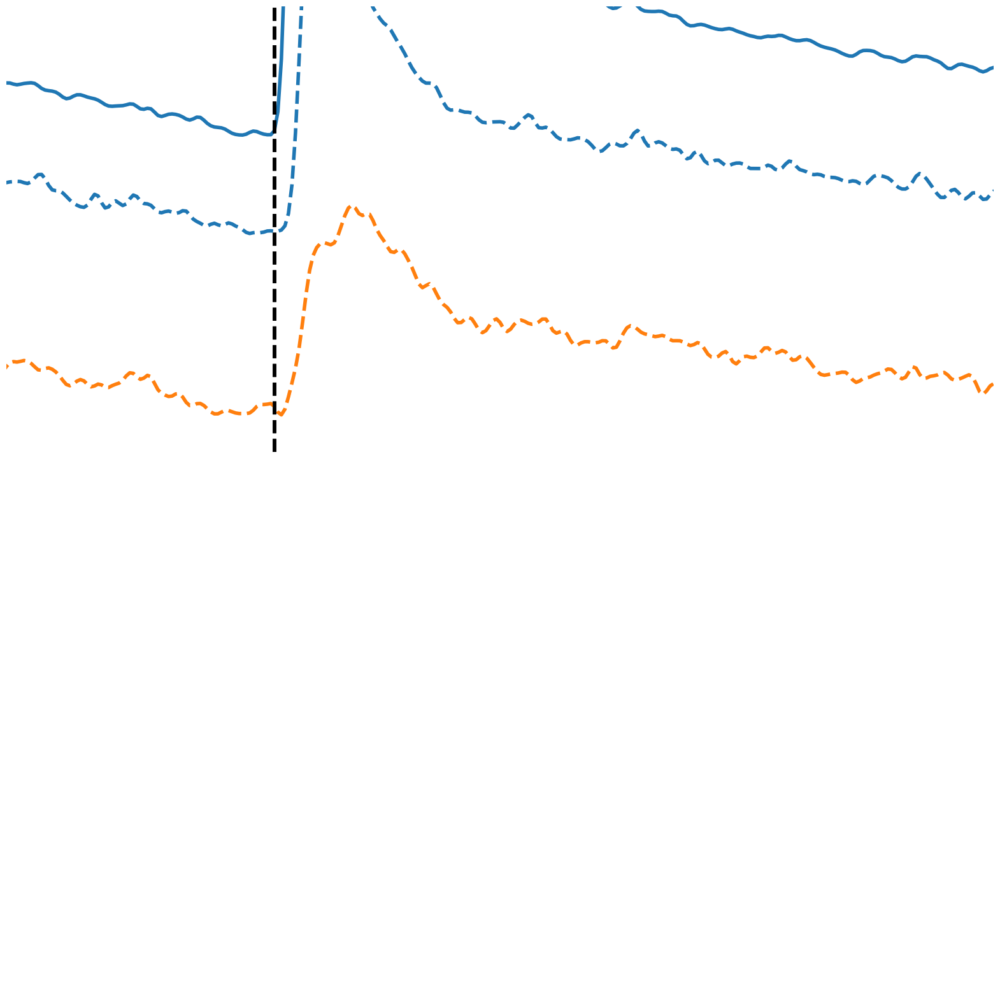

Saved figure to P:/John/crossing-paper/input/12-20-2024_2_3_1.png


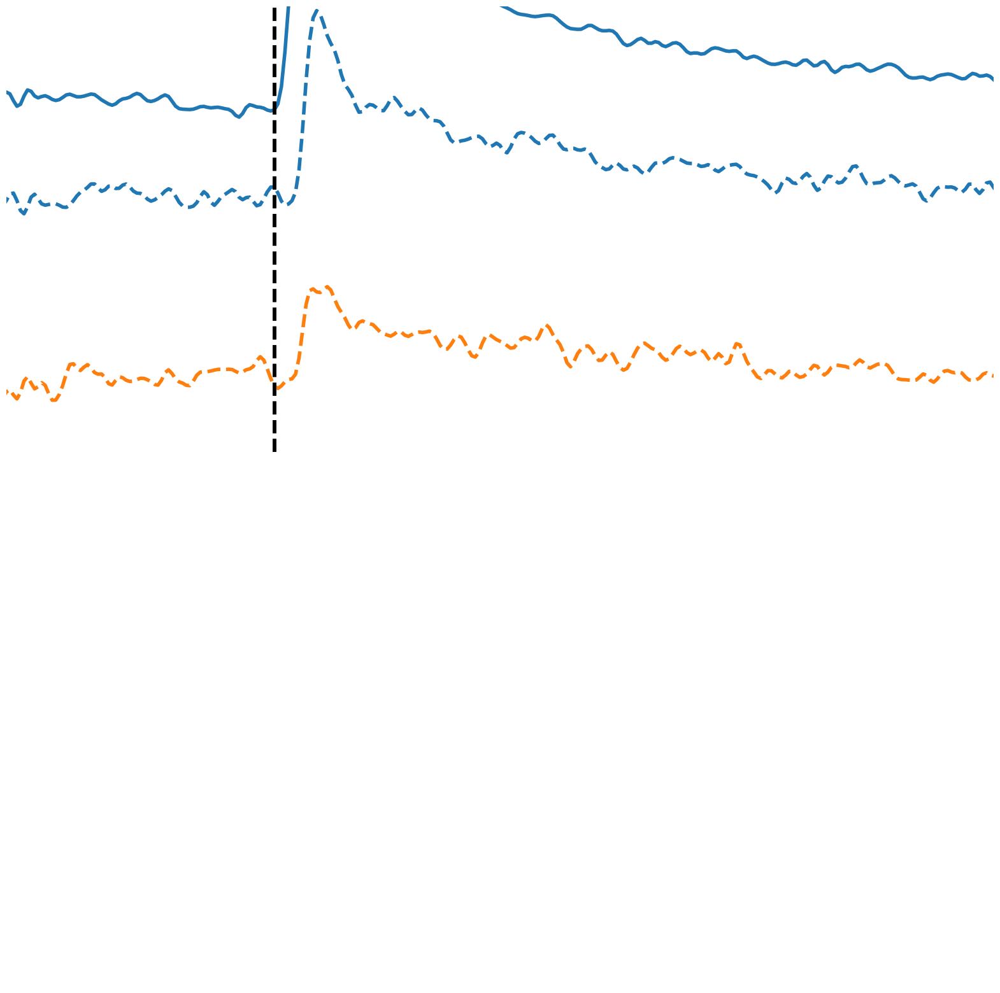

In [112]:
# compare supragranular traces to granular (L4) traces.
# for each layer and drug, compare supragranular to granular for home and neighbor barrels, plotting them in the same plot.
# matplotlib font size 20 rcParams['font.size'] = 20
plt.rcParams['font.size'] = 30

for date in supra_df['Date'].unique():
    date_df = supra_df[supra_df['Date'] == date]
    if not date == '12/20/2024': # C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/L4_NBQX_2/12-18-24/selected_zda
        print('Skipping date ' + date)
        continue
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            for rec in loc_df['Recording'].unique():
                rec_df = loc_df[loc_df['Recording'] == rec]

                # get the layer and drug
                layer = rec_df['Layer'].values[0]
                drug = rec_df['drug'].values[0]

                # get the trace file
                supra_trace = rec_df['trace']
                # read in the trace
                supra_trace = read_dat_trace_file(supra_trace.values[0])

                # get the granular trace
                granular_df = hw_lat_df[(hw_lat_df['Date'] == date) &
                                        (hw_lat_df['Slice'] == slic) &
                                        (hw_lat_df['Location'] == loc) &
                                        (hw_lat_df['Recording'] == rec)]
                if granular_df.empty:
                    continue
                granular_trace_file = granular_df['trace']
                if 'amp_array' in granular_trace_file.values[0]:
                    granular_trace_file.values[0] = granular_trace_file.values[0].replace('amp_array', 'trace')
                try:
                    granular_trace = read_dat_trace_file(granular_trace_file.values[0])
                except FileNotFoundError:

                    print('File not found for ' + granular_trace.values[0])
                    continue

                # plot the traces
                fig, ax = plt.subplots(2, 1, figsize=(20, 20))
                cols = supra_trace.columns
                if len(granular_trace.columns) < len(cols):
                    cols = granular_trace.columns

                spacing = 2.5 # for 12/20
                #spacing = 1 # for 12/18
                for i, roi in enumerate(granular_trace.columns):
                    if roi == 'Pt' or roi == 'ROI2':
                        continue
                    t = np.arange(0, len(granular_trace[roi]) * 0.5, 0.5)
                    i_plot = 0 if roi == "ROI1" else 1
                    color = 'tab:blue' if roi == "ROI1" else 'tab:orange'
                    dashed = '-'
                    ax[0].plot(t, granular_trace[roi] - i_plot * spacing * 2, color=color, linestyle=dashed, linewidth=4)
                    #base += granular_trace[roi].max() + 0.1
                for i, roi in enumerate(supra_trace.columns):
                    if roi == 'Pt':
                        continue
                    try:
                        t = np.arange(0, len(granular_trace[roi]) * 0.5, 0.5)
                    except KeyError:
                        print('KeyError for ' + roi + ' in ' + date + ' ' + str(slic) + ' ' + str(loc) + ' ' + str(rec))
                        print("available keys: ", granular_trace.columns, 'for filename' + granular_trace_file.values[0])
                        continue
                    i_plot = 0 if roi == "ROI1" else 1
                    color = 'tab:blue' if roi == "ROI1" else 'tab:orange'
                    dashed = '--'
                    ax[0].plot(np.arange(0, len(supra_trace[roi]) * 0.5, 0.5), supra_trace[roi] - spacing - i_plot * spacing * 2, color=color, linewidth=4, linestyle=dashed)
                    #base += supra_trace[roi].max() + 0.1
                        
                    #ax[0].legend(loc='upper right', labels=['L4 ROI', 'L2/3 ROI'])
                    # label date, slice, loc, rec, layer, drug
                    #ax[0].set_title('Date: ' + date + '   Layer: ' + layer + '   Drug: ' + drug)
                    #ax[0].set_ylabel('Δf/f')
                    #ax[1].set_ylabel('Δf/f')
                    ax[0].set_xticks([])
                    ax[1].set_xticks([])
                    ax[0].set_yticks([])
                    ax[1].set_yticks([])
                    ax[0].set_xlim(10, 150)
                    ax[1].set_xlim(10, 150)
                    ax[0].set_ylim(-9.5, 2.5)  # for 12/20/24
                    #ax[0].set_ylim(-5.5, 3.5) # for 12/18/24
                    ax[1].set_ylim(-1.5, 3.5)
                    #ax[1].set_xlabel('Time (ms)')

                    # label stim time
                    ax[0].axvline(x=48, color='black', linestyle='--', linewidth=4)

                    # turn off the spines
                    ax[0].spines['top'].set_visible(False)
                    ax[0].spines['right'].set_visible(False)
                    ax[1].spines['top'].set_visible(False)
                    ax[1].spines['right'].set_visible(False)
                    ax[0].spines['bottom'].set_visible(False)
                    ax[0].spines['left'].set_visible(False)
                    ax[1].spines['bottom'].set_visible(False)
                    ax[1].spines['left'].set_visible(False)

                plt.savefig(output_fig_dir + date.replace('/', '-') + '_' + str(slic) + '_' + str(loc) + '_' + str(rec) + '.png')
                print('Saved figure to ' + output_fig_dir + date.replace('/', '-') + '_' + str(slic) + '_' + str(loc) + '_' + str(rec) + '.png')
                plt.show()


Mean latency for Home Granular: 2.8255819999999994 ± 0.057007197904202354
Mean latency for Neighbor Granular: 3.6199569999999976 ± 0.07024953217077054
Mean latency for Home Supragranular: 2.939088999999998 ± 0.03336644476343737
Mean latency for Neighbor Supragranular: 2.9629091836734687 ± 0.06154516330474846


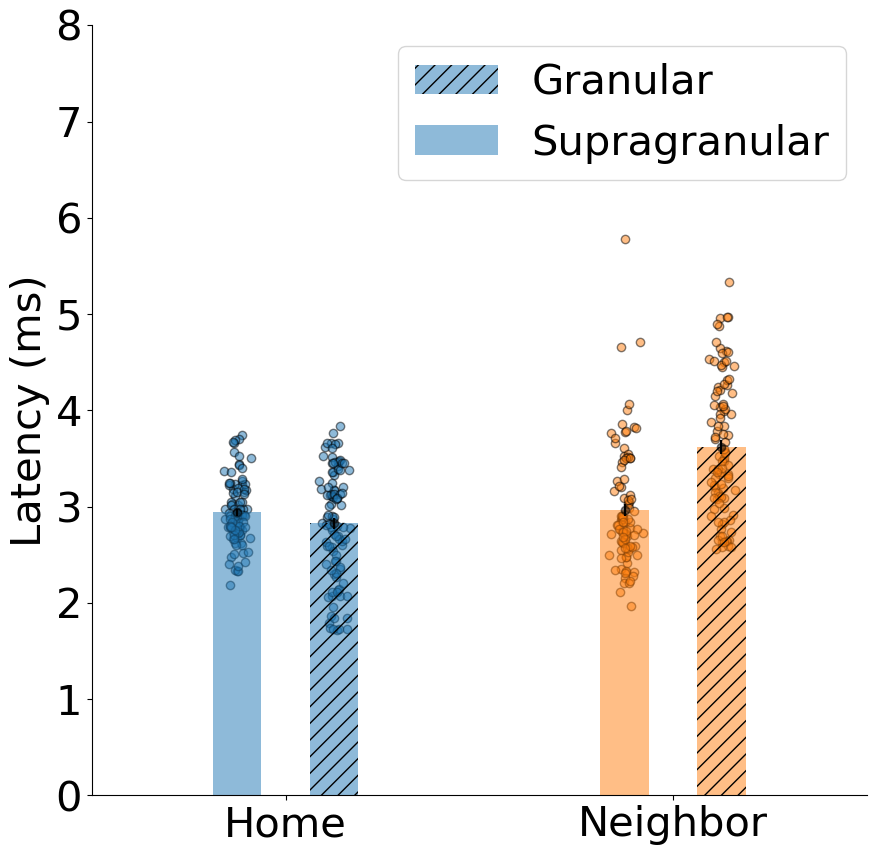

In [113]:
# use C:\Users\jjudge3\Desktop\Data\crossing_PPR\L23_vs_L4_NBQX\L4_NBQX_2\12-18-24\selected_zda\rand_rois02_01_02/export_summary.csv
# to plot latency distributions for each layer/barrel (4 total)
# read in the data
latencies_rand_12_18_24 = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/L4_NBQX_2/12-18-24/selected_zda/rand_rois02_01_02/export_summary.csv'
latencies_rand_12_18_24_df = pd.read_csv(latencies_rand_12_18_24)
latencies_rand_12_18_24_df['latency'] -= 48.6
latencies_rand_12_18_24_df = latencies_rand_12_18_24_df[latencies_rand_12_18_24_df['latency'] > 0]

types_rois = latencies_rand_12_18_24_df['ROI_Set'].unique()
roi_type_map = {
    '2_rois_output__rand_0': ['Home', 'Granular'], 
    '2_rois_output__rand_1': ['Neighbor', 'Granular'],
    '2_rois_supragranular_output__rand_0': ['Home', 'Supragranular'],
    '2_rois_supragranular_output__rand_1': ['Neighbor', 'Supragranular']
}
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
handles = []
for i, roi_type in enumerate(types_rois):
    barrel, layer = roi_type_map[roi_type]
    # get the data for the barrel and layer
    roi_df = latencies_rand_12_18_24_df[latencies_rand_12_18_24_df['ROI_Set'] == roi_type]
    # get the mean and std of the latency
    mean_latency = np.mean(roi_df['latency'])
    sem_latency = sem(roi_df['latency'])
    # plot the data as 4 bars, with error bars and scatter points for each layer/barrel
    color = 'tab:blue' if barrel == 'Home' else 'tab:orange'
    hatch = '//' if layer == 'Granular' else None

    x_loc = 0 if barrel == 'Home' else 1
    x_loc += 0.125 if layer == 'Granular' else -0.125

    l1 = ax.bar(x_loc, mean_latency, yerr=sem_latency, width=.125, color=color, hatch=hatch, alpha=0.5)
    ax.errorbar(x_loc, mean_latency, yerr=sem_latency, fmt='o', color='black', alpha=0.5)
    x_jitter = np.random.normal(0, 0.015, size=len(roi_df['latency']))
    ax.scatter(x_loc + x_jitter, roi_df['latency'], color=color, alpha=0.5, edgecolors='black')
    handles.append(l1)

    print('Mean latency for ' + barrel + ' ' + layer + ': ' + str(mean_latency) + ' ± ' + str(sem_latency))

ax.legend(handles=[handles[0], handles[2]], labels=['Granular', 'Supragranular'], loc='upper right')
ax.set_ylim(0, 8)
ax.set_xlim(-0.5, 1.5)
ax.set_xticks([0, 1])

# remove spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Latency (ms)')
plt.savefig(output_fig_dir + 'latency_distributions_rand_rois.png')
plt.show()

In [114]:
# load PPR data and take just the first-pulse rows for IPI = 100 to use as more single-pulse data (medial/lateral)
ppr_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_coronal.csv'
ppr_coronal_df = pd.read_csv(ppr_data)
ppr_coronal_df['latency'] -= 78.78  # measured via PhotoZ for IPI == 100 pulse 1
# load PPR catalog
ppr_catalog = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/ppr_catalog_backup-coronal-only.csv'
ppr_catalog_df = pd.read_csv(ppr_catalog)

# only keep zda_file, IPI, and is_single_pulse_control columns
ppr_catalog_df = ppr_catalog_df[['zda_file', 'IPI', 'is_single_pulse_control']]

# parse slice, location, and recording numbers from zda_file and store in new columns
ppr_catalog_df['zda_id'] = ppr_catalog_df['zda_file'].apply(lambda x: x.split('/')[-1].split('.')[0])
ppr_catalog_df['Slice'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[0]))
ppr_catalog_df['Location'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[1]))
ppr_catalog_df['Recording'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[2]))

# parse date from zda_file column. It is in format "/mm-dd-yy/", use pattern matching to extract date (regex)
# Function to extract date using regex
def extract_date(filename):
    match = re.search(r'(\d{2}-\d{2}-\d{2})', filename)
    if match:
        # remove zero padding from day and month
        m,d,y = match.group(0).split('-')
        d = str(int(d))
        m = str(int(m))
        return f"{m}/{d}/20{y}"
    return None

ppr_catalog_df['Date'] = ppr_catalog_df['zda_file'].apply(extract_date)

# merge the two dataframes, using date, slice, location, and recording as keys
ppr_coronal_df = ppr_coronal_df.merge(ppr_catalog_df, on=['Date', 'Slice', 'Location', 'Recording'])

# drop the zda_file column
ppr_coronal_df.drop('zda_file', axis=1, inplace=True)

# only keep the first pulse for IPI = 100 and single pulse controls only
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['is_single_pulse_control'] == 1]
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['IPI'] == 100]

# keep only with substring 'pulse1' in the 'ROI_Set' column
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['ROI_Set'].str.contains('pulse1')]

# filter out columns with Home in Medial/Lateral
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Medial/Lateral'] != 'Home']

# remove rows with negative halfwidth or latency
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['halfwidth'] > 0]
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['latency'] > 0]

# add Layer column and fill with 'L4'
ppr_coronal_df['Layer'] = 'L4'
ppr_coronal_df['drug'] = 'ACSF'

# to avoid double counts, remove rows from Date == ['12/18/2024' '12/20/2024']
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Date'] != '12/18/2024']
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Date'] != '12/20/2024']

ppr_coronal_df



,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral,IPI,is_single_pulse_control,zda_id,Layer,drug
91,2,2.432550,5.5113,18.3610,53.121780,52.351288,2_rois pulse1,1/2/2025,2,2,5,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,02_02_05,L4,ACSF
187,2,1.856520,3.6446,16.8169,53.754098,48.061475,1_rois pulse1,1/7/2025,1,2,11,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,01_02_11,L4,ACSF
311,2,1.800210,3.2945,11.9526,60.164021,62.899471,2_rois pulse1,1/7/2025,2,5,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,02_05_26,L4,ACSF
385,2,1.992990,3.9166,26.4890,30.245370,50.333333,3_rois-3-barrels pulse1,1/7/2025,3,2,13,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,03_02_13,L4,ACSF
386,3,1.526330,4.5569,29.9288,70.971264,22.959770,3_rois-3-barrels pulse1,1/7/2025,3,2,13,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,03_02_13,L4,ACSF
515,2,2.797810,4.1902,15.5445,52.301075,60.688172,4_rois pulse1,1/7/2025,4,2,16,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,04_02_16,L4,ACSF
1030,2,0.749263,2.8437,16.8471,45.560403,52.040268,1_rois pulse1,12/23/2024,1,3,11,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,01_03_11,L4,ACSF


Medial: 7
Lateral: 8


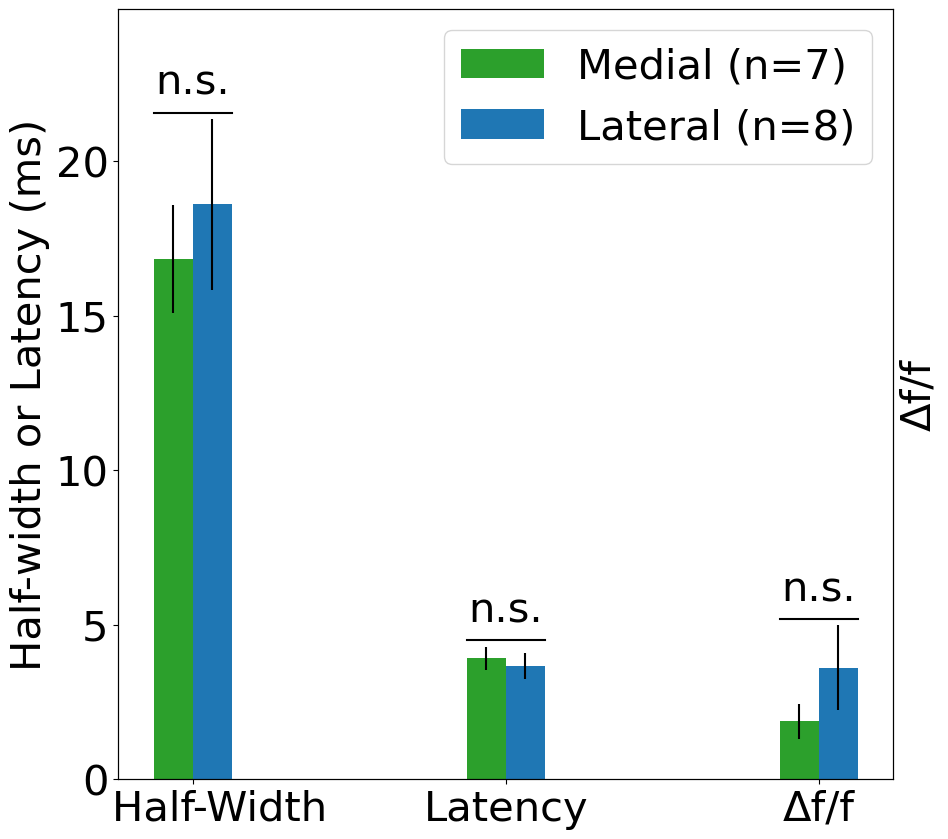

In [115]:


# plot the data that has 'Medial/Lateral' column populated. Restrict to L4 and ACSF and neighbor barrels (ROI > 1)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot only for L4, not for L2/3. Compare latency, half-width, and amplitude for medial vs lateral neighbor barrels
directions = ['Medial', 'Lateral']
handles = []

sample_sizes = {dir: [] for dir in directions}
for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
        # get the data for the direction
        direction_list = []
        for df in [hw_lat_df, ppr_coronal_df]:
            direction_df = df[(df['Layer'] == 'L4') & 
                                    (df['drug'] == 'ACSF') & 
                                    (df['ROI'] > 1) & 
                                    (df['Medial/Lateral'] == direction)]
            direction_list += list(direction_df[metric])
        direction_list = np.array(direction_list)
        # plot the data
        l1 = ax.bar(j + i / 8 - 1/16, 
                        np.mean(direction_list), 
                        yerr=sem(direction_list), 
                        width=.125,
                        color=color, label=direction)
        handles.append(l1)

        if j == 0:
            # print sample size for each direction
            print(direction + ':', len(direction_list))
            sample_sizes[direction].append(len(direction_list))

# legend: Medial in black, Lateral in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial (n=' + str(sum((sample_sizes['Medial']))) + ")", 
                                                     'Lateral (n=' + str(sum((sample_sizes['Lateral']))) + ")"], 
                                            loc='upper right')

ax.set_ylabel('Half-width or Latency (ms)')
# right-side y-axis label
ax2 = ax.twinx()
ax2.set_ylabel('Δf/f')
ax2.set_yticks([])

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['    Half-Width', 'Latency', 'Δf/f'])

# significance testing Medial vs Lateral
for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
    med1 = ppr_coronal_df[(ppr_coronal_df['Layer'] == 'L4') & 
                                        (ppr_coronal_df['drug'] == 'ACSF') & 
                                        (ppr_coronal_df['ROI'] > 1) & 
                                        (ppr_coronal_df['Medial/Lateral'] == 'Medial')][metric]
    lat1 = ppr_coronal_df[(ppr_coronal_df['Layer'] == 'L4') &
                                        (ppr_coronal_df['drug'] == 'ACSF') &
                                        (ppr_coronal_df['ROI'] > 1) &
                                        (ppr_coronal_df['Medial/Lateral'] == 'Lateral')][metric]
    med2 = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Medial')][metric]
    lat2 = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Lateral')][metric]
    med = list(med1) + list(med2)
    lat = list(lat1) + list(lat2)
    t_stat, p_val = ttest_ind(med, lat, equal_var=False)
    # draw bar between the two boxes # ax.get_ylim()[1] * 0.8
    med = np.array(med)
    lat = np.array(lat)
    height = max(med.mean() + sem(med), lat.mean() + sem(lat)) + 0.2

    ax.plot([j - 1/8, j + 1/8], [height, height], color='black')
    if p_val < 0.05:
        ax.text(j, height + .6, 'p < 0.05', ha='center')

        
    else:
        ax.text(j, height + .6, 'n.s.', ha='center')

# raise the y-axis limit by 10% to make room for the significance testing
ax.set_ylim(0, ax.get_ylim()[1] * 1.1)


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp_medial_lateral.png')
plt.show()


t-test between home and neighbor: t = 0.7660142938426769, p = 0.45276422671002037
home: 132.02288046840863, 9.821862000736079
neighbor: 123.2438108460004, 5.9058410694381385


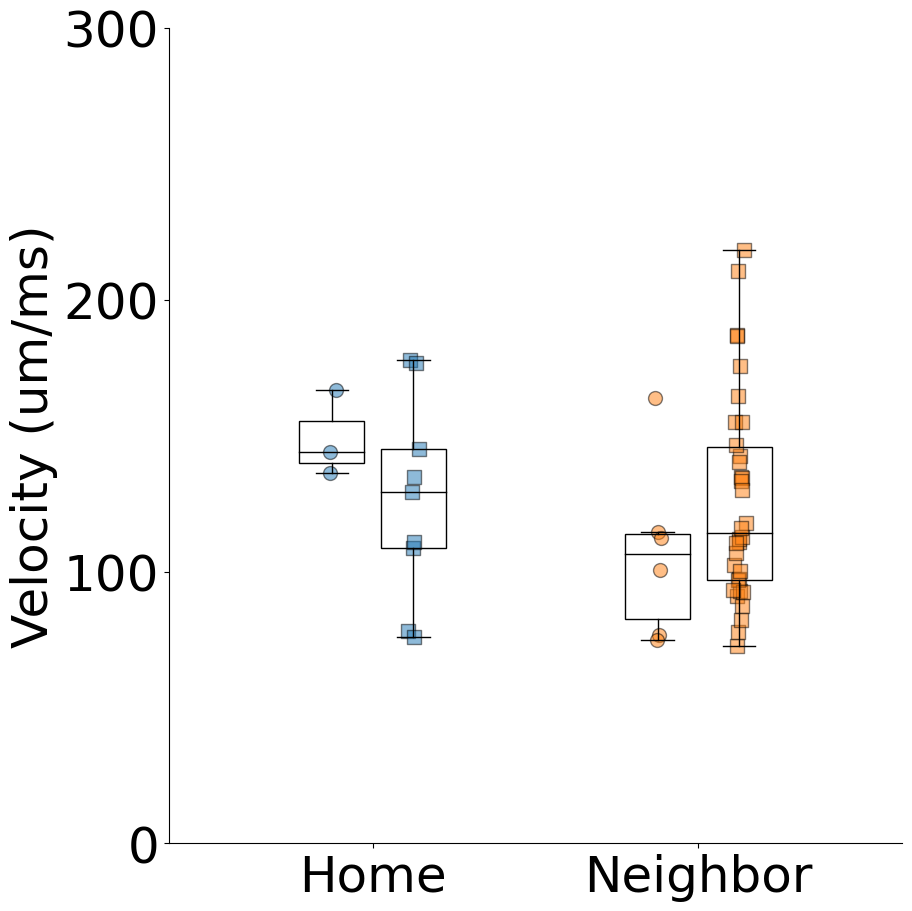

In [116]:
# using C:\Users\jjudge3\Desktop\Data\crossing_PPR\ladder_velocity_regimes.csv,
# plot the velocity distribution for each regime, taking instantaneous velocity from the ladder_df
ladder_regimes_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/ladder_velocity_regimes.csv'
ladder_regimes_df = pd.read_csv(ladder_regimes_data)
# ladder regimes has columns: Date, Slice, Location, Recording, velocity_regime_start, velocity_regime_end, velocity_regime_type

# set fontsize
plt.rcParams.update({'font.size': 36})

regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
    # get the corresponding subset in ladder_df, for drug == 'ACSF'
    ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                            (ladder_df['Slice'] == slic) & 
                            (ladder_df['Location'] == loc) & 
                            (ladder_df['Recording'] == rec) & 
                            (ladder_df['drug'] == 'ACSF')]

    # exclude if Stim_Distance < 50 um
    ladder_row = ladder_row[ladder_row['Stim_Distance'] > 100]
    
    if ladder_row.empty:
        continue

    # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
    # get the instantaneous velocity for this range

    start = row['velocity_regime_start']
    end = row['velocity_regime_end']

    regime_type = row['velocity_regime_type']

    # get the instantaneous velocity for this range
    regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                            (ladder_row['Dist_from_home_barrel'] <= end)]

    #print(regime_df['instantaneous_velocity'])

    if regime_df.empty:
        continue
    layer = regime_df['Layer'].values[0]
    #print(layer)

    if regime_type not in regime_velocities:
        regime_velocities[regime_type] = {}
    if layer not in regime_velocities[regime_type]:
        regime_velocities[regime_type][layer] = []
    
    # filter outliers > 700 um/ms and -700 um/ms
    regime_df = regime_df[(regime_df['instantaneous_velocity'] < 1000) & (regime_df['instantaneous_velocity'] > -1000)]
    # filter outliers < 60 um/ms
    regime_df = regime_df[(regime_df['instantaneous_velocity'] > 60) | (regime_df['instantaneous_velocity'] < -60)]
    #if regime_type == 'septal':
    #    print(regime_df[['instantaneous_velocity', 'Date', 'Dist_from_home_barrel']])
    avg_vel = np.mean(np.abs(regime_df['instantaneous_velocity']))

    # outliers 
    if (avg_vel < 250 and avg_vel > 60):
        regime_velocities[regime_type][layer].append(avg_vel)
    

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

for j, layer in enumerate(['L2/3', 'L4']):
    regimes = []
    for i, regime_type in enumerate(['home', 'neighbor']): #, 'septal']):
        velocities = regime_velocities[regime_type][layer]
        # boxplot for each regime. transparent box, black outline, no outliers
        ax.boxplot(velocities, positions=[i + j * 0.25 - 0.125], widths=0.2, patch_artist=True, 
                    boxprops=dict(facecolor='none', color='black'), 
                    showfliers=False, medianprops=dict(color='black'))

        x_jitter = np.random.normal(0, 0.01, len(velocities))
        ax.scatter(x_jitter + i + j * 0.25 - 0.125, velocities,
                     alpha=0.5, color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                     edgecolors='black', s=100, marker=('o' if layer == 'L2/3' else 's'), label=layer)
        regimes.append(regime_type)

# significance testing between regimes
for i_ in range(len(regimes)):
    for j_ in range(i_ + 1, len(regimes)):
        regime1 = regime_velocities[regimes[i_]]['L2/3'] + regime_velocities[regimes[i_]]['L4']
        regime2 = regime_velocities[regimes[j_]]['L2/3'] + regime_velocities[regimes[j_]]['L4']
        t_stat, p_val = ttest_ind(regime1, regime2, equal_var=False)
        print(f"t-test between {regimes[i_]} and {regimes[j_]}: t = {t_stat}, p = {p_val}")
        # print mean and sem for each regime
        print(f"{regimes[i_]}: {np.mean(regime1)}, {sem(regime1)}")
        print(f"{regimes[j_]}: {np.mean(regime2)}, {sem(regime2)}")
        if 'home' in [regimes[i_], regimes[j_]] and 'septal' in [regimes[i_], regimes[j_]]:
            continue  # don't show significance testing between home and septal
        if p_val < 0.05:
            ax.text((i_ + j_) / 2, max(max(regime1), max(regime2)) + 12, 'p < 0.05', ha='center')

            # draw line between the two boxes
            ax.plot([i_, j_], [max(max(regime1), max(regime2)) + 10.5, max(max(regime1), max(regime2)) + 10.5], color='black')
        
ax.set_xticks(range(len(regimes)))
ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Velocity (um/ms)')

ax.set_ylim(0, 300)
ax.set_yticks([0, 100, 200, 300])

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
handles = [ax.get_children()[0], ax.get_children()[3]]
#ax.legend(handles=handles, labels=['L2/3', 'L4'], loc='upper right')
plt.tight_layout()
plt.savefig('P:/John/crossing-paper/input/ladder_velocity_regimes.png')


No data found for pulse 2  6/26/2024 1 1 1
No data found for pulse 2  6/26/2024 1 1 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 4 1 1
No data found for pulse 2  7/1/2024 4 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/11/2024 2 1 1
No data found for pulse 2  12/11/2024 2 1 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  10/23/2024 1 2 3
No data found for pulse 2  10/23/2024 1 2 3
No data f

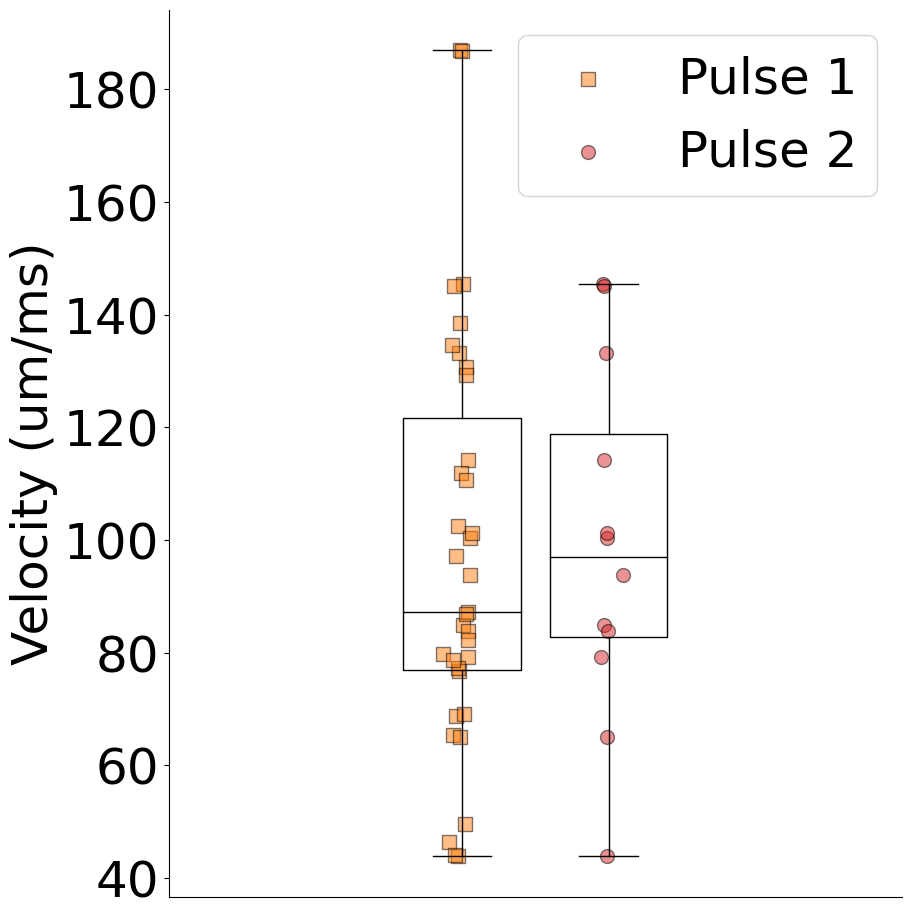

In [117]:
# compare pulse 2 half-widths and velocities (Is_Pulse_2 == True) to pulse 1 (all other)
# all in ladder_df
# piggybacking off the ladder velocity regimes created for the first pulse

# for all values of Is_Pulse_2 that are not True (such as nan), set to False
ladder_df['Is_Pulse_2'] = ladder_df['Is_Pulse_2'].fillna(False)

ladder_regimes_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/ladder_velocity_regimes.csv'
ladder_regimes_df = pd.read_csv(ladder_regimes_data)
# ladder regimes has columns: Date, Slice, Location, Recording, velocity_regime_start, velocity_regime_end, velocity_regime_type

# set fontsize
plt.rcParams.update({'font.size': 36})

regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    for pulse in [True, False]:
        
        date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
        # get the corresponding subset in ladder_df, for drug == 'ACSF'
        ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Location'] == loc) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['drug'] == 'ACSF') &
                                (ladder_df['Layer'] == 'L4') &
                                (ladder_df['Is_Pulse_2'] == pulse)]

        # exclude if Stim_Distance < 50 um
        ladder_row = ladder_row[ladder_row['Stim_Distance'] > 50]
        
        if ladder_row.empty:
            if pulse:
                print('No data found for pulse 2 ', date, slic, loc, rec)
            continue

        # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
        # get the instantaneous velocity for this range

        start = row['velocity_regime_start']
        end = row['velocity_regime_end']

        regime_type = row['velocity_regime_type']

        # get the instantaneous velocity for this range
        regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                                (ladder_row['Dist_from_home_barrel'] <= end)]

        #print(regime_df['instantaneous_velocity'])

        if regime_df.empty:
            continue

        if regime_type not in regime_velocities:
            regime_velocities[regime_type] = {}
        if pulse not in regime_velocities[regime_type]:
            regime_velocities[regime_type][pulse] = []
        
        # filter outliers > 700 um/ms and -700 um/ms
        #regime_df = regime_df[(regime_df['instantaneous_velocity'] < 700) & (regime_df['instantaneous_velocity'] > -700)]
        #if regime_type == 'septal':
        #    print(regime_df[['instantaneous_velocity', 'Date', 'Dist_from_home_barrel']])
        avg_vel = np.mean(np.abs(regime_df['instantaneous_velocity']))

        # outliers
        if avg_vel < 300 and avg_vel > 40:
            regime_velocities[regime_type][pulse].append(avg_vel)
    
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

for j, pulse_number in enumerate(['Pulse 1', 'Pulse 2']):
    pulse = (pulse_number == 'Pulse 2')

    regimes = []
    for i, regime_type in enumerate([ 'neighbor']): #, 'septal']):
        velocities = regime_velocities[regime_type][pulse]
        # boxplot for each regime. transparent box, black outline, no outliers
        ax.boxplot(velocities, positions=[i + j * 0.25 - 0.125], widths=0.2, patch_artist=True, 
                    boxprops=dict(facecolor='none', color='black'), 
                    showfliers=False, medianprops=dict(color='black'))

        x_jitter = np.random.normal(0, 0.01, len(velocities))
        ax.scatter(x_jitter + i + j * 0.25 - 0.125, velocities,
                     alpha=0.5, color=('tab:red' if pulse else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                     edgecolors='black', s=100, marker=('o' if pulse else 's'), label=pulse_number)
        regimes.append(regime_type)

# significance testing between pulse 1 and pulse 2
for reg in ['neighbor']:
    regime1 = regime_velocities[reg][True]
    regime2 = regime_velocities[reg][False]
    t_stat, p_val = ttest_ind(regime1, regime2, equal_var=False)
    print("mean pulse 1:", np.mean(regime1), "±", sem(regime1))
    print("mean pulse 2:", np.mean(regime2), "±", sem(regime2))
    print(f"t-test between  pulse 2 and  pulse 1: t = {t_stat}, p = {p_val}")

    if p_val < 0.05:
        ax.text((i_ + j_) / 2, max(max(regime1), max(regime2)) + 12, 'p < 0.05', ha='center')

        # draw line between the two boxes
        ax.plot([i_, j_], [max(max(regime1), max(regime2)) + 10.5, max(max(regime1), max(regime2)) + 10.5], color='black')
        
#ax.set_xticks(range(len(regimes)))
#ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Velocity (um/ms)')
ax.set_xticks([])
#ax.set_ylim(0, 300)

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
handles = [ax.get_children()[0], ax.get_children()[1]]
labels = [ax.get_children()[0].get_label(), ax.get_children()[1].get_label()]
ax.legend(handles=handles, labels=labels, loc='upper right')
plt.tight_layout()
plt.savefig('P:/John/crossing-paper/input/ladder_velocity_regimes_pulse2.png')


In [118]:
print(ladder_df.columns)

Index(['ROI', 'amp', 'snr', 'latency', 'halfwidth', 'Stim_Distance',
       'X_Center', 'Y_Center', 'ROI_Set', 'Date', 'Slice', 'Location',
       'Recording', 'trace', 'drug', 'Layer', 'Coronal/Sagittal', 'IPI',
       'Is_Pulse_2', 'Dist_from_home_barrel', 'resides_in_barrel',
       'instantaneous_velocity', 'ROI file', 'Medial/Lateral'],
      dtype='object')


No data found for pulse 2  6/26/2024 1 1 1
No data found for pulse 2  6/26/2024 1 1 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 4 1 1
No data found for pulse 2  7/1/2024 4 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/11/2024 2 1 1
No data found for pulse 2  12/11/2024 2 1 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  10/23/2024 1 2 3
No data found for pulse 2  10/23/2024 1 2 3
No data f

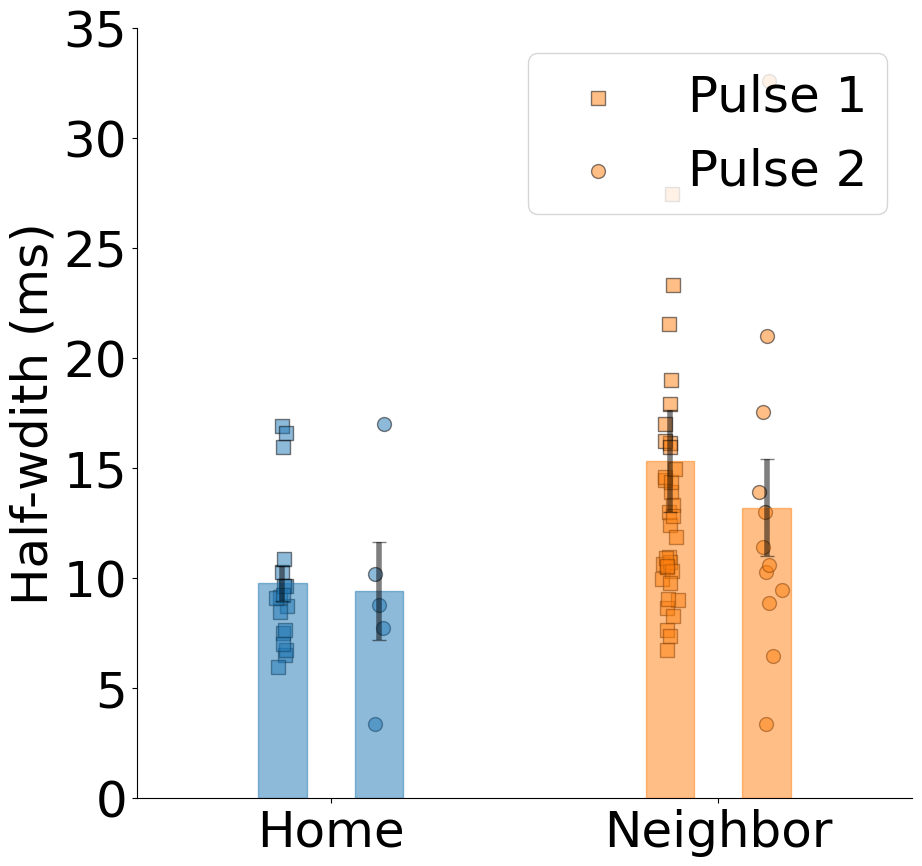

In [119]:
# plot pulse 1 halfwidth versus pulse 2 halfwidth

# set fontsize
plt.rcParams.update({'font.size': 36})

regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    for pulse in [True, False]:
        
        date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
        # get the corresponding subset in ladder_df, for drug == 'ACSF'
        ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Location'] == loc) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['drug'] == 'ACSF') &
                                (ladder_df['Layer'] == 'L4') &
                                (ladder_df['Is_Pulse_2'] == pulse)]

        # exclude if Stim_Distance < 50 um
        ladder_row = ladder_row[ladder_row['Stim_Distance'] > 50]
        
        if ladder_row.empty:
            if pulse:
                print('No data found for pulse 2 ', date, slic, loc, rec)
            continue

        # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
        # get the instantaneous velocity for this range

        start = row['velocity_regime_start']
        end = row['velocity_regime_end']

        regime_type = row['velocity_regime_type']

        # get the instantaneous velocity for this range
        regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                                (ladder_row['Dist_from_home_barrel'] <= end)]

        #print(regime_df['instantaneous_velocity'])

        if regime_df.empty:
            continue

        if regime_type not in regime_velocities:
            regime_velocities[regime_type] = {}
        if pulse not in regime_velocities[regime_type]:
            regime_velocities[regime_type][pulse] = []
        
        # filter outliers > 700 um/ms and -700 um/ms
        #regime_df = regime_df[(regime_df['instantaneous_velocity'] < 700) & (regime_df['instantaneous_velocity'] > -700)]
        #if regime_type == 'septal':
        #    print(regime_df[['instantaneous_velocity', 'Date', 'Dist_from_home_barrel']])
        avg_vel = np.mean(np.abs(regime_df['halfwidth']))

        # outliers
        if avg_vel > 0:
            regime_velocities[regime_type][pulse].append(avg_vel)
    
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
print(regime_velocities)
for j, pulse_number in enumerate(['Pulse 1', 'Pulse 2']):
    pulse = (pulse_number == 'Pulse 2')

    regimes = []
    for i, regime_type in enumerate(['home', 'neighbor']): #, 'septal']):
        velocities = regime_velocities[regime_type][pulse]
        # boxplot for each regime. transparent box, black outline, no outliers
        # bar plot with error bars. caps on error bars, and color the error bars the same as the bar color
        ax.bar(i + j * 0.25 - 0.125, 
                np.mean(velocities), 
                width=.125,
                color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                edgecolor=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'), alpha=0.5)
        ax.errorbar(i + j * 0.25 - 0.125,
                    np.mean(velocities), 
                    yerr=sem(velocities), 
                    color='black', #('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'), 
                    capsize=5, elinewidth=4, alpha=0.5)

        x_jitter = np.random.normal(0, 0.01, len(velocities))
        
        ax.scatter(x_jitter + i + j * 0.25 - 0.125, velocities,
                     alpha=0.5, color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                     edgecolors='black', s=100, marker=('o' if pulse else 's'), label=pulse_number)
        regimes.append(regime_type)

# significance testing between pulse 1 and pulse 2
for reg in ['home', 'neighbor']:
    regime1 = regime_velocities[reg][True]
    regime2 = regime_velocities[reg][False]
    t_stat, p_val = ttest_ind(regime1, regime2, equal_var=False)
    pulse = 'Pulse 2' if pulse else 'Pulse 1'
    print(f"t-test {reg} between Pulse 1 and Pulse2 for {pulse}: t = {t_stat}, p = {p_val}")
    
    if p_val < 0.05:
        height = 30
        i_, j_ = 0, 1
        #ax.text((i_ + j_) / 2, height + 2, 'p < 0.05', ha='center')
        #ax.plot([i_, j_], [height, height], color='black')
        
ax.set_xticks(range(len(regimes)))
ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Half-wdith (ms)')

ax.set_xlim(-0.5, 1.5)

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
#handles = ax.get_children()
handles =ax.get_children()
handles = [handles[3], handles[7]]  # only first two bars
ax.legend(handles=handles, labels=['Pulse 1', 'Pulse 2'], loc='upper right')
ax.set_ylim(0, 35)

plt.savefig('P:/John/crossing-paper/input/ladder_halfwidth_regimes_pulse2.png')
plt.show()


In [120]:
ladder_df.columns

Index(['ROI', 'amp', 'snr', 'latency', 'halfwidth', 'Stim_Distance',
       'X_Center', 'Y_Center', 'ROI_Set', 'Date', 'Slice', 'Location',
       'Recording', 'trace', 'drug', 'Layer', 'Coronal/Sagittal', 'IPI',
       'Is_Pulse_2', 'Dist_from_home_barrel', 'resides_in_barrel',
       'instantaneous_velocity', 'ROI file', 'Medial/Lateral'],
      dtype='object')

In [121]:
import statsmodels.formula.api as smf
# mixed effects model with distance from home barrel as a fixed effect
# and Date, Slice, Location, Recording as random effects
# Dependent variable: halfwidth
# Independent variable: Dist_from_home_barrel

data = ladder_df[(ladder_df['Is_Pulse_2'] == True) &
                    (ladder_df['Layer'] == 'L4') & 
                    (ladder_df['drug'] == 'ACSF') & 
                    (ladder_df['Stim_Distance'] > 200) & 
                    #(ladder_df['Dist_from_home_barrel'] > 0) &
                    (ladder_df['halfwidth'] > 0) 
                    ]
#data.loc['Dist_from_home_barrel'] = np.abs(data['Dist_from_home_barrel']).astype(float)
data['Date_Slice'] = data['Date'] + '_' + data['Slice'].astype(str)
print(len(data))
model = smf.mixedlm('halfwidth ~ Stim_Distance',
                    data=data,
                    groups=data['Date_Slice'])
results = model.fit()

# Print the results
print(results.summary())

2203
         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: halfwidth 
No. Observations: 2203    Method:             REML      
No. Groups:       26      Scale:              55.7678   
Min. group size:  9       Log-Likelihood:     -7596.7076
Max. group size:  172     Converged:          Yes       
Mean group size:  84.7                                  
--------------------------------------------------------
              Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------
Intercept     18.236    1.194 15.270 0.000 15.895 20.576
Stim_Distance -0.020    0.003 -5.820 0.000 -0.027 -0.013
Group Var     14.214    0.581                           



C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\720100097.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Date_Slice'] = data['Date'] + '_' + data['Slice'].astype(str)


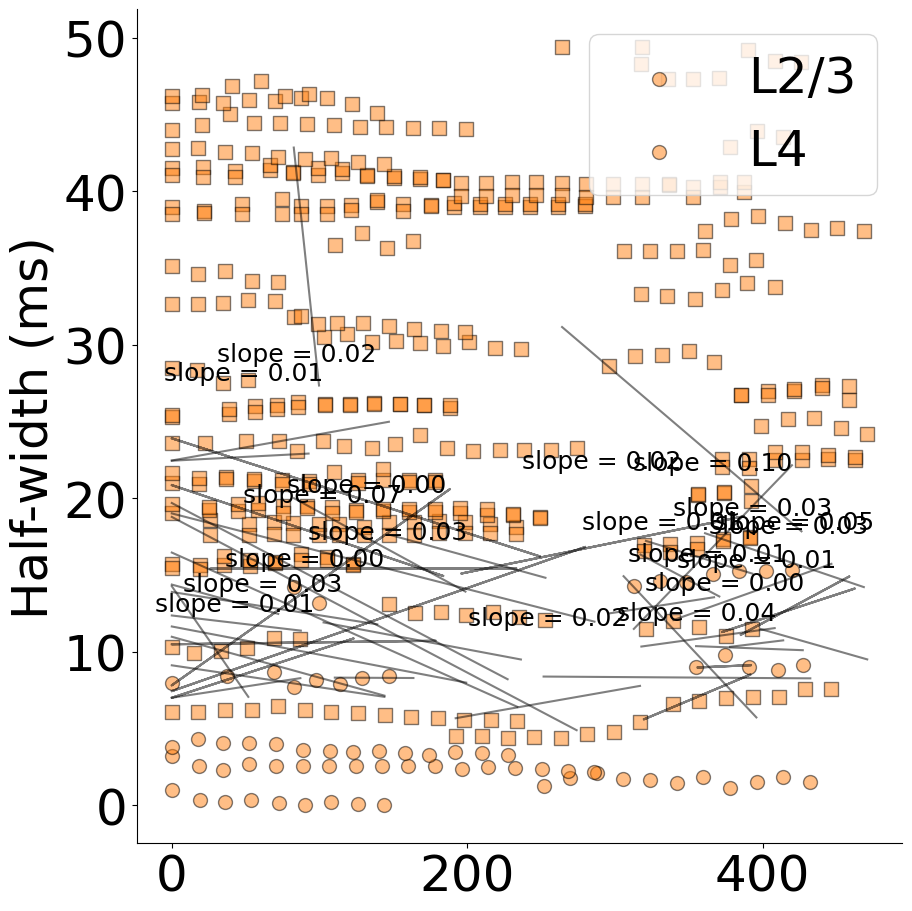

In [122]:
# using C:\Users\jjudge3\Desktop\Data\crossing_PPR\ladder_velocity_regimes.csv,
# plot halfwidth versus distance from home barrel for neighbor regime
ladder_regimes_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/ladder_velocity_regimes.csv'
ladder_regimes_df = pd.read_csv(ladder_regimes_data)
# ladder regimes has columns: Date, Slice, Location, Recording, velocity_regime_start, velocity_regime_end, velocity_regime_type

# set fontsize
plt.rcParams.update({'font.size': 36})
baseline = 0
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
    # get the corresponding subset in ladder_df, for drug == 'ACSF'
    ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                            (ladder_df['Slice'] == slic) & 
                            (ladder_df['Location'] == loc) & 
                            (ladder_df['Recording'] == rec) & 
                            (ladder_df['drug'] == 'ACSF')]

    # exclude if Stim_Distance < 50 um
    ladder_row = ladder_row[ladder_row['Stim_Distance'] > 100]
    
    if ladder_row.empty:
        continue

    # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
    # get the instantaneous velocity for this range

    start = row['velocity_regime_start']
    end = row['velocity_regime_end']

    regime_type = row['velocity_regime_type']
    if regime_type != 'neighbor':
        continue

    # get the instantaneous velocity for this range
    regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                            (ladder_row['Dist_from_home_barrel'] <= end)]

    #print(regime_df['instantaneous_velocity'])

    if regime_df.empty:
        continue
    layer = regime_df['Layer'].values[0]
    #print(layer)

    if regime_type not in regime_velocities:
        regime_velocities[regime_type] = {}
    if layer not in regime_velocities[regime_type]:
        regime_velocities[regime_type][layer] = []
    
    regime_df = regime_df[(regime_df['halfwidth'] > 0)]
    #if regime_type == 'septal':
    hw = np.abs(regime_df['halfwidth'])
    dist = np.abs(regime_df['Dist_from_home_barrel'])

    # linear fit to the data
    coeffs = np.polyfit(dist, hw, 1)
    y_fit = np.polyval(coeffs, dist)
    ax.plot(dist, y_fit, color='black', alpha=0.5)

    # label the slope if it is significant
    slope = coeffs[0]
    if slope > 0:
        ax.text(np.mean(dist), np.mean(hw) + 5, f'slope = {slope:.2f}', ha='center', fontsize=18)

    # normalize the halfwidths to 0-1
    hw = (hw - np.min(hw)) / (np.max(hw) - np.min(hw))
    # outliers
    #if avg_vel < 300 and avg_vel > 40:
    regime_velocities[regime_type][layer].append([hw, dist])
    ax.scatter(dist, hw + baseline, alpha=0.5, color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                edgecolors='black', s=100, marker=('o' if layer == 'L2/3' else 's'), label=layer)
    baseline += 1.1
    


        
#ax.set_xticks(range(len(regimes)))
#ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Half-width (ms)')

#ax.set_ylim(0, 30)

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
handles = [ax.get_children()[0], ax.get_children()[3]]
ax.legend(handles=handles, labels=['L2/3', 'L4'], loc='upper right')
plt.tight_layout()
plt.savefig('P:/John/crossing-paper/input/ladder_halfwidth_neighbor_regimes.png')


## 